In [400]:
from collections import defaultdict
import json
import pandas as pd
from pathlib import Path
import re
import vaex
from matplotlib import pyplot as plt
import seaborn as sns
from unidecode import unidecode

In [401]:
import gensim
from gensim import utils
from nltk.stem import PorterStemmer as porter_stemmer
from nltk.tokenize import sent_tokenize, word_tokenize
import numpy as np
import seaborn as sns
import json
from matplotlib import pyplot as plt

In [402]:
#Data Paths
root_path = Path.cwd().parents[0] 
data_dir = root_path / "2020-03-13"

Load the metadata

In [403]:
meta_df = pd.read_csv(data_dir / "all_sources_metadata_2020-03-13.csv")

In [404]:
meta_df.head()

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
0,c630ebcdf30652f0422c3ec12a00b50241dc9bd9,CZI,Angiotensin-converting enzyme 2 (ACE2) as a SA...,10.1007/s00134-020-05985-9,NaN,32125455.0,cc-by-nc,NaN,2020,"Zhang, Haibo; Penninger, Josef M.; Li, Yimin; ...",Intensive Care Med,2.002765e+09,#3252,True
1,53eccda7977a31e3d0f565c884da036b1e85438e,CZI,Comparative genetic analysis of the novel coro...,10.1038/s41421-020-0147-1,NaN,NaN,cc-by,NaN,2020,"Cao, Yanan; Li, Lin; Feng, Zhimin; Wan, Shengq...",Cell Discovery,3.003431e+09,#1861,True
2,210a892deb1c61577f6fba58505fd65356ce6636,CZI,Incubation Period and Other Epidemiological Ch...,10.3390/jcm9020538,NaN,NaN,cc-by,The geographic spread of 2019 novel coronaviru...,2020,"Linton, M. Natalie; Kobayashi, Tetsuro; Yang, ...",Journal of Clinical Medicine,3.006065e+09,#1043,True
3,e3b40cc8e0e137c416b4a2273a4dca94ae8178cc,CZI,Characteristics of and Public Health Responses...,10.3390/jcm9020575,NaN,32093211.0,cc-by,"In December 2019, cases of unidentified pneumo...",2020,"Deng, Sheng-Qun; Peng, Hong-Juan",J Clin Med,1.776631e+08,#1999,True
4,92c2c9839304b4f2bc1276d41b1aa885d8b364fd,CZI,Imaging changes in severe COVID-19 pneumonia,10.1007/s00134-020-05976-w,NaN,32125453.0,cc-by-nc,NaN,2020,"Zhang, Wei",Intensive Care Med,3.006643e+09,#3242,False


In [405]:
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29500 entries, 0 to 29499
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   sha                          17420 non-null  object 
 1   source_x                     29500 non-null  object 
 2   title                        29130 non-null  object 
 3   doi                          26357 non-null  object 
 4   pmcid                        27337 non-null  object 
 5   pubmed_id                    16730 non-null  float64
 6   license                      17692 non-null  object 
 7   abstract                     26553 non-null  object 
 8   publish_time                 18248 non-null  object 
 9   authors                      28554 non-null  object 
 10  journal                      17791 non-null  object 
 11  Microsoft Academic Paper ID  1134 non-null   float64
 12  WHO #Covidence               1236 non-null   object 
 13  has_full_text   

Not all papers have a title or abstract. Do all of them have at least one or the other?

In [406]:
meta_df[meta_df['title'].notnull() | meta_df['abstract'].notnull()].shape

(29130, 14)

No, looks like the limiting factor is the title

In [407]:
meta_df[meta_df['title'].isnull()]

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
18434,NaN,PMC,NaN,NaN,PMC6824915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23727,NaN,PMC,NaN,NaN,PMC2762764,20025201.0,CC BY,NaN,2009 Sep 9,NaN,PLoS Curr,NaN,NaN,NaN
23765,NaN,PMC,NaN,NaN,PMC2762335,20020673.0,CC BY,NaN,2009 Aug 21,NaN,PLoS Curr,NaN,NaN,NaN
25385,NaN,PMC,NaN,NaN,PMC2080411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25598,NaN,PMC,NaN,NaN,PMC1246105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29495,c42a617a00afe6a36bde0a8e3638e0f55bfee4f7,medrxiv,NaN,doi.org/10.1101/2020.03.08.20032847,NaN,NaN,See https://www.medrxiv.org/submit-a-manuscript,NaN,NaN,NaN,NaN,NaN,NaN,True
29496,c4ce14ce42fa4360dfe3515ec9d1584847381c27,medrxiv,NaN,doi.org/10.1101/2020.03.08.20032854,NaN,NaN,See https://www.medrxiv.org/submit-a-manuscript,NaN,NaN,NaN,NaN,NaN,NaN,True
29497,c41e09a32be90c84cea0616bb1c726aecba721e0,medrxiv,NaN,doi.org/10.1101/2020.03.09.20032219,NaN,NaN,See https://www.medrxiv.org/submit-a-manuscript,NaN,NaN,NaN,NaN,NaN,NaN,False
29498,ca88735399ff43d0e673876200655099f06f5567,medrxiv,NaN,doi.org/10.1101/2020.03.09.20033183,NaN,NaN,See https://www.medrxiv.org/submit-a-manuscript,NaN,NaN,NaN,NaN,NaN,NaN,True


Some of the papers without title seem to have full text. In our processing, we will filter out papers that have no textual fields, eg title, abstract, or full text

In [408]:
meta_df[meta_df['title'].isnull() & meta_df['abstract'].isnull() & meta_df['has_full_text'].isnull()]

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
18434,NaN,PMC,NaN,NaN,PMC6824915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23727,NaN,PMC,NaN,NaN,PMC2762764,20025201.0,CC BY,NaN,2009 Sep 9,NaN,PLoS Curr,NaN,NaN,NaN
23765,NaN,PMC,NaN,NaN,PMC2762335,20020673.0,CC BY,NaN,2009 Aug 21,NaN,PLoS Curr,NaN,NaN,NaN
25385,NaN,PMC,NaN,NaN,PMC2080411,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25598,NaN,PMC,NaN,NaN,PMC1246105,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25648,NaN,PMC,NaN,NaN,PMC1188130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26186,NaN,PMC,NaN,NaN,PMC404520,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26340,NaN,PMC,NaN,NaN,PMC286345,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26629,NaN,PMC,NaN,NaN,PMC1125910,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [409]:
meta_df.groupby('source_x').count()

,sha,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text
source_x,,,,,,,,,,,,,
CZI,167,1236,1177,0,404,172,848,1164,1191,1198,1134,1236,167
PMC,16326,27328,24253,27337,16326,16593,25139,16518,26797,16593,0,0,16326
biorxiv,566,566,566,0,0,566,566,566,566,0,0,0,566
medrxiv,361,0,361,0,0,361,0,0,0,0,0,0,361


In [410]:
all_jsons = list(data_dir.glob('**/*.json'))

In [411]:
len(all_jsons)

13202

There is metadata for 29500 entries, but 13202 json files.

In [412]:
all_jsons[0]

PosixPath('/Users/venkatar/CosmicDrive/Collaborations/CORID-19/2020-03-13/pmc_custom_license/pmc_custom_license/8f8eb4f004c2002face0723f2f58cc411954d36e.json')

In [413]:
data_sets = ["biorxiv_medrxiv", "comm_use_subset", "noncomm_use_subset", "pmc_custom_license"]
jsons = []
for d in data_sets:
    jsons.extend((data_dir / d).glob("**/*.json"))

In [414]:
jsons[0]

PosixPath('/Users/venkatar/CosmicDrive/Collaborations/CORID-19/2020-03-13/biorxiv_medrxiv/biorxiv_medrxiv/f905f78b32f63c6d14a79984dfb33f1b358b8ab4.json')

In [415]:
len(jsons)

13202

In [416]:
import os

section_data = []
for _json in jsons: 
    with open(_json, "r") as f:
        section_data.append(json.load(f))

In [417]:
section_data[0]['body_text'][0].keys()

dict_keys(['text', 'cite_spans', 'ref_spans', 'section'])

In [418]:
section_data[0].keys()

dict_keys(['paper_id', 'metadata', 'abstract', 'body_text', 'bib_entries', 'ref_entries', 'back_matter'])

### Obtain list of section headers

This is the basis for creating clusters of commonly occurring section names, and thus proceed to cluster their correponding section text.

In [419]:
section_headers = set()
for j in range(len(section_data)):
    body = section_data[j]['body_text']
#     abstracts.append(section_data[j]['abstract'])
    for i in range(len(body)):
        section_headers.add(body[i]['section'])

#### Draw a distribution to see how many paragraphs/sections/figures in each body text

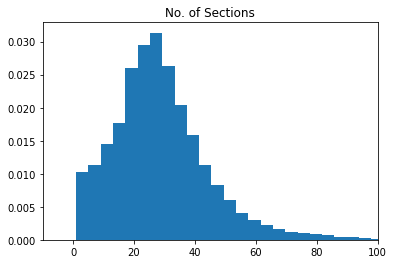

In [21]:
lengths = []
for j in range(len(section_data)):
    body = section_data[j]['body_text']
    lengths.append(len(body))
    
plt.hist(lengths, bins=500, density=True)
plt.xlim([-10,100])
plt.title("No. of Sections")
plt.show()

There are section headers pointing to tables, figures and some very random names. 

In [422]:
sec = []
sec_text = []
paper_id = []
for j in range(len(section_data)):
    body = section_data[j]['body_text']
    for i in range(len(body)):
        sec.append(body[i]['section'].lower())
        sec_text.append(body[i]['text'].lower())
        paper_id.append(section_data[j]['paper_id'])
    
    
df = pd.DataFrame({'paper_id': paper_id, '_section': sec, '_text': sec_text})

In [423]:
df.tail()

,paper_id,_section,_text
412263,fd82025c545a45eb4e5701d19effecf2388f613a,,subsequent spread into agriculture and human s...
412264,fd82025c545a45eb4e5701d19effecf2388f613a,,"in this study, we compared the genomes of cavv..."
412265,fd82025c545a45eb4e5701d19effecf2388f613a,,there was complete agreement between the two s...
412266,fd82025c545a45eb4e5701d19effecf2388f613a,,"furthermore, we evaluated the phylogenetic pos..."
412267,fd82025c545a45eb4e5701d19effecf2388f613a,,"next, we sought to establish species demarcati..."


In [424]:
df.to_csv('section_wise_papers.csv')

In [432]:
# nltk
import nltk
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk import WordNetLemmatizer
from nltk.tokenize import word_tokenize

"""
TOOLS
"""


def remove_numbers(input):
    """Remove numbers from input"""
    return re.sub(r"(^\d+\s+|\s+\d+\s+|\s+\d+$)", " ", input)


def remove_punctuations(input):
    """Remove punctuations from input"""
    return input.translate(str.maketrans("", "", '!"#$%&\'()*+./:;<=>?@,[\\]^`{|}~')) # all string punctuations except '_' and '-'

def remove_pharentesis(input):
    return re.sub(r"(\(|\)|\[|\])", " ", input)

def remove_diacritics(input):
    """Remove diacritics (as accent marks) from input"""
    return unidecode.unidecode(input)


def remove_white_space(input):
    """Remove all types of spaces from input"""
    input = input.replace(u"\xa0", u" ")  # remove space
    # remove white spaces, new lines and tabs
    return " ".join(input.split())



# Remove empty brackets (that could happen if the contents have been removed already
# e.g. for citation ( [3] [4] ) -> ( ) -> nothing
# https://github.com/jakelever/bio2vec/blob/master/PubMed2Txt.py
def removeBracketsWithoutWords(text):
    fixed = re.sub(r'\([\W\s]*\)', ' ', text)
    fixed = re.sub(r'\[[\W\s]*\]', ' ', fixed)
    fixed = re.sub(r'\{[\W\s]*\}', ' ', fixed)
    return fixed


def clean_text(text):
    #text = text.lower()
    
    text = removeBracketsWithoutWords(text)
    
#     text = removeWeirdBracketsFromOldTitles(text)
    
    text = remove_pharentesis(text)
    
    text = remove_punctuations(text) # powerful
    
    text = remove_numbers(text) # only in case SPACE NUM SPACE
    text = remove_punctuations(text)
#     text = remove_diacritics(text)
    text = remove_white_space(text)
    #tokens = remove_stop_words(text)  # return a list of token
    
    return text


In [434]:

df['_section'] = df['_section'].map(unidecode)
df['_section'] = df['_section'].apply(clean_text)
df['_text'] = df['_text'].map(unidecode)
df['_text'] = df['_text'].apply(clean_text)

In [435]:
df['_text'].tail()

412263    subsequent spread into agriculture and human s...
412264    in this study we compared the genomes of cavv ...
412265    there was complete agreement between the two s...
412266    furthermore we evaluated the phylogenetic posi...
412267    next we sought to establish species demarcatio...
Name: _text, dtype: object

### This section deals with hierarchical clustering the body text based on their section names

In [102]:
count = 0
for idx, row in enumerate(df['_section']):
    if 'RESULTS' in row.split(', '):
        count += 1
#     else:
#         print(row)
        
count

13485

In [48]:


sentences = list(df['_section'].values)
sentences_split = [s.split(', ') for s in sentences]

model = gensim.models.Word2Vec(sentences_split, min_count=100)

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

l = linkage(model.wv.syn0, method='complete', metric='seuclidean')

INFO:MainThread:gensim.models.word2vec:collecting all words and their counts
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #10000, processed 10308 words, keeping 1895 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #20000, processed 20566 words, keeping 3627 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #30000, processed 30927 words, keeping 5513 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #40000, processed 41336 words, keeping 8139 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #50000, processed 51710 words, keeping 10618 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #60000, processed 62017 words, keeping 13129 word types
INFO:MainThread:gensim.models.word2vec:PROGRESS: at sentence #70000, processed 72332 words, keeping 15431 word types
INF

INFO:MainThread:gensim.models.base_any2vec:training on a 2134610 raw words (221138 effective words) took 1.7s, 128990 effective words/s
/Users/venkatar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:14: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.vectors instead).
  


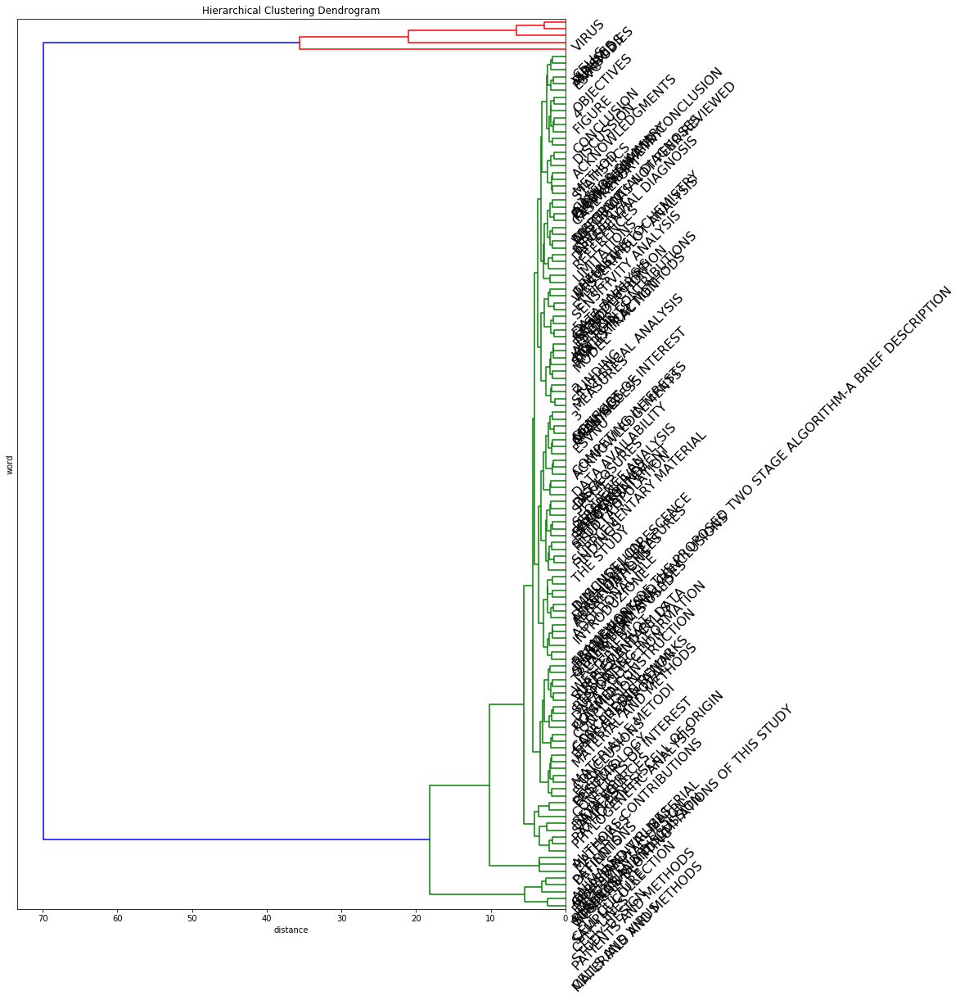

In [50]:


# calculate full dendrogram
plt.figure(figsize=(12, 20))
plt.title('Hierarchical Clustering Dendrogram')
plt.ylabel('word')
plt.xlabel('distance')

dendrogram(
    l,
    p= 5,
    leaf_rotation=45.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    orientation='left',
    leaf_label_func=lambda v: str(model.wv.index2word[v])
)
plt.show()

In [51]:
relations = [item for item in model.wv.most_similar('INTRODUCTION')]
relations
# conclusion = []
# with open('conclusion_relations.txt', 'w') as f:
#     for r in relations:
#         f.write(str(df[df['_section'] == r]['_text'].values))
        
# f.close()

INFO:MainThread:gensim.models.keyedvectors:precomputing L2-norms of word weight vectors


[('SAMPLE COLLECTION', 0.42614439129829407),
 ('PATIENTS', 0.4200057089328766),
 ('DATA ANALYSIS', 0.394889771938324),
 ('SUBJECTS', 0.39241287112236023),
 ('MICE', 0.3923141360282898),
 ('ANIMALS', 0.3915467858314514),
 ('MATERIALS AND METHODS', 0.3878035247325897),
 ('ANTIBODIES', 0.3863559663295746),
 ('MATERIALS', 0.3860289454460144),
 ('VIRUSES', 0.38557079434394836)]

In [52]:
from sklearn.decomposition import IncrementalPCA    # inital reduction
from sklearn.manifold import TSNE                   # final reduction
import numpy as np                                  # array handling


def reduce_dimensions(model):
    num_dimensions = 2  # final num dimensions (2D, 3D, etc)

    vectors = [] # positions in vector space
    labels = [] # keep track of words to label our data again later
    for word in model.wv.vocab:
        vectors.append(model.wv[word])
        labels.append(word)

    # convert both lists into numpy vectors for reduction
    vectors = np.asarray(vectors)
    labels = np.asarray(labels)

    # reduce using t-SNE
    vectors = np.asarray(vectors)
#     pca = IncrementalPCA(n_components=num_dimensions)
#     vectors = pca.fit_transform(vectors)
    tsne = TSNE(n_components=num_dimensions, random_state=0)
    vectors = tsne.fit_transform(vectors)

    x_vals = [v[0] for v in vectors]
    y_vals = [v[1] for v in vectors]
    return x_vals, y_vals, labels


x_vals, y_vals, labels = reduce_dimensions(model)

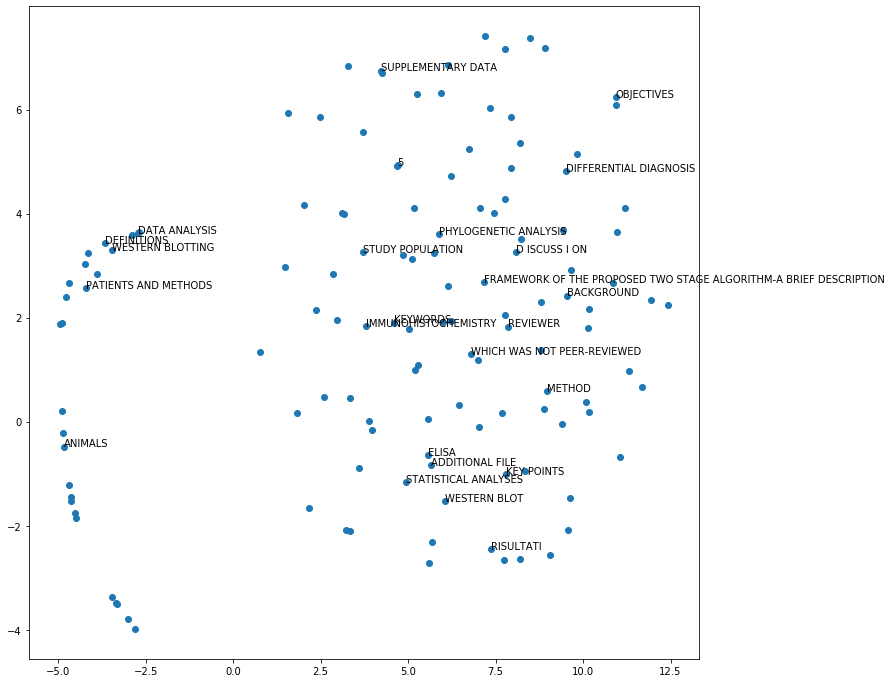

In [53]:
def plot_with_matplotlib(x_vals, y_vals, labels):
    import matplotlib.pyplot as plt
    import random

    random.seed(0)

    plt.figure(figsize=(12, 12))
    plt.scatter(x_vals, y_vals, )

    #
    # Label randomly subsampled 25 data points
    #
    indices = list(range(len(labels)))
    selected_indices = random.sample(indices, 25)
    for i in selected_indices:
        plt.annotate(labels[i], (x_vals[i], y_vals[i]) )
        
        
plot_with_matplotlib(x_vals, y_vals, labels)

Commonly occurring sections - introduction, conclusion, results, methods

# LDA Topic Modeling

## Section Name Topic Modeling

In [471]:
from nltk.corpus import stopwords

stops = set(stopwords.words("english"))

customize_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 'al.', 'Elsevier', 'PMC', 'CZI',
    '-PRON-'
]

stops.add(word for word in customize_stop_words)

# Define function to clean text
def pre_process_text(X):
    cleaned_X = []
    for raw_text in X:
            # Convert to lower case
        text = raw_text.lower()

        # Tokenize
        tokens = nltk.word_tokenize(text)

        # Keep only words (removes punctuation + numbers)
        token_words = [w for w in tokens if w.isalpha()]

        # Remove stop words
        meaningful_words = [w for w in token_words if not w in stops]
        
        cleaned_X.append(meaningful_words)
    return cleaned_X

In [472]:
df['_section'].dropna()

0                                                          
1                                                          
2                                                          
3                                                          
4         fab derived peptide inhibits in multimerizatio...
                                ...                        
412263                                                     
412264                                                     
412265                                                     
412266                                                     
412267                                                     
Name: _section, Length: 412268, dtype: object

In [473]:
# Clean text
raw_text = list(df['_section'])
processed_text = pre_process_text(raw_text)

In [474]:
dictionary = gensim.corpora.Dictionary(processed_text)
corpus = [dictionary.doc2bow(text) for text in processed_text]
model = gensim.models.LdaModel(corpus=corpus, 
                               id2word=dictionary,
                               num_topics=50,
                               passes=10)

INFO:MainThread:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:MainThread:gensim.corpora.dictionary:adding document #10000 to Dictionary(2240 unique tokens: ['activity', 'derived', 'fab', 'inhibits', 'multimerization']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #20000 to Dictionary(3533 unique tokens: ['activity', 'derived', 'fab', 'inhibits', 'multimerization']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #30000 to Dictionary(4676 unique tokens: ['activity', 'derived', 'fab', 'inhibits', 'multimerization']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #40000 to Dictionary(6045 unique tokens: ['activity', 'derived', 'fab', 'inhibits', 'multimerization']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #50000 to Dictionary(7144 unique tokens: ['activity', 'derived', 'fab', 'inhibits', 'multimerization']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #60000 to Dictionary(

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.070*"moreover" + 0.070*"may" + 0.070*"factors" + 0.070*"study" + 0.070*"address" + 0.070*"ameliorate" + 0.070*"stress" + 0.070*"aggravate" + 0.035*"quantum" + 0.035*"recent"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.038*"ubiquitination" + 0.024*"proteins" + 0.024*"force" + 0.024*"improves" + 0.024*"second" + 0.024*"activities" + 0.024*"analysis" + 0.024*"preferential" + 0.024*"chikv" + 0.024*"varying"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.035*"stretch" + 0.035*"sox" + 0.035*"seasonal" + 0.035*"potential" + 0.035*"could" + 0.035*"cov" + 0.035*"observations" + 0.035*"affect" + 0.035*"immune" + 0.035*"calculations"
INFO:MainThread:gensim.models.ldamodel:topic diff=48.334518, rho=1.000000
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #4000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.258*"health" + 0.202*"set" + 0.107*"affinity" + 0.093*"analysis" + 0.085*"specification" + 0.038*"facility" + 0.035*"training" + 0.015*"differential" + 0.013*"care" + 0.006*"data"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.665*"binding" + 0.077*"residues" + 0.008*"signaling" + 0.006*"associated" + 0.004*"sites" + 0.003*"ciliomes" + 0.003*"diverse" + 0.003*"comparison" + 0.003*"evolutionarily" + 0.003*"severity"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.584*"china" + 0.244*"spread" + 0.012*"since" + 0.008*"official" + 0.006*"receptor" + 0.001*"quickly" + 0.001*"arbs" + 0.001*"first" + 0.001*"announcement" + 0.001*"blockers"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.930*"model" + 0.023*"derived" + 0.003*"specification" + 0.000*"epidemic" + 0.000*"human" + 0.000*"enkur" + 0.000*"japan" + 0.000*"differential" + 0.000*"inhibits" + 0.000*"fab"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.431*"human" + 0.279*"g" + 0.126*"mutation" + 0.062*"implications" + 0.033*"ctd" + 0.001*"affects" + 0.000*"n" + 0.000*"specification" + 0.000*"axis" + 0.000*"enkur"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.307*"health" + 0.246*"set" + 0.119*"training" + 0.029*"affinity" + 0.025*"analysis" + 0.023*"specification" + 0.010*"facility" + 0.004*"differential" + 0.004*"care" + 0.002*"data"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.133989, rho=0.288675
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #26000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.669*"infection" + 0.121*"interactions" + 0.113*"population" + 0.042*"activities" + 0.000*"disease" + 0.000*"force" + 0.000*"analysis" + 0.000*"proteins" + 0.000*"ubiquitination" + 0.000*"secondary"
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.573*"mice" + 0.102*"agents" + 0.077*"iii" + 0.040*"observations" + 0.039*"cov" + 0.036*"female" + 0.004*"altered" + 0.000*"interaction" + 0.000*"preferential" + 0.000*"coefficient"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.481*"ifn" + 0.167*"states" + 0.074*"neurons" + 0.005*"calculations" + 0.004*"embryonic" + 0.003*"plane" + 0.001*"identification" + 0.000*"recent" + 0.000*"results" + 0.000*"quantum"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.340*"epidemic" + 0.160*"target" + 0.151*"mers" + 0.077*"death" + 0.074*"cleavage" + 0.026*"index" + 0.018*"shows" + 0.014*"spike" + 0.000*"progress" + 0.000*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.644*"assay" + 0.120*"among" + 0.110*"studies" + 0.023*"mobility" + 0.017*"shift" + 0.012*"electrophoretic" + 0.009*"previous" + 0.000*"emsa" + 0.000*"using" + 0.000*"patients"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.09235

INFO:MainThread:gensim.models.ldamodel:topic diff=0.124658, rho=0.208514
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #48000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.408*"characteristics" + 0.147*"parameters" + 0.143*"liver" + 0.109*"exposure" + 0.033*"baseline" + 0.002*"abnormal" + 0.001*"patients" + 0.000*"relations" + 0.000*"epidemic" + 0.000*"immune"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.424*"disease" + 0.144*"systemic" + 0.121*"based" + 0.119*"chikv" + 0.041*"infectivity" + 0.029*"correlates" + 0.005*"substrate" + 0.003*"replication" + 0.003*"representative" + 0.002*"absence"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.481*"statistical" + 0.361*"analysis" + 0.057*"rate" + 0.030*"mortality" + 0.011*"inference" + 0.010*"fitting" + 0.000*"substitutions" + 0.000*"model" + 0.000*"results" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.827*"clinical" + 0.057*"correlation" + 0.000*"individual" + 0.000*"antibody" + 0.000*"virus" + 0.000*"response" + 0.000*"analysis" + 0.000*"courses" + 0.000*"stress" + 0.000*"accumulation"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.364*"fig" + 0.197*"mutant" + 0.161*"size" + 0.016*"varying" + 0.014*"admission" + 0.005*"linkage" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"proteins"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.077835, rho=0.185695
INFO:MainThread:gensim.models.ldamodel:-60.410 per-word bound, 1532034380659696640.0 perplexity estimate based on a held-out corpus of 2000 documents with 5247 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #60000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.380*"disease" + 0.147*"based" 

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.302*"c" + 0.288*"dna" + 0.237*"sequence" + 0.057*"f" + 0.044*"alignment" + 0.001*"occurs" + 0.001*"diagram" + 0.000*"analysis" + 0.000*"protein" + 0.000*"rna"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.475*"proteins" + 0.217*"selection" + 0.122*"strains" + 0.060*"database" + 0.031*"localization" + 0.018*"random" + 0.010*"screen" + 0.000*"immune" + 0.000*"updated" + 0.000*"ciliary"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.792*"clinical" + 0.068*"correlation" + 0.000*"individual" + 0.000*"antibody" + 0.000*"virus" + 0.000*"response" + 0.000*"analysis" + 0.000*"courses" + 0.000*"stress" + 0.000*"accumulation"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.467*"results" + 0.331*"methods" + 0.109*"materials" + 0.054*"information" + 0.027*"phylogenetic" + 0.000*"analysis" + 0.000*"quantum" + 0.000*"vsd" + 0.000*"calculations" + 0.000*"recent"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.523*"assay" + 0.185*"studies" + 0.105*"mobility" + 0.093*"among" + 0.031*"previous" + 0.005*"shift" + 0.004*"emsa" + 0.001*"electrophoretic" + 0.000*"using" + 0.000*"patients"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.611*"health" + 0.101*"care" + 0.064*"set" + 0.056*"training" + 0.026*"affinity" + 0.003*"facility" + 0.000*"analysis" + 0.000*"specification" + 0.000*"differential" + 0.000*"data"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.053464, rho=0.158114
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #82000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.909*"expression" + 0.019*"linked" + 0.006*"identifies" + 0.000*"since" + 0.000*"disease" + 0.000*"infection" + 0.000*"representative" + 0.000*"proteins" + 0.000*"signaling" + 0.000*"probabilities"
INF

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.466*"health" + 0.238*"care" + 0.055*"training" + 0.047*"set" + 0.027*"affinity" + 0.025*"facility" + 0.000*"analysis" + 0.000*"specification" + 0.000*"differential" + 0.000*"data"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.740*"infection" + 0.122*"population" + 0.077*"interactions" + 0.018*"activities" + 0.000*"force" + 0.000*"disease" + 0.000*"proteins" + 0.000*"analysis" + 0.000*"ubiquitination" + 0.000*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.807*"data" + 0.071*"lung" + 0.042*"library" + 0.022*"short" + 0.003*"term" + 0.000*"analysis" + 0.000*"preparation" + 0.000*"imaging" + 0.000*"progress" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.290*"fig" + 0.283*"size" + 0.170*"mutant" + 0.005*"admission" + 0.002*"linkage" + 0.001*"varying" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"proteins"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.342*"identification" + 0.206*"production" + 0.133*"determination" + 0.074*"species" + 0.058*"ros" + 0.038*"reactive" + 0.036*"mass" + 0.025*"oxygen" + 0.022*"spectrometry" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.061754, rho=0.140028
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #104000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.711*"infection" + 0.131*"population" + 0.064*"interactions" + 0.050*"activities" + 0.000*"force" + 0.000*"disease" + 0.000*"proteins" + 0.000*"analysis" + 0.000*"ubiquitination" + 0.000*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.296*"cellular" + 0.230*"levels" + 0.104*"particles" + 0.098*"rescue" + 0.068*"forecasting" + 0.026*"homologous" + 0.025*"severity" + 0.016*"situation" + 0.015*"influences

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.328*"preparation" + 0.194*"antibody" + 0.102*"quality" + 0.063*"labeling" + 0.053*"individual" + 0.052*"standard" + 0.035*"shedding" + 0.028*"end" + 0.022*"report" + 0.021*"explain"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.700*"infection" + 0.121*"interactions" + 0.114*"population" + 0.023*"activities" + 0.000*"force" + 0.000*"disease" + 0.000*"proteins" + 0.000*"analysis" + 0.000*"ubiquitination" + 0.000*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.831*"protein" + 0.065*"differentially" + 0.015*"unfolded" + 0.000*"analysis" + 0.000*"structural" + 0.000*"reveals" + 0.000*"rna" + 0.000*"response" + 0.000*"stress" + 0.000*"interactome"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.065442, rho=0.132453
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #116000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #126000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.215*"cases" + 0.184*"domain" + 0.161*"amino" + 0.145*"tissues" + 0.082*"two" + 0.029*"proof" + 0.015*"recent" + 0.010*"significant" + 0.008*"calculations" + 0.008*"substitutions"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.585*"gene" + 0.290*"recombination" + 0.000*"frequently" + 0.000*"model" + 0.000*"c" + 0.000*"human" + 0.000*"results" + 0.000*"calculations" + 0.000*"applying" + 0.000*"specification"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.316*"characteristics" + 0.222*"exposure" + 0.168*"liver" + 0.162*"parameters" + 0.012*"baseline" + 0.008*"abnormal" + 0.000*"patients" + 0.000*"relations" + 0.000*"epidemic" + 0.000*"immune"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.905*"expressio

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.958*"analysis" + 0.005*"reveals" + 0.000*"localization" + 0.000*"establishing" + 0.000*"random" + 0.000*"delays" + 0.000*"rna" + 0.000*"ground" + 0.000*"truth" + 0.000*"sirius"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.632*"virus" + 0.110*"b" + 0.081*"activation" + 0.075*"e" + 0.071*"case" + 0.000*"corona" + 0.000*"n" + 0.000*"zika" + 0.000*"analysis" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.045352, rho=0.121268
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #138000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.277*"mutant" + 0.264*"fig" + 0.201*"size" + 0.068*"linkage" + 0.014*"varying" + 0.000*"admission" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"proteins"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.297*"patients" + 0.165*"laboratory" + 0.159*"acid" + 0.125*"test" + 0.120*"changes" + 0.048*"nucleic" + 0.000*"associated" + 0.000*"level" + 0.000*"results" + 0.000*"closely"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.859*"protein" + 0.056*"differentially" + 0.002*"unfolded" + 0.000*"analysis" + 0.000*"structural" + 0.000*"reveals" + 0.000*"rna" + 0.000*"response" + 0.000*"stress" + 0.000*"interactome"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.685*"ifn" + 0.028*"embryonic" + 0.016*"neurons" + 0.014*"states" + 0.000*"calculations" + 0.000*"plane" + 0.000*"identification" + 0.000*"recent" + 0.000*"results" + 0.000*"quantum"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.619*"health" + 0.075*"care" + 0.074*"set" + 0.071*"training" + 0.049*"affinity" + 0.004*"facility" + 0.000*"analysis" + 0.000*"specification" + 0.000*"differential" + 0.000*"data"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic diff=0.038188, rho=0.112509
INFO:MainThread:gensim.models.ldamodel:-60.130 per-word bound, 1262039325094870272.0 perplexity estimate based on a held-out corpus of 2000 documents with 5492 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #160000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.583*"assay" + 0.210*"studies" + 0.080*"among" + 0.027*"previous" + 0.016*"shift" + 0.015*"mobility" + 0.011*"electrophoretic" + 0.006*"emsa" + 0.000*"using" + 0.000*"patients"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.283*"preparation" + 0.260*"antibody" + 0.126*"labeling" + 0.084*"quality" + 0.054*"standard" + 0.045*"individual" + 0.022*"indicators" + 0.019*"shedding" + 0.012*"report" + 0.005*"end"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.220*"discovery" + 0.188*"dru

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.243*"patients" + 0.219*"acid" + 0.142*"laboratory" + 0.116*"nucleic" + 0.107*"changes" + 0.084*"test" + 0.000*"associated" + 0.000*"level" + 0.000*"results" + 0.000*"closely"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.864*"model" + 0.039*"derived" + 0.000*"specification" + 0.000*"epidemic" + 0.000*"reveals" + 0.000*"human" + 0.000*"enkur" + 0.000*"japan" + 0.000*"differential" + 0.000*"inhibits"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.307*"sensitivity" + 0.182*"structural" + 0.149*"primary" + 0.107*"drug" + 0.057*"progress" + 0.051*"imaging" + 0.022*"candidates" + 0.000*"analysis" + 0.000*"reveals" + 0.000*"rna"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.047437, rho=0.108465
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #172000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gen

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.758*"infection" + 0.116*"population" + 0.062*"interactions" + 0.028*"activities" + 0.000*"force" + 0.000*"disease" + 0.000*"proteins" + 0.000*"analysis" + 0.000*"ubiquitination" + 0.000*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.724*"gene" + 0.153*"recombination" + 0.000*"frequently" + 0.000*"model" + 0.000*"c" + 0.000*"human" + 0.000*"epidemic" + 0.000*"japan" + 0.000*"mutation" + 0.000*"applying"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.582*"virus" + 0.139*"b" + 0.106*"case" + 0.096*"activation" + 0.047*"e" + 0.000*"corona" + 0.000*"n" + 0.000*"zika" + 0.000*"analysis" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.329*"vaccine" + 0.218*"immune" + 0.145*"diseases" + 0.136*"interaction" + 0.046*"examination" + 0.033*"critical" + 0.018*"biochemic

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.508*"influenza" + 0.159*"function" + 0.142*"performance" + 0.086*"dengue" + 0.018*"incidence" + 0.000*"weekly" + 0.000*"ifn" + 0.000*"model" + 0.000*"reveals" + 0.000*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.533*"health" + 0.087*"training" + 0.076*"care" + 0.068*"affinity" + 0.064*"set" + 0.022*"facility" + 0.000*"analysis" + 0.000*"specification" + 0.000*"differential" + 0.000*"data"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.045187, rho=0.102062
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #194000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.573*"virus" + 0.130*"b" + 0.106*"case" + 0.090*"activation" + 0.067*"e" + 0.000*"corona" + 0.000*"n" + 0.000*"zika" + 0.000*"analysis" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.273*"identification" + 0.249*"production" + 0.168*"determination" + 0.073*"mass" + 0.061*"species" + 0.038*"spectrometry" + 0.038*"ros" + 0.016*"oxygen" + 0.014*"reactive" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.473*"proteins" + 0.275*"selection" + 0.119*"strains" + 0.031*"localization" + 0.020*"database" + 0.011*"random" + 0.003*"screen" + 0.000*"immune" + 0.000*"updated" + 0.000*"ciliary"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.239*"reported" + 0.216*"drugs" + 0.197*"discovery" + 0.015*"hcov" + 0.000*"arbs" + 0.000*"analysis" + 0.000*"critical" + 0.000*"interaction" + 0.000*"truth" + 0.000*"coefficient"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.350*"fig" + 0.290*"size" + 0.104*"mutant" + 0.031*"admission" + 0.019*"linkage" + 0.000*"varying" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"proteins"
INFO:MainThread:gensim.models.ldamodel:

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.265*"size" + 0.258*"fig" + 0.199*"mutant" + 0.022*"linkage" + 0.021*"admission" + 0.000*"varying" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"proteins"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030197, rho=0.096674
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #216000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.659*"vitro" + 0.055*"zika" + 0.054*"transient" + 0.021*"ubiquitination" + 0.000*"human" + 0.000*"topology" + 0.000*"analysis" + 0.000*"enkur" + 0.000*"mutation" + 0.000*"axis"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.607*"human" + 0.097*"g" + 0.093*"mutation" + 0.090*"implications" + 0.025*"affects" + 0.006*"ctd" + 0.000*"n" + 0.000*"axis" + 0.000*"specification" + 0.000*"enkur"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.298*"multiple" + 0.274*"outbreak" + 0.124*"second" + 0.122*"work" + 0.000*"analysis" + 0.000*"choosing" + 0.000*"response" + 0.000*"resumption" + 0.000*"weekly" + 0.000*"tied"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.892*"expression" + 0.020*"identifies" + 0.009*"linked" + 0.000*"since" + 0.000*"disease" + 0.000*"infection" + 0.000*"representative" + 0.000*"proteins" + 0.000*"absence" + 0.000*"official"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.318*"immune" + 0.229*"diseases" + 0.158*"interaction" + 0.138*"vaccine" + 0.038*"critical" + 0.035*"examination" + 0.014*"ion" + 0.002*"biochemical" + 0.000*"clinically" + 0.000*"coefficient"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.051867, rho=0.094072
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documen

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.486*"ifn" + 0.110*"states" + 0.036*"embryonic" + 0.028*"neurons" + 0.000*"calculations" + 0.000*"plane" + 0.000*"identification" + 0.000*"quantum" + 0.000*"results" + 0.000*"recent"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.702*"rna" + 0.114*"involved" + 0.076*"targets" + 0.022*"metabolism" + 0.000*"interfaces" + 0.000*"vitro" + 0.000*"proteins" + 0.000*"kshv" + 0.000*"shows" + 0.000*"c"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.478*"detection" + 0.358*"analyses" + 0.088*"time" + 0.003*"wuhan" + 0.000*"window" + 0.000*"induces" + 0.000*"depending" + 0.000*"human" + 0.000*"response" + 0.000*"size"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.851*"model" + 0.063*"derived" + 0.000*"specification" + 0.000*"epidemic" + 0.000*"reveals" + 0.000*"human" + 0.000*"mutation" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.400*"comparison" + 0.373*"assays" + 0.107*"fluorescence" + 0.003*"derivation" + 0.000*"sensitivity" + 0.000*"data" + 0.000*"sites" + 0.000*"based" + 0.000*"parameters" + 0.000*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.660*"human" + 0.103*"implications" + 0.087*"g" + 0.039*"mutation" + 0.016*"affects" + 0.012*"ctd" + 0.000*"n" + 0.000*"axis" + 0.000*"enkur" + 0.000*"specification"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031803, rho=0.089803
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #250000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.870*"model" + 0.051*"derived" + 0.000*"specification" + 0.000*"epidemic" + 0.000*"reveals" + 0.000*"human" + 0.000*"mutation" + 0.000*"miniaturized" + 0.000*"enkur" + 0.000*"axis"
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.880*"model" + 0.038*"derived" + 0.000*"specification" + 0.000*"epidemic" + 0.000*"reveals" + 0.000*"human" + 0.000*"mutation" + 0.000*"miniaturized" + 0.000*"enkur" + 0.000*"axis"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.394*"activity" + 0.280*"response" + 0.129*"peptide" + 0.065*"inhibits" + 0.052*"differential" + 0.024*"go" + 0.000*"unfolded" + 0.000*"fab" + 0.000*"fluorimetry" + 0.000*"particles"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.315*"induces" + 0.283*"cycle" + 0.166*"degradation" + 0.040*"diverse" + 0.003*"detectable" + 0.000*"linkage" + 0.000*"analysis" + 0.000*"diagram" + 0.000*"fig" + 0.000*"mutant"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.795*"clinical" + 0.053*"correlation" + 0.000*"individual" + 0.000*"antibody" + 0.000*"virus" + 0.000*"response" + 0.000*"graph" + 0.000*"prior" + 0.000*"likelihoods" + 0.000*"topology"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.774*"role" + 0.059*"loss" + 0.015*"shown" + 0.000*"plus" + 0.000*"plays" + 0.000*"mercaptopurine" + 0.000*"rupture" + 0.000*"leaves" + 0.000*"ion" + 0.000*"melatonin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.043333, rho=0.086066
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #272000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.490*"statistical" + 0.352*"analysis" + 0.053*"rate" + 0.028*"mortality" + 0.025*"inference" + 0.002*"fitting" + 0.000*"substitutions" + 0.000*"model" + 0.000*"results" + 0.000*"primary"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.856*"model" + 0.042*"derived" + 0.000*"specification" + 0.000*"epidemic" + 0.000*"human" + 0.000*"reveals" + 0.000*"enkur" + 0.000*"fluorimetry" + 0.000*"miniaturized" + 0.000*"axis"
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.434*"influenza" + 0.145*"performance" + 0.144*"function" + 0.123*"dengue" + 0.045*"weekly" + 0.030*"incidence" + 0.000*"ifn" + 0.000*"model" + 0.000*"reveals" + 0.000*"antagonist"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.250*"sensitivity" + 0.201*"structural" + 0.180*"primary" + 0.142*"drug" + 0.058*"candidates" + 0.049*"imaging" + 0.005*"progress" + 0.000*"analysis" + 0.000*"reveals" + 0.000*"rna"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.356*"induces" + 0.221*"degradation" + 0.176*"cycle" + 0.045*"diverse" + 0.001*"detectable" + 0.000*"linkage" + 0.000*"analysis" + 0.000*"diagram" + 0.000*"fig" + 0.000*"mutant"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031962, rho=0.084215
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #284000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.801*"clinical" + 0.081*"correlation" + 0.000*"individual" + 0.000*"antibody" + 0.000*"virus" + 0.000*"response" + 0.000*"graph" + 0.000*"prior" + 0.000*"likelihoods" + 0.000*"topology"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.616*"human" + 0.103*"implications" + 0.079*"g" + 0.051*"mutation" + 0.045*"affects" + 0.002*"ctd" + 0.000*"n" + 0.000*"specification" + 0.000*"enkur" + 0.000*"axis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.681*"data" + 0.123*"lung" + 0.097*"library" + 0.037*"short" + 0.005*"term" + 0.000*"analysis" + 0.000*"preparation" + 0.000*"imaging" + 0.000*"progress" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.312*"antibody" + 0.238*"preparation" + 0.090*"individual" + 0.070*"quality" + 0.063*"standard" + 0.055*"shedding" + 0.047*"report" + 0.018*"explain" + 0.015*"labeling" + 0.010*"end"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.216*"absence" + 0.164*"prior" + 0.111*"question" + 0.075*"temperature" + 0.040*"topology" + 0.000*"leaves" + 0.000*"dependence" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.035181, rho=0.081111
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #306000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.846*"protein" + 0.066*"differentially" + 0.002*"unfolded" + 0.000*"analysis" + 0.000*"structural" + 0.000*"reveals" + 0.000*"extensive" + 0.000*"rna" + 0.000*"top" + 0.000*"response"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.260*"levels" + 0.259*"cellular" + 0.151*"particles" + 0.100*"severity" + 0.030*"rescue" + 0.029*"homologous" + 0.024*"strongly" + 0.022*"influences" + 0.006*"forecasting" + 0.002*

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.554*"influenza" + 0.128*"performance" + 0.102*"function" + 0.081*"dengue" + 0.034*"incidence" + 0.020*"weekly" + 0.000*"ifn" + 0.000*"model" + 0.000*"reveals" + 0.000*"affects"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.290*"induces" + 0.279*"degradation" + 0.115*"cycle" + 0.068*"diverse" + 0.046*"detectable" + 0.000*"linkage" + 0.000*"analysis" + 0.000*"critically" + 0.000*"acid" + 0.000*"randomization"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.314*"replication" + 0.244*"design" + 0.197*"respiratory" + 0.080*"n" + 0.051*"secondary" + 0.023*"tract" + 0.020*"active" + 0.010*"containment" + 0.009*"impacts" + 0.005*"upper"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.036945, rho=0.079556
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #318000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThre

INFO:MainThread:gensim.models.ldamodel:topic diff=0.030820, rho=0.078326
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.390*"disease" + 0.187*"based" + 0.102*"infectivity" + 0.081*"systemic" + 0.064*"substrate" + 0.040*"chikv" + 0.029*"correlates" + 0.000*"replication" + 0.000*"representative" + 0.000*"absence"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.273*"sequence" + 0.247*"dna" + 0.230*"c" + 0.138*"f" + 0.039*"alignment" + 0.008*"occurs" + 0.000*"diagram" + 0.000*"analysis" + 0.000*"protein" + 0.000*"rna"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.745*"gene" + 0.079*"recombination" + 0.000*"frequently" + 0.000*"model" + 0.000*"c" + 0.000*"human" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"ensembl"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.386*"receptor" + 0.177*"spread" + 0.136*"china" + 0.027*"since" + 0.000*"first" + 0.000*"official" + 0.000*"announcement" + 0.000*"arbs" + 0.000*"quickly" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.602*"mice" + 0.091*"iii" + 0.086*"agents" + 0.069*"cov" + 0.015*"altered" + 0.010*"female" + 0.006*"observations" + 0.000*"interaction" + 0.000*"rupture" + 0.000*"analysis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.037589, rho=0.076923
INFO:MainThread:gensim.models.ldamodel:-70.999 per-word bound, 2359097740519495434240.0 perplexity estimate based on a held-out corpus of 2000 documents with 3742 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #340000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.271*"diseases" + 0.261*"vaccine" + 0.1

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.260*"size" + 0.227*"fig" + 0.203*"mutant" + 0.019*"linkage" + 0.018*"admission" + 0.002*"varying" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"schematic" + 0.000*"diverse"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.358*"c" + 0.201*"dna" + 0.186*"sequence" + 0.151*"f" + 0.020*"alignment" + 0.008*"occurs" + 0.000*"diagram" + 0.000*"protein" + 0.000*"analysis" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.444*"statistical" + 0.369*"analysis" + 0.053*"mortality" + 0.048*"rate" + 0.019*"inference" + 0.002*"fitting" + 0.000*"substitutions" + 0.000*"model" + 0.000*"results" + 0.000*"primary"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.172*"question" + 0.163*"temperature" + 0.120*"absence" + 0.059*"topology" + 0.044*"prior" + 0.000*"leaves" + 0.000*"dependence" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.276*"levels" + 0.248*"cellular" + 0.081*"severity" + 0.068*"rescue" + 0.066*"particles" + 0.021*"situation" + 0.018*"homologous" + 0.015*"influences" + 0.010*"schematic" + 0.009*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.380*"results" + 0.361*"methods" + 0.208*"materials" + 0.021*"information" + 0.016*"phylogenetic" + 0.000*"analysis" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027890, rho=0.074536
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #362000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.130*"necessary" + 0.118*"first" + 0.087*"scanning" + 0.059*"applying" + 0.036*"establishing" + 0.000*"ncp" + 0.000*"particles" + 0.000*"fluorimetry" + 0.000*"nowcasti

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.346*"patients" + 0.173*"acid" + 0.156*"laboratory" + 0.104*"changes" + 0.100*"test" + 0.054*"nucleic" + 0.000*"associated" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.912*"analysis" + 0.038*"reveals" + 0.000*"localization" + 0.000*"establishing" + 0.000*"random" + 0.000*"delays" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.403*"identification" + 0.199*"species" + 0.158*"production" + 0.080*"determination" + 0.048*"mass" + 0.022*"spectrometry" + 0.009*"ros" + 0.005*"reactive" + 0.004*"oxygen" + 0.000*"using"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.372*"assays" + 0.334*"comparison" + 0.132*"fluorescence" + 0.006*"derivation" + 0.000*"sensitivity" + 0.000*"data" + 0.000*"sites" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"speciesspecif

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.312*"ifn" + 0.216*"states" + 0.031*"neurons" + 0.003*"embryonic" + 0.000*"calculations" + 0.000*"plane" + 0.000*"identification" + 0.000*"phd" + 0.000*"gonorrhoeae" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.304*"fig" + 0.215*"size" + 0.186*"mutant" + 0.069*"linkage" + 0.023*"admission" + 0.000*"varying" + 0.000*"analysis" + 0.000*"wuhan" + 0.000*"neisseria" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.036352, rho=0.072357
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #384000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.415*"binding" + 0.147*"increased" + 0.102*"sites" + 0.090*"signaling" + 0.088*"residues" + 0.000*"selectively" + 0.000*"associated" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"speciesspecific"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.272*"receptor" + 0.242*"china" + 0.217*"spread" + 0.009*"since" + 0.000*"first" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.404*"proteins" + 0.147*"localization" + 0.133*"selection" + 0.099*"strains" + 0.074*"database" + 0.036*"screen" + 0.014*"random" + 0.000*"updated" + 0.000*"immune" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.837*"expression" + 0.009*"identifies" + 0.004*"linked" + 0.000*"since" + 0.000*"disease" + 0.000*"infection" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.578*"gene" + 0.249*"recombination" + 0.000*"frequently" + 0.000*"model" + 0.000*"meningitidis" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.311*"discovery" + 0.171*"reported" + 0.169*"drugs" + 0.012*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.224*"cellular" + 0.197*"levels" + 0.121*"severity" + 0.107*"particles" + 0.045*"influences" + 0.044*"situation" + 0.024*"rescue" + 0.014*"homologous" + 0.008*"schematic" + 0.006*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029416, rho=0.070360
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #406000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.158*"question" + 0.152*"absence" + 0.103*"temperature" + 0.084*"prior" + 0.008*"topology" + 0.000*"leaves" + 0.000*"dependence" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #2000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.919*"analysis" + 0.029*"reveals" + 0.000*"localization" + 0.000*"establishing" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.467*"statistical" + 0.324*"analysis" + 0.051*"rate" + 0.050*"mortality" + 0.028*"inference" + 0.017*"fitting" + 0.000*"model" + 0.000*"substitutions" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.379*"characteristics" + 0.221*"parameters" + 0.152*"exposure" + 0.062*"baseline" + 0.058*"liver" + 0.000*"abnormal" + 0.000*"patients" + 0.000*"immune" + 0.000*"relations" + 0.000*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic #42

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.298*"proteins" + 0.236*"strains" + 0.123*"selection" + 0.076*"random" + 0.061*"localization" + 0.059*"database" + 0.053*"screen" + 0.000*"stratagene" + 0.000*"meningitidis" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.707*"expression" + 0.091*"identifies" + 0.051*"linked" + 0.000*"since" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.202*"levels" + 0.166*"cellular" + 0.116*"severity" + 0.104*"particles" + 0.075*"schematic" + 0.047*"situation" + 0.034*"forecasting" + 0.025*"influences" + 0.023*"homologous" + 0.017*"rescue"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.042379, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #14000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mod

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.625*"infection" + 0.189*"population" + 0.094*"interactions" + 0.038*"activities" + 0.000*"force" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.036916, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #24000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.799*"expression" + 0.057*"identifies" + 0.031*"linked" + 0.000*"since" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.234*"levels" + 0.165*"severity" + 0.155*"particles" + 0.088*"cellular" + 0.049*"schematic" + 0.048*"strongly" + 0.038*"influences" + 0.027*"situation" + 0.023*"foreca

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.484*"characteristics" + 0.197*"parameters" + 0.081*"baseline" + 0.079*"exposure" + 0.041*"liver" + 0.000*"abnormal" + 0.000*"patients" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.529*"outbreak" + 0.171*"multiple" + 0.114*"work" + 0.011*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.455*"ifn" + 0.173*"states" + 0.077*"neurons" + 0.029*"embryonic" + 0.000*"calculations" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.358*"patients" + 0.187*"laboratory" + 0.115*"acid" + 0.109*"test" + 0.086*"changes" + 0.081*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningi

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.452*"influenza" + 0.207*"function" + 0.103*"performance" + 0.068*"incidence" + 0.029*"weekly" + 0.028*"dengue" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028663, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #46000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.340*"identification" + 0.190*"production" + 0.132*"determination" + 0.103*"species" + 0.067*"mass" + 0.050*"spectrometry" + 0.024*"ros" + 0.018*"reactive" + 0.005*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.509*"detection" + 0.273*"analyses" + 0.145*"time" + 0.000*"wuhan" + 0.000*"window" + 0.000*"induces" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" +

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.415*"binding" + 0.222*"signaling" + 0.119*"increased" + 0.090*"sites" + 0.040*"residues" + 0.000*"selectively" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.475*"statistical" + 0.360*"analysis" + 0.056*"rate" + 0.022*"inference" + 0.019*"mortality" + 0.015*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.878*"expression" + 0.018*"linked" + 0.016*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.272*"design" + 0.230*"respiratory" + 0.172*"n" + 0.164*"replication" + 0.039*"secondary" + 0.025*"active" + 0.020*"tract" + 0.012*"containment" + 0.010*"upper" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.485*"results" + 0.301*"methods" + 0.126*"materials" + 0.038*"phylogenetic" + 0.037*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032999, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #68000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.314*"outbreak" + 0.258*"multiple" + 0.218*"work" + 0.017*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.651*"rna" + 0.085*"involved" + 0.080*"targets" + 0.074*"metabolism" + 0.000*"interfaces" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"destructans" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.252*"cellular" + 0.211*"levels" + 0.102*"particles" + 0.080*"severity" + 0.078*"situation" + 0.066*"influences" + 0.025*"rescue" + 0.022*"homologous" + 0.018*"strongly" + 0.008*"schematic"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.595*"human" + 0.111*"g" + 0.098*"implications" + 0.054*"mutation" + 0.023*"affects" + 0.017*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.772*"data" + 0.112*"lung" + 0.047*"library" + 0.011*"term" + 0.006*"short" + 0.000*"analysis" + 0.000*"meningitidis" + 0.000*"hrvs" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.655*"study" + 0.241*"factors" + 0.038*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.452*"results" + 0.326*"methods" + 0.129*"materials" + 0.044*"information" + 0.036*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023967, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #90000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.565*"assay" + 0.166*"studies" + 0.093*"among" + 0.060*"mobility" + 0.039*"previous" + 0.008*"shift" + 0.003*"electrophoretic" + 0.003*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.484*"detection" + 0.334*"analyses" + 0.104*"time" + 0.000*"wuhan" + 0.000*"window" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"meningitid

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.782*"data" + 0.095*"lung" + 0.056*"library" + 0.011*"short" + 0.005*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.527*"health" + 0.143*"care" + 0.065*"affinity" + 0.049*"training" + 0.047*"set" + 0.021*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.458*"assays" + 0.299*"comparison" + 0.106*"fluorescence" + 0.022*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.315*"preparation" + 0.180*"antibody" + 0.102*"quality" + 0.100*"individual" + 0.061*"shedding" + 0.054*"report" + 0.029*"labeling" + 0.025*"explain" + 0.024*"standard" + 0.015*"indi

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.948*"analysis" + 0.014*"reveals" + 0.000*"localization" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025244, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #112000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.807*"data" + 0.077*"lung" + 0.048*"library" + 0.009*"short" + 0.003*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.245*"epidemic" + 0.175*"target" + 0.117*"index" + 0.102*"death" + 0.074*"cleavage" + 0.070*"spike" + 0.037*"mers" + 0.031*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.543*"health" + 0.112*"training" + 0.104*"care" + 0.062*"affinity" + 0.032*"set" + 0.009*"facility" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.325*"kinetics" + 0.124*"estimating" + 0.052*"depends" + 0.035*"daily" + 0.015*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.601*"mice" + 0.089*"iii" + 0.074*"cov" + 0.031*"observations" + 0.026*"altered" + 0.024*"agents" + 0.020*"female" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.263*"fig" + 0.226*"size" + 0.190*"mutant" + 0.043*"varying" + 0.032*"linkage" + 0.004*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.330*"patients" + 0.164*"acid" + 0.150*"test" + 0.101*"laboratory" + 0.090*"changes" + 0.072*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034360, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #134000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.438*"response" + 0.293*"activity" + 0.103*"inhibits" + 0.052*"peptide" + 0.042*"differential" + 0.008*"go" + 0.000*"unfolded" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.227*"first" + 0.146*"scanning" + 0.080*"necessary" + 0.039*"establishing" + 0.010*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.657*"study" + 0.245*"factors" + 0.027*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.777*"clinical" + 0.110*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.838*"protein" + 0.070*"differentially" + 0.004*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.677*"ifn" + 0.035*"states" + 0.027*"neurons" + 0.012*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.424*"assays" + 0.381*"comparison" + 0.075*"fluorescence" + 0.022*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.291*"vaccine" + 0.244*"immune" + 0.161*"diseases" + 0.098*"interaction" + 0.049*"critical" + 0.046*"examination" + 0.028*"biochemical" + 0.022*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029953, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #156000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.266*"targeting" + 0.212*"serum" + 0.210*"stress" + 0.070*"accumulation" + 0.053*"mediated" + 0.048*"induce" + 0.011*"spot" + 0.000*"destructans" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic diff=0.022593, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.903*"expression" + 0.011*"linked" + 0.006*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.496*"characteristics" + 0.128*"parameters" + 0.089*"exposure" + 0.085*"liver" + 0.063*"baseline" + 0.000*"abnormal" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.529*"detection" + 0.319*"analyses" + 0.092*"time" + 0.000*"wuhan" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"s

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.267*"cellular" + 0.205*"levels" + 0.146*"particles" + 0.093*"severity" + 0.042*"situation" + 0.032*"rescue" + 0.025*"homologous" + 0.024*"forecasting" + 0.024*"influences" + 0.010*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.826*"protein" + 0.085*"differentially" + 0.005*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.334*"question" + 0.113*"prior" + 0.111*"temperature" + 0.100*"absence" + 0.073*"topology" + 0.000*"leaves" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027633, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #178000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 docume

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.207*"levels" + 0.206*"cellular" + 0.165*"particles" + 0.134*"severity" + 0.052*"influences" + 0.035*"rescue" + 0.029*"situation" + 0.021*"homologous" + 0.017*"forecasting" + 0.007*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033914, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #188000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.352*"size" + 0.302*"fig" + 0.137*"mutant" + 0.014*"linkage" + 0.003*"varying" + 0.003*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.531*"disease" + 0.204*"based" + 0.076*"infectivity" + 0.032*"systemic" + 0.025*"chikv" + 0.020*"correlates" + 0.014*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.426*"results" + 0.342*"methods" + 0.115*"materials" + 0.058*"information" + 0.046*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.694*"role" + 0.055*"loss" + 0.054*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.374*"binding" + 0.179*"signaling" + 0.160*"sites" + 0.138*"increased" + 0.035*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.615*"human" + 0.113*"g" + 0.090*"implications" + 0.039*"mutation" + 0.023*"affects" + 0.014*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"specie

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.423*"results" + 0.333*"methods" + 0.132*"materials" + 0.059*"information" + 0.040*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.598*"mice" + 0.103*"agents" + 0.087*"iii" + 0.043*"observations" + 0.024*"cov" + 0.020*"altered" + 0.011*"female" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024111, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #210000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.405*"outbreak" + 0.268*"multiple" + 0.069*"work" + 0.017*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"mening

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #220000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.337*"dna" + 0.318*"sequence" + 0.132*"c" + 0.089*"f" + 0.041*"alignment" + 0.010*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.429*"disease" + 0.166*"based" + 0.108*"infectivity" + 0.071*"chikv" + 0.066*"substrate" + 0.050*"systemic" + 0.011*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.602*"health" + 0.142*"care" + 0.056*"set" + 0.043*"training" + 0.031*"affinity" + 0.013*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.664*"rna" + 0.135*

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.783*"data" + 0.083*"lung" + 0.054*"library" + 0.026*"short" + 0.003*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.614*"virus" + 0.125*"case" + 0.107*"b" + 0.069*"activation" + 0.055*"e" + 0.000*"corona" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.303*"outbreak" + 0.275*"multiple" + 0.116*"work" + 0.099*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030742, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #232000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.754*"infection" + 0.102*"population" + 0.082*"interactions" + 0.024*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028386, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #242000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.363*"patients" + 0.157*"acid" + 0.148*"changes" + 0.098*"test" + 0.086*"laboratory" + 0.078*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.414*"using" + 0.237*"potential" + 0.099*"mutations" + 0.074*"binds" + 0.039*"affect" + 0.018*"could" + 0.014*"seasonal" + 0.007*"vulnerability" + 0.000*"lysinedependent" 

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.614*"assay" + 0.222*"studies" + 0.047*"among" + 0.023*"previous" + 0.015*"mobility" + 0.008*"shift" + 0.003*"emsa" + 0.002*"electrophoretic" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.243*"cellular" + 0.235*"levels" + 0.187*"particles" + 0.079*"severity" + 0.032*"influences" + 0.031*"strongly" + 0.015*"rescue" + 0.014*"homologous" + 0.012*"situation" + 0.007*"schematic"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.491*"detection" + 0.323*"analyses" + 0.119*"time" + 0.000*"wuhan" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.220*"target" + 0.158*"mers" + 0.133*"death" + 0.127*"epidemic" + 0.097*"cleavage" + 0.059*"spike" + 0.051*"index" + 0.010*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.742*"infection" + 0.110*"population" + 0.072*"interactions" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.273*"outbreak" + 0.261*"multiple" + 0.107*"work" + 0.102*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030523, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #264000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.404*"activity" + 0.279*"response" + 0.107*"peptide" + 0.077*"inhibits" + 0.050*"differential" + 0.025*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisse

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #274000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.228*"kinetics" + 0.162*"estimating" + 0.096*"daily" + 0.061*"depends" + 0.029*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.322*"patients" + 0.186*"acid" + 0.134*"changes" + 0.111*"laboratory" + 0.109*"test" + 0.063*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.199*"scanning" + 0.194*"first" + 0.063*"applying" + 0.032*"necessary" + 0.029*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.230*"serum" + 0.208*"targeting" + 0.132*"stress" + 0.115*"mediated" + 0.111*"induce" + 0.071*"accumulation" + 0.003*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.196*"cases" + 0.193*"two" + 0.132*"domain" + 0.105*"tissues" + 0.104*"amino" + 0.078*"significant" + 0.041*"recent" + 0.037*"substitutions" + 0.017*"calculations" + 0.000*"proof"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.862*"model" + 0.047*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.441*"results" + 0.317*"methods" + 0.136*"materials" + 0.046*"phylogenetic" + 0.046*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.220*"serum" + 0.190*"targeting" + 0.118*"stress" + 0.117*"induce" + 0.109*"accumulation" + 0.107*"mediated" + 0.005*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029484, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #296000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.267*"epidemic" + 0.216*"target" + 0.100*"mers" + 0.083*"cleavage" + 0.068*"death" + 0.063*"index" + 0.042*"spike" + 0.010*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.587*"ifn" + 0.067*"states" + 0.031*"neurons" + 0.018*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.577*"human" + 0.092*"g" + 0.081*"mutation" + 0.081*"implications" + 0.067*"affects" + 0.002*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.185*"absence" + 0.151*"prior" + 0.100*"question" + 0.097*"topology" + 0.083*"temperature" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.305*"replication" + 0.243*"design" + 0.205*"respiratory" + 0.081*"n" + 0.043*"secondary" + 0.028*"tract" + 0.026*"active" + 0.014*"impacts" + 0.004*"upper" + 0.002*"containment"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.707*"rna" + 0.090*"involved" + 0.072*"metabolism" + 0.051*"targets" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.311*"replication" + 0.243*"design" + 0.197*"respiratory" + 0.082*"n" + 0.050*"secondary" + 0.024*"tract" + 0.021*"active" + 0.010*"impacts" + 0.009*"containment" + 0.005*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.580*"viral" + 0.130*"genome" + 0.067*"sequences" + 0.060*"impact" + 0.058*"level" + 0.034*"associated" + 0.012*"scores" + 0.010*"acquisition" + 0.009*"reporting" + 0.005*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031986, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #318000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.699*"rna" + 0.087*"involved" + 0.079*"targets" + 0.059*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.323*"fig" + 0.280*"size" + 0.110*"mutant" + 0.037*"linkage" + 0.033*"admission" + 0.003*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.226*"sensitivity" + 0.210*"primary" + 0.187*"drug" + 0.135*"structural" + 0.048*"imaging" + 0.034*"progress" + 0.031*"candidates" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.696*"rna" + 0.093*"targets" + 0.076*"involved" + 0.050*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.419*"assays" + 0.382*"comparison" + 0.062*"fluorescence" + 0.016*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.551*"vitro" + 0.159*"zika" + 0.083*"transient" + 0.035*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.388*"using" + 0.173*"potential" + 0.121*"mutations" + 0.078*"affect" + 0.058*"binds" + 0.043*"could" + 0.022*"seasonal" + 0.002*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033650, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:-71.010 per-word bound, 2377104872235692720128.0 perplexity estimate based on a held-out corpus of 2000 documents wit

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.567*"ifn" + 0.037*"states" + 0.031*"neurons" + 0.009*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.044446, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #350000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.267*"sensitivity" + 0.194*"primary" + 0.159*"drug" + 0.113*"structural" + 0.069*"imaging" + 0.026*"candidates" + 0.018*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.402*"assays" + 0.391*"comparison" + 0.053*"fluorescence" + 0.012*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciess

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.678*"study" + 0.217*"factors" + 0.033*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.622*"data" + 0.129*"lung" + 0.118*"term" + 0.037*"library" + 0.031*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.345*"proteins" + 0.207*"localization" + 0.145*"selection" + 0.092*"database" + 0.084*"strains" + 0.026*"screen" + 0.019*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.601*"cell" + 0.141*"samples" + 0.079*"prediction" + 0.043*"epitopes" + 0.027*"zikv" + 0.017*"load" + 0.015*"combination" + 0.015*"mathematical" + 0.003*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gen

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.214*"cycle" + 0.188*"induces" + 0.160*"degradation" + 0.029*"diverse" + 0.027*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.554*"vitro" + 0.165*"zika" + 0.058*"transient" + 0.013*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.040442, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #372000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.597*"cell" + 0.141*"samples" + 0.082*"prediction" + 0.042*"epitopes" + 0.019*"zikv" + 0.016*"mathematical" + 0.016*"load" + 0.014*"conversion" + 0.012*"combination" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.031606, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #382000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.270*"induces" + 0.161*"cycle" + 0.145*"degradation" + 0.045*"detectable" + 0.018*"diverse" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.648*"role" + 0.114*"loss" + 0.061*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.244*"preparation" + 0.172*"report" + 0.159*"antibody" + 0.101*"labeling" + 0.095*"quality" + 0.038*"individual" + 0.036*"shedding" + 0.032*"indicators" + 0.024*"s

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.340*"serum" + 0.177*"targeting" + 0.174*"stress" + 0.061*"accumulation" + 0.048*"mediated" + 0.034*"induce" + 0.000*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.448*"c" + 0.222*"dna" + 0.152*"sequence" + 0.076*"f" + 0.015*"occurs" + 0.014*"alignment" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.382*"comparison" + 0.360*"assays" + 0.105*"fluorescence" + 0.003*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033899, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #394000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.817*"protein" + 0.006*"differentially" + 0.000*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031457, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #404000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.424*"characteristics" + 0.164*"exposure" + 0.159*"parameters" + 0.069*"liver" + 0.059*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.808*"expression" + 0.008*"identifies" + 0.004*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" 

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.241*"cellular" + 0.216*"levels" + 0.113*"severity" + 0.081*"particles" + 0.033*"influences" + 0.033*"situation" + 0.029*"homologous" + 0.019*"rescue" + 0.006*"schematic" + 0.005*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.771*"protein" + 0.029*"differentially" + 0.000*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.771*"expression" + 0.021*"linked" + 0.006*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.933*"analysis" + 0.011*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.490*"outbreak" + 0.245*"multiple" + 0.105*"work" + 0.016*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.825*"data" + 0.061*"lung" + 0.026*"term" + 0.019*"library" + 0.017*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033305, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #12000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.203*"levels" + 0.167*"cellular" + 0.116*"severity" + 0.104*"particles" + 0.074*"schematic" + 0.047*"situation" + 0.034*"forecasting" + 0.025*"influences" + 0.023*"homologous" + 0.017*"

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #22000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.625*"infection" + 0.189*"population" + 0.094*"interactions" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.485*"detection" + 0.328*"analyses" + 0.112*"time" + 0.000*"wuhan" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.499*"binding" + 0.117*"sites" + 0.096*"signaling" + 0.081*"increased" + 0.055*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.250*"serum" + 0.201*"targeting" + 0.153*"induce" + 0.090*"stress" + 0.053*"mediated" + 0.048*"accumulation" + 0.009*"spot" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.914*"model" + 0.019*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.675*"gene" + 0.167*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031485, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #34000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mode

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.718*"gene" + 0.138*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031094, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #44000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.545*"virus" + 0.179*"b" + 0.107*"case" + 0.083*"e" + 0.050*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.717*"gene" + 0.133*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tr

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.305*"identification" + 0.207*"production" + 0.116*"determination" + 0.105*"species" + 0.067*"mass" + 0.065*"ros" + 0.040*"spectrometry" + 0.020*"reactive" + 0.006*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.907*"model" + 0.019*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.292*"fig" + 0.278*"size" + 0.119*"mutant" + 0.045*"varying" + 0.035*"linkage" + 0.025*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.364*"using" + 0.267*"potential" + 0.084*"mutations" + 0.063*"could" + 0.047*"affect" + 0.040*"seasonal" + 0.015*"binds" + 0.005*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INF

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.358*"activity" + 0.303*"response" + 0.111*"inhibits" + 0.092*"differential" + 0.063*"peptide" + 0.013*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.564*"vitro" + 0.114*"zika" + 0.056*"transient" + 0.056*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027817, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #66000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.575*"vitro" + 0.116*"zika" + 0.051*"transient" + 0.051*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumann

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.597*"human" + 0.115*"g" + 0.101*"implications" + 0.047*"mutation" + 0.024*"affects" + 0.018*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.734*"infection" + 0.130*"population" + 0.048*"interactions" + 0.043*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.304*"discovery" + 0.272*"reported" + 0.124*"drugs" + 0.020*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.292*"outbreak" + 0.260*"multiple" + 0.198*"work" + 0.015*"second" + 0.000*"stratag

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.312*"size" + 0.244*"fig" + 0.172*"mutant" + 0.016*"varying" + 0.015*"linkage" + 0.015*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.230*"targeting" + 0.184*"serum" + 0.122*"mediated" + 0.122*"stress" + 0.121*"accumulation" + 0.093*"induce" + 0.006*"spot" + 0.000*"tribulations" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.345*"identification" + 0.223*"production" + 0.133*"determination" + 0.112*"species" + 0.047*"mass" + 0.029*"ros" + 0.027*"spectrometry" + 0.012*"reactive" + 0.004*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028667, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #88000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 doc

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029969, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #98000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.409*"proteins" + 0.241*"selection" + 0.114*"strains" + 0.054*"database" + 0.048*"localization" + 0.040*"screen" + 0.022*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.772*"data" + 0.101*"lung" + 0.060*"library" + 0.011*"short" + 0.005*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.639*"study" + 0.260*"factors" + 0.031*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
IN

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.549*"virus" + 0.153*"e" + 0.114*"b" + 0.094*"case" + 0.063*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.834*"protein" + 0.073*"differentially" + 0.009*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.263*"receptor" + 0.219*"china" + 0.187*"spread" + 0.058*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.257*"n" + 0.221*"design" + 0.204*"replication" + 0.174*"respiratory" + 0.045*"active" + 0.034*"secondary" + 0.009*"tract" + 0.005*"impacts" + 0.005*"upper" + 0.004*"containment"
IN

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.509*"disease" + 0.129*"based" + 0.084*"infectivity" + 0.082*"chikv" + 0.048*"systemic" + 0.017*"correlates" + 0.015*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027245, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:-60.827 per-word bound, 2045819109192047616.0 perplexity estimate based on a held-out corpus of 2000 documents with 5738 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #120000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.266*"fig" + 0.228*"size" + 0.198*"mutant" + 0.045*"varying" + 0.026*"linkage" + 0.005*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.333*"sequence" + 

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.536*"disease" + 0.146*"based" + 0.107*"infectivity" + 0.052*"chikv" + 0.034*"systemic" + 0.023*"correlates" + 0.012*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.315*"kinetics" + 0.153*"estimating" + 0.040*"depends" + 0.026*"daily" + 0.011*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.356*"preparation" + 0.201*"antibody" + 0.097*"quality" + 0.054*"individual" + 0.048*"shedding" + 0.037*"report" + 0.033*"labeling" + 0.032*"standard" + 0.026*"indicators" + 0.016*"end"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.279*"multiple" + 0.271*"outbreak" + 0.184*"work" + 0.035*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.875*"model" + 0.041*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.358*"receptor" + 0.180*"china" + 0.124*"spread" + 0.053*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.685*"ifn" + 0.038*"states" + 0.030*"neurons" + 0.013*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029833, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #142000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 doc

INFO:MainThread:gensim.models.ldamodel:topic diff=0.021609, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #152000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.950*"analysis" + 0.013*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.360*"kinetics" + 0.260*"estimating" + 0.048*"depends" + 0.015*"daily" + 0.004*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.303*"epidemic" + 0.155*"target" + 0.124*"death" + 0.078*"mers" + 0.067*"cleavage" + 0.060*"spike" + 0.059*"index" + 0.017*"shows" + 0.000*"tribulations" + 0.000*"species

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.255*"epidemic" + 0.156*"target" + 0.129*"mers" + 0.113*"death" + 0.096*"cleavage" + 0.062*"spike" + 0.046*"index" + 0.011*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.572*"health" + 0.094*"training" + 0.089*"affinity" + 0.067*"care" + 0.060*"set" + 0.004*"facility" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.399*"outbreak" + 0.267*"multiple" + 0.098*"work" + 0.015*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.190*"first" + 0.148*"scanning" + 0.054*"necessary" + 0.021*"applying" + 0.016*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.454*"viral" + 0.138*"sequences" + 0.138*"genome" + 0.068*"associated" + 0.063*"impact" + 0.055*"level" + 0.031*"reporting" + 0.008*"scores" + 0.006*"acquisition" + 0.005*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029876, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #174000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.381*"outbreak" + 0.283*"multiple" + 0.073*"work" + 0.011*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.611*"influenza" + 0.100*"performance" + 0.099*"function" + 0.086*"dengue" + 0.034*"incidence" + 0.002*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"me

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.582*"virus" + 0.137*"b" + 0.106*"case" + 0.087*"activation" + 0.059*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.514*"detection" + 0.339*"analyses" + 0.084*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.729*"data" + 0.163*"lung" + 0.046*"library" + 0.009*"short" + 0.002*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.571*"human" + 0.142*"g" + 0.116*"implications" + 0.044*"mutation" + 0.022*"affects" + 0.003*"ctd"

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.846*"protein" + 0.062*"differentially" + 0.003*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.261*"vaccine" + 0.232*"diseases" + 0.184*"immune" + 0.183*"interaction" + 0.031*"examination" + 0.024*"critical" + 0.011*"biochemical" + 0.011*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.951*"analysis" + 0.011*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026319, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #196000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 200

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.457*"assays" + 0.372*"comparison" + 0.049*"fluorescence" + 0.008*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027600, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #206000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.454*"disease" + 0.156*"based" + 0.139*"infectivity" + 0.061*"substrate" + 0.041*"systemic" + 0.024*"chikv" + 0.020*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.464*"proteins" + 0.262*"selection" + 0.119*"strains" + 0.057*"localization" + 0.022*"database" + 0.010*"random" + 0.004*"screen" + 0.000*"gentamicin" + 0.000*"ens

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.797*"gene" + 0.095*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.450*"response" + 0.303*"activity" + 0.097*"inhibits" + 0.042*"differential" + 0.031*"peptide" + 0.026*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.626*"assay" + 0.191*"studies" + 0.055*"among" + 0.019*"mobility" + 0.017*"previous" + 0.015*"shift" + 0.008*"emsa" + 0.007*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.350*"dna" + 0.291*"sequence" + 0.138*"c" + 0.097*"f" + 0.045*"alignment" + 0.011*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainTh

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.402*"two" + 0.170*"domain" + 0.108*"cases" + 0.085*"amino" + 0.056*"tissues" + 0.025*"substitutions" + 0.024*"significant" + 0.023*"calculations" + 0.010*"recent" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.399*"assays" + 0.386*"comparison" + 0.091*"fluorescence" + 0.004*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.038382, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.534*"cell" + 0.170*"samples" + 0.077*"zikv" + 0.050*"prediction" + 0.032*"load" + 0.032*"mathematical" + 0.030*"epitopes" + 0.026*"combination" + 0.003*"conversion" + 

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.285*"size" + 0.276*"fig" + 0.169*"mutant" + 0.026*"linkage" + 0.025*"admission" + 0.004*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.293*"production" + 0.293*"identification" + 0.136*"determination" + 0.081*"species" + 0.064*"mass" + 0.031*"ros" + 0.030*"spectrometry" + 0.006*"reactive" + 0.005*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.500*"viral" + 0.134*"sequences" + 0.115*"genome" + 0.068*"associated" + 0.056*"impact" + 0.049*"level" + 0.019*"reporting" + 0.018*"acquisition" + 0.002*"delays" + 0.001*"scores"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.396*"drugs" + 0.186*"discovery" + 0.094*"reported" + 0.005*"hcov" + 0.000*"destructans" + 0.000

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.351*"sequence" + 0.290*"dna" + 0.181*"c" + 0.066*"f" + 0.037*"alignment" + 0.009*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.293*"replication" + 0.240*"design" + 0.173*"respiratory" + 0.108*"n" + 0.059*"active" + 0.051*"secondary" + 0.010*"tract" + 0.009*"impacts" + 0.004*"upper" + 0.001*"containment"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.234*"primary" + 0.215*"structural" + 0.203*"sensitivity" + 0.100*"drug" + 0.097*"imaging" + 0.020*"candidates" + 0.007*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024511, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #250000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
I

INFO:MainThread:gensim.models.ldamodel:topic diff=0.026023, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:-64.015 per-word bound, 18641704917115863040.0 perplexity estimate based on a held-out corpus of 2000 documents with 6081 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #260000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.278*"receptor" + 0.237*"spread" + 0.212*"china" + 0.002*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.240*"prior" + 0.152*"topology" + 0.106*"temperature" + 0.097*"question" + 0.070*"absence" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.491*"inf

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.236*"target" + 0.194*"epidemic" + 0.120*"mers" + 0.111*"death" + 0.080*"cleavage" + 0.049*"spike" + 0.038*"index" + 0.024*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.613*"assay" + 0.207*"studies" + 0.045*"among" + 0.019*"mobility" + 0.016*"shift" + 0.013*"previous" + 0.011*"emsa" + 0.011*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.223*"serum" + 0.192*"targeting" + 0.145*"induce" + 0.136*"stress" + 0.092*"mediated" + 0.091*"accumulation" + 0.004*"spot" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.238*"sensitivity" + 0.220*"primary" + 0.195*"structural" + 0.124*"drug" + 0.066*"imaging" + 0.038*"candidates" + 0.005*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.642*"assay" + 0.180*"studies" + 0.052*"among" + 0.018*"shift" + 0.015*"mobility" + 0.010*"emsa" + 0.009*"previous" + 0.009*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027522, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #282000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.228*"scanning" + 0.155*"first" + 0.057*"establishing" + 0.047*"applying" + 0.036*"necessary" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.734*"infection" + 0.095*"interactions" + 0.094*"population" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific"

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.526*"vitro" + 0.182*"zika" + 0.094*"transient" + 0.028*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.269*"sensitivity" + 0.201*"structural" + 0.161*"primary" + 0.129*"drug" + 0.068*"imaging" + 0.042*"candidates" + 0.010*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.198*"cases" + 0.158*"two" + 0.126*"tissues" + 0.126*"domain" + 0.107*"amino" + 0.073*"significant" + 0.046*"substitutions" + 0.046*"recent" + 0.019*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.603*"study" + 0.297*"factors" + 0.019*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainT

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.156*"scanning" + 0.129*"first" + 0.123*"necessary" + 0.049*"establishing" + 0.025*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.606*"virus" + 0.123*"case" + 0.109*"b" + 0.067*"e" + 0.065*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026389, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #304000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.307*"replication" + 0.233*"design" + 0.209*"respiratory" + 0.080*"n" + 0.044*"secondary" + 0.030*"tract" + 0.026*"active" + 0.015*"impacts" + 0.004*"upper" + 0.002*"containme

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.278*"preparation" + 0.269*"antibody" + 0.111*"quality" + 0.054*"standard" + 0.053*"individual" + 0.038*"labeling" + 0.036*"shedding" + 0.031*"report" + 0.026*"explain" + 0.013*"end"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.292*"replication" + 0.247*"design" + 0.196*"respiratory" + 0.091*"n" + 0.049*"secondary" + 0.026*"tract" + 0.023*"active" + 0.011*"impacts" + 0.010*"containment" + 0.005*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.525*"cell" + 0.136*"samples" + 0.070*"prediction" + 0.064*"zikv" + 0.049*"load" + 0.048*"epitopes" + 0.038*"mathematical" + 0.016*"combination" + 0.009*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.822*"model" + 0.076*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.276*"sequence" + 0.238*"dna" + 0.234*"c" + 0.153*"f" + 0.033*"alignment" + 0.003*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.457*"results" + 0.305*"methods" + 0.147*"materials" + 0.041*"information" + 0.036*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.270*"drugs" + 0.269*"discovery" + 0.068*"hcov" + 0.051*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028574, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #326000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 doc

INFO:MainThread:gensim.models.ldamodel:topic diff=0.031755, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #336000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.237*"replication" + 0.236*"design" + 0.215*"respiratory" + 0.138*"n" + 0.061*"secondary" + 0.030*"tract" + 0.013*"active" + 0.009*"upper" + 0.005*"impacts" + 0.005*"containment"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.696*"role" + 0.070*"shown" + 0.044*"loss" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"hrvs" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.392*"using" + 0.178*"potential" + 0.090*"affect" + 0.073*"mutations" + 0.067*"binds" + 0.049*"could" + 0.026*"seasonal" + 0.002*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.266*"patients" + 0.179*"laboratory" + 0.154*"changes" + 0.146*"test" + 0.128*"acid" + 0.053*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.678*"health" + 0.101*"care" + 0.051*"training" + 0.038*"affinity" + 0.033*"set" + 0.001*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.262*"levels" + 0.255*"cellular" + 0.097*"severity" + 0.095*"particles" + 0.061*"rescue" + 0.021*"situation" + 0.020*"homologous" + 0.015*"influences" + 0.014*"strongly" + 0.012*"schematic"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.413*"binding" + 0.141*"signaling" + 0.113*"sites" + 0.097*"residues" + 0.089*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INF

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.280*"reported" + 0.215*"drugs" + 0.146*"discovery" + 0.021*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027364, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #358000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.535*"vitro" + 0.184*"zika" + 0.066*"transient" + 0.019*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.618*"role" + 0.130*"loss" + 0.056*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"trib

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.572*"disease" + 0.120*"based" + 0.059*"correlates" + 0.046*"systemic" + 0.034*"infectivity" + 0.031*"substrate" + 0.013*"chikv" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.856*"clinical" + 0.043*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.323*"c" + 0.238*"dna" + 0.203*"sequence" + 0.113*"f" + 0.022*"occurs" + 0.016*"alignment" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.759*"model" + 0.038*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratage

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.382*"identification" + 0.161*"species" + 0.145*"production" + 0.099*"determination" + 0.065*"mass" + 0.045*"spectrometry" + 0.025*"ros" + 0.004*"reactive" + 0.004*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.037675, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:-60.005 per-word bound, 1156647549774674176.0 perplexity estimate based on a held-out corpus of 2000 documents with 3750 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #380000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.924*"analysis" + 0.028*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.368*"identification" + 0.149*"species" + 0.146*"production" + 0.128*"determination" + 0.060*"mass" + 0.038*"spectrometry" + 0.020*"ros" + 0.003*"reactive" + 0.003*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.536*"viral" + 0.093*"genome" + 0.075*"associated" + 0.070*"sequences" + 0.066*"level" + 0.066*"impact" + 0.016*"scores" + 0.014*"acquisition" + 0.009*"reporting" + 0.001*"delays"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.548*"cell" + 0.181*"samples" + 0.100*"prediction" + 0.029*"load" + 0.026*"epitopes" + 0.020*"mathematical" + 0.011*"zikv" + 0.008*"conversion" + 0.007*"combination" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.585*"health" + 0.172*"care" + 0.089*"training" + 0.038*"affinity" + 0.029*"set" + 0.003*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.324*"discovery" + 0.179*"drugs" + 0.178*"reported" + 0.014*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.337*"response" + 0.230*"differential" + 0.215*"activity" + 0.088*"peptide" + 0.052*"inhibits" + 0.004*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.518*"cell" + 0.202*"samples" + 0.088*"prediction" + 0.030*"load" + 0.027*"epitopes" + 0.025*"mathematical" + 0.017*"combination" + 0.008*"zikv" + 0.006*"conversion" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028807, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #402000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documen

INFO:MainThread:gensim.models.ldamodel:topic diff=0.038076, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #412000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.408*"patients" + 0.224*"laboratory" + 0.099*"test" + 0.089*"acid" + 0.085*"changes" + 0.037*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.477*"c" + 0.186*"dna" + 0.147*"sequence" + 0.116*"f" + 0.012*"alignment" + 0.006*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.655*"infection" + 0.164*"population" + 0.066*"interactions" + 0.059*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.230*"first" + 0.134*"establishing" + 0.100*"necessary" + 0.091*"scanning" + 0.085*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.365*"characteristics" + 0.222*"parameters" + 0.175*"exposure" + 0.078*"baseline" + 0.045*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.529*"results" + 0.271*"methods" + 0.123*"materials" + 0.033*"information" + 0.030*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.260*"serum" + 0.247*"targeting" + 0.108*"stress" + 0.083*"mediated" + 0.081*"induce" + 0.054*"accumulation" + 0.006*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.913*"model" + 0.021*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.039582, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-56.687 per-word bound, 116024353731390448.0 perplexity estimate based on a held-out corpus of 2000 documents with 4682 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #20000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.918*"model" + 0.018*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.229*"levels" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.834*"protein" + 0.032*"differentially" + 0.003*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.473*"china" + 0.171*"spread" + 0.092*"receptor" + 0.066*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.501*"disease" + 0.172*"based" + 0.076*"infectivity" + 0.050*"systemic" + 0.045*"substrate" + 0.035*"correlates" + 0.022*"chikv" + 0.000*"speciesspecific" + 0.000*"hrvs" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.822*"expression" + 0.043*"identifies" + 0.029*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.761*"clinical" + 0.116*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.907*"model" + 0.025*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.442*"cell" + 0.169*"samples" + 0.128*"prediction" + 0.073*"zikv" + 0.047*"epitopes" + 0.034*"load" + 0.022*"conversion" + 0.016*"mathematical" + 0.014*"combination" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.036006, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #42000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mo

INFO:MainThread:gensim.models.ldamodel:topic diff=0.025636, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #52000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.257*"levels" + 0.156*"cellular" + 0.154*"particles" + 0.116*"severity" + 0.037*"homologous" + 0.034*"situation" + 0.025*"influences" + 0.024*"rescue" + 0.020*"schematic" + 0.019*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.322*"identification" + 0.218*"production" + 0.120*"determination" + 0.110*"species" + 0.063*"mass" + 0.044*"spectrometry" + 0.025*"ros" + 0.022*"reactive" + 0.006*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.713*"study" + 0.188*"factors" + 0.038*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"g

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.349*"outbreak" + 0.236*"multiple" + 0.187*"work" + 0.022*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.359*"china" + 0.251*"spread" + 0.165*"receptor" + 0.046*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.727*"infection" + 0.129*"population" + 0.053*"interactions" + 0.045*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.310*"patients" + 0.190*"laboratory" + 0.153*"acid" + 0.102*"test" + 0.087*"changes" + 0.087*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meni

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.220*"serum" + 0.211*"targeting" + 0.156*"stress" + 0.109*"induce" + 0.088*"mediated" + 0.069*"accumulation" + 0.003*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031337, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #74000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.623*"role" + 0.096*"shown" + 0.092*"loss" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"hrvs" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.422*"binding" + 0.245*"signaling" + 0.105*"increased" + 0.062*"sites" + 0.051*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrho

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.291*"receptor" + 0.286*"china" + 0.179*"spread" + 0.032*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.317*"discovery" + 0.220*"reported" + 0.143*"drugs" + 0.017*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.327*"preparation" + 0.192*"antibody" + 0.120*"quality" + 0.061*"individual" + 0.048*"report" + 0.046*"standard" + 0.040*"shedding" + 0.034*"labeling" + 0.030*"indicators" + 0.013*"end"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.386*"binding" + 0.296*"signaling" + 0.097*"increased" + 0.072*"sites" + 0.040*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
I

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.539*"health" + 0.159*"care" + 0.055*"set" + 0.053*"training" + 0.028*"affinity" + 0.025*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027011, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #96000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.295*"patients" + 0.152*"acid" + 0.131*"changes" + 0.130*"test" + 0.118*"laboratory" + 0.093*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.636*"study" + 0.266*"factors" + 0.027*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"


INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.456*"assays" + 0.308*"comparison" + 0.101*"fluorescence" + 0.018*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.752*"gene" + 0.123*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.897*"expression" + 0.013*"linked" + 0.008*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.602*"mice" + 0.100*"cov" + 0.074*"iii" + 0.038*"altered" + 0.029*"agents" + 0.024*"observations" + 0.010*"female" + 0.000*"neisseria" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.472*"ifn" + 0.106*"states" + 0.069*"neurons" + 0.018*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.667*"gene" + 0.208*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028179, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #118000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.231*"topology" + 0.182*"temperature" + 0.157*"absence" + 0.054*"prior" + 0.023*"question" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"strata

INFO:MainThread:gensim.models.ldamodel:topic diff=0.023582, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #128000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.377*"using" + 0.241*"potential" + 0.094*"mutations" + 0.051*"binds" + 0.041*"seasonal" + 0.034*"affect" + 0.032*"could" + 0.018*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.297*"epidemic" + 0.154*"target" + 0.112*"cleavage" + 0.092*"death" + 0.089*"index" + 0.051*"spike" + 0.049*"mers" + 0.020*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.756*"rna" + 0.077*"involved" + 0.046*"targets" + 0.040*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
I

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.648*"assay" + 0.168*"studies" + 0.056*"among" + 0.025*"previous" + 0.020*"mobility" + 0.010*"shift" + 0.004*"electrophoretic" + 0.003*"emsa" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.494*"statistical" + 0.373*"analysis" + 0.033*"rate" + 0.031*"inference" + 0.014*"mortality" + 0.010*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.876*"model" + 0.043*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031252, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-59.383 per-word bound, 751577485365412352.0 perplexity estimate based on a held-out corpus of 2000 documents with 5480 words
INFO:MainThread:

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.220*"cases" + 0.215*"domain" + 0.144*"tissues" + 0.110*"amino" + 0.068*"two" + 0.032*"recent" + 0.030*"significant" + 0.026*"substitutions" + 0.014*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032006, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #150000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.543*"cell" + 0.164*"samples" + 0.095*"zikv" + 0.067*"prediction" + 0.027*"load" + 0.017*"combination" + 0.017*"mathematical" + 0.016*"epitopes" + 0.014*"conversion" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.155*"scanning" + 0.145*"first" + 0.082*"necessary" + 0.032*"applying" + 0.025*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.864*"model" + 0.040*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.632*"disease" + 0.099*"based" + 0.093*"infectivity" + 0.035*"systemic" + 0.023*"chikv" + 0.019*"correlates" + 0.009*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.659*"role" + 0.093*"loss" + 0.052*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.445*"proteins" + 0.245*"selection" + 0.112*"strains" + 0.045*"localization" + 0.044*"database" + 0.028*"random" + 0.014*"screen" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.492*"statistical" + 0.336*"analysis" + 0.059*"rate" + 0.034*"inference" + 0.026*"mortality" + 0.011*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.572*"virus" + 0.151*"b" + 0.102*"case" + 0.075*"e" + 0.072*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030038, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #172000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.217*"epidemic" + 0.191*"target" + 0.127*"mers" + 0.098*"death" + 0.088*"cleavage" + 0.070*"spike" + 0.050*"index" + 0.013*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
IN

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #182000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.611*"mice" + 0.109*"agents" + 0.070*"iii" + 0.045*"cov" + 0.028*"altered" + 0.020*"observations" + 0.013*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.312*"using" + 0.235*"potential" + 0.145*"mutations" + 0.079*"binds" + 0.058*"affect" + 0.039*"could" + 0.018*"seasonal" + 0.013*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.321*"induces" + 0.222*"diverse" + 0.137*"cycle" + 0.108*"degradation" + 0.021*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.435*"results" + 0.331*"methods" + 0.127*"materials" + 0.052*"phylogenetic" + 0.042*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.510*"viral" + 0.125*"sequences" + 0.111*"genome" + 0.062*"impact" + 0.061*"associated" + 0.043*"level" + 0.026*"reporting" + 0.011*"delays" + 0.010*"acquisition" + 0.005*"scores"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.738*"study" + 0.158*"factors" + 0.030*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030734, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #194000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 docume

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.233*"target" + 0.175*"cleavage" + 0.155*"epidemic" + 0.094*"death" + 0.086*"mers" + 0.061*"spike" + 0.034*"index" + 0.014*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026763, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #204000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.475*"statistical" + 0.330*"analysis" + 0.065*"rate" + 0.051*"mortality" + 0.029*"inference" + 0.003*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.612*"assay" + 0.186*"studies" + 0.061*"among" + 0.026*"previous" + 0.025*"mobility" + 0.014*"shift" + 0.008*"emsa" + 0.006*"electrophoretic" + 0.000*"destructans" + 0.000*"neisseri

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.220*"reported" + 0.188*"drugs" + 0.185*"discovery" + 0.014*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.314*"binding" + 0.225*"signaling" + 0.144*"increased" + 0.126*"sites" + 0.078*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.638*"virus" + 0.109*"case" + 0.088*"b" + 0.073*"activation" + 0.060*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.414*"results" + 0.343*"methods" + 0.129*"materials" + 0.057*"information" + 0.044*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.594*"health" + 0.133*"care" + 0.064*"training" + 0.062*"set" + 0.029*"affinity" + 0.011*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.772*"data" + 0.099*"lung" + 0.045*"library" + 0.030*"short" + 0.003*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026878, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #226000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.536*"cell" + 0.173*"samples" + 0.063*"zikv" + 0.055*"prediction" + 0.034*"mathematical" + 0.033*"load" + 0.029*"epitopes" + 0.028*"combination" + 0.004*"conversion" + 0.000*"gonorrhoeae"

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.535*"mice" + 0.120*"cov" + 0.087*"agents" + 0.066*"iii" + 0.032*"altered" + 0.030*"observations" + 0.011*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.698*"rna" + 0.117*"involved" + 0.077*"targets" + 0.026*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.312*"production" + 0.279*"identification" + 0.137*"determination" + 0.070*"species" + 0.063*"mass" + 0.033*"spectrometry" + 0.032*"ros" + 0.007*"reactive" + 0.006*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.407*"disease" + 0.211*"based" + 0.078*"infectivity" + 0.078*"substrate" + 0.042*"chikv" + 

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.573*"mice" + 0.085*"cov" + 0.063*"agents" + 0.046*"altered" + 0.046*"iii" + 0.042*"female" + 0.035*"observations" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.641*"study" + 0.260*"factors" + 0.023*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.890*"expression" + 0.015*"linked" + 0.014*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024946, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #248000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 41226

INFO:MainThread:gensim.models.ldamodel:topic diff=0.032144, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #258000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.705*"vitro" + 0.047*"ubiquitination" + 0.041*"zika" + 0.024*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.326*"immune" + 0.206*"diseases" + 0.181*"vaccine" + 0.116*"interaction" + 0.042*"examination" + 0.031*"critical" + 0.026*"ion" + 0.007*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.780*"data" + 0.092*"lung" + 0.055*"library" + 0.011*"short" + 0.005*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningiti

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.278*"outbreak" + 0.260*"multiple" + 0.119*"second" + 0.086*"work" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.453*"influenza" + 0.176*"dengue" + 0.140*"performance" + 0.118*"function" + 0.033*"incidence" + 0.001*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.598*"human" + 0.105*"implications" + 0.097*"g" + 0.073*"mutation" + 0.033*"affects" + 0.007*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.220*"first" + 0.197*"scanning" + 0.072*"applying" + 0.036*"necessary" + 0.034*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.229*"drugs" + 0.178*"discovery" + 0.157*"reported" + 0.085*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023680, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-60.497 per-word bound, 1626581181712454656.0 perplexity estimate based on a held-out corpus of 2000 documents with 5481 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #280000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.328*"induces" + 0.207*"degradation" + 0.201*"cycle" + 0.055*"diverse" + 0.003*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.586*"

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.197*"drugs" + 0.188*"discovery" + 0.150*"reported" + 0.064*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.713*"role" + 0.064*"loss" + 0.050*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.339*"using" + 0.187*"potential" + 0.091*"mutations" + 0.077*"binds" + 0.065*"could" + 0.061*"affect" + 0.053*"seasonal" + 0.012*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.178*"prior" + 0.100*"question" + 0.092*"absence" + 0.091*"topology" + 0.087*"temperature" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"


INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.162*"scanning" + 0.134*"first" + 0.127*"necessary" + 0.051*"establishing" + 0.026*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.627*"mice" + 0.080*"agents" + 0.072*"cov" + 0.044*"iii" + 0.026*"altered" + 0.024*"observations" + 0.018*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031474, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #302000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.194*"cases" + 0.170*"two" + 0.136*"amino" + 0.125*"tissues" + 0.107*"domain" + 0.060*"significant" + 0.038*"substitutions" + 0.037*"recent" + 0.016*"calculations" + 0.000*"g

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.816*"clinical" + 0.066*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.588*"vitro" + 0.140*"zika" + 0.063*"transient" + 0.031*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.172*"cases" + 0.163*"amino" + 0.139*"two" + 0.125*"tissues" + 0.094*"domain" + 0.077*"significant" + 0.067*"recent" + 0.026*"substitutions" + 0.021*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.505*"receptor" + 0.135*"spread" + 0.077*"china" + 0.012*"since" + 0.000*"ge

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.168*"two" + 0.168*"domain" + 0.147*"cases" + 0.144*"amino" + 0.089*"tissues" + 0.069*"significant" + 0.064*"recent" + 0.019*"substitutions" + 0.015*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.276*"drugs" + 0.275*"discovery" + 0.070*"hcov" + 0.052*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.296*"identification" + 0.269*"production" + 0.106*"determination" + 0.087*"species" + 0.069*"mass" + 0.038*"spectrometry" + 0.023*"ros" + 0.020*"oxygen" + 0.013*"reactive" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025943, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #324000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 do

INFO:MainThread:gensim.models.ldamodel:topic diff=0.026168, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #334000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.517*"human" + 0.188*"g" + 0.102*"implications" + 0.087*"mutation" + 0.027*"affects" + 0.001*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.537*"detection" + 0.262*"analyses" + 0.127*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.289*"fig" + 0.266*"size" + 0.171*"mutant" + 0.030*"linkage" + 0.027*"admission" + 0.003*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"trib

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.577*"ifn" + 0.043*"states" + 0.012*"neurons" + 0.010*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.464*"human" + 0.241*"g" + 0.120*"implications" + 0.068*"mutation" + 0.024*"affects" + 0.000*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.456*"disease" + 0.159*"based" + 0.097*"correlates" + 0.058*"substrate" + 0.055*"infectivity" + 0.054*"systemic" + 0.024*"chikv" + 0.000*"speciesspecific" + 0.000*"hrvs" + 0.000*"tn"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.187*"first" + 0.127*"scanning" + 0.103*"applying" + 0.052*"necessary" + 0.015*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainT

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.305*"size" + 0.202*"fig" + 0.162*"mutant" + 0.059*"linkage" + 0.022*"admission" + 0.002*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034167, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #356000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.775*"model" + 0.040*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.842*"clinical" + 0.042*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciess

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.557*"vitro" + 0.175*"zika" + 0.062*"transient" + 0.014*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.213*"target" + 0.133*"epidemic" + 0.122*"spike" + 0.122*"death" + 0.065*"index" + 0.064*"cleavage" + 0.060*"mers" + 0.037*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.607*"characteristics" + 0.081*"liver" + 0.080*"parameters" + 0.048*"exposure" + 0.045*"baseline" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.317*"work" + 0.212*"outbreak" + 0.136*"multiple" + 0.072*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.874*"protein" + 0.010*"differentially" + 0.000*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.585*"rna" + 0.161*"targets" + 0.075*"involved" + 0.056*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031163, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #378000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.335*"g" + 0.334*"human" + 0.134*"implications" + 0.102*"mutation" + 0.013*"affects" + 0.000*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructan

INFO:MainThread:gensim.models.ldamodel:topic diff=0.022423, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #388000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.281*"cellular" + 0.210*"levels" + 0.094*"particles" + 0.083*"severity" + 0.052*"influences" + 0.049*"situation" + 0.030*"rescue" + 0.011*"schematic" + 0.011*"homologous" + 0.009*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.843*"protein" + 0.008*"differentially" + 0.000*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.324*"kinetics" + 0.116*"depends" + 0.084*"estimating" + 0.073*"tertiary" + 0.038*"daily" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorr

INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.252*"respiratory" + 0.244*"design" + 0.195*"n" + 0.106*"replication" + 0.046*"secondary" + 0.033*"tract" + 0.024*"active" + 0.022*"upper" + 0.017*"containment" + 0.006*"impacts"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.449*"statistical" + 0.347*"analysis" + 0.074*"mortality" + 0.050*"rate" + 0.010*"fitting" + 0.005*"inference" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.571*"gene" + 0.236*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029855, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-64.550 per-word bound, 27002318085502869504.0 perplexity estimate based on a held-out corpus of 2000 documents with 4469 word

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.221*"sensitivity" + 0.140*"primary" + 0.134*"structural" + 0.128*"drug" + 0.105*"imaging" + 0.094*"progress" + 0.012*"candidates" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029885, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #410000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.463*"statistical" + 0.355*"analysis" + 0.058*"mortality" + 0.041*"rate" + 0.009*"fitting" + 0.005*"inference" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.364*"using" + 0.229*"potential" + 0.086*"mutations" + 0.050*"seasonal" + 0.039*"could" + 0.031*"binds" + 0.029*"affect" + 0.002*"vulnerability" + 0.000*"lysinedepen

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.297*"kinetics" + 0.135*"estimating" + 0.116*"depends" + 0.110*"daily" + 0.041*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.915*"analysis" + 0.034*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.461*"statistical" + 0.306*"analysis" + 0.053*"inference" + 0.048*"rate" + 0.044*"mortality" + 0.030*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.774*"study" + 0.161*"factors" + 0.028*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrho

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.217*"interaction" + 0.183*"diseases" + 0.174*"vaccine" + 0.140*"immune" + 0.105*"critical" + 0.048*"examination" + 0.020*"biochemical" + 0.019*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.246*"levels" + 0.172*"particles" + 0.110*"cellular" + 0.105*"severity" + 0.063*"schematic" + 0.048*"influences" + 0.034*"situation" + 0.030*"forecasting" + 0.024*"strongly" + 0.019*"homologous"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031278, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #18000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.455*"statistical" + 0.313*"analysis" + 0.060*"rate" + 0.050*"inference" + 0.034*"fitting" + 0.033*"mortality" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamici

INFO:MainThread:gensim.models.ldamodel:topic diff=0.035834, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #28000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.767*"study" + 0.145*"factors" + 0.029*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.265*"serum" + 0.174*"targeting" + 0.162*"induce" + 0.100*"stress" + 0.050*"mediated" + 0.038*"accumulation" + 0.010*"spot" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.407*"viral" + 0.116*"genome" + 0.096*"impact" + 0.074*"sequences" + 0.074*"associated" + 0.049*"reporting" + 0.047*"acquisition" + 0.044*"level" + 0.022*"delays" + 0.017*"scores"
INFO:MainTh

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.444*"cell" + 0.170*"samples" + 0.140*"prediction" + 0.050*"epitopes" + 0.039*"load" + 0.035*"zikv" + 0.026*"conversion" + 0.018*"mathematical" + 0.017*"combination" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.361*"activity" + 0.262*"response" + 0.101*"inhibits" + 0.097*"peptide" + 0.081*"differential" + 0.018*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.648*"rna" + 0.116*"involved" + 0.102*"targets" + 0.030*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030709, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:-61.186 per-word bound, 2622654702540630016.0 perplexity estimate based on a held-out corpus of 2000 documents with 6016 words
INFO:MainThread

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.502*"ifn" + 0.163*"states" + 0.059*"embryonic" + 0.045*"neurons" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023585, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #50000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.748*"clinical" + 0.110*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.234*"prior" + 0.126*"absence" + 0.096*"topology" + 0.081*"temperature" + 0.049*"question" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagen

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.320*"reported" + 0.250*"discovery" + 0.120*"drugs" + 0.035*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.578*"vitro" + 0.109*"zika" + 0.063*"ubiquitination" + 0.044*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.292*"design" + 0.205*"respiratory" + 0.177*"replication" + 0.174*"n" + 0.038*"secondary" + 0.022*"active" + 0.017*"tract" + 0.010*"containment" + 0.010*"upper" + 0.007*"impacts"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.351*"identification" + 0.175*"production" + 0.117*"determination" + 0.115*"species" + 0.060*"mass" + 0.054*"ros" + 0.034*"spectrometry" + 0.018*"reactive" + 0.006*"oxygen" + 0.000*"stratagene"
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.553*"vitro" + 0.101*"zika" + 0.071*"ubiquitination" + 0.068*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.544*"influenza" + 0.170*"function" + 0.085*"performance" + 0.066*"dengue" + 0.038*"incidence" + 0.011*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022241, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #72000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.322*"size" + 0.243*"fig" + 0.168*"mutant" + 0.023*"varying" + 0.022*"linkage" + 0.022*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"ge

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #82000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.487*"cell" + 0.181*"samples" + 0.093*"prediction" + 0.083*"zikv" + 0.050*"epitopes" + 0.027*"load" + 0.023*"mathematical" + 0.007*"combination" + 0.006*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.562*"human" + 0.106*"g" + 0.100*"implications" + 0.092*"mutation" + 0.021*"affects" + 0.015*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.424*"proteins" + 0.250*"selection" + 0.117*"strains" + 0.048*"database" + 0.036*"localization" + 0.035*"screen" + 0.021*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.497*"det

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.521*"vitro" + 0.155*"zika" + 0.103*"ubiquitination" + 0.049*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.493*"influenza" + 0.190*"function" + 0.101*"performance" + 0.082*"dengue" + 0.040*"incidence" + 0.013*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.789*"data" + 0.093*"lung" + 0.045*"library" + 0.014*"short" + 0.006*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023716, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #94000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.270*"work" + 0.227*"multiple" + 0.213*"outbreak" + 0.051*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028350, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #104000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.377*"induces" + 0.195*"cycle" + 0.174*"degradation" + 0.035*"detectable" + 0.026*"diverse" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.602*"vitro" + 0.105*"zika" + 0.074*"ubiquitination" + 0.052*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" 

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.614*"human" + 0.118*"implications" + 0.086*"g" + 0.062*"mutation" + 0.023*"affects" + 0.004*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.776*"rna" + 0.056*"targets" + 0.051*"involved" + 0.037*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.787*"data" + 0.101*"lung" + 0.048*"library" + 0.008*"short" + 0.003*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.894*"expression" + 0.023*"identifies" + 0.009*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
IN

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.493*"statistical" + 0.374*"analysis" + 0.042*"rate" + 0.027*"inference" + 0.017*"mortality" + 0.003*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.689*"study" + 0.222*"factors" + 0.022*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032804, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #126000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.636*"gene" + 0.238*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulat

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.344*"binding" + 0.272*"signaling" + 0.124*"increased" + 0.108*"sites" + 0.057*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.493*"statistical" + 0.370*"analysis" + 0.035*"rate" + 0.032*"inference" + 0.014*"mortality" + 0.011*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.371*"using" + 0.220*"potential" + 0.099*"mutations" + 0.052*"binds" + 0.045*"affect" + 0.042*"vulnerability" + 0.033*"could" + 0.032*"seasonal" + 0.000*"lysinedependent" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.826*"protein" + 0.072*"differentially" + 0.006*"unfolded" + 0.000*"gen

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.275*"immune" + 0.255*"vaccine" + 0.169*"diseases" + 0.094*"interaction" + 0.049*"examination" + 0.049*"critical" + 0.027*"ion" + 0.024*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.477*"detection" + 0.354*"analyses" + 0.107*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.522*"viral" + 0.162*"genome" + 0.071*"impact" + 0.067*"sequences" + 0.060*"associated" + 0.036*"level" + 0.016*"scores" + 0.015*"reporting" + 0.008*"delays" + 0.007*"acquisition"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024817, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #148000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268

INFO:MainThread:gensim.models.ldamodel:topic diff=0.024838, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #158000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.640*"ifn" + 0.058*"states" + 0.018*"neurons" + 0.017*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.286*"discovery" + 0.135*"drugs" + 0.103*"reported" + 0.050*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.727*"rna" + 0.086*"involved" + 0.059*"targets" + 0.050*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.583*"assay" + 0.199*"studies" + 0.099*"among" + 0.021*"previous" + 0.019*"shift" + 0.013*"mobility" + 0.006*"electrophoretic" + 0.005*"emsa" + 0.000*"neisseria" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.601*"vitro" + 0.115*"zika" + 0.073*"transient" + 0.023*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.577*"disease" + 0.144*"based" + 0.098*"infectivity" + 0.038*"chikv" + 0.031*"systemic" + 0.014*"correlates" + 0.007*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.578*"health" + 0.098*"training" + 0.095*"affinity" + 0.060*"care" + 0.049*"set" + 0.008*"facility" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.747*"study" + 0.170*"factors" + 0.019*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031883, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:-62.179 per-word bound, 5220004233319970816.0 perplexity estimate based on a held-out corpus of 2000 documents with 5246 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #180000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.403*"results" + 0.337*"methods" + 0.140*"materials" + 0.062*"phylogenetic" + 0.044*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.746*"rna"

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.422*"response" + 0.311*"activity" + 0.099*"inhibits" + 0.048*"peptide" + 0.041*"differential" + 0.025*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.736*"data" + 0.129*"lung" + 0.075*"library" + 0.007*"short" + 0.002*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.531*"disease" + 0.203*"based" + 0.076*"infectivity" + 0.033*"systemic" + 0.024*"chikv" + 0.019*"correlates" + 0.013*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.303*"antibody" + 0.267*"preparation" + 0.107*"quality" + 0.062*"individual" + 0.042*"labeling" + 0.039*"shedding" + 0.033*"standard" + 0.029*"end" + 0.021*"report" + 0.009*"explain"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.390*"response" + 0.323*"activity" + 0.109*"inhibits" + 0.044*"differential" + 0.037*"go" + 0.037*"peptide" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.277*"preparation" + 0.268*"antibody" + 0.092*"quality" + 0.071*"individual" + 0.057*"labeling" + 0.057*"standard" + 0.040*"shedding" + 0.020*"end" + 0.017*"report" + 0.013*"explain"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.393*"outbreak" + 0.274*"multiple" + 0.091*"work" + 0.022*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025295, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #202000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 docum

INFO:MainThread:gensim.models.ldamodel:topic diff=0.023928, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #212000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.527*"cell" + 0.173*"samples" + 0.058*"prediction" + 0.050*"zikv" + 0.047*"epitopes" + 0.042*"load" + 0.030*"mathematical" + 0.023*"combination" + 0.006*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.269*"sensitivity" + 0.193*"primary" + 0.155*"structural" + 0.136*"imaging" + 0.096*"drug" + 0.022*"candidates" + 0.011*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.442*"assays" + 0.400*"comparison" + 0.043*"fluorescence" + 0.006*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"sp

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.308*"immune" + 0.224*"diseases" + 0.165*"vaccine" + 0.153*"interaction" + 0.038*"examination" + 0.037*"critical" + 0.011*"ion" + 0.004*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.540*"mice" + 0.118*"agents" + 0.104*"iii" + 0.044*"cov" + 0.038*"observations" + 0.026*"altered" + 0.018*"female" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.683*"vitro" + 0.052*"zika" + 0.048*"transient" + 0.041*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.555*"influenza" + 0.126*"performance" + 0.115*"function" + 0.077*"dengue" + 0.053*"incidence" + 0.003*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.393*"two" + 0.192*"domain" + 0.096*"cases" + 0.086*"amino" + 0.046*"tissues" + 0.039*"significant" + 0.020*"calculations" + 0.019*"substitutions" + 0.013*"recent" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030902, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #234000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.801*"gene" + 0.086*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.366*"binding" + 0.185*"signaling" + 0.136*"increased" + 0.128*"sites" + 0.073*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"men

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.398*"assays" + 0.370*"comparison" + 0.109*"fluorescence" + 0.004*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.232*"first" + 0.105*"scanning" + 0.085*"applying" + 0.082*"establishing" + 0.037*"necessary" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.720*"role" + 0.058*"loss" + 0.048*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.435*"results" + 0.330*"methods" + 0.131*"mate

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.159*"temperature" + 0.142*"topology" + 0.133*"prior" + 0.105*"absence" + 0.061*"question" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.234*"two" + 0.165*"domain" + 0.115*"amino" + 0.115*"cases" + 0.107*"tissues" + 0.069*"significant" + 0.032*"recent" + 0.029*"substitutions" + 0.016*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.819*"gene" + 0.061*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.021164, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #256000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mo

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.334*"receptor" + 0.207*"spread" + 0.185*"china" + 0.002*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029513, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #266000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.379*"binding" + 0.212*"signaling" + 0.115*"residues" + 0.107*"sites" + 0.084*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.459*"assays" + 0.363*"comparison" + 0.063*"fluorescence" + 0.002*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.279*"outbreak" + 0.273*"multiple" + 0.101*"second" + 0.076*"work" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.604*"viral" + 0.086*"genome" + 0.078*"impact" + 0.071*"sequences" + 0.048*"level" + 0.048*"associated" + 0.013*"reporting" + 0.011*"acquisition" + 0.002*"scores" + 0.001*"delays"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.253*"drugs" + 0.174*"discovery" + 0.119*"reported" + 0.094*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.953*"analysis" + 0.011*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:M

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.193*"cases" + 0.185*"two" + 0.127*"domain" + 0.103*"tissues" + 0.100*"amino" + 0.085*"significant" + 0.055*"recent" + 0.036*"substitutions" + 0.017*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.462*"characteristics" + 0.138*"liver" + 0.130*"parameters" + 0.094*"exposure" + 0.038*"baseline" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022586, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #288000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.323*"immune" + 0.199*"vaccine" + 0.178*"diseases" + 0.110*"interaction" + 0.046*"examination" + 0.039*"biochemical" + 0.028*"critical" + 0.012*"ion" + 0.000*"gentamicin" +

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.202*"cases" + 0.180*"two" + 0.132*"tissues" + 0.114*"domain" + 0.105*"amino" + 0.063*"significant" + 0.040*"substitutions" + 0.040*"recent" + 0.017*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.593*"virus" + 0.124*"case" + 0.123*"b" + 0.070*"activation" + 0.060*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.623*"study" + 0.282*"factors" + 0.025*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.277*"drugs" + 0.164*"discovery" + 0.110*"reported" + 0.057*"hcov" + 0.000*"destructans" + 0.000*"gentamici

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.261*"cellular" + 0.257*"levels" + 0.150*"particles" + 0.093*"severity" + 0.028*"rescue" + 0.028*"homologous" + 0.023*"strongly" + 0.023*"influences" + 0.009*"situation" + 0.006*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.197*"absence" + 0.143*"prior" + 0.095*"question" + 0.092*"topology" + 0.079*"temperature" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.493*"results" + 0.293*"methods" + 0.114*"materials" + 0.044*"phylogenetic" + 0.044*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025180, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #310000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model o

INFO:MainThread:gensim.models.ldamodel:topic diff=0.030272, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:-63.373 per-word bound, 11948326930171996160.0 perplexity estimate based on a held-out corpus of 2000 documents with 5176 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #320000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.595*"vitro" + 0.144*"zika" + 0.062*"transient" + 0.023*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.282*"cellular" + 0.273*"levels" + 0.148*"particles" + 0.070*"severity" + 0.030*"influences" + 0.024*"rescue" + 0.020*"homologous" + 0.020*"strongly" + 0.012*"situation" + 0.004*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.364*"bindin

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.180*"scanning" + 0.164*"first" + 0.073*"necessary" + 0.027*"establishing" + 0.010*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.780*"data" + 0.087*"lung" + 0.053*"library" + 0.016*"short" + 0.008*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.414*"proteins" + 0.213*"selection" + 0.131*"strains" + 0.092*"localization" + 0.035*"screen" + 0.031*"database" + 0.016*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.366*"binding" + 0.220*"signaling" + 0.153*"sites" + 0.066*"increased" + 0.064*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gono

INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.529*"detection" + 0.230*"analyses" + 0.161*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.417*"species" + 0.199*"identification" + 0.164*"production" + 0.090*"determination" + 0.030*"mass" + 0.016*"spectrometry" + 0.013*"ros" + 0.011*"oxygen" + 0.006*"reactive" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.068823, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #342000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.312*"kinetics" + 0.165*"depends" + 0.074*"daily" + 0.024*"estimating" + 0.003*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.727*"infection" + 0.112*"population" + 0.061*"interactions" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.566*"influenza" + 0.153*"performance" + 0.081*"function" + 0.054*"dengue" + 0.041*"incidence" + 0.007*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.865*"expression" + 0.016*"identifies" + 0.011*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.398*"serum" + 0.174*"targeting" + 0.130*"stress" + 0.06

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.294*"patients" + 0.172*"laboratory" + 0.144*"acid" + 0.134*"changes" + 0.122*"test" + 0.047*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.352*"proteins" + 0.210*"localization" + 0.139*"selection" + 0.088*"database" + 0.083*"strains" + 0.025*"screen" + 0.018*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.272*"design" + 0.189*"respiratory" + 0.146*"n" + 0.133*"replication" + 0.101*"secondary" + 0.029*"active" + 0.025*"upper" + 0.021*"impacts" + 0.019*"tract" + 0.014*"containment"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033320, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #364000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
IN

INFO:MainThread:gensim.models.ldamodel:topic diff=0.042316, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #374000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.442*"ifn" + 0.047*"neurons" + 0.020*"states" + 0.005*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.591*"cell" + 0.156*"samples" + 0.077*"prediction" + 0.039*"epitopes" + 0.018*"load" + 0.017*"zikv" + 0.015*"mathematical" + 0.013*"conversion" + 0.011*"combination" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.376*"assays" + 0.326*"comparison" + 0.130*"fluorescence" + 0.006*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" 

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.436*"proteins" + 0.165*"localization" + 0.144*"selection" + 0.079*"strains" + 0.058*"database" + 0.026*"screen" + 0.012*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.420*"human" + 0.276*"g" + 0.123*"implications" + 0.085*"mutation" + 0.013*"affects" + 0.000*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.200*"necessary" + 0.187*"first" + 0.135*"scanning" + 0.037*"establishing" + 0.020*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.297*"fig" + 0.216*"size" + 0.183*"mutant" + 0.067*"linkage" + 0.023*"admission" + 0.000*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.209*"absence" + 0.172*"question" + 0.143*"temperature" + 0.019*"prior" + 0.013*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032581, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #396000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.723*"data" + 0.114*"lung" + 0.037*"term" + 0.035*"library" + 0.020*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.197*"absence" + 0.162*"question" + 0.135*"temperature" + 0.043*"prior" + 0.013*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
I

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.434*"outbreak" + 0.183*"work" + 0.179*"multiple" + 0.025*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.319*"cases" + 0.158*"domain" + 0.129*"tissues" + 0.112*"two" + 0.059*"amino" + 0.044*"recent" + 0.032*"significant" + 0.009*"substitutions" + 0.009*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.421*"characteristics" + 0.155*"exposure" + 0.154*"parameters" + 0.077*"baseline" + 0.065*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.526*"results" + 0.295*"methods" + 0.117*"materials" + 0.026*"information" + 0.024*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gent

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.261*"cases" + 0.130*"domain" + 0.111*"tissues" + 0.110*"recent" + 0.098*"calculations" + 0.090*"two" + 0.050*"amino" + 0.026*"significant" + 0.012*"substitutions" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.363*"binding" + 0.192*"sites" + 0.151*"signaling" + 0.102*"increased" + 0.040*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.129807, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #4000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.523*"role" + 0.232*"loss" + 0.049*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.207*"interaction" + 0.193*"diseases" + 0.183*"vaccine" + 0.148*"immune" + 0.097*"critical" + 0.040*"examination" + 0.022*"biochemical" + 0.020*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.412*"using" + 0.192*"potential" + 0.060*"seasonal" + 0.060*"affect" + 0.054*"mutations" + 0.026*"could" + 0.026*"binds" + 0.020*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.829*"data" + 0.050*"lung" + 0.031*"library" + 0.024*"term" + 0.016*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.752*"clinical" + 0.141*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific"

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.271*"preparation" + 0.165*"antibody" + 0.108*"quality" + 0.101*"individual" + 0.060*"report" + 0.055*"shedding" + 0.048*"labeling" + 0.033*"indicators" + 0.032*"end" + 0.024*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.497*"china" + 0.184*"spread" + 0.078*"receptor" + 0.070*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.728*"clinical" + 0.153*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033615, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #26000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into

INFO:MainThread:gensim.models.ldamodel:topic diff=0.030412, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #36000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.345*"design" + 0.181*"respiratory" + 0.165*"replication" + 0.089*"n" + 0.048*"secondary" + 0.042*"active" + 0.023*"tract" + 0.020*"impacts" + 0.017*"containment" + 0.012*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.323*"induces" + 0.158*"cycle" + 0.153*"degradation" + 0.091*"diverse" + 0.033*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.743*"clinical" + 0.130*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"spec

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.339*"spread" + 0.265*"china" + 0.159*"receptor" + 0.062*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.294*"fig" + 0.291*"size" + 0.121*"mutant" + 0.047*"varying" + 0.041*"linkage" + 0.023*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.515*"viral" + 0.109*"genome" + 0.074*"sequences" + 0.069*"impact" + 0.051*"associated" + 0.051*"level" + 0.032*"reporting" + 0.028*"acquisition" + 0.020*"delays" + 0.013*"scores"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.837*"protein" + 0.063*"differentially" + 0.016*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoea

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.475*"statistical" + 0.359*"analysis" + 0.056*"rate" + 0.022*"inference" + 0.019*"mortality" + 0.015*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.036018, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #58000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.259*"kinetics" + 0.100*"estimating" + 0.086*"depends" + 0.084*"daily" + 0.065*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.256*"sensitivity" + 0.187*"structural" + 0.159*"drug" + 0.148*"primary" + 0.087*"imaging" + 0.027*"candidates" + 0.025*"progress" + 0.000*"meningitidis" + 0.000*"tribulations

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.605*"mice" + 0.086*"agents" + 0.059*"iii" + 0.051*"altered" + 0.031*"cov" + 0.022*"observations" + 0.007*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.458*"binding" + 0.201*"signaling" + 0.108*"increased" + 0.075*"sites" + 0.041*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.357*"epidemic" + 0.140*"target" + 0.117*"index" + 0.064*"mers" + 0.061*"spike" + 0.061*"death" + 0.056*"cleavage" + 0.022*"shows" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.542*"virus" + 0.141*"e" + 0.128*"b" + 0.088*"case" + 0.070*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.813*"protein" + 0.077*"differentially" + 0.011*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.609*"mice" + 0.081*"iii" + 0.068*"agents" + 0.052*"altered" + 0.027*"cov" + 0.025*"observations" + 0.005*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026759, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-58.975 per-word bound, 566558715437007424.0 perplexity estimate based on a held-out corpus of 2000 documents with 5620 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #80000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.500*"

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #90000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.306*"discovery" + 0.222*"reported" + 0.108*"drugs" + 0.081*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.295*"fig" + 0.289*"size" + 0.149*"mutant" + 0.014*"varying" + 0.013*"linkage" + 0.013*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.894*"expression" + 0.015*"linked" + 0.014*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.7

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.396*"using" + 0.220*"potential" + 0.088*"mutations" + 0.054*"seasonal" + 0.042*"vulnerability" + 0.037*"affect" + 0.033*"could" + 0.030*"binds" + 0.000*"lysinedependent" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.575*"virus" + 0.118*"b" + 0.108*"e" + 0.100*"case" + 0.070*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.278*"design" + 0.215*"replication" + 0.200*"respiratory" + 0.129*"n" + 0.061*"active" + 0.034*"secondary" + 0.014*"tract" + 0.009*"impacts" + 0.006*"containment" + 0.004*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.285*"cellular" + 0.186*"levels" + 0.142*"particles" + 0.075*"forecasting" + 0.049*"severity" + 0.037*"rescue" + 0.035*"influences" + 0.031*"situation" + 0.023*"homologous" + 0.014*"strongly"
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.308*"sensitivity" + 0.175*"structural" + 0.140*"primary" + 0.128*"drug" + 0.080*"imaging" + 0.035*"candidates" + 0.017*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025033, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #112000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.401*"ifn" + 0.131*"states" + 0.086*"neurons" + 0.022*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.312*"sequence" + 0.254*"dna" + 0.239*"c" + 0.097*"f" + 0.029*"alignment" + 0.003*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.639*"vitro" + 0.077*"zika" + 0.058*"transient" + 0.051*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.242*"design" + 0.218*"replication" + 0.208*"respiratory" + 0.192*"n" + 0.040*"active" + 0.027*"secondary" + 0.011*"impacts" + 0.011*"tract" + 0.003*"upper" + 0.003*"containment"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.340*"identification" + 0.188*"production" + 0.170*"determination" + 0.094*"species" + 0.046*"mass" + 0.036*"ros" + 0.021*"spectrometry" + 0.019*"reactive" + 0.013*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.289*"discovery" + 0.177*"drugs" + 0.127*"reported" + 0.068*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.599*"vitro" + 0.130*"zika" + 0.051*"transient" + 0.037*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.554*"viral" + 0.117*"genome" + 0.082*"sequences" + 0.049*"associated" + 0.046*"level" + 0.046*"impact" + 0.025*"scores" + 0.021*"reporting" + 0.012*"acquisition" + 0.011*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034089, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #134000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.463*"detection" + 0.345*"analyses" + 0.120*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningiti

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #144000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.903*"expression" + 0.013*"identifies" + 0.004*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.570*"mice" + 0.134*"iii" + 0.066*"cov" + 0.042*"agents" + 0.026*"observations" + 0.020*"female" + 0.012*"altered" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.563*"disease" + 0.136*"based" + 0.110*"infectivity" + 0.049*"systemic" + 0.038*"chikv" + 0.013*"correlates" + 0.007*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.316*"preparation" + 0.259*"antibody" + 0.102*"quality" + 0.070*"individual" + 0.036*"standard" + 0.035*"labeling" + 0.032*"shedding" + 0.026*"indicators" + 0.023*"report" + 0.010*"end"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.490*"viral" + 0.171*"genome" + 0.070*"associated" + 0.060*"impact" + 0.058*"sequences" + 0.054*"level" + 0.032*"reporting" + 0.013*"scores" + 0.009*"acquisition" + 0.008*"delays"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.800*"clinical" + 0.083*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029711, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #156000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 41

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.327*"induces" + 0.218*"cycle" + 0.131*"degradation" + 0.091*"diverse" + 0.041*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022426, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.316*"kinetics" + 0.187*"estimating" + 0.095*"depends" + 0.035*"tertiary" + 0.011*"daily" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.302*"discovery" + 0.137*"drugs" + 0.135*"reported" + 0.034*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.365*"activity" + 0.362*"response" + 0.116*"inhibits" + 0.048*"peptide" + 0.036*"differential" + 0.014*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.385*"receptor" + 0.221*"china" + 0.141*"spread" + 0.018*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.747*"infection" + 0.106*"population" + 0.070*"interactions" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.478*"viral" + 0.126*"sequences" + 0.121*"genome" + 0.069*"associated" + 0.057*"impact" + 0.054*"level" + 0.043*"reporting" + 0.007*"scores" + 0.005*"acquisition" + 0.005*"delays"

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.425*"receptor" + 0.185*"china" + 0.111*"spread" + 0.014*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.427*"first" + 0.130*"scanning" + 0.038*"necessary" + 0.006*"applying" + 0.005*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033647, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #188000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.555*"influenza" + 0.145*"function" + 0.107*"performance" + 0.083*"dengue" + 0.028*"incidence" + 0.001*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.864*"protein" + 0.050*"differentially" + 0.002*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.373*"binding" + 0.180*"signaling" + 0.159*"sites" + 0.138*"increased" + 0.035*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.893*"expression" + 0.009*"linked" + 0.008*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.695*"study" + 0.198*"factors" + 0.037*"may" + 0

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.760*"infection" + 0.110*"population" + 0.069*"interactions" + 0.021*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.598*"mice" + 0.103*"agents" + 0.087*"iii" + 0.043*"observations" + 0.024*"cov" + 0.020*"altered" + 0.011*"female" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.304*"patients" + 0.170*"laboratory" + 0.166*"acid" + 0.120*"test" + 0.086*"changes" + 0.072*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023901, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #210000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 doc

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029195, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-56.513 per-word bound, 102847791689756704.0 perplexity estimate based on a held-out corpus of 2000 documents with 5838 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #220000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.264*"induces" + 0.222*"cycle" + 0.207*"degradation" + 0.122*"diverse" + 0.014*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.620*"virus" + 0.118*"case" + 0.099*"b" + 0.077*"activation" + 0.055*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.363*"using" + 

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.614*"virus" + 0.124*"case" + 0.107*"b" + 0.069*"activation" + 0.055*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.838*"model" + 0.068*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.389*"using" + 0.256*"potential" + 0.099*"mutations" + 0.062*"binds" + 0.040*"affect" + 0.025*"could" + 0.019*"seasonal" + 0.008*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.651*"assay" + 0.189*"studies" + 0.038*"among" + 0.029*"mobility" + 0.013*"previous" + 0.011*"shift" + 0.006*"emsa" + 0.004*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.597*"health" + 0.125*"care" + 0.053*"affinity" + 0.052*"training" + 0.050*"set" + 0.007*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.957*"analysis" + 0.009*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028061, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #242000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.310*"size" + 0.289*"fig" + 0.154*"mutant" + 0.021*"linkage" + 0.021*"admission" + 0.003*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.00

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.734*"rna" + 0.096*"involved" + 0.056*"targets" + 0.023*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.220*"target" + 0.158*"mers" + 0.133*"death" + 0.127*"epidemic" + 0.097*"cleavage" + 0.059*"spike" + 0.051*"index" + 0.010*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.301*"size" + 0.227*"fig" + 0.196*"mutant" + 0.043*"admission" + 0.016*"linkage" + 0.002*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.568*"mice" + 0.073*"cov" + 0.066*"agents" + 0.064*"altered" + 0.043*"iii" + 0.036*"female" + 0.03

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.305*"size" + 0.207*"mutant" + 0.207*"fig" + 0.039*"admission" + 0.017*"linkage" + 0.007*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.243*"sensitivity" + 0.225*"primary" + 0.165*"structural" + 0.155*"drug" + 0.071*"imaging" + 0.024*"candidates" + 0.006*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.338*"immune" + 0.200*"diseases" + 0.178*"vaccine" + 0.104*"interaction" + 0.037*"examination" + 0.028*"critical" + 0.025*"biochemical" + 0.023*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030291, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #264000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of

INFO:MainThread:gensim.models.ldamodel:topic diff=0.020840, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #274000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.228*"kinetics" + 0.161*"estimating" + 0.095*"daily" + 0.061*"depends" + 0.029*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.601*"health" + 0.089*"care" + 0.063*"set" + 0.050*"training" + 0.049*"affinity" + 0.012*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.223*"serum" + 0.184*"targeting" + 0.161*"stress" + 0.133*"induce" + 0.096*"mediated" + 0.080*"accumulation" + 0.004*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.662*"mice" + 0.052*"agents" + 0.052*"iii" + 0.044*"altered" + 0.037*"observations" + 0.031*"cov" + 0.018*"female" + 0.000*"gonorrhoeae" + 0.000*"hrvs" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.556*"virus" + 0.144*"case" + 0.131*"b" + 0.070*"activation" + 0.069*"e" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.346*"sequence" + 0.223*"dna" + 0.211*"c" + 0.110*"f" + 0.034*"alignment" + 0.008*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.490*"statistical" + 0.348*"analysis" + 0.054*"rate" + 0.032*"mortality" + 0.024*"inference" + 0.005*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamo

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.569*"viral" + 0.105*"genome" + 0.084*"impact" + 0.071*"sequences" + 0.060*"level" + 0.049*"associated" + 0.013*"acquisition" + 0.010*"reporting" + 0.002*"scores" + 0.001*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029149, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #296000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.716*"gene" + 0.145*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.830*"protein" + 0.079*"differentially" + 0.004*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.306*"drugs" + 0.241*"discovery" + 0.073*"reported" + 0.037*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.766*"data" + 0.094*"lung" + 0.065*"library" + 0.020*"short" + 0.003*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.788*"clinical" + 0.082*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.600*"mice" + 0.106*"cov" + 0.070*"agents" + 0.040*"altered" + 0.038*"iii" + 0.022*"female" + 0.021*"observations" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.545*"influenza" + 0.128*"performance" + 0.106*"function" + 0.086*"dengue" + 0.034*"incidence" + 0.021*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.362*"response" + 0.362*"activity" + 0.084*"peptide" + 0.068*"inhibits" + 0.045*"differential" + 0.022*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031719, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #318000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.747*"data" + 0.109*"lung" + 0.066*"library" + 0.018*"short" + 0.005*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"m

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.837*"model" + 0.055*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.589*"vitro" + 0.121*"zika" + 0.071*"transient" + 0.049*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.583*"cell" + 0.136*"samples" + 0.059*"prediction" + 0.049*"epitopes" + 0.044*"zikv" + 0.033*"load" + 0.027*"mathematical" + 0.012*"combination" + 0.006*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.634*"stu

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.173*"first" + 0.135*"scanning" + 0.121*"applying" + 0.062*"necessary" + 0.018*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.477*"virus" + 0.170*"b" + 0.134*"e" + 0.121*"case" + 0.072*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.412*"proteins" + 0.190*"selection" + 0.137*"localization" + 0.103*"strains" + 0.048*"database" + 0.029*"screen" + 0.013*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033252, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-71.011 per-word bound, 2378558851912157364224.0 perplexity estimate based on a held-out corpus of 2000 documents with 3742 words
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.594*"data" + 0.159*"term" + 0.114*"lung" + 0.043*"library" + 0.034*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.044059, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #350000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.871*"expression" + 0.016*"identifies" + 0.011*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.417*"results" + 0.336*"methods" + 0.186*"materials" + 0.023*"phylogenetic" + 0.023*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"excee

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.857*"expression" + 0.023*"identifies" + 0.011*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.131*"necessary" + 0.127*"first" + 0.097*"scanning" + 0.061*"applying" + 0.038*"establishing" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.526*"influenza" + 0.155*"performance" + 0.109*"function" + 0.058*"incidence" + 0.043*"dengue" + 0.006*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.230*"preparation" + 0.196*"antibody" + 0.174*"quality" + 0.117*"report" + 0.065*"labeling" + 0.033*"indicators" + 0.029*"individual" + 0.026*"shedding" + 0.022

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.399*"kinetics" + 0.091*"estimating" + 0.080*"tertiary" + 0.052*"depends" + 0.023*"daily" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.321*"domain" + 0.166*"two" + 0.147*"cases" + 0.091*"tissues" + 0.071*"amino" + 0.036*"recent" + 0.033*"significant" + 0.015*"substitutions" + 0.005*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.040143, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #372000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.844*"clinical" + 0.059*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspec

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #382000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.618*"rna" + 0.129*"targets" + 0.086*"involved" + 0.045*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.648*"role" + 0.114*"loss" + 0.061*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.708*"infection" + 0.132*"population" + 0.067*"interactions" + 0.035*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.381*"comparison" + 0.361*"assays" + 0.105*"fluorescence" + 0.003*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.340*"serum" + 0.178*"targeting" + 0.174*"stress" + 0.061*"accumulation" + 0.048*"mediated" + 0.034*"induce" + 0.000*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.614*"disease" + 0.088*"systemic" + 0.057*"correlates" + 0.056*"based" + 0.038*"substrate" + 0.035*"infectivity" + 0.005*"chikv" + 0.000*"speciesspecific" + 0.000*"hrvs" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033724, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #394000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.233*"cellular" + 0.200*"levels" + 0.112*"severity" + 0.110*"particles" + 0.046*"influences" + 0.045*"situation" + 0.026*"rescue" + 0.015*"homologous" + 0.008*"schematic" + 0.006*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031129, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #404000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.580*"influenza" + 0.102*"function" + 0.087*"incidence" + 0.070*"performance" + 0.054*"dengue" + 0.009*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.163*"question" + 0.157*"absence" + 0.107*"temperature" + 0.087*"prior" + 0.010*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratage

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.522*"cell" + 0.200*"samples" + 0.071*"prediction" + 0.042*"load" + 0.030*"epitopes" + 0.027*"mathematical" + 0.019*"combination" + 0.007*"zikv" + 0.004*"conversion" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.772*"expression" + 0.021*"linked" + 0.006*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.832*"clinical" + 0.051*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.467*"viral" + 0.101*"reporting" + 0.094*"genome" + 0.077*"associated" + 0.075*"impact" + 0.071*"sequences" + 0.031*"level" + 0.017*"acquisition" + 0.007*"scores" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.367*"comparison" + 0.335*"assays" + 0.103*"fluorescence" + 0.066*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.384*"using" + 0.223*"potential" + 0.070*"seasonal" + 0.062*"mutations" + 0.035*"affect" + 0.031*"could" + 0.023*"vulnerability" + 0.020*"binds" + 0.000*"tn" + 0.000*"lysinedependent"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032954, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #12000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.516*"detection" + 0.290*"analyses" + 0.104*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciessp

INFO:MainThread:gensim.models.ldamodel:topic diff=0.034307, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #22000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.855*"data" + 0.051*"lung" + 0.026*"library" + 0.015*"term" + 0.011*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.680*"rna" + 0.125*"targets" + 0.052*"metabolism" + 0.041*"involved" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.771*"study" + 0.154*"factors" + 0.022*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"


INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.658*"infection" + 0.165*"population" + 0.080*"interactions" + 0.040*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.461*"characteristics" + 0.208*"parameters" + 0.086*"baseline" + 0.084*"exposure" + 0.044*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.494*"human" + 0.230*"g" + 0.074*"implications" + 0.073*"mutation" + 0.029*"affects" + 0.017*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031158, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #34000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.344*"potential" + 0.326*"using" + 0.073*"mutations" + 0.067*"affect" + 0.023*"seasonal" + 0.020*"binds" + 0.015*"could" + 0.009*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030841, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #44000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.435*"proteins" + 0.181*"strains" + 0.174*"selection" + 0.049*"localization" + 0.032*"database" + 0.024*"random" + 0.023*"screen" + 0.000*"stratagene" + 0.000*"meningitidis" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.522*"human" + 0.200*"g" + 0.089*"implications" + 0.057*"mutation" + 0.038*"affects" + 0.011*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"sp

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.223*"first" + 0.130*"necessary" + 0.089*"establishing" + 0.087*"scanning" + 0.067*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.303*"design" + 0.243*"respiratory" + 0.195*"replication" + 0.073*"n" + 0.045*"secondary" + 0.027*"active" + 0.024*"tract" + 0.014*"containment" + 0.011*"upper" + 0.010*"impacts"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.526*"ifn" + 0.143*"states" + 0.050*"embryonic" + 0.038*"neurons" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.877*"expression" + 0.019*"linked" + 0.017*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitid

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.724*"gene" + 0.134*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.593*"role" + 0.119*"shown" + 0.114*"loss" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"hrvs" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027554, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #66000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.650*"rna" + 0.087*"involved" + 0.082*"targets" + 0.075*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecifi

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.530*"assay" + 0.191*"studies" + 0.129*"among" + 0.043*"mobility" + 0.029*"previous" + 0.010*"shift" + 0.004*"emsa" + 0.003*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.466*"characteristics" + 0.150*"parameters" + 0.099*"baseline" + 0.068*"exposure" + 0.056*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.291*"epidemic" + 0.199*"target" + 0.097*"spike" + 0.087*"index" + 0.076*"mers" + 0.047*"death" + 0.046*"cleavage" + 0.041*"shows" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.618*"mice" + 0.072*"agents" + 0.062*"iii" + 0.055*"altered" + 0.029*"cov" + 0.027*"observations" + 0

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.397*"characteristics" + 0.247*"parameters" + 0.091*"exposure" + 0.068*"baseline" + 0.055*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.886*"expression" + 0.017*"linked" + 0.017*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.276*"design" + 0.196*"replication" + 0.194*"respiratory" + 0.166*"n" + 0.041*"active" + 0.040*"secondary" + 0.017*"tract" + 0.014*"impacts" + 0.004*"containment" + 0.004*"upper"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028475, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #88000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029717, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #98000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.424*"binding" + 0.251*"signaling" + 0.090*"sites" + 0.089*"increased" + 0.026*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.627*"assay" + 0.126*"studies" + 0.083*"among" + 0.047*"mobility" + 0.035*"previous" + 0.013*"shift" + 0.005*"electrophoretic" + 0.003*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.821*"protein" + 0.081*"differentially" + 0.013*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.507*"influenza" + 0.192*"function" + 0.118*"performance" + 0.068*"dengue" + 0.034*"incidence" + 0.007*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.262*"receptor" + 0.220*"china" + 0.188*"spread" + 0.058*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.755*"gene" + 0.117*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.240*"epidemic" + 0.179*"target" + 0.123*"index" + 0.098*"death" + 0.078*"cleavage" + 0.073*"spike" + 0.039*"mers" + 0.032*"shows" + 0.000*"meningitidis" + 0.000

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.471*"assays" + 0.314*"comparison" + 0.083*"fluorescence" + 0.014*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027039, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:-60.827 per-word bound, 2045661428464911872.0 perplexity estimate based on a held-out corpus of 2000 documents with 5738 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #120000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.603*"mice" + 0.090*"iii" + 0.075*"cov" + 0.032*"observations" + 0.027*"altered" + 0.025*"agents" + 0.020*"female" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.267

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.302*"patients" + 0.178*"acid" + 0.151*"test" + 0.099*"laboratory" + 0.098*"changes" + 0.078*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.584*"ifn" + 0.067*"states" + 0.043*"neurons" + 0.022*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.447*"proteins" + 0.229*"selection" + 0.121*"strains" + 0.046*"database" + 0.042*"localization" + 0.033*"screen" + 0.014*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.552*"health" + 0.109*"training" + 0.097*"care" + 0.054*"set" + 0.050*"affinity" + 0.010*"facility" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.l

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.336*"outbreak" + 0.226*"multiple" + 0.177*"work" + 0.025*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.296*"cellular" + 0.157*"levels" + 0.118*"severity" + 0.103*"particles" + 0.060*"rescue" + 0.043*"homologous" + 0.022*"forecasting" + 0.021*"situation" + 0.019*"strongly" + 0.018*"influences"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.363*"using" + 0.238*"potential" + 0.090*"mutations" + 0.047*"binds" + 0.041*"affect" + 0.039*"seasonal" + 0.038*"vulnerability" + 0.030*"could" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029560, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #142000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model

INFO:MainThread:gensim.models.ldamodel:topic diff=0.021402, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #152000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.434*"assays" + 0.368*"comparison" + 0.067*"fluorescence" + 0.025*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.494*"characteristics" + 0.154*"parameters" + 0.104*"exposure" + 0.097*"liver" + 0.029*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.747*"gene" + 0.125*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gon

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.267*"targeting" + 0.224*"stress" + 0.204*"serum" + 0.062*"accumulation" + 0.048*"mediated" + 0.043*"induce" + 0.010*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.293*"replication" + 0.207*"design" + 0.198*"respiratory" + 0.100*"n" + 0.049*"impacts" + 0.045*"secondary" + 0.024*"active" + 0.023*"tract" + 0.008*"containment" + 0.007*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.270*"immune" + 0.270*"vaccine" + 0.142*"diseases" + 0.126*"interaction" + 0.044*"examination" + 0.043*"critical" + 0.022*"biochemical" + 0.017*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.310*"discovery" + 0.147*"drugs" + 0.144*"reported" + 0.037*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.591*"influenza" + 0.107*"function" + 0.101*"performance" + 0.093*"dengue" + 0.037*"incidence" + 0.002*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029615, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #174000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.796*"clinical" + 0.094*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.554*"disease" + 0.176*"based" + 0.091*"infectivity" + 0.038*"chikv" + 0.035*"systemic" + 0.012*"correlates" + 0.005*"substrate" + 0.000*"tribulations" +

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.313*"induces" + 0.216*"diverse" + 0.145*"cycle" + 0.106*"degradation" + 0.021*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.598*"assay" + 0.171*"studies" + 0.091*"among" + 0.027*"previous" + 0.025*"mobility" + 0.019*"shift" + 0.004*"emsa" + 0.004*"electrophoretic" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.226*"cases" + 0.175*"domain" + 0.126*"amino" + 0.119*"tissues" + 0.088*"two" + 0.043*"recent" + 0.039*"calculations" + 0.025*"significant" + 0.008*"substitutions" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.219*"levels" + 0.204*"cellular" + 0.167*"particles" + 0.120*"severity" + 0.055*"influen

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.590*"health" + 0.100*"training" + 0.064*"affinity" + 0.064*"care" + 0.047*"set" + 0.013*"facility" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.293*"replication" + 0.281*"design" + 0.174*"respiratory" + 0.076*"n" + 0.031*"active" + 0.030*"tract" + 0.027*"secondary" + 0.025*"impacts" + 0.006*"upper" + 0.004*"containment"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026047, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #196000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.354*"fig" + 0.312*"size" + 0.111*"mutant" + 0.026*"linkage" + 0.003*"varying" + 0.002*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic diff=0.027337, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #206000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.266*"sensitivity" + 0.176*"primary" + 0.161*"structural" + 0.143*"imaging" + 0.100*"drug" + 0.026*"candidates" + 0.014*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.308*"dna" + 0.278*"sequence" + 0.177*"c" + 0.095*"f" + 0.052*"alignment" + 0.017*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.864*"model" + 0.034*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stra

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.559*"cell" + 0.166*"samples" + 0.053*"prediction" + 0.044*"zikv" + 0.041*"epitopes" + 0.039*"load" + 0.027*"mathematical" + 0.020*"combination" + 0.005*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.531*"influenza" + 0.155*"function" + 0.108*"performance" + 0.062*"dengue" + 0.061*"incidence" + 0.004*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.341*"outbreak" + 0.258*"multiple" + 0.125*"work" + 0.038*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027485, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #218000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model 

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.388*"drugs" + 0.217*"discovery" + 0.113*"reported" + 0.006*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.038107, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.162*"absence" + 0.136*"temperature" + 0.134*"question" + 0.098*"prior" + 0.072*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.506*"influenza" + 0.158*"function" + 0.126*"performance" + 0.077*"dengue" + 0.055*"incidence" + 0.003*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.222*"prior" + 0.160*"absence" + 0.100*"temperature" + 0.090*"question" + 0.048*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.392*"using" + 0.261*"potential" + 0.097*"mutations" + 0.083*"binds" + 0.033*"affect" + 0.017*"could" + 0.013*"seasonal" + 0.008*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.364*"binding" + 0.157*"signaling" + 0.142*"increased" + 0.115*"residues" + 0.114*"sites" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.203*"kinetics" + 0.165*"depends" + 0.106*"tertiary" + 0.051*"daily" + 0.043*"estimating" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.365*"using" + 0.251*"potential" + 0.097*"mutations" + 0.082*"binds" + 0.042*"affect" + 0.040*"could" + 0.015*"seasonal" + 0.006*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.233*"primary" + 0.215*"structural" + 0.204*"sensitivity" + 0.100*"drug" + 0.097*"imaging" + 0.020*"candidates" + 0.007*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024178, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #250000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.362*"drugs" + 0.180*"discovery" + 0.079*"hcov" + 0.071*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" +

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #260000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.275*"size" + 0.233*"mutant" + 0.192*"fig" + 0.044*"admission" + 0.019*"linkage" + 0.008*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.749*"rna" + 0.080*"involved" + 0.063*"targets" + 0.018*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.251*"cellular" + 0.245*"levels" + 0.165*"particles" + 0.076*"severity" + 0.048*"influences" + 0.031*"strongly" + 0.012*"rescue" + 0.011*"homologous" + 0.009*"situation" + 0.005*"schematic"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.217

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.281*"cellular" + 0.248*"levels" + 0.118*"particles" + 0.069*"severity" + 0.045*"influences" + 0.036*"homologous" + 0.032*"rescue" + 0.023*"strongly" + 0.011*"situation" + 0.003*"schematic"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.304*"immune" + 0.251*"diseases" + 0.188*"vaccine" + 0.098*"interaction" + 0.030*"examination" + 0.023*"ion" + 0.021*"critical" + 0.019*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.368*"binding" + 0.229*"signaling" + 0.125*"residues" + 0.094*"sites" + 0.080*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034550, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #272000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.344*"fig" + 0.282*"size" + 0.170*"mutant" + 0.017*"admission" + 0.012*"linkage" + 0.003*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027288, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #282000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.541*"vitro" + 0.185*"zika" + 0.098*"transient" + 0.033*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.605*"health" + 0.086*"care" + 0.056*"set" + 0.049*"affinity" + 0.045*"training" + 0.010*"facility" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"speciesspecific"

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.860*"model" + 0.043*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.377*"proteins" + 0.233*"selection" + 0.192*"strains" + 0.041*"database" + 0.039*"random" + 0.039*"localization" + 0.015*"screen" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.480*"disease" + 0.184*"based" + 0.085*"chikv" + 0.069*"systemic" + 0.042*"infectivity" + 0.038*"substrate" + 0.019*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.514*"assays" + 0.282*"comparison" + 0.081*"fluorescence" + 0.001*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"menin

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.953*"analysis" + 0.013*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.352*"activity" + 0.327*"response" + 0.113*"peptide" + 0.085*"inhibits" + 0.043*"differential" + 0.017*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026154, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #304000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.528*"viral" + 0.134*"genome" + 0.081*"impact" + 0.067*"level" + 0.055*"sequences" + 0.046*"associated" + 0.019*"scores" + 0.015*"acquisition" + 0.009*"reporting" + 0.0

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.310*"immune" + 0.200*"vaccine" + 0.192*"diseases" + 0.113*"interaction" + 0.053*"critical" + 0.027*"examination" + 0.021*"biochemical" + 0.018*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.296*"patients" + 0.178*"acid" + 0.143*"laboratory" + 0.119*"test" + 0.115*"changes" + 0.080*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.563*"vitro" + 0.177*"zika" + 0.058*"transient" + 0.028*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.406*"proteins" + 0.266*"selection" + 0.145*"strains" + 0.037*"localization" + 0.031*"dat

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.854*"expression" + 0.026*"identifies" + 0.026*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.646*"study" + 0.274*"factors" + 0.020*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.192*"first" + 0.179*"scanning" + 0.068*"necessary" + 0.032*"establishing" + 0.012*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028390, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #326000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents in

INFO:MainThread:gensim.models.ldamodel:topic diff=0.031516, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #336000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.554*"vitro" + 0.162*"zika" + 0.085*"transient" + 0.035*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.637*"study" + 0.264*"factors" + 0.033*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.216*"domain" + 0.205*"cases" + 0.149*"two" + 0.101*"amino" + 0.073*"tissues" + 0.065*"recent" + 0.051*"significant" + 0.014*"substitutions" + 0.009*"calculations" + 0.000*"gonorrhoeae"
I

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.412*"binding" + 0.142*"signaling" + 0.113*"sites" + 0.097*"residues" + 0.089*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.714*"gene" + 0.072*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.832*"clinical" + 0.051*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.531*"detection" + 0.207*"analyses" + 0.177*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.776*"model" + 0.040*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.901*"analysis" + 0.047*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027109, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #358000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.392*"results" + 0.358*"methods" + 0.195*"materials" + 0.023*"information" + 0.017*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic diff=0.037723, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #368000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.691*"infection" + 0.135*"population" + 0.067*"interactions" + 0.044*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.604*"role" + 0.127*"loss" + 0.094*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.507*"viral" + 0.095*"genome" + 0.094*"impact" + 0.069*"sequences" + 0.067*"associated" + 0.050*"level" + 0.027*"acquisition" + 0.019*"scores" + 0.008*"reporting"

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.366*"differential" + 0.281*"response" + 0.200*"activity" + 0.061*"inhibits" + 0.027*"peptide" + 0.007*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.286*"diseases" + 0.212*"vaccine" + 0.144*"interaction" + 0.139*"immune" + 0.063*"critical" + 0.039*"examination" + 0.030*"biochemical" + 0.010*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.562*"health" + 0.128*"care" + 0.090*"training" + 0.065*"affinity" + 0.043*"set" + 0.006*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.037256, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:-60.005 per-word bound, 1156713500660387328.0 perplexity estimate based on a held-out corpus of 2000 documents with 3750 words
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.312*"receptor" + 0.244*"china" + 0.173*"spread" + 0.011*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032864, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #390000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.484*"detection" + 0.269*"analyses" + 0.150*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.646*"gene" + 0.169*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.602*"health" + 0.191*"care" + 0.063*"training" + 0.036*"affinity" + 0.020*"set" + 0.005*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.381*"first" + 0.107*"necessary" + 0.073*"scanning" + 0.029*"establishing" + 0.011*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.336*"identification" + 0.171*"species" + 0.139*"production" + 0.109*"determination" + 0.064*"mass" + 0.049*"spectrometry" + 0.016*"ros" + 0.013*"oxygen" + 0.003*"reactive" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.447*"characteristics" + 0.198*"exposure" + 0.081*"parameters" + 0.072

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.655*"infection" + 0.168*"population" + 0.070*"interactions" + 0.050*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.364*"using" + 0.228*"potential" + 0.086*"mutations" + 0.050*"seasonal" + 0.039*"could" + 0.031*"binds" + 0.029*"affect" + 0.003*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.686*"gene" + 0.148*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.037793, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #412000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.199*"prior" + 0.126*"absence" + 0.125*"question" + 0.110*"topology" + 0.107*"temperature" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.035188, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #8000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.528*"results" + 0.272*"methods" + 0.123*"materials" + 0.033*"information" + 0.030*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.772*"study" + 0.162*"factors" + 0.027*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gono

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.437*"c" + 0.199*"dna" + 0.177*"sequence" + 0.081*"f" + 0.033*"alignment" + 0.011*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.205*"degradation" + 0.160*"diverse" + 0.148*"induces" + 0.137*"cycle" + 0.071*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.397*"comparison" + 0.337*"assays" + 0.116*"fluorescence" + 0.041*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.747*"expression" + 0.070*"identifies" + 0.039*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspec

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.737*"clinical" + 0.138*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.233*"interaction" + 0.179*"immune" + 0.149*"diseases" + 0.147*"vaccine" + 0.100*"critical" + 0.046*"examination" + 0.027*"ion" + 0.015*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029746, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #30000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.297*"activity" + 0.250*"response" + 0.127*"peptide" + 0.109*"differential" + 0.098*"inhibits" + 0.025*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #40000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.436*"role" + 0.234*"shown" + 0.137*"loss" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"hrvs" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.731*"study" + 0.167*"factors" + 0.043*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.444*"influenza" + 0.210*"function" + 0.086*"performance" + 0.080*"incidence" + 0.034*"weekly" + 0.030*"dengue" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.394*"

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.414*"reported" + 0.145*"drugs" + 0.131*"discovery" + 0.048*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.489*"detection" + 0.280*"analyses" + 0.161*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.342*"patients" + 0.156*"acid" + 0.146*"laboratory" + 0.111*"test" + 0.102*"changes" + 0.076*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025447, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #52000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.540*"virus" + 0.147*"e" + 0.139*"b" + 0.086*"case" + 0.058*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019989, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #62000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.544*"assay" + 0.159*"among" + 0.153*"studies" + 0.043*"previous" + 0.017*"mobility" + 0.011*"shift" + 0.005*"electrophoretic" + 0.002*"emsa" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.796*"clinical" + 0.079*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.427*"assays" + 0.273*"comparison" + 0.151*"fluorescence" + 0.051*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.894*"expression" + 0.016*"linked" + 0.012*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.539*"virus" + 0.134*"e" + 0.129*"b" + 0.090*"case" + 0.076*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.299*"discovery" + 0.244*"reported" + 0.134*"drugs" + 0.025*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.541*"assay" + 0.170*"studies" + 0.108*"among" + 0.070*"mobility" + 0.034*"previous" + 0.010*"shift" + 0.004*"electrophoretic" + 0.003*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.334*"preparation" + 0.194*"antibody" + 0.127*"quality" + 0.050*"report" + 0.043*"standard" + 0.042*"shedding" + 0.039*"individual" + 0.036*"labeling" + 0.031*"indicators" + 0.014*"end"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028151, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #84000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.253*"domain" + 0.250*"cases" + 0.092*"amino" + 0.083*"tissues" + 0.078*"two" + 0.044*"recent" + 0.033*"significant" + 0.026*"calculations" + 0.009*"substitutions" + 0.000*"neisseria"
INFO:MainThread

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.594*"assay" + 0.147*"studies" + 0.082*"among" + 0.055*"mobility" + 0.042*"previous" + 0.008*"shift" + 0.004*"electrophoretic" + 0.004*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.148*"prior" + 0.143*"absence" + 0.106*"temperature" + 0.078*"topology" + 0.069*"question" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.516*"disease" + 0.141*"based" + 0.096*"infectivity" + 0.049*"systemic" + 0.037*"chikv" + 0.036*"correlates" + 0.025*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.565*"virus" + 0.116*"case" + 0.114*"b" + 0.105*"e" + 0.072*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ld

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.265*"kinetics" + 0.152*"estimating" + 0.066*"daily" + 0.049*"depends" + 0.028*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.436*"characteristics" + 0.226*"parameters" + 0.074*"baseline" + 0.062*"liver" + 0.056*"exposure" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.469*"detection" + 0.332*"analyses" + 0.122*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027199, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #106000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mode

INFO:MainThread:gensim.models.ldamodel:topic diff=0.033146, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #116000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.668*"gene" + 0.207*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.634*"mice" + 0.084*"iii" + 0.071*"cov" + 0.031*"altered" + 0.029*"agents" + 0.020*"observations" + 0.007*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.840*"clinical" + 0.055*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.532*"health" + 0.121*"training" + 0.111*"care" + 0.050*"set" + 0.049*"affinity" + 0.007*"facility" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.901*"expression" + 0.015*"identifies" + 0.008*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.279*"outbreak" + 0.258*"multiple" + 0.191*"work" + 0.040*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.355*"characteristics" + 0.186*"parameters" + 0.168*"exposure" + 0.137*"liver" + 0.031*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
I

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.956*"analysis" + 0.007*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025627, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #138000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.303*"cellular" + 0.161*"levels" + 0.111*"particles" + 0.088*"severity" + 0.064*"rescue" + 0.046*"homologous" + 0.024*"forecasting" + 0.020*"strongly" + 0.019*"influences" + 0.018*"situation"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.323*"sequence" + 0.255*"dna" + 0.214*"c" + 0.078*"f" + 0.033*"alignment" + 0.019*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"s

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.220*"cases" + 0.215*"domain" + 0.143*"tissues" + 0.111*"amino" + 0.068*"two" + 0.032*"recent" + 0.030*"significant" + 0.026*"substitutions" + 0.014*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.496*"statistical" + 0.353*"analysis" + 0.035*"rate" + 0.031*"inference" + 0.028*"mortality" + 0.013*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.653*"ifn" + 0.033*"states" + 0.025*"neurons" + 0.024*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.309*"cellular" + 0.166*"levels" + 0.131*"severity" + 0.121*"particles" + 0.044*"rescue" + 0.032*"homologous" + 0.016*"forecasting" + 0.015*"situation" + 0.014*"strongly" + 0.013*"influences"
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.276*"size" + 0.262*"fig" + 0.211*"mutant" + 0.027*"linkage" + 0.010*"varying" + 0.009*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022957, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:-60.131 per-word bound, 1262088656329368064.0 perplexity estimate based on a held-out corpus of 2000 documents with 5492 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #160000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.317*"sequence" + 0.297*"dna" + 0.197*"c" + 0.050*"f" + 0.040*"alignment" + 0.022*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.708*"study" + 0.207*"factor

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.739*"data" + 0.141*"lung" + 0.057*"library" + 0.008*"short" + 0.001*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.865*"model" + 0.041*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.832*"protein" + 0.072*"differentially" + 0.007*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.395*"receptor" + 0.188*"china" + 0.160*"spread" + 0.022*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"specie

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.730*"data" + 0.155*"lung" + 0.052*"library" + 0.007*"short" + 0.002*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.309*"vaccine" + 0.241*"immune" + 0.147*"diseases" + 0.125*"interaction" + 0.047*"examination" + 0.040*"critical" + 0.013*"biochemical" + 0.012*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.335*"kinetics" + 0.140*"estimating" + 0.098*"depends" + 0.023*"tertiary" + 0.015*"daily" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030707, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #182000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 docum

INFO:MainThread:gensim.models.ldamodel:topic diff=0.027744, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #192000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.496*"detection" + 0.348*"analyses" + 0.098*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.548*"health" + 0.087*"training" + 0.080*"care" + 0.072*"affinity" + 0.058*"set" + 0.016*"facility" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.262*"vaccine" + 0.229*"diseases" + 0.191*"interaction" + 0.175*"immune" + 0.033*"examination" + 0.026*"critical" + 0.012*"biochemical" + 0.011*"ion" + 0.000*"gentamicin" + 0.000*"gonorrho

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.384*"outbreak" + 0.274*"multiple" + 0.089*"work" + 0.021*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.529*"ifn" + 0.062*"neurons" + 0.035*"states" + 0.012*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.233*"target" + 0.175*"cleavage" + 0.155*"epidemic" + 0.094*"death" + 0.086*"mers" + 0.061*"spike" + 0.034*"index" + 0.014*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026546, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #204000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:

INFO:MainThread:gensim.models.ldamodel:topic diff=0.023852, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #214000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.610*"human" + 0.097*"implications" + 0.090*"g" + 0.086*"mutation" + 0.027*"affects" + 0.006*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.567*"mice" + 0.134*"agents" + 0.077*"iii" + 0.044*"observations" + 0.032*"altered" + 0.020*"cov" + 0.009*"female" + 0.000*"gentamicin" + 0.000*"stratagene" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.268*"induces" + 0.250*"degradation" + 0.229*"cycle" + 0.069*"diverse" + 0.017*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrho

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.305*"outbreak" + 0.281*"multiple" + 0.114*"work" + 0.111*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.224*"domain" + 0.172*"two" + 0.161*"cases" + 0.103*"amino" + 0.083*"tissues" + 0.037*"substitutions" + 0.036*"significant" + 0.035*"calculations" + 0.015*"recent" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.153*"temperature" + 0.150*"question" + 0.132*"absence" + 0.099*"prior" + 0.081*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.553*"viral" + 0.117*"genome" + 0.086*"sequences" + 0.071*"associated" + 0.054*"level" + 0.050*"impact" + 0.015*"reporting" + 0.008*"acquisition" + 0.004*"delays" + 0.002*"scores"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.614*"health" + 0.133*"care" + 0.061*"training" + 0.048*"set" + 0.024*"affinity" + 0.008*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025238, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #236000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.854*"protein" + 0.066*"differentially" + 0.002*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.439*"results" + 0.332*"methods" + 0.127*"materials" + 0.050*"information" + 0.039*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" +

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.471*"detection" + 0.340*"analyses" + 0.120*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.722*"role" + 0.055*"loss" + 0.045*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.480*"proteins" + 0.222*"selection" + 0.105*"strains" + 0.064*"localization" + 0.034*"database" + 0.019*"random" + 0.019*"screen" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.351*"targeting" + 0.227*"serum" + 0.136*"stress" + 0.073*"accumulation" + 0

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.287*"multiple" + 0.253*"outbreak" + 0.121*"work" + 0.106*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.494*"detection" + 0.311*"analyses" + 0.127*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.865*"protein" + 0.064*"differentially" + 0.001*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031830, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #258000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 docum

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.557*"cell" + 0.129*"samples" + 0.075*"prediction" + 0.062*"zikv" + 0.042*"epitopes" + 0.040*"load" + 0.030*"mathematical" + 0.020*"combination" + 0.002*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027358, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #268000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.330*"using" + 0.209*"potential" + 0.120*"mutations" + 0.082*"affect" + 0.079*"binds" + 0.040*"seasonal" + 0.027*"could" + 0.003*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.771*"rna" + 0.079*"involved" + 0.047*"targets" + 0.013*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.327*"induces" + 0.205*"degradation" + 0.205*"cycle" + 0.058*"diverse" + 0.003*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.235*"kinetics" + 0.154*"estimating" + 0.096*"daily" + 0.054*"depends" + 0.026*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.301*"preparation" + 0.250*"antibody" + 0.105*"individual" + 0.069*"quality" + 0.044*"shedding" + 0.043*"report" + 0.037*"standard" + 0.029*"labeling" + 0.017*"end" + 0.013*"indicators"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.449*"results" + 0.315*"methods" + 0.129*"materials" + 0.050*"information" + 0.044*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"genta

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.359*"binding" + 0.212*"sites" + 0.176*"signaling" + 0.081*"residues" + 0.074*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.633*"assay" + 0.184*"studies" + 0.042*"among" + 0.034*"shift" + 0.020*"mobility" + 0.010*"previous" + 0.007*"emsa" + 0.007*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030239, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #290000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.494*"statistical" + 0.351*"analysis" + 0.051*"rate" + 0.031*"mortality" + 0.023*"inference" + 0.004*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribu

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #300000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.492*"influenza" + 0.143*"function" + 0.118*"performance" + 0.098*"dengue" + 0.032*"weekly" + 0.032*"incidence" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.196*"cases" + 0.172*"two" + 0.137*"amino" + 0.125*"tissues" + 0.108*"domain" + 0.060*"significant" + 0.038*"substitutions" + 0.038*"recent" + 0.016*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.219*"serum" + 0.177*"targeting" + 0.136*"mediated" + 0.121*"induce" + 0.119*"stress" + 0.089*"accumulation" + 0.004*"spot" + 0.000*"ensembl" + 0.000*"tribulations" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.3

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.892*"expression" + 0.020*"linked" + 0.005*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.260*"cellular" + 0.256*"levels" + 0.166*"particles" + 0.094*"severity" + 0.026*"influences" + 0.025*"rescue" + 0.024*"homologous" + 0.020*"strongly" + 0.008*"situation" + 0.005*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.308*"patients" + 0.157*"acid" + 0.137*"test" + 0.131*"laboratory" + 0.110*"changes" + 0.087*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031772, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #312000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mo

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.180*"two" + 0.143*"amino" + 0.143*"cases" + 0.141*"domain" + 0.096*"tissues" + 0.074*"significant" + 0.068*"recent" + 0.020*"substitutions" + 0.016*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030551, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #322000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.168*"two" + 0.167*"domain" + 0.147*"cases" + 0.144*"amino" + 0.090*"tissues" + 0.069*"significant" + 0.064*"recent" + 0.019*"substitutions" + 0.015*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.586*"vitro" + 0.156*"zika" + 0.059*"transient" + 0.022*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.546*"human" + 0.186*"g" + 0.102*"implications" + 0.065*"mutation" + 0.022*"affects" + 0.001*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.771*"data" + 0.084*"lung" + 0.050*"library" + 0.031*"short" + 0.007*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.256*"c" + 0.254*"dna" + 0.253*"sequence" + 0.125*"f" + 0.034*"alignment" + 0.013*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.231*"primary" + 0.222*"sensitivity" + 0.176*"drug" + 0.134*"structural" + 0.044*"imaging" + 0.031*"progress" + 0.029*"candidates" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.289*"sensitivity" + 0.203*"primary" + 0.149*"drug" + 0.117*"structural" + 0.061*"imaging" + 0.029*"candidates" + 0.021*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029236, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #344000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.273*"levels" + 0.266*"cellular" + 0.103*"particles" + 0.069*"severity" + 0.066*"rescue" + 0.023*"situation" + 0.021*"homologous" + 0.016*"influences" + 0.015*"strongly" + 0.002*"forecasting"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.346*"drugs" + 0.220*"discovery" + 0.036*"hcov" + 0.032*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.859*"expression" + 0.015*"identifies" + 0.014*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.554*"mice" + 0.127*"agents" + 0.086*"iii" + 0.057*"cov" + 0.013*"altered" + 0.008*"female" + 0.006*"observations" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.671*"role" + 0.068*"loss" + 0.065*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.284*"reported" + 0.221*"drugs" + 0.150*"discovery" + 0.022*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.242*"sensitivity" + 0.235*"primary" + 0.148*"drug" + 0.118*"structural" + 0.076*"imaging" + 0.016*"candidates" + 0.011*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.670*"gene" + 0.115*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.027951, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #366000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.442*"kinetics" + 0.071*"depends" + 0.032*"daily" + 0.030*"estimating" + 0.001*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.296*"levels" + 0.253*"cellular" + 0.101*"severity" + 0.054*"particles" + 0.042*"rescue" + 0.022*"situation" + 0.018*"schematic" + 0.016*"influences" + 0.014*"strongly" + 0.010*"homologous"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.205*"target" + 0.112*"epidemic" + 0.104*"cleavage" + 0.104*"death" + 0.091*"index" + 0.090*"spike" + 0.074*"mers" + 0.031*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.634*"study" + 0.261*"factors" + 0.052*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.465*"statistical" + 0.377*"analysis" + 0.049*"mortality" + 0.043*"rate" + 0.007*"inference" + 0.002*"fitting" + 0

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.720*"data" + 0.108*"lung" + 0.050*"term" + 0.031*"library" + 0.025*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.548*"vitro" + 0.139*"zika" + 0.049*"transient" + 0.018*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.234*"preparation" + 0.168*"report" + 0.163*"antibody" + 0.125*"quality" + 0.091*"labeling" + 0.039*"individual" + 0.033*"shedding" + 0.032*"indicators" + 0.021*"standard" + 0.010*"end"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022317, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #388000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
IN

INFO:MainThread:gensim.models.ldamodel:topic diff=0.033936, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #398000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.470*"results" + 0.336*"methods" + 0.136*"materials" + 0.024*"phylogenetic" + 0.024*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.251*"respiratory" + 0.244*"design" + 0.195*"n" + 0.106*"replication" + 0.046*"secondary" + 0.033*"tract" + 0.024*"active" + 0.022*"upper" + 0.017*"containment" + 0.006*"impacts"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.468*"characteristics" + 0.163*"exposure" + 0.083*"parameters" + 0.078*"liver" + 0.064*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" +

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.571*"gene" + 0.210*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.152*"question" + 0.146*"absence" + 0.100*"temperature" + 0.081*"prior" + 0.010*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.311*"cases" + 0.183*"domain" + 0.139*"tissues" + 0.102*"two" + 0.054*"amino" + 0.040*"recent" + 0.029*"significant" + 0.009*"substitutions" + 0.008*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.461*"statistical" + 0.354*"analysis" + 0.058*"mortality" + 0.043*"rate" + 0.009*"fitting" + 0.005*"inference" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.184*"cellular" + 0.167*"levels" + 0.127*"particles" + 0.090*"schematic" + 0.082*"severity" + 0.057*"situation" + 0.036*"forecasting" + 0.031*"influences" + 0.028*"homologous" + 0.021*"rescue"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.581*"rna" + 0.147*"targets" + 0.105*"metabolism" + 0.058*"involved" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.047108, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #6000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.322*"drugs" + 0.187*"discovery" + 0.172*"reported" + 0.079*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hy

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.406*"mice" + 0.122*"agents" + 0.111*"iii" + 0.070*"cov" + 0.058*"observations" + 0.046*"altered" + 0.006*"female" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.426*"c" + 0.211*"dna" + 0.175*"sequence" + 0.084*"f" + 0.030*"alignment" + 0.012*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.381*"comparison" + 0.361*"assays" + 0.099*"fluorescence" + 0.046*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.636*"infection" + 0.197*"population" + 0.070*"interactions" + 0.041*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"ne

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.385*"using" + 0.205*"potential" + 0.116*"mutations" + 0.055*"affect" + 0.039*"seasonal" + 0.019*"vulnerability" + 0.017*"could" + 0.017*"binds" + 0.000*"lysinedependent" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.442*"influenza" + 0.136*"function" + 0.116*"performance" + 0.101*"incidence" + 0.055*"weekly" + 0.037*"dengue" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.769*"study" + 0.144*"factors" + 0.030*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.035363, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #28000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029799, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #38000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.262*"levels" + 0.151*"cellular" + 0.130*"severity" + 0.118*"particles" + 0.036*"forecasting" + 0.033*"schematic" + 0.032*"strongly" + 0.025*"influences" + 0.022*"situation" + 0.018*"rescue"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.354*"patients" + 0.185*"laboratory" + 0.125*"acid" + 0.108*"test" + 0.090*"changes" + 0.073*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.347*"epidemic" + 0.145*"target" + 0.119*"mers" + 0.096*"index" + 0.062*"death" + 0.051*"cleavage" + 0.039*"spike" + 0.027*"shows" + 0.000*"meningitidis" + 0.000*"hrvs"
INFO:MainThr

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.476*"proteins" + 0.176*"selection" + 0.148*"strains" + 0.054*"localization" + 0.037*"database" + 0.019*"random" + 0.018*"screen" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.473*"statistical" + 0.359*"analysis" + 0.049*"rate" + 0.025*"mortality" + 0.023*"inference" + 0.020*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.240*"prior" + 0.130*"absence" + 0.099*"topology" + 0.084*"temperature" + 0.051*"question" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.500*"disease" + 0.146*"based" + 0.084*"systemic" + 0.060*"chikv" + 0.055*"infectivity" + 0.032*"correlates" + 0.024*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.337*"response" + 0.333*"activity" + 0.110*"differential" + 0.092*"inhibits" + 0.055*"peptide" + 0.012*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028685, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-60.414 per-word bound, 1536104759743080960.0 perplexity estimate based on a held-out corpus of 2000 documents with 5247 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #60000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.268*"kinetics" + 0.100*"depends" + 0.091*"estimating" + 0.088*"daily" + 0.059*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.459*"disease" + 0

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.262*"immune" + 0.235*"vaccine" + 0.142*"interaction" + 0.138*"diseases" + 0.099*"critical" + 0.020*"examination" + 0.019*"ion" + 0.011*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.585*"mice" + 0.083*"iii" + 0.083*"agents" + 0.048*"altered" + 0.030*"cov" + 0.021*"observations" + 0.007*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.787*"clinical" + 0.080*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.332*"induces" + 0.263*"cycle" + 0.164*"degradation" + 0.044*"diverse" + 0.009*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.318*"size" + 0.268*"fig" + 0.145*"mutant" + 0.019*"varying" + 0.018*"linkage" + 0.018*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.941*"analysis" + 0.024*"reveals" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis" + 0.000*"pneumophila"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023246, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #82000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.194*"prior" + 0.134*"temperature" + 0.110*"topology" + 0.098*"question" + 0.041*"absence" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #92000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.266*"induces" + 0.233*"cycle" + 0.222*"degradation" + 0.031*"diverse" + 0.027*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.237*"serum" + 0.222*"targeting" + 0.111*"mediated" + 0.110*"accumulation" + 0.108*"stress" + 0.078*"induce" + 0.008*"spot" + 0.000*"ensembl" + 0.000*"tribulations" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.285*"patients" + 0.157*"acid" + 0.137*"test" + 0.125*"changes" + 0.110*"laboratory" + 0.105*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.775*"rna" + 0.066*"targets" + 0.043*"involved" + 0.039*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.553*"disease" + 0.113*"based" + 0.104*"infectivity" + 0.049*"systemic" + 0.028*"chikv" + 0.027*"correlates" + 0.024*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.300*"cellular" + 0.177*"levels" + 0.132*"particles" + 0.069*"forecasting" + 0.054*"rescue" + 0.049*"severity" + 0.033*"influences" + 0.029*"situation" + 0.022*"homologous" + 0.013*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028106, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #104000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of

INFO:MainThread:gensim.models.ldamodel:topic diff=0.030610, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #114000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.482*"ifn" + 0.108*"states" + 0.071*"neurons" + 0.018*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.342*"response" + 0.306*"activity" + 0.139*"inhibits" + 0.077*"peptide" + 0.058*"differential" + 0.016*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.506*"influenza" + 0.169*"function" + 0.138*"performance" + 0.059*"dengue" + 0.052*"incidence" + 0.005*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"me

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.494*"cell" + 0.190*"samples" + 0.102*"zikv" + 0.085*"prediction" + 0.027*"epitopes" + 0.027*"load" + 0.015*"combination" + 0.014*"mathematical" + 0.007*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.471*"proteins" + 0.176*"selection" + 0.136*"strains" + 0.055*"localization" + 0.049*"database" + 0.023*"screen" + 0.018*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.829*"clinical" + 0.054*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.611*"vitro" + 0.113*"zika" + 0.058*"transient" + 0.046*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"bau

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.832*"protein" + 0.070*"differentially" + 0.007*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026207, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #136000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.423*"response" + 0.302*"activity" + 0.111*"inhibits" + 0.049*"peptide" + 0.046*"differential" + 0.008*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.370*"using" + 0.220*"potential" + 0.099*"mutations" + 0.052*"binds" + 0.045*"affect" + 0.042*"vulnerability" + 0.033*"could" + 0.032*"seasonal" + 0.000*"lysined

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.275*"immune" + 0.255*"vaccine" + 0.169*"diseases" + 0.095*"interaction" + 0.049*"critical" + 0.049*"examination" + 0.027*"ion" + 0.024*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.775*"data" + 0.099*"lung" + 0.064*"library" + 0.009*"short" + 0.001*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.492*"statistical" + 0.363*"analysis" + 0.036*"rate" + 0.034*"inference" + 0.023*"mortality" + 0.007*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.234*"stress" + 0.224*"targeting" + 0.210*"serum" + 0.068*"mediated" + 0.066*"induce

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.487*"viral" + 0.168*"genome" + 0.074*"associated" + 0.065*"impact" + 0.056*"sequences" + 0.053*"level" + 0.031*"reporting" + 0.013*"scores" + 0.009*"acquisition" + 0.008*"delays"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.475*"detection" + 0.349*"analyses" + 0.112*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024674, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #158000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.305*"sensitivity" + 0.154*"structural" + 0.143*"drug" + 0.135*"primary" + 0.067*"imaging" + 0.034*"candidates" + 0.030*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.028335, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #168000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.379*"using" + 0.218*"potential" + 0.114*"mutations" + 0.057*"binds" + 0.051*"affect" + 0.047*"could" + 0.021*"seasonal" + 0.014*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.423*"results" + 0.324*"methods" + 0.128*"materials" + 0.061*"phylogenetic" + 0.051*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.691*"study" + 0.219*"factors" + 0.019*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.220*"patients" + 0.196*"acid" + 0.163*"test" + 0.142*"laboratory" + 0.102*"changes" + 0.092*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.324*"vaccine" + 0.234*"immune" + 0.138*"diseases" + 0.125*"interaction" + 0.048*"examination" + 0.038*"critical" + 0.014*"biochemical" + 0.013*"ion" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.499*"viral" + 0.125*"genome" + 0.114*"sequences" + 0.067*"associated" + 0.054*"level" + 0.051*"impact" + 0.038*"reporting" + 0.008*"scores" + 0.005*"acquisition" + 0.004*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031714, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-62.179 per-word bound, 5219714169101029376.0 perplexity estimate based on a held-out corpus of 2000 documents with 5246 words
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.879*"model" + 0.031*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024830, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #190000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.315*"patients" + 0.164*"laboratory" + 0.158*"acid" + 0.154*"test" + 0.070*"changes" + 0.065*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.616*"assay" + 0.161*"studies" + 0.090*"among" + 0.023*"previous" + 0.021*"mobility" + 0.016*"shift" + 0.007*"emsa" + 0.003*"electrophoretic" + 0.000*"destructans" + 0.000*"neisseria"

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.426*"results" + 0.340*"methods" + 0.117*"materials" + 0.059*"information" + 0.046*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.481*"assays" + 0.350*"comparison" + 0.051*"fluorescence" + 0.009*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.626*"vitro" + 0.095*"zika" + 0.073*"transient" + 0.029*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.689*"study" + 0.203*"factors" + 0.035*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.258*"induces" + 0.256*"degradation" + 0.235*"cycle" + 0.075*"diverse" + 0.018*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.202*"temperature" + 0.130*"prior" + 0.128*"question" + 0.123*"absence" + 0.107*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023686, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #212000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.497*"disease" + 0.151*"based" + 0.119*"infectivity" + 0.052*"substrate" + 0.039*"systemic" + 0.020*"chikv" + 0.017*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"spec

INFO:MainThread:gensim.models.ldamodel:topic diff=0.039675, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #222000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.307*"immune" + 0.223*"diseases" + 0.166*"vaccine" + 0.154*"interaction" + 0.038*"examination" + 0.037*"critical" + 0.011*"ion" + 0.004*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.651*"assay" + 0.164*"studies" + 0.046*"among" + 0.038*"mobility" + 0.015*"previous" + 0.012*"shift" + 0.007*"emsa" + 0.005*"electrophoretic" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.287*"production" + 0.265*"identification" + 0.174*"determination" + 0.067*"species" + 0.065*"mass" + 0.028*"spectrometry" + 0.019*"ros" + 0.013*"reactive" + 0.011*"oxygen" + 0.000*"stratagen

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.306*"fig" + 0.256*"size" + 0.178*"mutant" + 0.031*"linkage" + 0.016*"admission" + 0.004*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.628*"human" + 0.110*"implications" + 0.081*"g" + 0.058*"mutation" + 0.022*"ctd" + 0.022*"affects" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.382*"patients" + 0.148*"changes" + 0.142*"acid" + 0.105*"laboratory" + 0.085*"test" + 0.072*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030575, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #234000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.553*"cell" + 0.154*"samples" + 0.076*"zikv" + 0.055*"prediction" + 0.031*"load" + 0.029*"epitopes" + 0.028*"combination" + 0.027*"mathematical" + 0.005*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022424, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #244000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.363*"activity" + 0.335*"response" + 0.080*"inhibits" + 0.060*"differential" + 0.057*"peptide" + 0.046*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.872*"model" + 0.047*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"strat

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.293*"size" + 0.223*"fig" + 0.193*"mutant" + 0.053*"admission" + 0.015*"linkage" + 0.002*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.454*"results" + 0.329*"methods" + 0.118*"materials" + 0.047*"information" + 0.040*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.648*"human" + 0.111*"implications" + 0.072*"g" + 0.058*"mutation" + 0.018*"affects" + 0.010*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.659*"vitro" + 0.059*"ubiquitination" + 0.051*"zika" + 0.030*"transient" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.789*"clinical" + 0.066*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.456*"results" + 0.320*"methods" + 0.125*"materials" + 0.046*"information" + 0.039*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029226, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #266000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.557*"cell" + 0.129*"samples" + 0.075*"prediction" + 0.062*"zikv" + 0.042*"epitopes" + 0.040*"load" + 0.030*"mathematical" + 0.020*"combination" + 0.002*

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.421*"disease" + 0.243*"based" + 0.113*"chikv" + 0.051*"substrate" + 0.037*"infectivity" + 0.025*"systemic" + 0.024*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.596*"human" + 0.100*"g" + 0.098*"implications" + 0.069*"mutation" + 0.033*"affects" + 0.006*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.477*"influenza" + 0.133*"dengue" + 0.131*"function" + 0.111*"performance" + 0.042*"weekly" + 0.033*"incidence" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.243*"kinetics" + 0.159*"estimating" + 0.098*"daily" + 0.056*"depends" + 0.027*"tertiar

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.502*"assays" + 0.308*"comparison" + 0.075*"fluorescence" + 0.001*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.217*"kinetics" + 0.149*"estimating" + 0.079*"daily" + 0.057*"depends" + 0.021*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.440*"influenza" + 0.160*"performance" + 0.125*"function" + 0.115*"dengue" + 0.050*"weekly" + 0.028*"incidence" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022336, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #288000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 docu

INFO:MainThread:gensim.models.ldamodel:topic diff=0.026688, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #298000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.451*"receptor" + 0.175*"spread" + 0.110*"china" + 0.009*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.727*"gene" + 0.135*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.472*"influenza" + 0.146*"function" + 0.125*"performance" + 0.104*"dengue" + 0.034*"weekly" + 0.034*"incidence" + 0.000*"stratagene" + 0.000*"gonorrhoeae"

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.535*"cell" + 0.145*"samples" + 0.074*"zikv" + 0.073*"prediction" + 0.044*"epitopes" + 0.037*"mathematical" + 0.035*"load" + 0.009*"combination" + 0.004*"conversion" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.491*"influenza" + 0.129*"performance" + 0.123*"function" + 0.113*"dengue" + 0.037*"incidence" + 0.024*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.314*"replication" + 0.243*"design" + 0.192*"respiratory" + 0.085*"n" + 0.039*"secondary" + 0.026*"tract" + 0.024*"active" + 0.013*"impacts" + 0.013*"containment" + 0.003*"upper"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.305*"size" + 0.242*"fig" + 0.159*"mutant" + 0.067*"linkage" + 0.035*"admission" + 0.006*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.440*"characteristics" + 0.137*"parameters" + 0.122*"exposure" + 0.109*"liver" + 0.052*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030075, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-63.373 per-word bound, 11948481567724619776.0 perplexity estimate based on a held-out corpus of 2000 documents with 5176 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #320000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.313*"induces" + 0.269*"degradation" + 0.115*"cycle" + 0.063*"diverse" + 0.036*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.02

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.231*"domain" + 0.147*"cases" + 0.135*"two" + 0.123*"amino" + 0.082*"recent" + 0.077*"tissues" + 0.056*"significant" + 0.017*"substitutions" + 0.011*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.363*"kinetics" + 0.176*"depends" + 0.083*"daily" + 0.030*"estimating" + 0.003*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.603*"assay" + 0.215*"studies" + 0.049*"among" + 0.029*"shift" + 0.012*"mobility" + 0.010*"previous" + 0.009*"electrophoretic" + 0.004*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.283*"cellular" + 0.240*"levels" + 0.134*"particles" + 0.075*"severity" + 0.068*"rescue" + 0.024*"situation" + 0.022*"influences" + 0.015*"homologous" + 0.015*"strongly" + 0.003*"forecasting"
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.276*"induces" + 0.224*"degradation" + 0.103*"cycle" + 0.047*"diverse" + 0.040*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.385*"using" + 0.172*"potential" + 0.120*"mutations" + 0.077*"affect" + 0.058*"binds" + 0.042*"could" + 0.022*"seasonal" + 0.002*"vulnerability" + 0.000*"lysinedependent" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.240*"targeting" + 0.224*"serum" + 0.146*"stress" + 0.110*"mediated" + 0.075*"accumulation" + 0.048*"induce" + 0.001*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.068276, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #342000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a mode

INFO:MainThread:gensim.models.ldamodel:topic diff=0.056393, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #352000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.727*"infection" + 0.112*"population" + 0.061*"interactions" + 0.038*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.354*"binding" + 0.183*"increased" + 0.126*"signaling" + 0.097*"sites" + 0.083*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.321*"receptor" + 0.210*"china" + 0.129*"spread" + 0.019*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonor

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.840*"clinical" + 0.049*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.597*"characteristics" + 0.089*"liver" + 0.080*"parameters" + 0.052*"exposure" + 0.050*"baseline" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"exceed"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.540*"vitro" + 0.192*"zika" + 0.068*"transient" + 0.016*"ubiquitination" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"baumannii"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.448*"human" + 0.270*"g" + 0.110*"implications" + 0.053*"mutation" + 0.017*"affects" + 0.000*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"s

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.466*"proteins" + 0.134*"localization" + 0.124*"selection" + 0.081*"database" + 0.075*"strains" + 0.030*"screen" + 0.012*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.041738, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #374000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.551*"viral" + 0.082*"impact" + 0.077*"associated" + 0.074*"genome" + 0.056*"sequences" + 0.043*"level" + 0.021*"acquisition" + 0.017*"scores" + 0.017*"reporting" + 0.001*"delays"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.860*"expression" + 0.015*"identifies" + 0.007*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"m

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.852*"expression" + 0.012*"identifies" + 0.006*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.647*"gene" + 0.176*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.384*"virus" + 0.197*"e" + 0.193*"case" + 0.157*"b" + 0.038*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.699*"infection" + 0.125*"population" + 0.086*"interactions" + 0.034*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspec

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.696*"infection" + 0.133*"population" + 0.086*"interactions" + 0.026*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.513*"viral" + 0.114*"genome" + 0.073*"sequences" + 0.073*"associated" + 0.071*"impact" + 0.061*"level" + 0.015*"scores" + 0.013*"acquisition" + 0.008*"reporting" + 0.001*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032413, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #396000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.459*"characteristics" + 0.170*"exposure" + 0.087*"parameters" + 0.082*"liver" + 0.063*"baseline" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"ensemb

INFO:MainThread:gensim.models.ldamodel:topic diff=0.028826, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #406000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.639*"disease" + 0.091*"systemic" + 0.091*"based" + 0.032*"correlates" + 0.024*"infectivity" + 0.023*"substrate" + 0.003*"chikv" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.797*"study" + 0.147*"factors" + 0.021*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.525*"results" + 0.296*"methods" + 0.118*"materials" + 0.026*"information" + 0.024*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.518*"results" + 0.280*"methods" + 0.127*"materials" + 0.033*"information" + 0.029*"phylogenetic" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.275*"drugs" + 0.216*"discovery" + 0.176*"reported" + 0.091*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.785*"data" + 0.087*"lung" + 0.029*"library" + 0.027*"term" + 0.013*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.432*"mice" + 0.169*"agents" + 0.092*"cov" + 0.055*"observations" + 0.050*"iii" + 0.026*"altered" + 0.009*"female" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.370*"mice" + 0.129*"agents" + 0.115*"iii" + 0.080*"cov" + 0.066*"observations" + 0.053*"altered" + 0.007*"female" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.041469, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #14000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.561*"disease" + 0.127*"based" + 0.061*"systemic" + 0.048*"substrate" + 0.046*"infectivity" + 0.038*"correlates" + 0.014*"chikv" + 0.000*"speciesspecific" + 0.000*"hrvs" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.365*"patients" + 0.222*"laboratory" + 0.129*"test" + 0.119*"changes" + 0.076*"acid" + 0.031*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.517*"results" + 0.275*"methods" + 0.127*"materials" + 0.034*"phylogenetic" + 0.033*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.432*"characteristics" + 0.213*"parameters" + 0.101*"baseline" + 0.097*"exposure" + 0.047*"liver" + 0.000*"neisseria" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.426*"ifn" + 0.141*"states" + 0.069*"neurons" + 0.048*"embryonic" + 0.000*"ensembl" + 0.000*"destructans" + 0.000*"sum" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.207*"prior" + 0.156*"absence" + 0.134*"temperature" + 0.072*"question" + 0.071*"topology" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"s

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.430*"cell" + 0.164*"samples" + 0.158*"prediction" + 0.057*"epitopes" + 0.040*"zikv" + 0.035*"load" + 0.021*"mathematical" + 0.019*"combination" + 0.018*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.831*"data" + 0.054*"lung" + 0.038*"library" + 0.022*"term" + 0.011*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030115, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #36000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.336*"using" + 0.289*"potential" + 0.100*"mutations" + 0.040*"affect" + 0.036*"seasonal" + 0.019*"could" + 0.014*"vulnerability" + 0.012*"binds" + 0.000*"tn" + 0.000*"lysinedependent"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic diff=0.028193, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #46000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.780*"data" + 0.100*"lung" + 0.046*"library" + 0.015*"term" + 0.014*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.340*"identification" + 0.190*"production" + 0.132*"determination" + 0.104*"species" + 0.067*"mass" + 0.050*"spectrometry" + 0.024*"ros" + 0.017*"reactive" + 0.005*"oxygen" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.326*"epidemic" + 0.140*"target" + 0.115*"index" + 0.099*"mers" + 0.070*"spike" + 0.057*"death" + 0.046*"cleavage" + 0.023*"shows" + 0.000*"speciesspecific" + 0.000*"meningitidis"
IN

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.378*"china" + 0.253*"spread" + 0.163*"receptor" + 0.050*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.788*"protein" + 0.108*"differentially" + 0.012*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.240*"kinetics" + 0.099*"estimating" + 0.095*"daily" + 0.072*"tertiary" + 0.071*"depends" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.035574, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #58000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents i

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.552*"assay" + 0.154*"among" + 0.148*"studies" + 0.040*"previous" + 0.016*"mobility" + 0.012*"shift" + 0.005*"electrophoretic" + 0.002*"emsa" + 0.000*"destructans" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032473, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #68000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.698*"gene" + 0.156*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.384*"assays" + 0.302*"comparison" + 0.154*"fluorescence" + 0.060*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.494*"cell" + 0.176*"samples" + 0.090*"prediction" + 0.071*"zikv" + 0.052*"epitopes" + 0.030*"load" + 0.027*"mathematical" + 0.008*"combination" + 0.008*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.896*"expression" + 0.013*"identifies" + 0.013*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.338*"china" + 0.212*"spread" + 0.209*"receptor" + 0.038*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.238*"kinetics" + 0.141*"daily" + 0.075*"estimating" + 0.068*"tertiary" + 0.056*"depends" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"strat

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.790*"data" + 0.100*"lung" + 0.045*"library" + 0.007*"term" + 0.006*"short" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.259*"sensitivity" + 0.207*"structural" + 0.184*"drug" + 0.103*"primary" + 0.062*"imaging" + 0.037*"progress" + 0.028*"candidates" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023533, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #90000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.565*"assay" + 0.166*"studies" + 0.093*"among" + 0.060*"mobility" + 0.039*"previous" + 0.008*"shift" + 0.003*"electrophoretic" + 0.003*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #100000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.458*"cell" + 0.184*"samples" + 0.124*"prediction" + 0.107*"zikv" + 0.028*"load" + 0.025*"epitopes" + 0.015*"combination" + 0.012*"mathematical" + 0.006*"conversion" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.584*"human" + 0.116*"implications" + 0.084*"mutation" + 0.083*"g" + 0.025*"affects" + 0.008*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.890*"expression" + 0.016*"linked" + 0.010*"identifies" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.02

INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.465*"detection" + 0.345*"analyses" + 0.115*"time" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.282*"size" + 0.277*"fig" + 0.170*"mutant" + 0.030*"linkage" + 0.011*"varying" + 0.007*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.603*"mice" + 0.086*"cov" + 0.085*"iii" + 0.035*"agents" + 0.033*"altered" + 0.025*"observations" + 0.008*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024880, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #112000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.461*"assays" + 0.330*"comparison" + 0.078*"fluorescence" + 0.014*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026451, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #122000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.830*"clinical" + 0.056*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.264*"fig" + 0.227*"size" + 0.190*"mutant" + 0.043*"varying" + 0.032*"linkage" + 0.005*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria"

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.592*"virus" + 0.123*"b" + 0.101*"e" + 0.086*"case" + 0.070*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.282*"cellular" + 0.151*"levels" + 0.129*"particles" + 0.087*"severity" + 0.057*"homologous" + 0.045*"rescue" + 0.029*"forecasting" + 0.025*"strongly" + 0.024*"influences" + 0.023*"situation"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.338*"sequence" + 0.272*"dna" + 0.183*"c" + 0.088*"f" + 0.038*"alignment" + 0.004*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.779*"clinical" + 0.099*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.270*"immune" + 0.228*"vaccine" + 0.198*"diseases" + 0.105*"interaction" + 0.050*"critical" + 0.037*"examination" + 0.032*"ion" + 0.019*"biochemical" + 0.000*"gentamicin" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.533*"receptor" + 0.127*"china" + 0.088*"spread" + 0.037*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034222, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #144000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.584*"virus" + 0.132*"b" + 0.091*"e" + 0.087*"case" + 0.079*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciess

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.754*"data" + 0.130*"lung" + 0.056*"library" + 0.007*"short" + 0.002*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.729*"rna" + 0.078*"involved" + 0.060*"targets" + 0.057*"metabolism" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"gentamicin" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.424*"assays" + 0.380*"comparison" + 0.075*"fluorescence" + 0.022*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.385*"response" + 0.357*"activity" + 0.113*"inhibits" + 0.039*"differe

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.806*"clinical" + 0.078*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.842*"protein" + 0.059*"differentially" + 0.009*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.428*"proteins" + 0.249*"selection" + 0.118*"strains" + 0.061*"database" + 0.042*"localization" + 0.024*"random" + 0.012*"screen" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022083, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.025026, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #176000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.231*"target" + 0.220*"epidemic" + 0.108*"mers" + 0.094*"cleavage" + 0.088*"death" + 0.063*"spike" + 0.043*"index" + 0.011*"shows" + 0.000*"tribulations" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.311*"sensitivity" + 0.179*"structural" + 0.148*"primary" + 0.120*"drug" + 0.058*"imaging" + 0.039*"progress" + 0.019*"candidates" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.616*"influenza" + 0.103*"performance" + 0.096*"function" + 0.081*"dengue" + 0.032*"incidence" + 0.002*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.325*"kinetics" + 0.130*"estimating" + 0.105*"depends" + 0.020*"tertiary" + 0.013*"daily" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"gonorrhoeae" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.586*"health" + 0.084*"care" + 0.082*"affinity" + 0.070*"training" + 0.043*"set" + 0.005*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.510*"disease" + 0.215*"based" + 0.082*"infectivity" + 0.032*"systemic" + 0.027*"chikv" + 0.021*"correlates" + 0.015*"substrate" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.620*"mice" + 0.107*"agents" + 0.063*"iii" + 0.043*"cov" + 0.029*"altered" + 0.018*"observations" + 0.012*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.353*"fig" + 0.312*"size" + 0.112*"mutant" + 0.026*"linkage" + 0.003*"varying" + 0.002*"admission" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024373, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #198000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.217*"particles" + 0.216*"cellular" + 0.207*"levels" + 0.093*"severity" + 0.070*"influences" + 0.022*"rescue" + 0.018*"forecasting" + 0.018*"situation" + 0.016*"homologous" + 0.004*"strongly"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.615*"human" + 0.114*"g" + 0.090*"implications" + 0.039*"mutation" + 0.023*"affects" + 0.014*"ctd" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecifi

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.283*"receptor" + 0.269*"china" + 0.226*"spread" + 0.010*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.782*"data" + 0.104*"lung" + 0.055*"library" + 0.010*"short" + 0.001*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.379*"kinetics" + 0.079*"estimating" + 0.059*"daily" + 0.049*"depends" + 0.020*"tertiary" + 0.000*"sum" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"destructans"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.895*"expression" + 0.026*"identifies" + 0.009*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.763*"data" + 0.111*"lung" + 0.049*"library" + 0.021*"short" + 0.004*"term" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.434*"disease" + 0.169*"based" + 0.105*"infectivity" + 0.081*"chikv" + 0.050*"substrate" + 0.042*"systemic" + 0.013*"correlates" + 0.000*"npss" + 0.000*"hrvs" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029035, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:-56.513 per-word bound, 102858907990180896.0 perplexity estimate based on a held-out corpus of 2000 documents with 5838 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #220000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.437*"response" + 0.322*"a

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029628, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #230000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.895*"expression" + 0.017*"identifies" + 0.008*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.348*"patients" + 0.162*"acid" + 0.131*"changes" + 0.121*"laboratory" + 0.089*"test" + 0.075*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.472*"statistical" + 0.314*"analysis" + 0.062*"rate" + 0.057*"mortality" + 0.045*"inference" + 0.001*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamic

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.543*"mice" + 0.100*"cov" + 0.073*"agents" + 0.059*"iii" + 0.058*"altered" + 0.044*"observations" + 0.009*"female" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.372*"patients" + 0.163*"acid" + 0.142*"changes" + 0.089*"laboratory" + 0.085*"test" + 0.080*"nucleic" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"neisseria" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.309*"outbreak" + 0.238*"multiple" + 0.116*"second" + 0.108*"work" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.319*"replication" + 0.252*"design" + 0.171*"respiratory" + 0.085*"n" + 0.055*"secondary" + 0.043*"active" + 0.010*"tract" + 0.008*"impacts" + 0.004*"upper" + 0.002*"containment"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.362*"drugs" + 0.181*"discovery" + 0.079*"hcov" + 0.072*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026032, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #252000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.278*"targeting" + 0.236*"serum" + 0.135*"stress" + 0.099*"induce" + 0.061*"accumulation" + 0.058*"mediated" + 0.008*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.347*"sequence" + 0.313*"dna" + 0.170*"c" + 0.059*"f" + 0.034*"alignment" + 0.008*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.373*"binding" + 0.224*"signaling" + 0.113*"sites" + 0.107*"residues" + 0.089*"increased" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.488*"statistical" + 0.336*"analysis" + 0.065*"rate" + 0.035*"mortality" + 0.024*"inference" + 0.003*"fitting" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.871*"model" + 0.040*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.764*"role" + 0.039*"loss" + 0.028*"shown" + 0.000*"neisseria" + 0.000*"speciesspecific" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"meningitidis" + 0.000*"tr

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.618*"virus" + 0.113*"b" + 0.110*"case" + 0.073*"e" + 0.057*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.277*"drugs" + 0.191*"discovery" + 0.102*"hcov" + 0.088*"reported" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.020668, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #274000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.357*"activity" + 0.301*"response" + 0.123*"peptide" + 0.092*"inhibits" + 0.044*"differential" + 0.025*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO

INFO:MainThread:gensim.models.ldamodel:topic diff=0.025616, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #284000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.230*"serum" + 0.208*"targeting" + 0.132*"stress" + 0.115*"mediated" + 0.111*"induce" + 0.071*"accumulation" + 0.003*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.738*"infection" + 0.098*"interactions" + 0.087*"population" + 0.039*"activities" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.385*"induces" + 0.201*"degradation" + 0.171*"cycle" + 0.046*"diverse" + 0.002*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destruct

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.861*"model" + 0.040*"derived" + 0.000*"ensembl" + 0.000*"exceed" + 0.000*"sum" + 0.000*"destructans" + 0.000*"pneumophila" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.320*"multiple" + 0.284*"outbreak" + 0.056*"second" + 0.054*"work" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.364*"binding" + 0.210*"sites" + 0.168*"signaling" + 0.089*"increased" + 0.077*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028992, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #296000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.029354, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #306000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.652*"role" + 0.078*"shown" + 0.072*"loss" + 0.000*"neisseria" + 0.000*"meningitidis" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"hrvs" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.534*"assays" + 0.274*"comparison" + 0.064*"fluorescence" + 0.001*"derivation" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.237*"primary" + 0.237*"sensitivity" + 0.160*"structural" + 0.129*"drug" + 0.066*"imaging" + 0.027*"candidates" + 0.015*"progress" + 0.000*"meningitidis" + 0.000*"

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.591*"mice" + 0.087*"cov" + 0.071*"agents" + 0.056*"iii" + 0.037*"altered" + 0.024*"female" + 0.017*"observations" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.843*"protein" + 0.065*"differentially" + 0.002*"unfolded" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.475*"results" + 0.300*"methods" + 0.125*"materials" + 0.045*"phylogenetic" + 0.040*"information" + 0.000*"ensembl" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"exceed" + 0.000*"gentamicin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031552, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #318000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents i

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.671*"health" + 0.095*"care" + 0.061*"training" + 0.036*"affinity" + 0.036*"set" + 0.001*"facility" + 0.000*"speciesspecific" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026729, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.234*"domain" + 0.148*"cases" + 0.139*"two" + 0.113*"amino" + 0.085*"recent" + 0.079*"tissues" + 0.058*"significant" + 0.018*"substitutions" + 0.012*"calculations" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.742*"gene" + 0.087*"recombination" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"neisseria" + 0.000*"gonorrhoeae" + 0.000*"tribulations" +

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.387*"activity" + 0.325*"response" + 0.079*"peptide" + 0.069*"inhibits" + 0.049*"differential" + 0.021*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.607*"assay" + 0.191*"studies" + 0.060*"among" + 0.032*"shift" + 0.017*"mobility" + 0.008*"previous" + 0.007*"electrophoretic" + 0.003*"emsa" + 0.000*"ensembl" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.828*"clinical" + 0.058*"correlation" + 0.000*"neisseria" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"destructans" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"sum"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.260*"c" + 0.247*"dna" + 0.239*"sequence" + 0.146*"f" + 0.029*"alignment" + 0.011*"occurs" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"speciesspecific"
INFO:MainThre

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.653*"study" + 0.250*"factors" + 0.025*"may" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.527*"viral" + 0.109*"genome" + 0.074*"impact" + 0.072*"sequences" + 0.072*"associated" + 0.061*"level" + 0.012*"reporting" + 0.012*"acquisition" + 0.007*"scores" + 0.003*"delays"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.043754, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #350000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.268*"induces" + 0.207*"degradation" + 0.136*"cycle" + 0.035*"diverse" + 0.029*"detectable" + 0.000*"meningitidis" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"destructans" + 0.000*"gonorrh

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #360000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.255*"primary" + 0.223*"sensitivity" + 0.142*"drug" + 0.117*"structural" + 0.084*"imaging" + 0.018*"candidates" + 0.013*"progress" + 0.000*"meningitidis" + 0.000*"tribulations" + 0.000*"neisseria"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.494*"differential" + 0.212*"response" + 0.163*"activity" + 0.045*"inhibits" + 0.030*"peptide" + 0.011*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.337*"work" + 0.181*"outbreak" + 0.151*"multiple" + 0.084*"second" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.379*"virus" + 0.243*"e" + 0.165*"case" + 0.144*"b" + 0.041*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.414*"differential" + 0.234*"response" + 0.193*"activity" + 0.071*"inhibits" + 0.028*"peptide" + 0.009*"go" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"neisseria" + 0.000*"ensembl"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.235*"reported" + 0.206*"discovery" + 0.205*"drugs" + 0.013*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.039732, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #372000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.419*"binding" + 0.124*"increased" + 0.112*"sites" + 0.107*"signaling" + 0.085*"residues" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"gentamicin" + 0.000*"meningitidis" + 0.000*"gonorrhoeae"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030805, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #382000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.397*"receptor" + 0.154*"spread" + 0.113*"china" + 0.017*"since" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"gonorrhoeae" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.397*"c" + 0.262*"dna" + 0.149*"sequence" + 0.091*"f" + 0.017*"occurs" + 0.017*"alignment" + 0.000*"gonorrhoeae" + 0.000*"meningitidis" + 0.000*"neisseria" + 0.000*"spe

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.845*"expression" + 0.009*"identifies" + 0.005*"linked" + 0.000*"gentamicin" + 0.000*"gonorrhoeae" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"sum" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.582*"influenza" + 0.119*"function" + 0.076*"performance" + 0.075*"dengue" + 0.050*"incidence" + 0.007*"weekly" + 0.000*"stratagene" + 0.000*"gonorrhoeae" + 0.000*"gentamicin" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.408*"proteins" + 0.143*"localization" + 0.141*"selection" + 0.092*"strains" + 0.077*"database" + 0.037*"screen" + 0.010*"random" + 0.000*"gentamicin" + 0.000*"ensembl" + 0.000*"stratagene"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.273*"first" + 0.152*"necessary" + 0.103*"scanning" + 0.028*"establishing" + 0.016*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspe

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.410*"virus" + 0.191*"case" + 0.171*"e" + 0.161*"b" + 0.032*"activation" + 0.000*"stratagene" + 0.000*"ensembl" + 0.000*"neisseria" + 0.000*"gentamicin" + 0.000*"speciesspecific"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.614*"disease" + 0.102*"based" + 0.097*"systemic" + 0.036*"correlates" + 0.026*"infectivity" + 0.026*"substrate" + 0.003*"chikv" + 0.000*"tribulations" + 0.000*"speciesspecific" + 0.000*"npss"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030668, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #404000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.354*"serum" + 0.163*"targeting" + 0.147*"stress" + 0.056*"accumulation" + 0.050*"induce" + 0.036*"mediated" + 0.005*"spot" + 0.000*"destructans" + 0.000*"ensembl" + 0.000*"stratagene"
INF

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #412268/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 268 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.259*"drugs" + 0.211*"discovery" + 0.203*"reported" + 0.048*"hcov" + 0.000*"destructans" + 0.000*"gentamicin" + 0.000*"sum" + 0.000*"pneumophila" + 0.000*"ensembl" + 0.000*"hyperplasia"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.226*"fig" + 0.189*"size" + 0.152*"mutant" + 0.053*"admission" + 0.046*"linkage" + 0.000*"varying" + 0.000*"gonorrhoeae" + 0.000*"stratagene" + 0.000*"gentamicin" + 0.000*"tribulations"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.294*"first" + 0.092*"scanning" + 0.070*"establishing" + 0.069*"necessary" + 0.057*"applying" + 0.000*"ensembl" + 0.000*"stratagene" + 0.000*"destructans" + 0.000*"speciesspecific" + 0.000*"meningitidis"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020)

In [475]:
top_topics = model.top_topics(corpus)
top_topics

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 1000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 2000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 3000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 4000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 5000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 6000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 7000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 8000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 9000 documents
INFO:MainThread:gen

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 76000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 77000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 78000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 79000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 80000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 81000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 82000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 83000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 84000 documents
INFO:MainT

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 151000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 152000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 153000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 154000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 155000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 156000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 157000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 158000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 159000 documents
I

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 225000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 226000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 227000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 228000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 229000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 230000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 231000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 232000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 233000 documents
I

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 299000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 300000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 301000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 302000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 303000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 304000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 305000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 306000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 307000 documents
I

INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 373000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 374000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 375000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 376000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 377000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 378000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 379000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 380000 documents
INFO:MainThread:gensim.topic_coherence.text_analysis:CorpusAccumulator accumulated stats from 381000 documents
I

[([(0.7722939, 'protein'),
   (0.02836148, 'differentially'),
   (0.00013484582, 'unfolded'),
   (7.802657e-06, 'speciesspecific'),
   (7.802657e-06, 'collapsing'),
   (7.802657e-06, 'assembler'),
   (7.802657e-06, 'hyperplasia'),
   (7.802657e-06, 'methylated'),
   (7.802657e-06, 'sum'),
   (7.802657e-06, 'exceed'),
   (7.802657e-06, 'tribulations'),
   (7.802657e-06, 'destructans'),
   (7.802657e-06, 'phd'),
   (7.802657e-06, 'stratagene'),
   (7.802657e-06, 'gentamicin'),
   (7.802657e-06, 'gonorrhoeae'),
   (7.802657e-06, 'neisseria'),
   (7.802657e-06, 'meningitidis'),
   (7.802657e-06, 'ensembl'),
   (7.802657e-06, 'tn')],
  -16.566786814455472),
 ([(0.7732999, 'expression'),
   (0.02074842, 'linked'),
   (0.006155992, 'identifies'),
   (7.82561e-06, 'methylated'),
   (7.82561e-06, 'steatitis'),
   (7.82561e-06, 'hyperplasia'),
   (7.82561e-06, 'sum'),
   (7.82561e-06, 'collapsing'),
   (7.82561e-06, 'assembler'),
   (7.82561e-06, 'ensembl'),
   (7.82561e-06, 'gentamicin'),
   (7

In [94]:
td = model.get_document_topics(corpus, minimum_probability=0.5)

In [99]:
corpus_idx = []
## collecting corpus indices which have a predominant topic with probabilities higher than 0.5
for i in range(len(td)):
    if len(td[i]) != 0: corpus_idx.append((i, td[i]))

In [134]:
x = [df['_section'].iloc[item[0]] if item[1][0][0] == 32 else 0 for item in corpus_idx]
for elem in x:
    if elem != 0: print(elem)

COMMUNITY LEVEL HEALTH WORKERS
FACILITY LEVEL HEALTH CARE WORKERS
FACILITY LEVEL HEALTH CARE WORKERS
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
NATIONAL LEVEL
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
LEVEL OF EXPERTISE
ANALYSIS OF INFLUENCING FACTORS OF THE MENTAL HEALTH STATUS OF MEDICAL PERSONNEL
ANALYSIS OF INFLUENCING FACTORS OF THE MENTAL HEALTH STATUS OF MEDICAL PERSONNEL
ANALYSIS OF INFLUENCING FACTORS OF THE MENTAL HEALTH STATUS OF MEDICAL PERSONNEL
REPEATED STRESS RE-WIRES HEAT-INDUCIBILITY
II BEST LINEAR UNBIASED PREDICTIONS BLUPS TO VISUALIZE CC STRAIN LEVEL PREDICTIONS
II BEST LINEAR UNBIASED PREDICTIONS BLUPS TO VISUALIZE CC STRAIN LEVEL PREDICTIONS
CALIBRATION CURVES FOR DEPRESSION, ANXIETY AND STRESS NOMOGRAMS
CALIBRATION CURVES FOR DEPRESSION, ANXIETY AND STRESS NOMOGRAMS
CALIBRATION CURVES FOR DEPRESSIO

OVERPRODUCTION OF THE ATTENUATOR SRNA RNTRPL DECREASES THE LEVEL OF THE POLYCISTRONIC TRPDC MRNA
OVERPRODUCTION OF THE ATTENUATOR SRNA RNTRPL DECREASES THE LEVEL OF THE POLYCISTRONIC TRPDC MRNA
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
BMJ GLOBAL HEALTH
PREPAREDNESS CHAIN PATIENT WITH POSSIBLE EVD AT REGIONAL LEVEL
PREPAREDNESS CHAIN PATIENT WITH POSSIBLE EVD AT REGIONAL LEVEL
STRAIN INDUCED BY SOCIAL RISK FACTORS
CALCULATING OTHER FACTORS
CALCULATING OTHER FACTORS
CALCULATING OTHER FACTORS
PUBLIC HEALTH AND OCCUPATIONAL HEALTH PERSPECTIVE
PUBLIC HEALTH AND OCCUPATIONAL HEALTH PERSPECTIVE
PUBLIC HEALTH AND OCCUPATIONAL HEALTH PERSPECTIVE
IV CURRENT STATE OF GIS USE IN HEALTH
IV CURRENT STATE OF GIS USE IN HEALTH
SO HOW IS GIS BEING USED IN HEALTH
SO HOW IS GIS BEING USED IN HEALTH
HEALTH ACCESS AN

In [152]:
top_topics[5], top_topics[32]

(([(0.734225, 'assay'),
   (0.03351379, 'accumulation'),
   (0.030852316, 'shift'),
   (0.021991802, 'mobility'),
   (0.014956976, 'linked'),
   (0.0119440695, 'electrophoretic'),
   (0.0085428, 'emsa'),
   (5.641363e-06, 'ensembl'),
   (5.641363e-06, 'baumannii'),
   (5.641363e-06, 'npss'),
   (5.641363e-06, 'stratagene'),
   (5.641363e-06, 'gentamicin'),
   (5.641363e-06, 'speciesspecific'),
   (5.641363e-06, 'neisseria'),
   (5.641363e-06, 'meningitidis'),
   (5.641363e-06, 'hemorrhage'),
   (5.641363e-06, 'tribulations'),
   (5.641363e-06, 'exceed'),
   (5.641363e-06, 'gonorrhoeae'),
   (5.641363e-06, 'gmiswi')],
  -16.94080933612515),
 ([(0.8714016, 'infection'),
   (0.026931487, 'mathematical'),
   (0.015850196, 'biochemical'),
   (0.007120751, 'zikv'),
   (0.0021274015, 'schematic'),
   (2.999984e-06, 'hyperplasia'),
   (2.999984e-06, 'hemorrhage'),
   (2.999984e-06, 'ubiquitylation'),
   (2.999984e-06, 'gonorrhoeae'),
   (2.999984e-06, 'neisseria'),
   (2.999984e-06, 'meningiti

In [476]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()

In [477]:

vis = pyLDAvis.gensim.prepare(model, corpus, dictionary=model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
18     0.162991 -0.069901       1        1  3.739519
26     0.241739 -0.101181       2        1  3.728700
24     0.109602 -0.050572       3        1  3.069715
1      0.115012 -0.052446       4        1  2.959027
48     0.196050  0.394043       5        1  2.760550
42     0.074787 -0.038736       6        1  2.751561
21     0.117435 -0.053320       7        1  2.629123
46     0.077753 -0.039718       8        1  2.358027
44     0.061319 -0.034321       9        1  2.352000
25     0.101173 -0.047635      10        1  2.293504
2      0.119726 -0.054115      11        1  2.288403
13     0.010547 -0.018554      12        1  2.202591
14    -0.002015 -0.014865      13        1  2.178709
32     0.042442 -0.028303      14        1  2.177091
6      0.115587 -0.052658      15        1  2.166728
41     0.176506 -0.075014      16        1  2.119675
43     0.063133 -0.034906      17        1  2.036984
15     0.074475 -0.038626      18        1  2.036144
11    -0.072662  0.004235      19        1  2.035124
38     0.042491 -0.028317      20        1  2.027326
7      0.049148 -0.030419      21        1  1.995913
10     0.068982 -0.036829      22        1  1.990854
35     0.009135 -0.018135      23        1  1.969028
27     0.068903 -0.036793      24        1  1.938516
0      0.172358  0.389814      25        1  1.932874
3     -0.072157  0.004109      26        1  1.925441
5     -0.055644 -0.000099      27        1  1.889483
37    -0.062225  0.001597      28        1  1.831299
20    -0.009507 -0.012706      29        1  1.828974
45    -0.007452 -0.013295      30        1  1.812685
34    -0.058050  0.000524      31        1  1.809336
49    -0.088634  0.008154      32        1  1.748481
47    -0.034505 -0.005725      33        1  1.711378
39    -0.055717 -0.000082      34        1  1.705661
9     -0.046621 -0.002469      35        1  1.701250
16     0.012774 -0.019217      36        1  1.681494
17    -0.051272 -0.001245      37        1  1.662063
23    -0.052144 -0.001012      38        1  1.660188
31    -0.015573 -0.010980      39        1  1.613262
4     -0.075886  0.005038      40        1  1.566589
29    -0.116316  0.014548      41        1  1.526301
40    -0.147279  0.021094      42        1  1.522012
36    -0.143382  0.020307      43        1  1.480000
8     -0.189822  0.028904      44        1  1.478228
28    -0.057486  0.000376      45        1  1.469618
33    -0.186609  0.028365      46        1  1.370433
12    -0.123244  0.016071      47        1  1.352955
19    -0.193714  0.029545      48        1  1.324988
30    -0.191320  0.029152      49        1  1.300761
22    -0.174831  0.026318      50        1  1.289433, topic_info=              Term          Freq         Total Category  logprob  loglift
31        analysis  35685.000000  35685.000000  Default   30.000  30.0000
208      infection  21344.000000  21344.000000  Default   29.000  29.0000
54            data  19735.000000  19735.000000  Default   28.000  28.0000
119          study  18399.000000  18399.000000  Default   27.000  27.0000
56         results  21102.000000  21102.000000  Default   26.000  26.0000
...            ...           ...           ...      ...      ...      ...
8525  productivity      0.233424      6.105566  Topic50  -11.018   1.0869
8505           gdc      0.233424      6.105566  Topic50  -11.018   1.0869
8502    dominating      0.233424      6.105566  Topic50  -11.018   1.0869
8504            bc      0.233424      6.105566  Topic50  -11.018   1.0869
8492     producing      0.233424      6.105566  Topic50  -11.018   1.0869

[2718 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
395      48  0.996462        absence
507      35  0.992324   accumulation
189      15  0.996654           acid
268       3  0.990355    acquisition
456       1  0.994143     activation
...     ...     

In [158]:
pyLDAvis.save_html(vis, 'section_topics.html')
pyLDAvis.save_html(vis_section, 'section_text_topics.html')

## Section Wise Text Topic Modeling

In [446]:
# Clean text
raw_section_text = list(df['_text'])
processed_raw_text = pre_process_text(raw_section_text)

In [447]:
dictionary_text = gensim.corpora.Dictionary(processed_raw_text)
corpus_text = [dictionary_text.doc2bow(text) for text in processed_raw_text]

INFO:MainThread:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:MainThread:gensim.corpora.dictionary:adding document #10000 to Dictionary(21925 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #20000 to Dictionary(31908 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #30000 to Dictionary(42238 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #40000 to Dictionary(55151 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #50000 to Dictionary(65365 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #60000 to Dictionary(75483 unique tokens: ['ab

KeyboardInterrupt: 

In [154]:

section_text_model = gensim.models.LdaModel(corpus=corpus_text, 
                               id2word=dictionary_text,
                               num_topics=50,
                               passes=10)

INFO:MainThread:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:MainThread:gensim.corpora.dictionary:adding document #10000 to Dictionary(21981 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #20000 to Dictionary(31986 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #30000 to Dictionary(42366 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #40000 to Dictionary(55322 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #50000 to Dictionary(65601 unique tokens: ['absence', 'active', 'activity', 'aids', 'allosteric']...)
INFO:MainThread:gensim.corpora.dictionary:adding document #60000 to Dictionary(75765 unique tokens: ['ab

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.010*"preprint" + 0.008*"data" + 0.006*"license" + 0.006*"parkin" + 0.006*"authorfunder" + 0.005*"figure" + 0.005*"available" + 0.005*"cells" + 0.004*"cases" + 0.004*"made"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.011*"et" + 0.011*"al" + 0.009*"preprint" + 0.007*"patients" + 0.007*"expression" + 0.005*"liver" + 0.005*"levels" + 0.005*"model" + 0.005*"analysis" + 0.005*"holder"
INFO:MainThread:gensim.models.ldamodel:topic diff=57.363884, rho=1.000000
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #4000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.116*"preprint" + 0.058*"copyright" + 0.057*"holder" + 0.050*"doi" + 0.038*"authorfunder" + 0.032*"biorxiv" + 0.026*"medrxiv" + 0.020*"license" + 0.014*"patients" + 0.012*"available"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.026*"model" + 0.014*"average" + 0.013*"random" + 0.012*"fig" + 0.012*"number" + 0.011*"time" + 0.009*"size" + 0.009*"linear" + 0.009*"restriction" + 0.008*"figure"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.012*"transmission" + 0.010*"may" + 0.010*"also" + 0.009*"wuhan" + 0.009*"however" + 0.009*"infection" + 0.008*"population" + 0.008*"control" + 0.008*"study" + 0.007*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.020*"school" + 0.015*"social" + 0.014*"changes" + 0.014*"original" + 0.012*"regions" + 0.011*"epidemic" + 0.011*"orf" + 0.009*"detecting" + 0.009*"translational" + 0.008*"inner"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.113866, rho=0.377964
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #16000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.042*"patients" + 0.030*"group" + 0.024*"ct" + 0.022*"severe" + 0.019*"higher" + 0.019*"fitness" + 0.018*"table" + 0.015*"showed" + 0.014*"figure" + 0.014*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.032*"species" + 0.018*"λ" + 0.018*"range" + 0.016*"classification" + 0.014*"step" + 0.013*"system" + 0.012*"complexity" + 0.011*"ρ" + 0.010*"equation" + 0.010*"sets"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.026*"proteins" + 0.025*"protein" + 0.019*"host" + 0.015*"human" + 0.015*"viral" + 0.014*"membrane" + 0.014*"domain" + 0.012*"activity" + 0.011*"figure" + 0.011*"receptor"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.031*"history" + 0.029*"risk" + 0.028*"countries" + 0.027*"cluster" + 0.020*"outside" + 0.020*"exposure" + 0.019*"wuhan" + 0.018*"contact" + 0.017*"cycles" + 0.017*"china"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.110*"virus" + 0.059*"v

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #38000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.218*"al" + 0.218*"et" + 0.016*"codons" + 0.015*"bat" + 0.009*"studies" + 0.006*"genetic" + 0.006*"wang" + 0.006*"proliferation" + 0.005*"also" + 0.005*"li"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.019*"may" + 0.015*"studies" + 0.013*"however" + 0.013*"study" + 0.012*"also" + 0.012*"transmission" + 0.011*"infection" + 0.010*"disease" + 0.009*"population" + 0.009*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.484*"q" + 0.056*"proteomes" + 0.027*"apo" + 0.026*"alerts" + 0.003*"license" + 0.003*"preprint" + 0.003*"made" + 0.002*"available" + 0.002*"authorfunder" + 0.002*"medrxiv"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.025*"protein" + 0.021*"fig" + 0.018*"strain" + 0.014*"genome" 

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.050*"infected" + 0.048*"individuals" + 0.048*"contact" + 0.041*"transmission" + 0.036*"rate" + 0.028*"infectious" + 0.020*"susceptible" + 0.019*"infection" + 0.018*"states" + 0.018*"household"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.043875, rho=0.204124
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #50000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.028*"model" + 0.023*"values" + 0.021*"figure" + 0.020*"value" + 0.013*"size" + 0.012*"two" + 0.012*"average" + 0.011*"correlation" + 0.010*"different" + 0.010*"table"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.064*"usa" + 0.031*"ca" + 0.031*"zikv" + 0.028*"amplification" + 0.021*"extraction" + 0.019*"cytoplasm" + 0.018*"stored" + 0.018*"sections" + 0.017*"germany" + 0.014*"inc"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.188*"n" + 0.166*"b" + 0.156*"c" + 0.142*"e" + 0.070*"h" + 0.022*"v" + 0.016*"figures" + 0.011*"virion" + 0.010*"elisa" + 0.009*"sd"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.059*"usa" + 0.037*"ca" + 0.032*"zikv" + 0.027*"amplification" + 0.020*"stored" + 0.017*"commercial" + 0.017*"germany" + 0.016*"extraction" + 0.016*"inc" + 0.016*"laboratories"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.099*"display" + 0.098*"preprint" + 0.052*"doi" + 0.049*"neutrophils" + 0.048*"holder" + 0.048*"copyright" + 0.041*"made" + 0.041*"license" + 0.037*"international" + 0.036*"dual"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034056, rho=0.182574
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #62000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.099*"dna" + 

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.088*"antibody" + 0.080*"antibodies" + 0.056*"day" + 0.046*"days" + 0.041*"igg" + 0.036*"brain" + 0.021*"copd" + 0.021*"mgml" + 0.020*"trial" + 0.020*"sera"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.053*"infected" + 0.051*"individuals" + 0.050*"contact" + 0.048*"transmission" + 0.037*"rate" + 0.026*"infectious" + 0.025*"infection" + 0.024*"susceptible" + 0.021*"states" + 0.018*"recovered"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.126*"platelet" + 0.111*"neutrophils" + 0.088*"display" + 0.062*"eosinophil" + 0.043*"preprint" + 0.042*"international" + 0.037*"made" + 0.036*"dual" + 0.031*"doi" + 0.020*"license"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.043*"nasal" + 0.042*"clinical" + 0.032*"symptoms" + 0.027*"old" + 0.027*"signs" + 0.024*"treatment" + 0.024*"received" + 0.020*"respiratory" + 0.019*"laboratory" + 0.019*"specimens"
INFO:MainThread:gensim.models.ldamodel:topic diff=

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #84000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.062*"mm" + 0.034*"ph" + 0.029*"buffer" + 0.023*"reaction" + 0.022*"temperature" + 0.016*"gel" + 0.016*"acid" + 0.013*"using" + 0.013*"pneumoniae" + 0.013*"kit"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.123*"rna" + 0.080*"dna" + 0.035*"mrna" + 0.035*"transcription" + 0.029*"synthesis" + 0.025*"promoter" + 0.018*"translation" + 0.017*"mrnas" + 0.015*"er" + 0.014*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.369*"without" + 0.114*"allowed" + 0.076*"aged" + 0.064*"biosystems" + 0.038*"passengers" + 0.032*"progressive" + 0.030*"duplicate" + 0.029*"attenuation" + 0.018*"integrating" + 0.017*"wanted"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.038*"social" + 0.027*"economic" + 0.022*"publicati

INFO:MainThread:gensim.models.ldamodel:topic diff=0.022198, rho=0.145865
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #96000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.143*"cells" + 0.034*"cell" + 0.028*"expression" + 0.021*"figure" + 0.016*"infected" + 0.015*"protein" + 0.013*"ifn" + 0.011*"infection" + 0.010*"hpi" + 0.010*"expressing"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.020*"protein" + 0.019*"genome" + 0.016*"strain" + 0.014*"fig" + 0.014*"mutations" + 0.012*"recombinant" + 0.011*"two" + 0.010*"mutation" + 0.009*"de" + 0.009*"aa"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.088*"us" + 0.040*"shared" + 0.038*"work" + 0.033*"multiplex" + 0.031*"signalling" + 0.028*"percent" + 0.027*"subject" + 0.026*"influenced" + 0.026*"serotype" + 0.024*"residents"
INFO:MainThread:gensim.models.ldamodel:topic

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.049*"sequence" + 0.036*"amino" + 0.031*"acid" + 0.027*"region" + 0.026*"sequences" + 0.018*"site" + 0.017*"nucleotide" + 0.016*"conserved" + 0.016*"regions" + 0.015*"acids"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.021083, rho=0.137361
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #108000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.045*"moi" + 0.030*"matrix" + 0.027*"presentation" + 0.026*"alveolar" + 0.024*"st" + 0.021*"disorders" + 0.019*"lab" + 0.019*"element" + 0.017*"adequate" + 0.016*"space"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.110*"display" + 0.101*"neutrophils" + 0.071*"made" + 0.063*"dual" + 0.055*"diet" + 0.046*"neutrophil" + 0.043*"international" + 0.039*"doi" + 0.030*"platelet" + 0.025*"pylori"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.109*"species" + 0.017*"genus" + 0.016*"skin" + 0.015*"text" + 0.015*"step" + 0.014*"range" + 0.013*"classification" + 0.012*"system" + 0.012*"plant" + 0.011*"name"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.054*"moi" + 0.031*"presentation" + 0.030*"matrix" + 0.030*"st" + 0.030*"alveolar" + 0.018*"disorders" + 0.018*"gender" + 0.018*"adequate" + 0.017*"element" + 0.016*"lab"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019508, rho=0.130189
INFO:MainThread:gensim.models.ldamodel:-16.571 per-word bound, 97380.2 perplexity estimate based on a held-out corpus of 2000 documents with 143062 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #120000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.038*"social" + 0.032*"school" + 0.027*"economic" + 0.023*"orf" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.094*"genes" + 0.072*"gene" + 0.054*"expression" + 0.021*"tumor" + 0.018*"analysis" + 0.014*"expressed" + 0.011*"identified" + 0.009*"partial" + 0.009*"figure" + 0.009*"transcripts"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.263*"et" + 0.263*"al" + 0.032*"bat" + 0.012*"camels" + 0.009*"proliferation" + 0.009*"camel" + 0.008*"human" + 0.008*"reported" + 0.008*"studies" + 0.008*"codons"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.104*"species" + 0.017*"step" + 0.016*"skin" + 0.015*"range" + 0.014*"genus" + 0.013*"plant" + 0.013*"classification" + 0.012*"aerosol" + 0.012*"system" + 0.011*"one"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.073*"clinical" + 0.034*"received" + 0.033*"signs" + 0.028*"treatment" + 0.027*"nasal" + 0.026*"symptoms" + 0.025*"diagnosis" + 0.025*"specimens" + 0.023*"therapy" + 0.021*"laboratory"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019493, rho=0.12

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.103*"antibody" + 0.099*"antibodies" + 0.045*"serum" + 0.045*"igg" + 0.038*"brain" + 0.028*"day" + 0.026*"neutralizing" + 0.025*"mouse" + 0.022*"sera" + 0.020*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.103*"strains" + 0.053*"selection" + 0.044*"specificity" + 0.040*"isolates" + 0.020*"sensitivity" + 0.018*"rat" + 0.017*"isolated" + 0.016*"cold" + 0.015*"neurons" + 0.015*"different"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.171*"rna" + 0.079*"dna" + 0.037*"synthesis" + 0.030*"transcription" + 0.029*"mrna" + 0.021*"er" + 0.019*"translation" + 0.017*"promoter" + 0.015*"plasmid" + 0.015*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.028*"may" + 0.017*"studies" + 0.015*"however" + 0.014*"also" + 0.012*"study" + 0.010*"risk" + 0.010*"disease" + 0.009*"could" + 0.009*"high" + 0.008*"factors"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.125*"neutrophils" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.016264, rho=0.114708
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #154000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.261*"r" + 0.048*"practices" + 0.045*"tuberculosis" + 0.042*"bone" + 0.025*"equilibrium" + 0.025*"record" + 0.025*"cytosolic" + 0.024*"csf" + 0.023*"volunteers" + 0.023*"marrow"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.066*"health" + 0.032*"disease" + 0.023*"public" + 0.020*"diseases" + 0.020*"animal" + 0.018*"countries" + 0.014*"infectious" + 0.014*"sars" + 0.013*"human" + 0.013*"care"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.040*"data" + 0.023*"information" + 0.014*"research" + 0.012*"study" + 0.011*"model" + 0.011*"models" + 0.010*"used" + 0.010*"available" + 0.008*"use" + 0.007*"also"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.078*"us" + 0.045*"shared" + 0.041*"subject" + 0.038*"multiplex" + 0.032*"benefit" + 0.031*"serotype" + 0.031*"signalling" + 0.031*"disulfide" + 0.028*"work" + 0.028*"percent"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015925, rho=0.110432
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.116*"strains" + 0.052*"selection" + 0.042*"specificity" + 0.040*"isolates" + 0.021*"sensitivity" + 0.019*"isolated" + 0.017*"rat" + 0.015*"different" + 0.014*"related" + 0.013*"tolerance"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.207*"b" + 0.194*"c" + 0.150*"n" + 0.121*"e" + 0.060*"h" + 0.028*"elisa" + 0.025*"v" + 0.020*"figures" + 0.011*"sd" + 0.010*"f"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.048*"s

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.180*"cells" + 0.057*"cell" + 0.031*"expression" + 0.020*"infected" + 0.015*"protein" + 0.015*"figure" + 0.012*"infection" + 0.012*"ifn" + 0.010*"expressing" + 0.010*"human"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.067*"health" + 0.033*"disease" + 0.026*"public" + 0.021*"diseases" + 0.018*"countries" + 0.017*"animal" + 0.013*"care" + 0.013*"human" + 0.012*"infectious" + 0.012*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.016573, rho=0.106600
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #178000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.053*"moi" + 0.043*"alveolar" + 0.034*"matrix" + 0.034*"plants" + 0.028*"presentation" + 0.026*"disorders" + 0.023*"st" + 0.022*"gender" + 0.020*"deficiency" + 0.020*"enhancement"
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.040*"peak" + 0.037*"area" + 0.035*"week" + 0.025*"weeks" + 0.024*"areas" + 0.019*"population" + 0.019*"pro" + 0.018*"daily" + 0.015*"city" + 0.015*"weekly"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.042*"sequences" + 0.033*"using" + 0.023*"sequencing" + 0.022*"sequence" + 0.021*"reads" + 0.020*"primers" + 0.018*"genome" + 0.015*"primer" + 0.014*"gene" + 0.014*"genotype"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.030*"may" + 0.017*"studies" + 0.016*"however" + 0.014*"also" + 0.014*"study" + 0.011*"could" + 0.009*"risk" + 0.009*"disease" + 0.009*"due" + 0.008*"high"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.206*"b" + 0.185*"c" + 0.165*"n" + 0.110*"e" + 0.071*"h" + 0.035*"elisa" + 0.029*"v" + 0.015*"figures" + 0.012*"igm" + 0.009*"f"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017445, rho=0.103142
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #190000

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #200000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.181*"cells" + 0.054*"cell" + 0.032*"expression" + 0.020*"infected" + 0.015*"protein" + 0.014*"figure" + 0.013*"infection" + 0.012*"ifn" + 0.010*"h" + 0.009*"transfected"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.065*"mm" + 0.034*"ph" + 0.028*"reaction" + 0.027*"buffer" + 0.020*"using" + 0.019*"gel" + 0.019*"acid" + 0.017*"purified" + 0.013*"protein" + 0.012*"nucleic"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.338*"p" + 0.092*"l" + 0.085*"g" + 0.076*"k" + 0.071*"f" + 0.057*"x" + 0.052*"j" + 0.032*"u" + 0.017*"w" + 0.014*"v"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.060*"health" + 0.033*"disease" + 0.023*"diseases" + 0.023*"public" + 0.017*"countries" + 0.015*"sars" + 0.015*"animal" + 0.01

INFO:MainThread:gensim.models.ldamodel:topic diff=0.016865, rho=0.097590
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #212000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.047*"na" + 0.040*"food" + 0.039*"water" + 0.038*"vectors" + 0.025*"cost" + 0.024*"deletion" + 0.021*"screen" + 0.019*"hr" + 0.018*"replaced" + 0.016*"matched"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.061*"moi" + 0.054*"plants" + 0.036*"matrix" + 0.033*"st" + 0.032*"presentation" + 0.029*"alveolar" + 0.019*"mo" + 0.019*"element" + 0.019*"leaves" + 0.019*"adequate"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.043*"data" + 0.025*"information" + 0.012*"research" + 0.011*"study" + 0.009*"available" + 0.008*"used" + 0.008*"use" + 0.007*"review" + 0.007*"models" + 0.007*"model"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.305

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.056*"mm" + 0.030*"ph" + 0.028*"buffer" + 0.025*"reaction" + 0.020*"using" + 0.018*"acid" + 0.018*"gel" + 0.017*"purified" + 0.015*"students" + 0.014*"protein"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022749, rho=0.094916
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #224000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.037*"social" + 0.031*"economic" + 0.026*"activities" + 0.025*"products" + 0.022*"school" + 0.021*"detecting" + 0.020*"southern" + 0.019*"media" + 0.019*"orf" + 0.018*"publications"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.087*"bacterial" + 0.082*"pathogens" + 0.073*"bacteria" + 0.050*"pathogen" + 0.047*"resistance" + 0.031*"vsv" + 0.026*"airway" + 0.024*"mucosal" + 0.024*"adult" + 0.019*"resistant"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.130*"strains" + 0.056*"selection" + 0.044*"specificity" + 0.041*"isolates" + 0.020*"isolated" + 0.020*"sensitivity" + 0.016*"genetic" + 0.016*"selected" + 0.016*"different" + 0.016*"related"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.056*"temperature" + 0.056*"sampling" + 0.048*"ebov" + 0.034*"np" + 0.028*"moderate" + 0.024*"ngml" + 0.023*"became" + 0.020*"humidity" + 0.019*"asked" + 0.019*"calf"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012785, rho=0.092450
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #236000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.033*"children" + 0.013*"use" + 0.011*"immunization" + 0.009*"protection" + 0.008*"clinical" + 0.008*"traditional" + 0.008*"intervention" + 0.006*"trials" + 0.006*"develop" + 0.006*"quality"
INFO:MainT

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.065*"usa" + 0.036*"ca" + 0.029*"zikv" + 0.027*"kit" + 0.024*"amplification" + 0.022*"sections" + 0.022*"germany" + 0.021*"extraction" + 0.019*"stored" + 0.017*"cytoplasm"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.186*"cells" + 0.056*"cell" + 0.029*"expression" + 0.022*"infected" + 0.014*"ifn" + 0.014*"protein" + 0.013*"figure" + 0.012*"infection" + 0.011*"human" + 0.010*"expressing"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.059*"temperature" + 0.055*"sampling" + 0.053*"ebov" + 0.047*"np" + 0.031*"ngml" + 0.026*"moderate" + 0.023*"became" + 0.019*"humidity" + 0.019*"asked" + 0.019*"dose"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.253*"q" + 0.036*"apo" + 0.024*"alerts" + 0.021*"proteomes" + 0.000*"made" + 0.000*"available" + 0.000*"license" + 0.000*"preprint" + 0.000*"international" + 0.000*"shown"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013683, rho=0.090167
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.089*"bacterial" + 0.079*"pathogens" + 0.066*"bacteria" + 0.058*"resistance" + 0.046*"pathogen" + 0.027*"adult" + 0.026*"cytokine" + 0.026*"nk" + 0.023*"airway" + 0.021*"mucosal"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.111*"species" + 0.017*"plant" + 0.016*"section" + 0.016*"family" + 0.015*"genus" + 0.015*"range" + 0.015*"step" + 0.014*"classification" + 0.014*"skin" + 0.010*"aerosol"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.041*"children" + 0.013*"immunization" + 0.012*"use" + 0.010*"protection" + 0.009*"clinical" + 0.008*"trials" + 0.007*"intervention" + 0.007*"traditional" + 0.007*"develop" + 0.005*"costs"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.042*"fig" + 0.033*"mice" + 0.023*"figure" + 0.019*"levels" + 0.019*"observed" + 0.016*"results" + 0.015*"compared" + 

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.028*"may" + 0.018*"studies" + 0.017*"however" + 0.014*"also" + 0.014*"study" + 0.012*"could" + 0.009*"although" + 0.008*"due" + 0.008*"high" + 0.008*"would"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012529, rho=0.086387
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #270000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.114*"species" + 0.019*"family" + 0.017*"step" + 0.016*"plant" + 0.016*"section" + 0.015*"genus" + 0.015*"range" + 0.014*"classification" + 0.012*"skin" + 0.011*"text"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.046*"sequence" + 0.033*"amino" + 0.030*"acid" + 0.027*"sequences" + 0.026*"region" + 0.019*"sites" + 0.018*"site" + 0.017*"domain" + 0.016*"conserved" + 0.016*"two"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.032*"r

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.106*"blood" + 0.032*"plasma" + 0.027*"fluid" + 0.026*"oral" + 0.026*"controls" + 0.021*"pressure" + 0.020*"antibiotic" + 0.016*"persistent" + 0.016*"clearance" + 0.015*"secreted"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.032*"activities" + 0.031*"products" + 0.030*"economic" + 0.028*"social" + 0.024*"orf" + 0.022*"hygiene" + 0.022*"france" + 0.019*"publications" + 0.018*"media" + 0.017*"alcohol"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014548, rho=0.084515
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #282000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.120*"species" + 0.022*"family" + 0.018*"genus" + 0.017*"step" + 0.015*"section" + 0.015*"plant" + 0.015*"classification" + 0.014*"range" + 0.013*"text" + 0.011*"algorithm"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.198*"cells" + 0.058*"cell" + 0.033*"expression" + 0.022*"infected" + 0.014*"ifn" + 0.012*"infection" + 0.011*"protein" + 0.011*"human" + 0.011*"transfected" + 0.011*"figure"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.080*"clinical" + 0.035*"specimens" + 0.033*"laboratory" + 0.029*"old" + 0.028*"symptoms" + 0.028*"signs" + 0.024*"nasal" + 0.024*"received" + 0.023*"days" + 0.023*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.069*"usa" + 0.036*"ca" + 0.034*"amplification" + 0.032*"zikv" + 0.027*"kit" + 0.021*"germany" + 0.020*"sections" + 0.020*"stored" + 0.017*"rdrp" + 0.017*"inc"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014112, rho=0.082761
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #294000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.295*"r" + 0.042*"bone" + 0.037*"practices" + 0.036*"tuberculosis" + 0.026*"magnetic" + 0.025*"cytosolic" + 0.024*"marrow" + 0.023*"volunteers" + 0.021*"constitute" + 0.021*"record"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.016*"particles" + 0.014*"delivery" + 0.014*"er" + 0.013*"stress" + 0.012*"surface" + 0.010*"vivo" + 0.010*"stem" + 0.010*"nucleus" + 0.010*"immunity" + 0.009*"release"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.125*"species" + 0.023*"family" + 0.019*"plant" + 0.019*"genus" + 0.016*"step" + 0.015*"section" + 0.015*"classification" + 0.013*"range" + 0.013*"airborne" + 0.012*"text"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.039*"data" + 0.024*"information" + 0.013*"research" + 0.012*"study" + 0.010*"available" + 0.008*"models" + 0.008*"used" + 0.007*"knowledge" + 0.007*"review" + 0.007*"use"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017654, rho=0.081

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.041*"fig" + 0.031*"mice" + 0.024*"figure" + 0.020*"levels" + 0.018*"observed" + 0.016*"results" + 0.015*"compared" + 0.014*"effect" + 0.014*"showed" + 0.014*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.084*"genes" + 0.073*"gene" + 0.058*"expression" + 0.017*"analysis" + 0.016*"expressed" + 0.015*"tumor" + 0.014*"identified" + 0.010*"table" + 0.009*"transcripts" + 0.008*"trna"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.095*"patients" + 0.035*"respiratory" + 0.035*"study" + 0.027*"age" + 0.020*"severe" + 0.018*"disease" + 0.018*"acute" + 0.017*"pneumonia" + 0.016*"clinical" + 0.016*"patient"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.038*"data" + 0.023*"information" + 0.013*"research" + 0.012*"study" + 0.009*"available" + 0.008*"models" + 0.007*"used" + 0.007*"knowledge" + 0.007*"review" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.397*

INFO:MainThread:gensim.models.ldamodel:topic diff=0.011653, rho=0.078326
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.025*"min" + 0.025*"h" + 0.022*"using" + 0.020*"ml" + 0.017*"incubated" + 0.015*"medium" + 0.014*"added" + 0.014*"described" + 0.013*"μl" + 0.013*"pbs"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.040*"vaccine" + 0.024*"vaccines" + 0.022*"development" + 0.019*"vaccination" + 0.016*"new" + 0.015*"use" + 0.014*"effective" + 0.013*"used" + 0.013*"drug" + 0.013*"potential"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.074*"us" + 0.045*"shared" + 0.041*"multiplex" + 0.040*"subject" + 0.038*"benefit" + 0.030*"unit" + 0.030*"percent" + 0.029*"work" + 0.026*"influenced" + 0.025*"serotype"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.260*"r" + 0.055*"tuberculosis" + 0.053*"bone" + 0.042*"practices" + 0.027*"magnetic" + 0.025*"csf" + 0.023*"cytosolic" + 0.022*"record" + 0.022*"marrow" + 0.020*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.026697, rho=0.076923
INFO:MainThread:gensim.models.ldamodel:-25.102 per-word bound, 36022478.8 perplexity estimate based on a held-out corpus of 2000 documents with 56496 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #340000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.084*"patients" + 0.036*"study" + 0.031*"respiratory" + 0.025*"age" + 0.021*"disease" + 0.018*"patient" + 0.018*"severe" + 0.016*"clinical" + 0.016*"pneumonia" + 0.016*"years"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.032*"figure" + 0.026*"table" + 0.018*"values" + 0.014

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.123*"blood" + 0.046*"plasma" + 0.030*"oral" + 0.028*"fluid" + 0.027*"pressure" + 0.024*"antibiotic" + 0.022*"controls" + 0.017*"proliferation" + 0.016*"diabetes" + 0.015*"peripheral"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.030*"disease" + 0.025*"public" + 0.023*"diseases" + 0.021*"countries" + 0.015*"care" + 0.014*"infectious" + 0.013*"global" + 0.013*"outbreak" + 0.011*"national"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.056560, rho=0.075593
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #352000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.035*"coli" + 0.028*"red" + 0.028*"right" + 0.026*"ibv" + 0.021*"panel" + 0.020*"cap" + 0.018*"blue" + 0.014*"green" + 0.013*"chickens" + 0.013*"attachment"
INFO:MainThread:gensim.models.ldamodel:

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"area" + 0.027*"peak" + 0.025*"weeks" + 0.025*"daily" + 0.025*"week" + 0.023*"period" + 0.021*"areas" + 0.018*"volume" + 0.017*"poultry" + 0.013*"city"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.107*"cases" + 0.033*"case" + 0.028*"reported" + 0.021*"ed" + 0.017*"confirmed" + 0.016*"diarrhea" + 0.016*"asthma" + 0.015*"come" + 0.013*"hospital" + 0.012*"first"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.086*"clinical" + 0.041*"treatment" + 0.036*"signs" + 0.036*"diagnosis" + 0.028*"laboratory" + 0.027*"received" + 0.026*"therapy" + 0.023*"symptoms" + 0.023*"days" + 0.022*"testing"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.349*"al" + 0.322*"et" + 0.016*"de" + 0.013*"bat" + 0.009*"camels" + 0.008*"codons" + 0.007*"reported" + 0.006*"camel" + 0.005*"el" + 0.005*"li"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010336, rho=0.074329
INFO:MainThread:gensim.models.ldamodel:PROG

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.069*"health" + 0.028*"disease" + 0.024*"public" + 0.021*"diseases" + 0.019*"countries" + 0.017*"care" + 0.016*"outbreak" + 0.014*"infectious" + 0.012*"mers" + 0.011*"medical"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.216*"cells" + 0.067*"cell" + 0.027*"expression" + 0.015*"infected" + 0.011*"h" + 0.011*"transfected" + 0.010*"human" + 0.010*"ifn" + 0.009*"protein" + 0.009*"lines"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.103*"influenza" + 0.096*"positive" + 0.085*"samples" + 0.048*"negative" + 0.034*"detected" + 0.030*"months" + 0.021*"tested" + 0.021*"pandemic" + 0.020*"prevalence" + 0.018*"sample"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.034*"coli" + 0.026*"cap" + 0.026*"red" + 0.024*"right" + 0.023*"ibv" + 0.020*"blue" + 0.019*"light" + 0.018*"panel" + 0.015*"green" + 0.014*"donor"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.080*"china" + 0.056*"safety" +

INFO:MainThread:gensim.models.ldamodel:topic diff=0.020369, rho=0.072169
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #386000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.075*"genes" + 0.062*"gene" + 0.057*"expression" + 0.018*"tumor" + 0.018*"ae" + 0.016*"analysis" + 0.013*"identified" + 0.012*"expressed" + 0.011*"partial" + 0.010*"trna"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.046*"sequence" + 0.030*"acid" + 0.028*"region" + 0.027*"amino" + 0.021*"sequences" + 0.019*"domain" + 0.019*"regions" + 0.018*"site" + 0.016*"sites" + 0.015*"two"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.038*"vaccine" + 0.022*"vaccines" + 0.021*"development" + 0.017*"vaccination" + 0.017*"use" + 0.017*"new" + 0.016*"used" + 0.015*"effective" + 0.015*"hiv" + 0.015*"drug"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.029*"min" + 0.027*"h" + 0.021*"using" + 0.021*"ml" + 0.017*"incubated" + 0.015*"described" + 0.014*"added" + 0.014*"medium" + 0.012*"containing" + 0.012*"μl"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017322, rho=0.071067
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #398000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.123*"species" + 0.026*"skin" + 0.018*"family" + 0.016*"classification" + 0.014*"range" + 0.013*"plant" + 0.013*"step" + 0.012*"genus" + 0.012*"material" + 0.011*"host"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.037*"social" + 0.036*"activities" + 0.033*"media" + 0.032*"school" + 0.028*"products" + 0.026*"economic" + 0.026*"hygiene" + 0.021*"detecting" + 0.019*"benefits" + 0.017*"orf"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.070*"group" + 0.033*"days" + 0.031*"groups" + 0.027*"day" + 0.020*"lung" + 0.018*"mean" + 0.016*"vs" + 0.015*"significant" + 0.014*"animals" + 0.013*"compared"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.197*"b" + 0.195*"c" + 0.184*"n" + 0.152*"e" + 0.036*"h" + 0.032*"v" + 0.028*"elisa" + 0.013*"igm" + 0.007*"grade" + 0.007*"morphology"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011292, rho=0.070014
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #410000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.156*"virus" + 0.081*"viruses" + 0.076*"viral" + 0.042*"infection" + 0.029*"human" + 0.027*"influenza" + 0.021*"respiratory" + 0.015*"host" + 0.014*"infections" + 0.014*"coronavirus"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.038*"area" + 0.031*

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.065*"health" + 0.034*"sars" + 0.031*"public" + 0.029*"disease" + 0.024*"countries" + 0.020*"diseases" + 0.018*"surveillance" + 0.018*"outbreak" + 0.014*"care" + 0.013*"outbreaks"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.199*"cells" + 0.066*"cell" + 0.023*"expression" + 0.015*"infected" + 0.012*"human" + 0.012*"sirna" + 0.010*"lines" + 0.009*"administered" + 0.009*"h" + 0.009*"culture"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.067*"water" + 0.046*"food" + 0.032*"na" + 0.028*"mask" + 0.027*"cost" + 0.023*"deletion" + 0.022*"web" + 0.019*"society" + 0.018*"screen" + 0.018*"hr"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.035606, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #8000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.061*"water" + 0.039*"na" + 0.037*"food" + 0.030*"cost" + 0.024*"mask" + 0.023*"deletion" + 0.022*"web" + 0.020*"screen" + 0.019*"replaced" + 0.017*"free"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.042*"social" + 0.031*"activities" + 0.030*"restrictions" + 0.029*"media" + 0.027*"school" + 0.024*"economic" + 0.019*"orf" + 0.019*"detecting" + 0.019*"products" + 0.017*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.045*"protein" + 0.044*"proteins" + 0.017*"membrane" + 0.013*"also" + 0.012*"receptor" + 0.012*"activity" + 0.010*"entry" + 0.010*"cell" + 0.009*"binding" + 0.009*"fusion"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.021565, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:-14.564 per-word bound, 24219.9 perplexity estimate based on a held-out corpus of 2000 documents with 98049 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #20000/412268
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.058*"mm" + 0.030*"ph" + 0.027*"acid" + 0.024*"reaction" + 0.023*"buffer" + 0.021*"nucleic" + 0.020*"using" + 0.018*"gel" + 0.015*"reactions" + 0.012*"column"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.492*"r" + 0.032*"bone" + 0.024*"practices" + 0.020*"equilibrium" + 0.019*"marrow" + 0.017*"cytosolic" + 0.015*"record" + 0.015*"tuberculosis" + 0.014*"fall" + 0.012*"magnetic"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.098*"positive" + 0.097*"samples" + 0.078*"influenza" + 0.046*"negative" + 0.031*"detected" + 0.030*"tested" + 0.029*"pandemic" + 0.022*"sample" + 0.019*"months" + 0.018*"regression"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.087*"us" + 0.047*"shared" + 0.045*"subject" + 0.045*"work" + 0.032*"multiplex" + 0.031*"unit" + 0.029*"benefit" + 0.027*"residents" + 0.027*"percent" + 0.022*"personnel"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029420, rho=0.069315
IN

INFO:MainThread:gensim.models.ldamodel:topic diff=0.022738, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #42000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.038*"number" + 0.031*"model" + 0.031*"time" + 0.024*"rate" + 0.015*"population" + 0.015*"estimated" + 0.012*"period" + 0.012*"per" + 0.012*"distribution" + 0.012*"probability"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.031*"peak" + 0.025*"week" + 0.024*"weeks" + 0.023*"area" + 0.022*"city" + 0.022*"january" + 0.022*"province" + 0.021*"daily" + 0.018*"hubei" + 0.018*"pro"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.112*"blood" + 0.036*"plasma" + 0.029*"pressure" + 0.025*"fluid" + 0.025*"controls" + 0.023*"oral" + 0.020*"persistent" + 0.020*"antibiotic" + 0.016*"peripheral" + 0.015*"white"
INFO:MainThread:gensim.models.ldamodel:topic #30 

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.086*"us" + 0.052*"shared" + 0.039*"subject" + 0.036*"work" + 0.035*"multiplex" + 0.032*"benefit" + 0.032*"unit" + 0.027*"personnel" + 0.024*"percent" + 0.023*"influenced"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012408, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #54000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.112*"blood" + 0.033*"plasma" + 0.026*"oral" + 0.026*"pressure" + 0.024*"antibiotic" + 0.024*"controls" + 0.024*"fluid" + 0.017*"persistent" + 0.016*"white" + 0.015*"peripheral"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.196*"c" + 0.193*"n" + 0.189*"b" + 0.148*"e" + 0.058*"h" + 0.035*"v" + 0.021*"elisa" + 0.010*"igm" + 0.008*"f" + 0.008*"chromatin"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.069*"clinical" + 0.03

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.022*"h" + 0.022*"using" + 0.019*"ml" + 0.019*"incubated" + 0.015*"μl" + 0.014*"pbs" + 0.014*"medium" + 0.013*"described" + 0.013*"added"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.316*"p" + 0.128*"l" + 0.094*"g" + 0.075*"k" + 0.067*"f" + 0.055*"x" + 0.042*"j" + 0.037*"u" + 0.030*"rnase" + 0.018*"w"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012019, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #66000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.092*"genes" + 0.069*"gene" + 0.064*"expression" + 0.020*"analysis" + 0.016*"expressed" + 0.013*"identified" + 0.010*"tumor" + 0.009*"transcripts" + 0.009*"enrichment" + 0.008*"differentially"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.075*"phase" + 0.047*"file" + 0.03

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.370*"r" + 0.043*"practices" + 0.036*"bone" + 0.032*"tuberculosis" + 0.025*"marrow" + 0.020*"cytosolic" + 0.019*"volunteers" + 0.019*"equilibrium" + 0.017*"falciparum" + 0.017*"fall"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.124*"species" + 0.032*"skin" + 0.024*"family" + 0.018*"plant" + 0.017*"host" + 0.016*"genus" + 0.014*"range" + 0.014*"classification" + 0.012*"text" + 0.011*"section"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012966, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #78000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.361*"r" + 0.042*"practices" + 0.035*"bone" + 0.034*"tuberculosis" + 0.024*"marrow" + 0.022*"cytosolic" + 0.020*"equilibrium" + 0.019*"volunteers" + 0.018*"falciparum" + 0.017*"fall"
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.216*"cells" + 0.069*"cell" + 0.031*"expression" + 0.023*"infected" + 0.013*"ifn" + 0.012*"infection" + 0.010*"transfected" + 0.010*"human" + 0.010*"lines" + 0.010*"h"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.040*"children" + 0.013*"use" + 0.013*"clinical" + 0.012*"immunization" + 0.011*"protection" + 0.008*"trials" + 0.008*"life" + 0.008*"adaptation" + 0.007*"develop" + 0.006*"traditional"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.355*"r" + 0.043*"practices" + 0.036*"tuberculosis" + 0.034*"bone" + 0.023*"cytosolic" + 0.022*"marrow" + 0.021*"equilibrium" + 0.018*"fall" + 0.017*"magnetic" + 0.016*"falciparum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012629, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #90000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.103*"cases" + 0.034*"case" + 0.030*"reported" + 0.023*"asthma" + 0.015*"diarrhea" + 0.014*"confirmed" + 0.013*"hospital" + 0.013*"first" + 0.013*"south" + 0.012*"staff"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.050*"using" + 0.033*"used" + 0.025*"analysis" + 0.024*"performed" + 0.024*"test" + 0.023*"data" + 0.016*"pcr" + 0.015*"assay" + 0.013*"method" + 0.013*"detection"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.717*"q" + 0.012*"alerts" + 0.012*"proteomes" + 0.009*"apo" + 0.000*"made" + 0.000*"available" + 0.000*"vising" + 0.000*"fluage" + 0.000*"eiexposed" + 0.000*"flucontext"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.327*"r" + 0.044*"practices" + 0.036*"bone" + 0.033*"tuberculosis" + 0.027*"cytosolic" + 0.026*"marrow" + 0.026*"csf" + 0.020*"equilibrium" + 0.018*"magnetic" + 0.018*"fall"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.121*"strains" + 0.045*"sel

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010724, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #112000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.046*"vaccine" + 0.023*"vaccines" + 0.021*"vaccination" + 0.019*"development" + 0.016*"used" + 0.016*"use" + 0.015*"hiv" + 0.015*"new" + 0.015*"potential" + 0.014*"effective"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.033*"figure" + 0.028*"table" + 0.020*"values" + 0.015*"two" + 0.014*"value" + 0.012*"different" + 0.010*"shown" + 0.010*"fig" + 0.010*"model" + 0.010*"results"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.064*"mm" + 0.040*"ph" + 0.027*"buffer" + 0.025*"acid" + 0.024*"reaction" + 0.020*"using" + 0.018*"gel" + 0.018*"nucleic" + 0.014*"reactions" + 0.014*"purified"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.12

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.108*"influenza" + 0.098*"samples" + 0.097*"positive" + 0.043*"negative" + 0.033*"detected" + 0.031*"pandemic" + 0.023*"tested" + 0.022*"sample" + 0.018*"collected" + 0.017*"table"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012223, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #124000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.134*"species" + 0.026*"family" + 0.019*"genus" + 0.017*"skin" + 0.017*"host" + 0.014*"plant" + 0.014*"range" + 0.014*"classification" + 0.013*"text" + 0.011*"aerosol"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.100*"transmission" + 0.048*"individuals" + 0.048*"contact" + 0.046*"infection" + 0.045*"infected" + 0.026*"infectious" + 0.022*"states" + 0.021*"disease" + 0.021*"spread" + 0.019*"contacts"
INFO:MainThread:gen

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.191*"rna" + 0.083*"dna" + 0.036*"viral" + 0.033*"synthesis" + 0.032*"mrna" + 0.025*"transcription" + 0.024*"translation" + 0.019*"promoter" + 0.017*"rnas" + 0.016*"mrnas"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009230, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #136000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.048*"moi" + 0.042*"matrix" + 0.039*"plants" + 0.032*"st" + 0.029*"disorders" + 0.029*"presentation" + 0.028*"alveolar" + 0.021*"element" + 0.020*"radiation" + 0.019*"adequate"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.094*"genes" + 0.071*"gene" + 0.063*"expression" + 0.019*"analysis" + 0.016*"tumor" + 0.015*"expressed" + 0.013*"identified" + 0.010*"transcription" + 0.008*"partial" + 0.008*"transcripts"
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.213*"b" + 0.199*"c" + 0.184*"n" + 0.122*"e" + 0.053*"h" + 0.031*"elisa" + 0.027*"v" + 0.014*"figures" + 0.012*"igm" + 0.009*"f"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.308*"al" + 0.307*"et" + 0.025*"camels" + 0.016*"bat" + 0.010*"camel" + 0.009*"de" + 0.008*"reported" + 0.008*"codons" + 0.006*"fitness" + 0.006*"studies"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012217, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #148000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.309*"al" + 0.308*"et" + 0.026*"camels" + 0.015*"bat" + 0.010*"camel" + 0.009*"de" + 0.008*"reported" + 0.008*"codons" + 0.006*"fitness" + 0.006*"studies"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.035*"peak" + 0.033*"area" + 0.026*"poultry" + 0.025*"week" + 0

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.316*"al" + 0.316*"et" + 0.020*"camels" + 0.012*"bat" + 0.010*"reported" + 0.009*"codons" + 0.008*"de" + 0.008*"camel" + 0.006*"studies" + 0.005*"fitness"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.192*"rna" + 0.093*"dna" + 0.037*"viral" + 0.033*"synthesis" + 0.032*"mrna" + 0.027*"transcription" + 0.025*"translation" + 0.017*"promoter" + 0.015*"rnas" + 0.014*"replication"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011987, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:-16.678 per-word bound, 104856.3 perplexity estimate based on a held-out corpus of 2000 documents with 159173 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #160000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.048*"protein" + 0.043*"proteins" + 0.014*"also" + 0.013*"entry" + 0.01

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.317*"al" + 0.316*"et" + 0.014*"camels" + 0.011*"de" + 0.010*"reported" + 0.009*"codons" + 0.009*"bat" + 0.006*"camel" + 0.006*"authors" + 0.006*"li"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"h" + 0.025*"min" + 0.022*"using" + 0.019*"ml" + 0.019*"incubated" + 0.016*"pbs" + 0.014*"medium" + 0.014*"described" + 0.013*"added" + 0.013*"assay"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.017*"er" + 0.016*"stress" + 0.016*"particles" + 0.012*"delivery" + 0.012*"surface" + 0.011*"release" + 0.011*"vivo" + 0.010*"synthetic" + 0.010*"immunity" + 0.010*"mitochondrial"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.023*"structure" + 0.020*"peptide" + 0.018*"peptides" + 0.018*"residues" + 0.017*"hcv" + 0.015*"structures" + 0.014*"compounds" + 0.013*"activity" + 0.012*"class"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011478, rho=0.069315
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.278*"r" + 0.050*"tuberculosis" + 0.039*"bone" + 0.038*"practices" + 0.026*"village" + 0.026*"cytosolic" + 0.022*"clinics" + 0.022*"marrow" + 0.021*"equilibrium" + 0.020*"csf"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.034*"used" + 0.026*"analysis" + 0.024*"performed" + 0.023*"test" + 0.023*"data" + 0.016*"pcr" + 0.015*"detection" + 0.015*"assay" + 0.014*"method"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.064*"temperature" + 0.059*"sampling" + 0.055*"np" + 0.030*"ebov" + 0.029*"moderate" + 0.026*"ngml" + 0.023*"became" + 0.022*"temperatures" + 0.021*"monitored" + 0.021*"inside"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"area" + 0.039*"peak" + 0.029*"week" + 0.026*"poultry" + 0.025*"areas" + 0.022*"weeks" + 0.018*"daily" + 0.017*"period" + 0.017*"city" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.014135, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #194000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.311*"r" + 0.042*"tuberculosis" + 0.041*"practices" + 0.037*"bone" + 0.028*"csf" + 0.022*"clinics" + 0.021*"cytosolic" + 0.020*"volunteers" + 0.019*"magnetic" + 0.019*"marrow"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.043*"response" + 0.041*"immune" + 0.035*"infection" + 0.029*"responses" + 0.027*"cells" + 0.021*"cell" + 0.018*"activation" + 0.016*"mice" + 0.015*"production" + 0.014*"type"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.219*"cells" + 0.070*"cell" + 0.032*"expression" + 0.025*"infected" + 0.014*"ifn" + 0.013*"infection" + 0.013*"h" + 0.010*"transfected" + 0.010*"human" + 0.009*"expressing"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.330*"et" + 0.329*"al" + 0.016*"codons" + 0.010*"reported" + 0.010*"de" + 0.009*"camels" + 0.006*"camel" + 0.006*"authors" + 0.005*"fitness" + 0.005*"li"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011591, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #206000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.017*"however" + 0.017*"studies" + 0.016*"also" + 0.014*"could" + 0.013*"study" + 0.009*"although" + 0.009*"would" + 0.009*"due" + 0.008*"different"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.028*"protein" + 0.022*"recombinant" + 0.017*"mutations" + 0.016*"vector" + 0.016*"strain" + 0.013*"recombination" + 0.012*"gene" + 0.011*"antigen" + 0.011*"nt" + 0.011*"epitopes"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.12

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.026*"h" + 0.021*"using" + 0.020*"ml" + 0.019*"incubated" + 0.015*"pbs" + 0.015*"medium" + 0.014*"added" + 0.013*"μl" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.067*"phase" + 0.061*"file" + 0.055*"additional" + 0.047*"mass" + 0.028*"questions" + 0.023*"ratios" + 0.023*"ms" + 0.020*"β" + 0.020*"liquid" + 0.020*"μ"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.007700, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #218000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.039*"children" + 0.014*"use" + 0.012*"immunization" + 0.012*"protection" + 0.011*"clinical" + 0.008*"trials" + 0.008*"intervention" + 0.007*"develop" + 0.006*"traditional" + 0.006*"working"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.0

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.108*"samples" + 0.104*"influenza" + 0.098*"positive" + 0.045*"negative" + 0.036*"detected" + 0.025*"tested" + 0.022*"sample" + 0.022*"pandemic" + 0.019*"collected" + 0.017*"table"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.065*"usa" + 0.033*"ca" + 0.030*"kit" + 0.029*"zikv" + 0.026*"amplification" + 0.022*"germany" + 0.019*"extraction" + 0.018*"sections" + 0.018*"stored" + 0.016*"using"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.305*"r" + 0.044*"practices" + 0.041*"tuberculosis" + 0.035*"bone" + 0.029*"csf" + 0.025*"magnetic" + 0.023*"cytosolic" + 0.021*"volunteers" + 0.020*"marrow" + 0.019*"fall"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011711, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #230000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.031*"protein" + 0.023*"recombinant" + 0.019*"mutations" + 0.017*"strain" + 0.015*"vector" + 0.013*"gene" + 0.012*"mutation" + 0.012*"epitopes" + 0.011*"mutant" + 0.011*"using"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.125*"species" + 0.040*"bat" + 0.021*"family" + 0.019*"genus" + 0.018*"plant" + 0.015*"section" + 0.014*"material" + 0.014*"classification" + 0.013*"host" + 0.012*"spectrum"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.064*"usa" + 0.034*"zikv" + 0.032*"ca" + 0.029*"kit" + 0.025*"amplification" + 0.021*"germany" + 0.020*"extraction" + 0.019*"stored" + 0.018*"sections" + 0.017*"using"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.093*"genes" + 0.077*"gene" + 0.069*"expression" + 0.020*"tumor" + 0.019*"analysis" + 0.016*"expressed" + 0.014*"identified" + 0.008*"transcription" + 0.008*"pathways" + 0.008*"differentially"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.0

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.117*"influenza" + 0.107*"samples" + 0.094*"positive" + 0.044*"negative" + 0.038*"detected" + 0.024*"tested" + 0.022*"sample" + 0.020*"pandemic" + 0.018*"collected" + 0.017*"table"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.041*"data" + 0.026*"information" + 0.014*"study" + 0.012*"research" + 0.010*"available" + 0.008*"system" + 0.008*"used" + 0.008*"review" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.035*"area" + 0.034*"peak" + 0.028*"week" + 0.026*"areas" + 0.026*"poultry" + 0.021*"period" + 0.020*"weeks" + 0.019*"daily" + 0.017*"year" + 0.016*"city"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.332*"et" + 0.331*"al" + 0.011*"reported" + 0.010*"de" + 0.010*"codons" + 0.008*"camels" + 0.007*"camel" + 0.006*"fitness" + 0.006*"fungi" + 0.005*"authors"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.040*"model" + 0.031*"number" + 0.027*"time

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010398, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #264000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.300*"r" + 0.044*"bone" + 0.039*"practices" + 0.038*"tuberculosis" + 0.023*"csf" + 0.022*"marrow" + 0.021*"cytosolic" + 0.021*"magnetic" + 0.020*"equilibrium" + 0.019*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.039*"data" + 0.025*"information" + 0.014*"study" + 0.013*"research" + 0.010*"available" + 0.008*"review" + 0.008*"system" + 0.008*"use" + 0.008*"used" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.089*"patients" + 0.037*"respiratory" + 0.031*"study" + 0.029*"age" + 0.021*"disease" + 0.020*"severe" + 0.019*"infections" + 0.018*"years" + 0.018*"infection" + 0.017*"patient"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"proteins" + 0.047*"protein" + 0.015*"viral" + 0.014*"membrane" + 0.014*"also" + 0.013*"activity" + 0.013*"entry" + 0.011*"host" + 0.011*"fusion" + 0.011*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013380, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #276000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.069*"phase" + 0.056*"mass" + 0.051*"file" + 0.051*"additional" + 0.032*"ms" + 0.027*"questions" + 0.023*"β" + 0.020*"ratios" + 0.018*"liquid" + 0.018*"α"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.183*"made" + 0.131*"neutrophils" + 0.093*"display" + 0.063*"neutrophil" + 0.062*"counts" + 0.046*"diet" + 0.037*"dual" + 0.026*"sm" + 0.023*"monocyte" + 0.021*"platelet"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.19

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.240*"q" + 0.130*"proteomes" + 0.032*"apo" + 0.012*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.025*"h" + 0.020*"using" + 0.020*"ml" + 0.018*"incubated" + 0.016*"pbs" + 0.015*"μl" + 0.014*"medium" + 0.014*"described" + 0.013*"added"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008837, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #288000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.025*"h" + 0.020*"using" + 0.020*"ml" + 0.018*"incubated" + 0.016*"pbs" + 0.015*"μl" + 0.014*"medium" + 0.014*"described" + 0.013*"added"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.325*"r" + 0.038*"bone"

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.043*"fig" + 0.031*"mice" + 0.028*"figure" + 0.021*"levels" + 0.018*"observed" + 0.016*"compared" + 0.015*"results" + 0.015*"showed" + 0.014*"effect" + 0.014*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.079*"clinical" + 0.045*"laboratory" + 0.032*"specimens" + 0.029*"signs" + 0.029*"old" + 0.026*"received" + 0.025*"testing" + 0.022*"diagnosis" + 0.022*"symptoms" + 0.022*"nasal"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.108*"blood" + 0.040*"plasma" + 0.035*"controls" + 0.032*"proliferation" + 0.025*"fluid" + 0.023*"oral" + 0.022*"antibiotic" + 0.020*"pressure" + 0.016*"secreted" + 0.016*"persistent"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009510, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:-17.151 per-word bound, 145548.8 perplexity estimate based on a held-out corpus of 2000 documents with 163983 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at docu

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.033*"red" + 0.030*"coli" + 0.030*"panel" + 0.027*"ibv" + 0.025*"chickens" + 0.023*"blue" + 0.021*"green" + 0.017*"right" + 0.015*"cap" + 0.014*"figure"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.042*"deletion" + 0.041*"na" + 0.037*"water" + 0.034*"food" + 0.031*"hr" + 0.026*"screen" + 0.026*"cost" + 0.018*"cc" + 0.017*"web" + 0.016*"silencing"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.035*"figure" + 0.035*"table" + 0.016*"values" + 0.014*"two" + 0.012*"value" + 0.012*"different" + 0.011*"fig" + 0.010*"shown" + 0.009*"three" + 0.009*"data"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.040*"data" + 0.024*"information" + 0.014*"research" + 0.014*"study" + 0.010*"available" + 0.008*"knowledge" + 0.007*"review" + 0.007*"provide" + 0.007*"use" + 0.007*"used"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.321*"p" + 0.096*"g" + 0.096*"f" + 0.090*"l" + 0.069*"k" + 0.051*"x" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.012737, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #322000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.092*"patients" + 0.035*"respiratory" + 0.033*"study" + 0.027*"age" + 0.021*"disease" + 0.020*"severe" + 0.018*"acute" + 0.017*"infection" + 0.016*"years" + 0.016*"clinical"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.041*"water" + 0.040*"food" + 0.039*"deletion" + 0.037*"na" + 0.027*"hr" + 0.025*"cost" + 0.023*"screen" + 0.018*"cc" + 0.017*"web" + 0.016*"shed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.070*"temperature" + 0.057*"ebov" + 0.054*"sampling" + 0.051*"np" + 0.028*"moderate" + 0.024*"therapies" + 0.023*"became" + 0.021*"ngml" + 0.020*"dose" + 0.019*"monitored"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.335*"q

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.029*"red" + 0.028*"coli" + 0.028*"panel" + 0.027*"ibv" + 0.027*"cap" + 0.020*"blue" + 0.019*"right" + 0.018*"chickens" + 0.016*"green" + 0.015*"donor"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010898, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #334000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.080*"clinical" + 0.038*"laboratory" + 0.034*"signs" + 0.032*"diagnosis" + 0.027*"received" + 0.026*"testing" + 0.025*"treatment" + 0.025*"specimens" + 0.020*"nasal" + 0.020*"antibiotics"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.262*"r" + 0.057*"bone" + 0.049*"tuberculosis" + 0.039*"practices" + 0.028*"magnetic" + 0.025*"csf" + 0.024*"marrow" + 0.022*"cytosolic" + 0.021*"record" + 0.019*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #1

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.079*"transmission" + 0.057*"contact" + 0.043*"individuals" + 0.042*"infection" + 0.036*"infected" + 0.027*"states" + 0.026*"infectious" + 0.025*"disease" + 0.023*"risk" + 0.021*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.130*"species" + 0.036*"bat" + 0.025*"family" + 0.018*"skin" + 0.017*"genus" + 0.016*"material" + 0.016*"classification" + 0.014*"host" + 0.013*"plant" + 0.012*"range"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015774, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #346000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.025*"structure" + 0.016*"peptide" + 0.015*"structures" + 0.015*"activity" + 0.013*"peptides" + 0.013*"residues" + 0.012*"hcv" + 0.012*"ii" + 0.012*"class"
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.229*"cells" + 0.075*"cell" + 0.027*"expression" + 0.017*"infected" + 0.012*"human" + 0.011*"transfected" + 0.010*"ifn" + 0.010*"culture" + 0.010*"administered" + 0.009*"staining"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.046*"protein" + 0.044*"proteins" + 0.018*"membrane" + 0.014*"also" + 0.012*"receptor" + 0.011*"cell" + 0.011*"activity" + 0.011*"fusion" + 0.010*"viral" + 0.010*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010252, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #358000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.071*"genes" + 0.065*"expression" + 0.065*"gene" + 0.023*"tumor" + 0.020*"ae" + 0.015*"analysis" + 0.015*"expressed" + 0.013*"identified" + 0.011*"insulin" + 0.010*"partial"
INFO:MainThread:gensim.models.l

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.096*"strains" + 0.041*"specificity" + 0.035*"selection" + 0.034*"non" + 0.028*"rat" + 0.027*"isolates" + 0.021*"isolated" + 0.021*"genetic" + 0.020*"cold" + 0.015*"phylogenetic"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.076*"genes" + 0.065*"expression" + 0.064*"gene" + 0.025*"tumor" + 0.018*"ae" + 0.015*"analysis" + 0.014*"expressed" + 0.013*"identified" + 0.012*"trna" + 0.010*"insulin"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.023*"structure" + 0.018*"peptide" + 0.016*"structures" + 0.015*"activity" + 0.014*"hcv" + 0.014*"ii" + 0.014*"peptides" + 0.013*"class" + 0.012*"residues"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008503, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #370000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.233*"cells" + 0.072*"cell" + 0.025*"expression" + 0.017*"infected" + 0.012*"h" + 0.011*"transfected" + 0.010*"human" + 0.010*"ifn" + 0.010*"culture" + 0.009*"lines"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.277*"q" + 0.061*"alerts" + 0.054*"proteomes" + 0.015*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.356*"al" + 0.341*"et" + 0.018*"de" + 0.009*"codons" + 0.009*"camels" + 0.008*"fitness" + 0.006*"reported" + 0.006*"camel" + 0.006*"li" + 0.006*"cytoplasmic"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.157*"virus" + 0.092*"viral" + 0.080*"viruses" + 0.045*"infection" + 0.027*"human" + 0.024*"influenza" + 0.017*"replication" + 0.016*"respiratory" + 0.015*"host" + 0.015*"coronavirus"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.020206, rho=0.069315
INFO:MainThr

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.062*"phase" + 0.046*"ms" + 0.044*"mass" + 0.034*"questions" + 0.030*"frameshifting" + 0.027*"measurements" + 0.024*"prf" + 0.023*"ratios" + 0.019*"ratio" + 0.019*"additional"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.403*"p" + 0.100*"l" + 0.083*"g" + 0.061*"f" + 0.054*"x" + 0.054*"k" + 0.033*"u" + 0.032*"j" + 0.019*"w" + 0.015*"rnase"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.036*"model" + 0.032*"number" + 0.027*"rate" + 0.026*"time" + 0.022*"per" + 0.017*"population" + 0.015*"scenario" + 0.014*"ci" + 0.013*"estimated" + 0.012*"models"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.204*"b" + 0.203*"e" + 0.185*"c" + 0.164*"n" + 0.039*"h" + 0.032*"v" + 0.021*"elisa" + 0.010*"igm" + 0.008*"morphology" + 0.007*"chromatin"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.044*"fig" + 0.023*"mice" + 0.021*"levels" + 0.019*"figure" + 0.017*"observed" + 0.017*"increased" + 0.01

INFO:MainThread:gensim.models.ldamodel:topic diff=0.017363, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #404000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.020*"er" + 0.017*"delivery" + 0.017*"particles" + 0.017*"surface" + 0.014*"lipid" + 0.013*"stress" + 0.011*"yeast" + 0.011*"release" + 0.010*"transport" + 0.009*"vivo"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.063*"phase" + 0.047*"mass" + 0.044*"ms" + 0.031*"questions" + 0.030*"frameshifting" + 0.030*"measurements" + 0.022*"ratios" + 0.022*"prf" + 0.021*"efficiency" + 0.020*"ratio"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.030*"coli" + 0.029*"panel" + 0.024*"red" + 0.021*"right" + 0.018*"ibv" + 0.016*"blue" + 0.016*"light" + 0.015*"green" + 0.015*"cap" + 0.015*"figure"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.069

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.162*"virus" + 0.087*"viruses" + 0.073*"viral" + 0.042*"infection" + 0.031*"human" + 0.026*"influenza" + 0.023*"respiratory" + 0.015*"coronavirus" + 0.014*"infections" + 0.013*"host"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.040*"figure" + 0.040*"table" + 0.018*"values" + 0.016*"value" + 0.013*"two" + 0.012*"supplementary" + 0.011*"different" + 0.011*"shown" + 0.011*"data" + 0.010*"results"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022286, rho=0.069315
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #2000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.109*"antibodies" + 0.108*"antibody" + 0.084*"serum" + 0.044*"brain" + 0.037*"igg" + 0.029*"trial" + 0.024*"neutralizing" + 0.023*"mouse" + 0.019*"protein" + 0.018*"west"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.976*"q" + 0.005*"alerts" + 0.001*"proteomes" + 0.000*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.046*"protein" + 0.045*"proteins" + 0.018*"membrane" + 0.013*"also" + 0.012*"receptor" + 0.010*"cell" + 0.010*"activity" + 0.010*"entry" + 0.009*"fusion" + 0.009*"interaction"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.031*"peak" + 0.027*"weeks" + 0.026*"week" + 0.025*"area" + 0.023*"period" + 0.023*"city" + 0.021*"january" + 0.021*"daily" + 0.018*"province" + 0.018*"cities"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.029106, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #14000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.116*"patients" + 0.030*"respiratory" + 0.028*"study" + 0.028*"age" + 0.022*"severe" + 0.020*"patient" + 0.019*"disease" + 0.017*"years" + 0.016*"infection" + 0.016*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.226*"without" + 0.150*"allowed" + 0.131*"rights" + 0.129*"permission" + 0.129*"reserved" + 0.128*"reuse" + 0.017*"aged" + 0.010*"passengers" + 0.008*"biosystems" + 0.007*"progressive"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.099*"us" + 0.046*"subject" + 0.046*"shared" + 0.043*"work" + 0.034*"benefit" + 0.031*"residents" + 0.030*"percent" + 0.029*"unit" + 0.026*"personnel" + 0.026*"multiplex"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.136*"china" + 0.072*"wuhan" + 0.049*"animal" + 0.033*"animals" + 0.032*"chinese" + 0.026*"survey" + 0.023*"hong" + 0.023*"kong" + 0.022*"japan" + 0.022*"safety"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.021464, rho=0.069149


INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.045*"immune" + 0.044*"response" + 0.028*"responses" + 0.025*"infection" + 0.020*"cells" + 0.018*"mice" + 0.018*"activation" + 0.017*"cell" + 0.014*"inflammatory" + 0.013*"type"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.031*"peak" + 0.024*"week" + 0.024*"january" + 0.024*"weeks" + 0.023*"city" + 0.022*"area" + 0.022*"province" + 0.021*"hubei" + 0.021*"daily" + 0.020*"period"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.019*"particles" + 0.017*"stress" + 0.014*"er" + 0.014*"delivery" + 0.013*"surface" + 0.012*"release" + 0.011*"vivo" + 0.010*"immunity" + 0.010*"transport" + 0.010*"nanoparticles"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.022*"using" + 0.020*"h" + 0.018*"ml" + 0.017*"incubated" + 0.016*"μl" + 0.014*"added" + 0.013*"medium" + 0.013*"described" + 0.013*"pbs"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.053*"protein" + 0.047*"proteins" + 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.016132, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #48000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.927*"q" + 0.007*"alerts" + 0.005*"proteomes" + 0.002*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.050*"using" + 0.032*"used" + 0.026*"analysis" + 0.026*"test" + 0.024*"performed" + 0.022*"data" + 0.015*"assay" + 0.014*"detection" + 0.012*"standard" + 0.012*"method"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.024*"structure" + 0.017*"peptide" + 0.015*"peptides" + 0.015*"residues" + 0.014*"structures" + 0.012*"complex" + 0.012*"class" + 0.011*"hcv" + 0.009*"interactions"
INFO:MainThread:gensim.models.ldamo

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.903*"q" + 0.009*"alerts" + 0.006*"proteomes" + 0.003*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015673, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:-17.230 per-word bound, 153721.9 perplexity estimate based on a held-out corpus of 2000 documents with 148209 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #60000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.898*"q" + 0.009*"alerts" + 0.006*"proteomes" + 0.003*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.041*"figure" + 0.037*"table" + 0.017*"values" + 0.016*"two"

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.107*"antibody" + 0.100*"antibodies" + 0.061*"serum" + 0.035*"igg" + 0.034*"brain" + 0.030*"mouse" + 0.026*"neutralizing" + 0.023*"mgml" + 0.022*"copd" + 0.022*"trial"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.092*"pathogens" + 0.079*"bacterial" + 0.062*"pathogen" + 0.058*"bacteria" + 0.054*"airway" + 0.046*"resistance" + 0.035*"adult" + 0.034*"ad" + 0.026*"cytokine" + 0.024*"agents"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013537, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #72000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.040*"fig" + 0.026*"mice" + 0.024*"figure" + 0.024*"levels" + 0.017*"observed" + 0.017*"compared" + 0.016*"showed" + 0.016*"results" + 0.015*"effect" + 0.015*"increased"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.047*"model" + 0.032*"number" + 0.027*"time" + 0.023*"rate" + 0.015*"models" + 0.015*"population" + 0.013*"estimated" + 0.011*"distribution" + 0.011*"parameters" + 0.010*"using"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.161*"virus" + 0.095*"viral" + 0.081*"viruses" + 0.051*"infection" + 0.026*"human" + 0.022*"influenza" + 0.021*"replication" + 0.017*"host" + 0.017*"respiratory" + 0.015*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.119*"strains" + 0.047*"selection" + 0.035*"isolates" + 0.031*"genetic" + 0.028*"specificity" + 0.024*"isolated" + 0.023*"phylogenetic" + 0.020*"cluster" + 0.017*"related" + 0.017*"tree"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012294, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #84000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainTh

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.108*"antibodies" + 0.106*"antibody" + 0.057*"serum" + 0.038*"igg" + 0.035*"brain" + 0.030*"mouse" + 0.025*"neutralizing" + 0.025*"sera" + 0.023*"protein" + 0.023*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.103*"china" + 0.082*"animal" + 0.061*"animals" + 0.029*"safety" + 0.028*"chinese" + 0.024*"survey" + 0.024*"institute" + 0.022*"wells" + 0.021*"japan" + 0.020*"domestic"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.026*"protein" + 0.021*"recombinant" + 0.021*"strain" + 0.020*"mutations" + 0.017*"vector" + 0.014*"mutant" + 0.014*"mutation" + 0.013*"gene" + 0.011*"vectors" + 0.011*"recombination"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012136, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #96000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.024*"structure" + 0.022*"peptide" + 0.018*"peptides" + 0.017*"hcv" + 0.016*"residues" + 0.015*"compounds" + 0.014*"structures" + 0.013*"activity" + 0.010*"complex"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.048*"moi" + 0.048*"matrix" + 0.034*"alveolar" + 0.029*"st" + 0.029*"presentation" + 0.028*"glucose" + 0.026*"plants" + 0.023*"disorders" + 0.022*"element" + 0.021*"poorly"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.020*"er" + 0.016*"stress" + 0.016*"particles" + 0.015*"delivery" + 0.013*"lipid" + 0.013*"surface" + 0.012*"vivo" + 0.011*"release" + 0.011*"immunity" + 0.011*"uptake"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.335*"et" + 0.334*"al" + 0.018*"camels" + 0.013*"de" + 0.013*"camel" + 0.011*"codons" + 0.006*"fitness" + 0.006*"reported" + 0.005*"li" + 0.005*"wang"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.060*"usa" + 0.039*"zikv" + 0.0

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.066*"health" + 0.029*"disease" + 0.028*"public" + 0.022*"countries" + 0.021*"diseases" + 0.015*"surveillance" + 0.015*"care" + 0.014*"outbreaks" + 0.014*"outbreak" + 0.014*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.063*"usa" + 0.035*"zikv" + 0.035*"ca" + 0.032*"kit" + 0.027*"amplification" + 0.021*"using" + 0.020*"germany" + 0.017*"sections" + 0.017*"stored" + 0.016*"extraction"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.032*"used" + 0.027*"analysis" + 0.025*"test" + 0.024*"performed" + 0.023*"data" + 0.016*"assay" + 0.013*"detection" + 0.013*"method" + 0.013*"methods"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.094*"transmission" + 0.048*"individuals" + 0.045*"infection" + 0.041*"infected" + 0.040*"contact" + 0.028*"risk" + 0.026*"infectious" +

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.064*"mm" + 0.036*"ph" + 0.023*"acid" + 0.023*"reaction" + 0.022*"buffer" + 0.022*"nm" + 0.019*"using" + 0.018*"fluorescence" + 0.017*"gel" + 0.017*"reactions"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011596, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #130000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.147*"made" + 0.073*"preprint" + 0.068*"counts" + 0.066*"neutrophils" + 0.064*"display" + 0.044*"neutrophil" + 0.043*"doi" + 0.036*"international" + 0.035*"copyright" + 0.034*"holder"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.112*"antibodies" + 0.108*"antibody" + 0.051*"serum" + 0.040*"igg" + 0.036*"brain" + 0.030*"neutralizing" + 0.029*"mouse" + 0.028*"sera" + 0.023*"protein" + 0.019*"markers"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.034*"used" + 0.026*"analysis" + 0.025*"test" + 0.023*"performed" + 0.021*"data" + 0.016*"assay" + 0.015*"method" + 0.014*"detection" + 0.013*"methods"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.066*"health" + 0.034*"disease" + 0.025*"diseases" + 0.025*"public" + 0.021*"countries" + 0.016*"infectious" + 0.015*"sars" + 0.015*"care" + 0.014*"outbreak" + 0.013*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.017*"however" + 0.016*"also" + 0.016*"studies" + 0.013*"could" + 0.012*"study" + 0.009*"although" + 0.009*"different" + 0.008*"high" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009768, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #142000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.330*"al" + 0.330*"et" + 0.023*"camels" + 0.009*"codons" + 0.009*"camel" + 0.009*"de" + 0.009*"reported" + 0.006*"fitness" + 0.006*"fungi" + 0.005*"studies"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.017*"stress" + 0.017*"er" + 0.016*"particles" + 0.015*"delivery" + 0.012*"vivo" + 0.012*"surface" + 0.011*"release" + 0.010*"lipid" + 0.010*"uptake" + 0.010*"immunity"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.404*"without" + 0.102*"allowed" + 0.088*"aged" + 0.049*"biosystems" + 0.034*"progressive" + 0.027*"duplicate" + 0.025*"attenuation" + 0.021*"passengers" + 0.019*"check" + 0.017*"rights"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.075*"clinical" + 0.045*"laboratory" + 0.032*"received" + 0.031*"nasal" + 0.030*"signs" + 0.030*"specimens" + 0.029*"diagnosis" + 0.026*"testing" + 0.020*"swabs" + 0.019*"old"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009662, rho=0.069149
INFO

INFO:MainThread:gensim.models.ldamodel:topic diff=0.011819, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #164000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.116*"strains" + 0.049*"selection" + 0.033*"specificity" + 0.032*"isolates" + 0.028*"genetic" + 0.025*"phylogenetic" + 0.022*"cluster" + 0.019*"isolated" + 0.017*"tree" + 0.016*"related"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.039*"data" + 0.025*"information" + 0.015*"research" + 0.015*"study" + 0.010*"available" + 0.008*"use" + 0.008*"used" + 0.007*"system" + 0.007*"review" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.101*"pathogens" + 0.091*"bacterial" + 0.064*"bacteria" + 0.058*"pathogen" + 0.043*"resistance" + 0.034*"adult" + 0.027*"agents" + 0.026*"cytokine" + 0.022*"mucosal" + 0.022*"vsv"
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.099*"viral" + 0.082*"viruses" + 0.052*"infection" + 0.024*"influenza" + 0.022*"replication" + 0.022*"human" + 0.016*"host" + 0.014*"infected" + 0.013*"infections"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012287, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #176000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.085*"patients" + 0.036*"respiratory" + 0.032*"study" + 0.027*"age" + 0.021*"disease" + 0.021*"severe" + 0.019*"infection" + 0.018*"years" + 0.018*"patient" + 0.017*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.043*"food" + 0.043*"na" + 0.042*"deletion" + 0.035*"water" + 0.025*"hr" + 0.023*"cost" + 0.022*"chloroquine" + 0.020*"screen" + 0.018*"screened" + 0.017*"neutral"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.176*"made" + 0.096*"neutrophils" + 0.083*"counts" + 0.073*"display" + 0.056*"neutrophil" + 0.042*"dual" + 0.035*"diet" + 0.031*"platelet" + 0.025*"international" + 0.024*"monocyte"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.034*"amino" + 0.029*"sequences" + 0.029*"acid" + 0.027*"region" + 0.021*"sites" + 0.019*"site" + 0.019*"regions" + 0.018*"nucleotide" + 0.016*"two"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.081*"group" + 0.043*"days" + 0.041*"groups" + 0.034*"day" + 0.023*"lung" + 0.020*"animals" + 0.016*"dpi" + 0.015*"control" + 0.015*"two" + 0.014*"significant"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011700, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #188000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.051*"na" + 0.046*"food" + 0.037*"water" + 0.031*"deletion" + 0.028*"cost" + 0.027*"disaster" + 0.025*"hr" + 0.023*"cc" + 0.022*"screen" + 0.021*"silencing"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.339*"q" + 0.050*"apo" + 0.036*"alerts" + 0.031*"proteomes" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.080*"temperature" + 0.062*"sampling" + 0.055*"np" + 0.036*"ebov" + 0.030*"moderate" + 0.026*"temperatures" + 0.024*"mixing" + 0.022*"became" + 0.020*"humidity" + 0.020*"inside"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.096*"cases" + 0.038*"case" + 0.030*"reported" + 0.019*"hospital" + 0.015*"first" + 0.014*"onset" + 0.013*"confirmed" + 0.013*"diarrhea" + 0.012*"staff" + 0.012*"air"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013521, rho=0.069149
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #210000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.041*"immune" + 0.035*"infection" + 0.029*"responses" + 0.023*"cells" + 0.018*"cell" + 0.018*"activation" + 0.017*"mice" + 0.015*"type" + 0.015*"production"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.072*"health" + 0.036*"disease" + 0.028*"public" + 0.026*"diseases" + 0.021*"surveillance" + 0.020*"countries" + 0.014*"outbreak" + 0.013*"infectious" + 0.013*"global" + 0.013*"sars"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.032*"protein" + 0.025*"recombinant" + 0.019*"vector" + 0.018*"mutations" + 0.016*"strain" + 0.013*"recombination" + 0.012*"antigen" + 0.012*"gene" + 0.011*"epitopes" + 0.011*"using"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.101*"animal" + 0.085*"china" 

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.049*"social" + 0.034*"economic" + 0.034*"activities" + 0.030*"products" + 0.028*"media" + 0.024*"orf" + 0.024*"detecting" + 0.021*"behaviour" + 0.020*"school" + 0.018*"france"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.092*"us" + 0.047*"unit" + 0.043*"shared" + 0.038*"multiplex" + 0.037*"subject" + 0.037*"benefit" + 0.031*"serotype" + 0.029*"influenced" + 0.027*"percent" + 0.025*"personnel"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010097, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #222000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.035*"area" + 0.034*"peak" + 0.028*"week" + 0.023*"areas" + 0.022*"weeks" + 0.022*"period" + 0.019*"pro" + 0.019*"daily" + 0.018*"poultry" + 0.017*"year"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.074*"phase" + 0.061*"file" + 0.055*"additional" + 0.041*"mass" + 0.034*"ms" + 0.028*"μ" + 0.027*"questions" + 0.023*"frameshifting" + 0.021*"ratios" + 0.020*"β"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.320*"p" + 0.112*"l" + 0.106*"g" + 0.076*"f" + 0.071*"k" + 0.055*"x" + 0.037*"j" + 0.037*"u" + 0.021*"w" + 0.020*"z"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.050*"na" + 0.046*"water" + 0.043*"food" + 0.039*"deletion" + 0.037*"cost" + 0.027*"hr" + 0.026*"packaging" + 0.021*"cc" + 0.020*"screen" + 0.017*"matched"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009154, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #234000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.039*"using" + 0.035*"sequences" + 0.026*"sequencing" + 0.021*"se

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.028*"information" + 0.015*"study" + 0.013*"research" + 0.010*"available" + 0.009*"system" + 0.008*"used" + 0.008*"use" + 0.008*"review" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.334*"et" + 0.333*"al" + 0.012*"codons" + 0.012*"de" + 0.010*"reported" + 0.010*"camels" + 0.009*"camel" + 0.007*"fitness" + 0.006*"loci" + 0.006*"fungi"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.043*"food" + 0.043*"na" + 0.042*"water" + 0.040*"deletion" + 0.035*"cost" + 0.026*"hr" + 0.022*"packaging" + 0.021*"screen" + 0.018*"neutral" + 0.015*"silencing"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.088*"patients" + 0.033*"respiratory" + 0.032*"study" + 0.028*"age" + 0.021*"severe" + 0.021*"disease" + 0.018*"years" + 0.018*"associated" + 0.018*"infection" + 0.017*"infections"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013230, rho=0.069149
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.230*"cells" + 0.074*"cell" + 0.030*"expression" + 0.025*"infected" + 0.013*"ifn" + 0.013*"infection" + 0.011*"human" + 0.011*"h" + 0.010*"lines" + 0.010*"transfected"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.098*"cases" + 0.037*"case" + 0.034*"reported" + 0.019*"hospital" + 0.016*"diarrhea" + 0.015*"staff" + 0.015*"first" + 0.014*"asthma" + 0.013*"south" + 0.012*"confirmed"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.264*"q" + 0.138*"proteomes" + 0.025*"apo" + 0.019*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.055*"moi" + 0.055*"matrix" + 0.036*"plants" + 0.034*"presentation" + 0.031*"st" + 0.027*"alveolar" + 0.024*"deficiency" + 0.021*"disorders" + 0.021*"glucose" + 0.019*"poorly"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012397, rho=0.069149
INFO:

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.207*"made" + 0.136*"neutrophils" + 0.087*"display" + 0.063*"counts" + 0.056*"neutrophil" + 0.051*"diet" + 0.033*"dual" + 0.025*"monocyte" + 0.023*"sm" + 0.020*"platelet"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.080*"clinical" + 0.046*"laboratory" + 0.036*"specimens" + 0.031*"signs" + 0.026*"received" + 0.025*"diagnosis" + 0.025*"old" + 0.025*"microarray" + 0.025*"testing" + 0.023*"virulence"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"min" + 0.025*"h" + 0.020*"incubated" + 0.020*"ml" + 0.019*"using" + 0.016*"μl" + 0.015*"pbs" + 0.014*"medium" + 0.014*"added" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.068*"phase" + 0.055*"mass" + 0.051*"file" + 0.048*"additional" + 0.038*"ms" + 0.026*"questions" + 0.021*"μ" + 0.020*"β" + 0.020*"liquid" + 0.019*"ra

INFO:MainThread:gensim.models.ldamodel:topic diff=0.009114, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:-16.702 per-word bound, 106622.9 perplexity estimate based on a held-out corpus of 2000 documents with 148449 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #280000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.101*"cases" + 0.035*"case" + 0.033*"reported" + 0.018*"hospital" + 0.016*"diarrhea" + 0.016*"first" + 0.015*"asthma" + 0.014*"staff" + 0.013*"asia" + 0.013*"south"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.041*"water" + 0.041*"deletion" + 0.041*"na" + 0.034*"food" + 0.033*"hr" + 0.031*"cost" + 0.024*"cc" + 0.022*"screen" + 0.018*"silencing" + 0.017*"retroviral"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.184*"rna" + 0.086*"dna" + 0.042*"viral" + 0.041*"pcr" + 0.033*"synthesis" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.043*"fig" + 0.028*"mice" + 0.028*"figure" + 0.021*"levels" + 0.018*"observed" + 0.016*"compared" + 0.016*"results" + 0.015*"showed" + 0.014*"effect" + 0.014*"increased"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014113, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #292000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.135*"species" + 0.056*"bat" + 0.031*"family" + 0.022*"genus" + 0.022*"plant" + 0.020*"host" + 0.016*"material" + 0.015*"classification" + 0.014*"airborne" + 0.014*"text"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.037*"binding" + 0.025*"structure" + 0.021*"peptide" + 0.020*"peptides" + 0.017*"residues" + 0.016*"hcv" + 0.016*"activity" + 0.016*"structures" + 0.011*"compounds" + 0.010*"class"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.027*"min" + 0.026*"h" + 0.020*"using" + 0.019*"ml" + 0.019*"incubated" + 0.016*"μl" + 0.016*"pbs" + 0.015*"medium" + 0.014*"added" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.042*"fig" + 0.030*"figure" + 0.027*"mice" + 0.021*"levels" + 0.018*"observed" + 0.017*"compared" + 0.016*"results" + 0.015*"showed" + 0.014*"effect" + 0.014*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.099*"pathogens" + 0.095*"bacterial" + 0.064*"pathogen" + 0.061*"bacteria" + 0.060*"resistance" + 0.029*"airway" + 0.026*"adult" + 0.023*"agents" + 0.022*"cytokine" + 0.021*"mucosal"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015671, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #304000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.047*"immune" + 0.045*"response" + 0.036*"infection" + 0.029*"responses" + 0.023*"cells" + 0.019*"cell" + 0.017*"activation" + 0.017*"mice" + 0.016*"production" + 0.014*"cancer"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.120*"strains" + 0.037*"selection" + 0.035*"specificity" + 0.032*"genetic" + 0.031*"isolates" + 0.028*"phylogenetic" + 0.022*"tree" + 0.020*"isolated" + 0.020*"variants" + 0.017*"clade"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.117*"influenza" + 0.099*"positive" + 0.090*"samples" + 0.044*"negative" + 0.044*"detected" + 0.024*"tested" + 0.020*"sample" + 0.019*"pandemic" + 0.019*"collected" + 0.017*"prevalence"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.041*"using" + 0.036*"sequences" + 0.024*"genome" + 0.022*"sequencing" + 0.021*"sequence" + 0.021*"primers" + 0.017*"reads" + 0.016*"used" + 0.016*"primer" + 0.014*"reverse"
INFO:MainThread:gensim.models.ldamodel:to

INFO:MainThread:gensim.models.ldamodel:topic diff=0.014140, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #326000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.081*"transmission" + 0.051*"contact" + 0.043*"infection" + 0.041*"individuals" + 0.034*"infected" + 0.032*"risk" + 0.028*"disease" + 0.026*"states" + 0.024*"infectious" + 0.023*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.033*"binding" + 0.026*"structure" + 0.018*"peptide" + 0.018*"peptides" + 0.017*"activity" + 0.016*"hcv" + 0.015*"residues" + 0.015*"structures" + 0.012*"ii" + 0.011*"class"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.029*"cap" + 0.028*"coli" + 0.027*"red" + 0.027*"panel" + 0.024*"ibv" + 0.021*"blue" + 0.019*"chickens" + 0.017*"right" + 0.017*"figure" + 0.017*"green"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.041*"using" + 0.033*"sequences" + 0.023*"genome" + 0.023*"primers" + 0.022*"sequence" + 0.022*"sequencing" + 0.018*"primer" + 0.016*"used" + 0.015*"reverse" + 0.012*"probes"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009772, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #338000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.233*"cells" + 0.076*"cell" + 0.029*"expression" + 0.021*"infected" + 0.013*"transfected" + 0.012*"human" + 0.011*"culture" + 0.011*"ifn" + 0.011*"infection" + 0.010*"h"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.030*"coli" + 0.028*"red" + 0.027*"panel" + 0.026*"cap" + 0.025*"ibv" + 0.021*"right" + 0.020*"blue" + 0.016*"figure" + 0.015*"chickens" + 0.015*"green"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.0

INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.042*"presentation" + 0.042*"matrix" + 0.038*"glucose" + 0.029*"moi" + 0.029*"disorders" + 0.026*"alveolar" + 0.026*"examination" + 0.024*"st" + 0.022*"abnormalities" + 0.020*"enhancement"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.042*"immune" + 0.039*"response" + 0.027*"infection" + 0.026*"responses" + 0.025*"cell" + 0.024*"cells" + 0.019*"inflammatory" + 0.017*"mice" + 0.016*"cancer" + 0.015*"activation"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028141, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #350000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.030*"protein" + 0.020*"mutations" + 0.018*"recombinant" + 0.018*"vector" + 0.016*"strain" + 0.015*"mutant" + 0.013*"mutation" + 0.012*"antigen" + 0.012*"gene" + 0.011*"polymerase"
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.080*"patients" + 0.035*"study" + 0.031*"respiratory" + 0.026*"age" + 0.026*"disease" + 0.019*"years" + 0.018*"severe" + 0.016*"associated" + 0.016*"patient" + 0.015*"clinical"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.078*"health" + 0.030*"public" + 0.028*"disease" + 0.024*"diseases" + 0.020*"countries" + 0.017*"care" + 0.014*"infectious" + 0.013*"outbreak" + 0.012*"global" + 0.010*"control"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.302*"q" + 0.075*"proteomes" + 0.021*"apo" + 0.018*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014395, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #362000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.l

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.273*"q" + 0.070*"proteomes" + 0.019*"apo" + 0.014*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.096*"cases" + 0.036*"case" + 0.029*"reported" + 0.023*"hospital" + 0.019*"asthma" + 0.018*"ed" + 0.016*"diarrhea" + 0.016*"confirmed" + 0.015*"months" + 0.014*"first"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.077*"group" + 0.042*"days" + 0.035*"groups" + 0.029*"day" + 0.021*"lung" + 0.015*"significant" + 0.015*"control" + 0.014*"weight" + 0.014*"mean" + 0.013*"median"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009777, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #374000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.029*"protein" + 0.023*"mutations" + 0.017*"recombinant" + 0.017*"vector" + 0.016*"strain" + 0.015*"mutant" + 0.014*"mutation" + 0.012*"gene" + 0.011*"antigen" + 0.011*"used"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.240*"cells" + 0.075*"cell" + 0.025*"expression" + 0.017*"infected" + 0.011*"h" + 0.011*"culture" + 0.011*"human" + 0.011*"transfected" + 0.010*"ifn" + 0.009*"lines"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.073*"per" + 0.034*"area" + 0.028*"period" + 0.027*"week" + 0.026*"peak" + 0.026*"daily" + 0.019*"weeks" + 0.018*"year" + 0.017*"areas" + 0.016*"city"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.035*"binding" + 0.025*"structure" + 0.017*"structures" + 0.015*"peptide" + 0.015*"residues" + 0.014*"ii" + 0.014*"activity" + 0.011*"peptides" + 0.011*"class" + 0.011*"hcv"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019097, rho=0.069149
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.037*"data" + 0.024*"information" + 0.014*"study" + 0.012*"research" + 0.010*"available" + 0.009*"use" + 0.009*"system" + 0.008*"review" + 0.008*"provide" + 0.007*"used"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.058*"per" + 0.033*"area" + 0.031*"week" + 0.030*"period" + 0.026*"peak" + 0.024*"daily" + 0.021*"poultry" + 0.021*"weeks" + 0.020*"areas" + 0.019*"april"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.203*"b" + 0.188*"c" + 0.188*"e" + 0.176*"n" + 0.040*"h" + 0.034*"v" + 0.021*"elisa" + 0.010*"igm" + 0.009*"morphology" + 0.007*"f"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.044*"glucose" + 0.043*"presentation" + 0.034*"matrix" + 0.032*"examination" + 0.029*"plants" + 0.029*"alveolar" + 0.027*"disorders" + 0.026*"adequate" + 0.025*"abnormalities" + 0.023*"st"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.253*"made" + 0.072*"counts" + 0.065*"display" + 0.063*"diet

INFO:MainThread:gensim.models.ldamodel:topic diff=0.015602, rho=0.069149
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #408000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.044*"table" + 0.041*"figure" + 0.015*"values" + 0.014*"two" + 0.013*"supplementary" + 0.012*"value" + 0.012*"different" + 0.012*"shown" + 0.011*"data" + 0.011*"results"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.131*"species" + 0.037*"bat" + 0.026*"skin" + 0.024*"family" + 0.019*"material" + 0.016*"classification" + 0.016*"host" + 0.016*"genus" + 0.015*"range" + 0.014*"plant"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.172*"rna" + 0.108*"dna" + 0.051*"pcr" + 0.031*"mrna" + 0.029*"transcription" + 0.027*"viral" + 0.026*"synthesis" + 0.020*"translation" + 0.016*"cat" + 0.016*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.034*"panel" + 0.025*"coli" + 0.025*"red" + 0.019*"figure" + 0.018*"right" + 0.017*"ibv" + 0.017*"blue" + 0.016*"green" + 0.014*"light" + 0.013*"living"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.108*"antibodies" + 0.107*"antibody" + 0.081*"serum" + 0.044*"brain" + 0.038*"igg" + 0.029*"trial" + 0.023*"neutralizing" + 0.023*"mouse" + 0.022*"markers" + 0.020*"west"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.109701, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #6000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.048*"sequence" + 0.027*"region" + 0.026*"sequences" + 0.025*"amino" + 0.025*"acid" + 0.020*"site" + 0.019*"regions" + 0.017*"sites" + 0.016*"nucleotide" + 0.015*"two"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.088*"tran

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.073*"temperature" + 0.055*"sampling" + 0.035*"became" + 0.033*"np" + 0.033*"moderate" + 0.032*"mixing" + 0.023*"ebov" + 0.022*"asked" + 0.021*"ngml" + 0.020*"monitored"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.087*"transmission" + 0.043*"contact" + 0.039*"infected" + 0.039*"infection" + 0.029*"persons" + 0.027*"individuals" + 0.026*"risk" + 0.025*"spread" + 0.024*"contacts" + 0.024*"states"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.238*"without" + 0.145*"allowed" + 0.123*"rights" + 0.121*"permission" + 0.120*"reserved" + 0.120*"reuse" + 0.023*"aged" + 0.013*"passengers" + 0.010*"biosystems" + 0.008*"progressive"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028332, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #18000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.049*"using" + 0.031*"used" + 0.030*"test" + 0.026*"analysis" + 0.023*"data" + 0.021*"performed" + 0.015*"detection" + 0.014*"assay" + 0.013*"methods" + 0.012*"sensitivity"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.069*"temperature" + 0.056*"sampling" + 0.035*"moderate" + 0.032*"np" + 0.032*"ebov" + 0.031*"became" + 0.027*"mixing" + 0.023*"monitored" + 0.020*"asked" + 0.018*"kept"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.073*"group" + 0.052*"days" + 0.033*"day" + 0.031*"groups" + 0.019*"lung" + 0.017*"vs" + 0.017*"mean" + 0.016*"ct" + 0.015*"two" + 0.013*"injury"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.070*"phase" + 0.034*"mass" + 0.031*"codon" + 0.030*"β" + 0.028*"frameshifting" + 0.027*"file" + 0.024*"ms" + 0.023*"θ" + 0.021*"questions" + 0.020*"α"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.018497, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pa

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.239*"preprint" + 0.111*"copyright" + 0.110*"holder" + 0.092*"doi" + 0.082*"license" + 0.068*"biorxiv" + 0.067*"made" + 0.044*"available" + 0.044*"international" + 0.043*"display"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.047*"sequence" + 0.029*"amino" + 0.028*"region" + 0.024*"sequences" + 0.023*"acid" + 0.019*"regions" + 0.019*"site" + 0.018*"sites" + 0.016*"two" + 0.016*"nucleotide"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.090*"transmission" + 0.047*"infected" + 0.042*"contact" + 0.040*"infection" + 0.038*"individuals" + 0.027*"infectious" + 0.023*"risk" + 0.022*"contacts" + 0.022*"spread" + 0.021*"disease"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.105*"antibody" + 0.099*"antibodies" + 0.066*"serum" + 0.043*"brain" + 0.042*"igg" + 0.027*"mouse" + 0.026*"sera" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic diff=0.017921, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #52000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.117*"strains" + 0.039*"selection" + 0.037*"isolates" + 0.031*"phylogenetic" + 0.025*"genetic" + 0.024*"tree" + 0.024*"specificity" + 0.021*"related" + 0.019*"cluster" + 0.019*"memory"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.112*"cases" + 0.040*"case" + 0.034*"reported" + 0.020*"confirmed" + 0.017*"onset" + 0.016*"hospital" + 0.014*"first" + 0.012*"healthcare" + 0.012*"asthma" + 0.011*"symptom"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.105*"china" + 0.095*"animal" + 0.067*"animals" + 0.030*"chinese" + 0.028*"wuhan" + 0.026*"safety" + 0.022*"survey" + 0.022*"japan" + 0.021*"wells" + 0.020*"domestic"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.114*"blood" + 0.029*"plasma" + 0.026*"controls" + 0.025*"oral" + 0.025*"pressure" + 0.024*"fluid" + 0.020*"antibiotic" + 0.019*"proliferation" + 0.019*"therapy" + 0.016*"white"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012946, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #64000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.043*"fig" + 0.024*"figure" + 0.022*"levels" + 0.022*"mice" + 0.018*"observed" + 0.017*"compared" + 0.015*"effect" + 0.015*"showed" + 0.015*"increased" + 0.014*"results"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.091*"genes" + 0.073*"expression" + 0.073*"gene" + 0.018*"analysis" + 0.016*"expressed" + 0.013*"identified" + 0.011*"tumor" + 0.010*"transcripts" + 0.009*"transcription" + 0.009*"mrna"
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.078*"phase" + 0.046*"codon" + 0.046*"file" + 0.044*"mass" + 0.034*"ms" + 0.028*"additional" + 0.027*"questions" + 0.019*"α" + 0.019*"ratios" + 0.018*"β"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.847*"q" + 0.012*"alerts" + 0.008*"apo" + 0.005*"proteomes" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012438, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #76000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.323*"without" + 0.118*"allowed" + 0.067*"rights" + 0.063*"permission" + 0.059*"reserved" + 0.058*"reuse" + 0.053*"aged" + 0.033*"biosystems" + 0.024*"passengers" + 0.020*"progressive"
INFO:MainThread:gensim.models.ldamodel:topic #5 

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.162*"virus" + 0.097*"viral" + 0.082*"viruses" + 0.051*"infection" + 0.026*"human" + 0.022*"influenza" + 0.021*"replication" + 0.017*"host" + 0.016*"respiratory" + 0.015*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.162*"preprint" + 0.116*"made" + 0.075*"copyright" + 0.074*"holder" + 0.067*"doi" + 0.057*"license" + 0.051*"display" + 0.046*"biorxiv" + 0.039*"international" + 0.038*"available"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.108*"china" + 0.093*"animal" + 0.063*"animals" + 0.030*"chinese" + 0.030*"safety" + 0.023*"survey" + 0.023*"institute" + 0.022*"wells" + 0.021*"manuscript" + 0.020*"japan"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011138, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #88000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.042*"figure" + 0.042*"table" + 0.017*"two" + 0.017*"values" + 0.014*"different" + 0.013*"three" + 0.012*"shown" + 0.012*"value" + 0.011*"fig" + 0.011*"results"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.048*"moi" + 0.047*"matrix" + 0.039*"alveolar" + 0.031*"plants" + 0.031*"st" + 0.027*"presentation" + 0.024*"glucose" + 0.023*"disorders" + 0.022*"element" + 0.020*"poorly"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.118*"us" + 0.051*"shared" + 0.038*"unit" + 0.036*"multiplex" + 0.035*"benefit" + 0.034*"subject" + 0.031*"percent" + 0.029*"signalling" + 0.026*"work" + 0.026*"serotype"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.049*"using" + 0.032*"used" + 0.026*"test" + 0.025*"analysis" + 0.024*"performed" + 0.022*"data" + 0.016*"assay" + 0.013*"standard" + 0.013*"methods" + 0.012*"method"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012048, rho=0.068985
INFO:MainThread:gen

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.097*"genes" + 0.080*"gene" + 0.070*"expression" + 0.019*"analysis" + 0.016*"expressed" + 0.014*"identified" + 0.013*"tumor" + 0.010*"transcription" + 0.010*"mrna" + 0.010*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.337*"et" + 0.336*"al" + 0.017*"camels" + 0.013*"de" + 0.013*"camel" + 0.010*"codons" + 0.007*"fitness" + 0.006*"reported" + 0.006*"li" + 0.005*"wang"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.311*"p" + 0.112*"g" + 0.107*"l" + 0.079*"k" + 0.069*"f" + 0.060*"x" + 0.040*"j" + 0.031*"u" + 0.023*"z" + 0.023*"rnase"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.061*"mm" + 0.035*"ph" + 0.025*"acid" + 0.024*"nm" + 0.023*"buffer" + 0.022*"reaction" + 0.020*"fluorescence" + 0.019*"using" + 0.017*"gel" + 0.017*"nucleic"
INFO:MainThread:gensim.models.ldamodel:topic #

INFO:MainThread:gensim.models.ldamodel:topic diff=0.011720, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #122000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.103*"pathogens" + 0.077*"bacterial" + 0.073*"pathogen" + 0.063*"bacteria" + 0.047*"resistance" + 0.030*"adult" + 0.028*"mucosal" + 0.023*"vsv" + 0.022*"ad" + 0.021*"airway"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.100*"viral" + 0.082*"viruses" + 0.049*"infection" + 0.024*"human" + 0.022*"replication" + 0.021*"influenza" + 0.016*"host" + 0.014*"infections" + 0.014*"respiratory"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.023*"peptide" + 0.022*"structure" + 0.019*"peptides" + 0.017*"hcv" + 0.015*"compounds" + 0.015*"residues" + 0.015*"activity" + 0.014*"structures" + 0.012*"class"
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.328*"r" + 0.045*"bone" + 0.040*"practices" + 0.036*"tuberculosis" + 0.027*"marrow" + 0.020*"cytosolic" + 0.019*"volunteers" + 0.019*"preferentially" + 0.018*"equilibrium" + 0.018*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012492, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #134000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.037*"vaccine" + 0.021*"vaccines" + 0.019*"vaccination" + 0.019*"used" + 0.018*"development" + 0.015*"use" + 0.014*"hiv" + 0.014*"potential" + 0.014*"new" + 0.012*"drug"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.022*"structure" + 0.020*"hcv" + 0.019*"peptide" + 0.016*"compounds" + 0.015*"peptides" + 0.015*"activity" + 0.014*"structures" + 0.014*"residues" + 0.011*"class"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.323*"et" + 0.323*"al" + 0.025*"camels" + 0.011*"camel" + 0.010*"de" + 0.009*"codons" + 0.009*"reported" + 0.007*"fitness" + 0.007*"fungi" + 0.005*"rash"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.066*"temperature" + 0.059*"sampling" + 0.054*"np" + 0.034*"ebov" + 0.027*"moderate" + 0.026*"ngml" + 0.023*"therapies" + 0.022*"inside" + 0.022*"became" + 0.020*"dose"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010089, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #146000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.041*"binding" + 0.023*"structure" + 0.017*"peptide" + 0.017*"structures" + 0.016*"hcv" + 0.015*"residues" + 0.015*"compounds" + 0.014*"activity" + 0.013*"peptides" + 0.011*"class"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.095*"cases" + 0.038*"case" + 0.030*"reported" + 0.018*"hospital" + 0.017*"air" + 0.015*"workers" + 0.015*"first" + 0.013*"confirmed" + 0.013*"staff" + 0.013*"onset"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.042*"vaccine" + 0.023*"vaccines" + 0.021*"vaccination" + 0.019*"used" + 0.018*"development" + 0.016*"use" + 0.014*"drug" + 0.014*"potential" + 0.014*"hiv" + 0.014*"new"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.056*"moi" + 0.048*"matrix" + 0.036*"alveolar" + 0.029*"plants" + 0.028*"presentation" + 0.028*"st" + 0.027*"glucose" + 0.025*"disorders" + 0.024*"deficiency" + 0.021*"adequate"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011532, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #158000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.114*"animal" + 0.081*"china" + 0.081*"animals" + 0.033*"safety" + 0.027*"survey" + 0.026*"chinese" + 0.024*"domestic" + 0.023*"japan" + 0.022*"research" + 0.020*"study"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.289*"r" + 0.042*"practices" + 0.040*"tuberculosis" + 0.036*"bone" + 0.026*"cytosolic" + 0.023*"equilibrium" + 0.021*"record" + 0.020*"marrow" + 0.020*"yields" + 0.020*"volunteers"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.103*"pathogens" + 0.095*"bacterial" + 0.066*"pathogen" + 0.061*"bacteria" + 0.041*"resistance" + 0.032*"adult" + 0.027*"agents" + 0.023*"cytokine" + 0.023*"mucosal" + 0.022*"vsv"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.044*"immune" + 0.035*"infection" + 0.029*"responses" + 0.021*"mice" + 0.021*"cells" + 0.018*"activation" + 0.017*"cell" + 0.016*"production" + 0.016*"type"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.00839

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #180000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.082*"group" + 0.044*"days" + 0.040*"groups" + 0.034*"day" + 0.033*"mice" + 0.024*"lung" + 0.019*"animals" + 0.016*"dpi" + 0.015*"control" + 0.014*"weight"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.349*"p" + 0.096*"l" + 0.090*"g" + 0.075*"f" + 0.070*"x" + 0.070*"k" + 0.039*"j" + 0.028*"u" + 0.016*"z" + 0.014*"w"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.074*"clinical" + 0.049*"laboratory" + 0.032*"specimens" + 0.032*"signs" + 0.028*"received" + 0.027*"testing" + 0.026*"nasal" + 0.025*"diagnosis" + 0.021*"virulence" + 0.020*"old"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.033*"amino" + 0.030*"sequences" + 0.028*"acid" + 0.027*"region" + 0.019*"sites" + 0.019*"regions" + 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010713, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #192000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.017*"however" + 0.016*"studies" + 0.016*"also" + 0.014*"could" + 0.013*"study" + 0.010*"different" + 0.009*"would" + 0.009*"although" + 0.009*"due"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.224*"b" + 0.204*"c" + 0.172*"n" + 0.124*"e" + 0.064*"h" + 0.032*"elisa" + 0.028*"v" + 0.014*"igm" + 0.009*"f" + 0.008*"figures"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.118*"antibody" + 0.109*"antibodies" + 0.055*"serum" + 0.045*"igg" + 0.031*"sera" + 0.030*"neutralizing" + 0.030*"mouse" + 0.029*"brain" + 0.024*"mgml" + 0.023*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.062*"usa" + 0.037*"ca" + 0.029*"kit" +

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.051*"social" + 0.035*"economic" + 0.032*"activities" + 0.030*"media" + 0.030*"products" + 0.029*"orf" + 0.022*"detecting" + 0.022*"southern" + 0.019*"school" + 0.018*"participate"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012303, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #204000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.115*"antibody" + 0.113*"antibodies" + 0.053*"serum" + 0.038*"igg" + 0.033*"neutralizing" + 0.030*"brain" + 0.030*"mouse" + 0.027*"sera" + 0.025*"protein" + 0.025*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.044*"ibv" + 0.033*"red" + 0.031*"panel" + 0.027*"coli" + 0.024*"blue" + 0.023*"chickens" + 0.021*"green" + 0.019*"right" + 0.019*"cap" + 0.017*"figure"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.066*"usa" + 0.033*"ca" + 0.031*"kit" + 0.027*"amplification" + 0.026*"using" + 0.020*"germany" + 0.018*"sections" + 0.018*"zikv" + 0.017*"stored" + 0.015*"cytoplasm"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009040, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #216000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.164*"virus" + 0.097*"viral" + 0.087*"viruses" + 0.051*"infection" + 0.024*"human" + 0.023*"replication" + 0.021*"influenza" + 0.016*"rsv" + 0.015*"host" + 0.013*"infected"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.030*"amino" + 0.030*"sequences" + 0.029*"region" + 0.026*"acid" + 0.020*"sites" + 0.017*"regions" + 0.017*"two" + 0.017*"site" + 0.016*"nucleotide"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.078*"clinical" + 0.048*"laboratory" + 0.035*"signs" + 0.029*"diagnosis" + 0.029*"specimens" + 0.027*"received" + 0.026*"testing" + 0.025*"nasal" + 0.023*"old" + 0.023*"swabs"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.072*"temperature" + 0.063*"sampling" + 0.047*"ebov" + 0.043*"np" + 0.028*"moderate" + 0.024*"ngml" + 0.024*"became" + 0.023*"calf" + 0.022*"mixing" + 0.021*"inside"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.063*"usa" + 0.032*"ca" + 0.031*"kit" + 0.026*"using" + 0.026*"amplification" + 0.024*"zikv" + 0.021*"germany" + 0.018*"sections" + 0.017*"stored" + 0.016*"extraction"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011226, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.071*"phase" + 0.054*"ms" + 0.053*"file" + 0.051*"codon" + 0.049*"additional" + 0.039*"mass" + 0.024*"μ" + 0.024*"questions" + 0.022*"β" + 0.019*"ratios"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.065*"moi" + 0.049*"matrix" + 0.036*"plants" + 0.032*"st" + 0.031*"presentation" + 0.028*"alveolar" + 0.024*"glucose" + 0.020*"disorders" + 0.020*"deficiency" + 0.018*"gender"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.023*"particles" + 0.018*"stress" + 0.017*"er" + 0.013*"surface" + 0.011*"delivery" + 0.010*"membrane" + 0.010*"release" + 0.010*"transport" + 0.010*"nucleus" + 0.009*"vivo"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009097, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-17.323 per-word bound, 163991.7 perplexity estimate based on a held-out corpus of 2000 documents with 164511 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #240000/412268
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.032*"peak" + 0.032*"area" + 0.030*"per" + 0.027*"week" + 0.025*"poultry" + 0.025*"period" + 0.025*"year" + 0.024*"areas" + 0.019*"daily" + 0.016*"weeks"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.027*"min" + 0.026*"h" + 0.020*"ml" + 0.020*"incubated" + 0.019*"using" + 0.016*"pbs" + 0.016*"μl" + 0.015*"medium" + 0.014*"added" + 0.013*"containing"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.043*"fig" + 0.030*"figure" + 0.022*"levels" + 0.019*"observed" + 0.017*"compared" + 0.016*"results" + 0.016*"showed" + 0.015*"effect" + 0.014*"increased" + 0.013*"activity"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.036*"protein" + 0.024*"recombinant" + 0.020*"mutations" + 0.018*"vector" + 0.017*"strain" + 0.013*"gene" + 0.012*"epitopes" + 0.012*"mutant" + 0.012*"mutation" + 0.012*"using"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.117*"antibody" + 0.115*"antibodies" + 0.048*"s

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010739, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #262000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.041*"using" + 0.031*"sequences" + 0.025*"sequencing" + 0.022*"sequence" + 0.021*"genome" + 0.019*"primers" + 0.017*"used" + 0.016*"reads" + 0.014*"primer" + 0.014*"reverse"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.116*"animal" + 0.096*"china" + 0.078*"animals" + 0.031*"chinese" + 0.024*"survey" + 0.022*"japan" + 0.022*"safety" + 0.022*"institute" + 0.020*"research" + 0.019*"market"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.113*"influenza" + 0.112*"samples" + 0.100*"positive" + 0.049*"negative" + 0.041*"detected" + 0.025*"tested" + 0.023*"pandemic" + 0.023*"sample" + 0.018*"collected" + 0.017*"detection"
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.048*"protein" + 0.047*"proteins" + 0.015*"viral" + 0.014*"membrane" + 0.014*"also" + 0.013*"entry" + 0.012*"host" + 0.012*"cellular" + 0.012*"activity" + 0.012*"cell"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009394, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #274000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.021*"particles" + 0.015*"stress" + 0.015*"er" + 0.012*"lipid" + 0.012*"delivery" + 0.011*"vivo" + 0.011*"release" + 0.011*"surface" + 0.011*"immunity" + 0.010*"nucleus"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.083*"transmission" + 0.043*"infection" + 0.042*"individuals" + 0.038*"infected" + 0.035*"contact" + 0.030*"states" + 0.030*"risk" + 0.028*"disease" + 0.024*"infectious" + 0.024*"spread"
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.136*"species" + 0.058*"bat" + 0.034*"family" + 0.024*"genus" + 0.022*"host" + 0.019*"plant" + 0.018*"material" + 0.016*"classification" + 0.016*"range" + 0.014*"text"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.090*"transmission" + 0.042*"individuals" + 0.042*"infection" + 0.038*"infected" + 0.036*"contact" + 0.030*"states" + 0.029*"risk" + 0.029*"disease" + 0.024*"infectious" + 0.023*"spread"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009766, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #286000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.041*"vaccine" + 0.021*"vaccines" + 0.018*"development" + 0.017*"used" + 0.016*"vaccination" + 0.015*"use" + 0.014*"new" + 0.014*"potential" + 0.014*"hiv" + 0.012*"drug"
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.219*"made" + 0.105*"display" + 0.102*"neutrophils" + 0.075*"counts" + 0.056*"neutrophil" + 0.047*"dual" + 0.036*"diet" + 0.019*"monocyte" + 0.015*"reconstructed" + 0.015*"smith"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.040*"data" + 0.025*"information" + 0.016*"research" + 0.014*"study" + 0.010*"available" + 0.008*"system" + 0.008*"review" + 0.008*"used" + 0.007*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.233*"cells" + 0.074*"cell" + 0.031*"expression" + 0.026*"infected" + 0.015*"ifn" + 0.013*"infection" + 0.012*"transfected" + 0.012*"human" + 0.011*"culture" + 0.010*"lines"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009458, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #298000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamo

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.048*"model" + 0.026*"number" + 0.024*"time" + 0.020*"rate" + 0.018*"models" + 0.014*"population" + 0.013*"distribution" + 0.012*"estimated" + 0.012*"parameters" + 0.012*"size"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.231*"made" + 0.106*"display" + 0.083*"counts" + 0.083*"neutrophils" + 0.051*"dual" + 0.047*"neutrophil" + 0.031*"diet" + 0.023*"monocyte" + 0.018*"smith" + 0.017*"platelet"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.137*"species" + 0.053*"bat" + 0.033*"family" + 0.024*"genus" + 0.022*"host" + 0.022*"plant" + 0.018*"material" + 0.016*"classification" + 0.015*"range" + 0.014*"text"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.058*"phase" + 0.051*"file" + 0.049*"additional" + 0.048*"mass" + 0.041*"codon" + 0.034*"frameshifting" + 0.027*"questions" + 0.025*"ms" + 0.020*"ratios" + 0.019*"μ"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010150, rho=0.068985
INFO:M

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.040*"fig" + 0.029*"figure" + 0.022*"levels" + 0.018*"observed" + 0.017*"compared" + 0.016*"showed" + 0.016*"results" + 0.015*"effect" + 0.015*"increased" + 0.014*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.048*"protein" + 0.046*"proteins" + 0.015*"viral" + 0.015*"also" + 0.013*"membrane" + 0.012*"cellular" + 0.012*"entry" + 0.012*"fusion" + 0.012*"receptor" + 0.011*"host"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.047*"table" + 0.038*"figure" + 0.018*"two" + 0.014*"values" + 0.013*"different" + 0.013*"fig" + 0.012*"three" + 0.012*"shown" + 0.012*"respectively" + 0.010*"one"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.027*"structure" + 0.020*"peptide" + 0.018*"hcv" + 0.018*"peptides" + 0.017*"activity" + 0.016*"residues" + 0.015*"structures

INFO:MainThread:gensim.models.ldamodel:topic diff=0.008675, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #332000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.348*"et" + 0.346*"al" + 0.030*"de" + 0.010*"camels" + 0.009*"codons" + 0.008*"reported" + 0.007*"el" + 0.007*"fitness" + 0.006*"camel" + 0.006*"li"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.047*"model" + 0.027*"number" + 0.024*"rate" + 0.023*"time" + 0.017*"models" + 0.014*"population" + 0.013*"size" + 0.012*"ci" + 0.012*"estimated" + 0.012*"parameters"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.047*"social" + 0.035*"products" + 0.032*"economic" + 0.028*"activities" + 0.027*"media" + 0.023*"hygiene" + 0.022*"orf" + 0.019*"school" + 0.018*"benefits" + 0.017*"participate"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.042*

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.053*"usa" + 0.032*"ca" + 0.029*"kit" + 0.026*"amplification" + 0.025*"using" + 0.022*"university" + 0.020*"zikv" + 0.019*"stored" + 0.017*"sections" + 0.016*"inc"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014875, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #344000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.103*"bacterial" + 0.094*"pathogens" + 0.063*"bacteria" + 0.062*"pathogen" + 0.053*"resistance" + 0.034*"adult" + 0.029*"agents" + 0.027*"airway" + 0.024*"antimicrobial" + 0.021*"resistant"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.034*"binding" + 0.026*"structure" + 0.017*"peptide" + 0.016*"activity" + 0.016*"structures" + 0.014*"residues" + 0.014*"peptides" + 0.013*"ii" + 0.013*"hcv" + 0.011*"compounds"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.070*"transmission" + 0.050*"contact" + 0.042*"infection" + 0.039*"individuals" + 0.034*"risk" + 0.033*"infected" + 0.030*"disease" + 0.025*"states" + 0.024*"infectious" + 0.020*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.372*"al" + 0.332*"et" + 0.026*"de" + 0.008*"codons" + 0.007*"el" + 0.007*"reported" + 0.007*"camels" + 0.005*"li" + 0.005*"fitness" + 0.005*"loci"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.018888, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #356000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.035*"coli" + 0.027*"red" + 0.027*"right" + 0.024*"panel" + 0.024*"cap" + 0.023*"ibv" + 0.017*"blue" + 0.016*"compartment" + 0.016*"figure" + 0.015*"chickens"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.319*"q

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.080*"genes" + 0.071*"expression" + 0.067*"gene" + 0.025*"tumor" + 0.020*"ae" + 0.015*"expressed" + 0.014*"analysis" + 0.014*"trna" + 0.012*"identified" + 0.012*"mrna"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.026*"er" + 0.016*"delivery" + 0.015*"surface" + 0.015*"vesicles" + 0.014*"transport" + 0.014*"particles" + 0.012*"stress" + 0.012*"membrane" + 0.011*"release" + 0.011*"lipid"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.097*"cases" + 0.035*"case" + 0.029*"reported" + 0.023*"hospital" + 0.018*"months" + 0.018*"ed" + 0.016*"diarrhea" + 0.015*"confirmed" + 0.015*"first" + 0.014*"asthma"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.065*"temperature" + 0.054*"sampling" + 0.050*"ebov" + 0.041*"moderate" + 0.037*"dose" + 0.033*"np" + 0.033*"ngml" + 0.025*"became" + 0.023*"asked" + 0.023*"therapies"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009343, rho=0.068985
INFO:MainThr

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.077*"genes" + 0.074*"expression" + 0.065*"gene" + 0.023*"ae" + 0.022*"tumor" + 0.014*"analysis" + 0.014*"expressed" + 0.013*"mrna" + 0.012*"trna" + 0.012*"identified"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.160*"virus" + 0.094*"viral" + 0.081*"viruses" + 0.046*"infection" + 0.028*"human" + 0.024*"influenza" + 0.018*"replication" + 0.015*"respiratory" + 0.015*"rsv" + 0.015*"coronavirus"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.037*"using" + 0.030*"sequences" + 0.024*"sequencing" + 0.023*"genome" + 0.019*"sequence" + 0.017*"used" + 0.017*"primers" + 0.017*"probe" + 0.015*"primer" + 0.015*"probes"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.255*"r" + 0.075*"bone" + 0.047*"marrow" + 0.042*"practices" + 0.040*"tuberculosis" + 0.026*"csf" + 0.026*"cytosolic" + 0.025*"record" + 0.021*"rough" + 0.021*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.302*"q" + 0.

INFO:MainThread:gensim.models.ldamodel:topic diff=0.015088, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #390000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.388*"p" + 0.100*"l" + 0.086*"g" + 0.062*"f" + 0.057*"k" + 0.055*"x" + 0.033*"u" + 0.032*"j" + 0.018*"w" + 0.017*"rnase"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.044*"response" + 0.040*"immune" + 0.025*"responses" + 0.024*"infection" + 0.021*"mice" + 0.020*"cells" + 0.019*"cell" + 0.017*"cancer" + 0.017*"inflammatory" + 0.017*"macrophages"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.255*"q" + 0.071*"alerts" + 0.049*"proteomes" + 0.021*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.100*"samples" + 0.099*"p

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.262*"r" + 0.057*"practices" + 0.053*"bone" + 0.041*"tuberculosis" + 0.032*"marrow" + 0.028*"record" + 0.027*"csf" + 0.024*"clinics" + 0.021*"volunteers" + 0.020*"fall"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015933, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #402000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.344*"al" + 0.336*"et" + 0.022*"camels" + 0.018*"de" + 0.012*"camel" + 0.008*"fitness" + 0.007*"codons" + 0.006*"reported" + 0.005*"fungi" + 0.005*"van"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.045*"proteins" + 0.019*"membrane" + 0.013*"also" + 0.012*"receptor" + 0.012*"fusion" + 0.011*"entry" + 0.011*"cell" + 0.010*"cellular" + 0.010*"complex"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.039*"

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.069*"clinical" + 0.057*"specimens" + 0.054*"laboratory" + 0.035*"testing" + 0.031*"received" + 0.031*"signs" + 0.031*"diagnosis" + 0.023*"nasal" + 0.021*"diagnostic" + 0.019*"patient"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.097*"pathogens" + 0.090*"bacterial" + 0.070*"pathogen" + 0.064*"bacteria" + 0.058*"resistance" + 0.035*"antimicrobial" + 0.034*"adult" + 0.033*"agents" + 0.027*"airway" + 0.023*"organisms"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011644, rho=0.068985
INFO:MainThread:gensim.models.ldamodel:-16.542 per-word bound, 95406.3 perplexity estimate based on a held-out corpus of 268 documents with 20335 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #412268/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 268 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.050*"usa" + 0.026*"kit" + 0.025*"

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.035*"may" + 0.017*"however" + 0.015*"also" + 0.014*"studies" + 0.013*"could" + 0.011*"although" + 0.011*"would" + 0.010*"study" + 0.009*"likely" + 0.009*"might"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.044*"per" + 0.031*"peak" + 0.027*"week" + 0.025*"weeks" + 0.025*"period" + 0.025*"area" + 0.024*"city" + 0.021*"daily" + 0.018*"cities" + 0.017*"year"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.201*"c" + 0.201*"n" + 0.183*"e" + 0.171*"b" + 0.047*"h" + 0.045*"v" + 0.016*"elisa" + 0.010*"igm" + 0.009*"f" + 0.007*"morphology"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031577, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #12000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.033*"binding" + 0.024*"peptide" + 0.023*"structure" + 

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.018*"particles" + 0.018*"surface" + 0.016*"stress" + 0.016*"delivery" + 0.012*"lipid" + 0.012*"release" + 0.012*"er" + 0.012*"transport" + 0.011*"membrane" + 0.011*"yeast"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.061*"social" + 0.035*"restrictions" + 0.032*"activities" + 0.030*"school" + 0.028*"media" + 0.024*"economic" + 0.020*"orf" + 0.019*"detecting" + 0.018*"products" + 0.017*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.048*"data" + 0.026*"information" + 0.013*"study" + 0.012*"available" + 0.010*"research" + 0.009*"use" + 0.008*"provide" + 0.008*"system" + 0.007*"used" + 0.007*"work"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.100*"strains" + 0.041*"selection" + 0.036*"isolates" + 0.033*"phylogenetic" + 0.031*"specificity" + 0.030*"genetic" + 0.028*"cluster" + 0.025*"tree" + 0.021*"evolution" + 0.021*"isolated"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.055*"water" + 0.049*"na" + 0.037*"food" + 0.028*"deletion" + 0.028*"cost" + 0.027*"mask" + 0.021*"screen" + 0.019*"cc" + 0.019*"hr" + 0.018*"da"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.035*"per" + 0.030*"peak" + 0.023*"week" + 0.022*"city" + 0.022*"hubei" + 0.022*"province" + 0.022*"period" + 0.021*"weeks" + 0.021*"daily" + 0.021*"area"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.049*"usa" + 0.035*"ca" + 0.029*"kit" + 0.028*"amplification" + 0.027*"using" + 0.024*"zikv" + 0.018*"stored" + 0.018*"extraction" + 0.015*"germany" + 0.015*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.273*"p" + 0.118*"l" + 0.086*"k" + 0.085*"g" + 0.074*"f" + 0.065*"x" + 0.054*"j" + 0.050*"u" + 0.034*"rnase" + 0.024*"w"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.032681, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #36000/412268
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.070*"health" + 0.029*"public" + 0.029*"disease" + 0.025*"countries" + 0.021*"diseases" + 0.018*"surveillance" + 0.016*"outbreak" + 0.015*"sars" + 0.014*"care" + 0.013*"outbreaks"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.087*"viral" + 0.079*"viruses" + 0.052*"infection" + 0.028*"human" + 0.020*"influenza" + 0.019*"respiratory" + 0.017*"replication" + 0.017*"host" + 0.017*"coronavirus"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.102*"antibody" + 0.097*"antibodies" + 0.059*"serum" + 0.039*"igg" + 0.037*"brain" + 0.029*"mouse" + 0.025*"neutralizing" + 0.024*"protein" + 0.023*"sera" + 0.022*"trial"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.054*"protein" + 0.049*"proteins" + 0.014*"entry" + 0.013*"also" + 0.012*"membrane" + 0.012*"receptor" + 0.012*"fusion" + 0.011*"cell" + 0.010*"host" + 0.010*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.0

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #58000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.399*"r" + 0.043*"practices" + 0.031*"tuberculosis" + 0.029*"bone" + 0.021*"falciparum" + 0.019*"fall" + 0.018*"volunteers" + 0.018*"marrow" + 0.017*"cytosolic" + 0.017*"record"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.034*"peak" + 0.032*"per" + 0.027*"week" + 0.024*"area" + 0.023*"weeks" + 0.022*"daily" + 0.020*"period" + 0.018*"city" + 0.017*"year" + 0.017*"province"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.094*"patients" + 0.034*"respiratory" + 0.031*"study" + 0.030*"age" + 0.022*"severe" + 0.021*"disease" + 0.019*"infection" + 0.019*"years" + 0.017*"patient" + 0.016*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.069*"phase" + 0.051*"codon" + 0.042*"file" + 0.036*"mass" + 0.032*"

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.091*"pathogens" + 0.076*"bacterial" + 0.072*"pathogen" + 0.055*"airway" + 0.054*"bacteria" + 0.047*"resistance" + 0.035*"ad" + 0.033*"adult" + 0.025*"agents" + 0.025*"cytokine"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019487, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #70000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.088*"group" + 0.041*"mice" + 0.039*"days" + 0.035*"groups" + 0.032*"day" + 0.024*"lung" + 0.015*"control" + 0.013*"two" + 0.013*"vs" + 0.013*"dpi"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.097*"cases" + 0.035*"case" + 0.033*"asthma" + 0.030*"reported" + 0.020*"hospital" + 0.015*"confirmed" + 0.015*"onset" + 0.014*"first" + 0.012*"air" + 0.012*"symptom"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.073*"p

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.824*"q" + 0.012*"alerts" + 0.008*"apo" + 0.005*"proteomes" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.049*"model" + 0.029*"number" + 0.026*"time" + 0.021*"rate" + 0.018*"models" + 0.014*"population" + 0.012*"estimated" + 0.012*"distribution" + 0.012*"parameters" + 0.011*"using"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013497, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #82000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.037*"peak" + 0.029*"per" + 0.028*"week" + 0.027*"area" + 0.024*"daily" + 0.023*"weeks" + 0.020*"period" + 0.019*"incidence" + 0.018*"areas" + 0.017*"year"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.051*"ibv" + 0.029*"panel" + 0.028*"red" + 0.026*"coli" + 0.022*"blue" + 0.021*"figure" + 0.020*"chickens" + 0.020*"green" + 0.015*"line" + 0.015*"right"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.038*"children" + 0.013*"immunization" + 0.013*"clinical" + 0.013*"use" + 0.012*"protection" + 0.011*"trials" + 0.009*"life" + 0.008*"adaptation" + 0.008*"hand" + 0.007*"intervention"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.094*"transmission" + 0.044*"individuals" + 0.043*"contact" + 0.040*"infection" + 0.039*"infected" + 0.031*"risk" + 0.027*"disease" + 0.025*"infectious" + 0.021*"states" + 0.021*"spread"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014346, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #94000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.150*"species" + 0.041*"bat" + 0.031*"family" + 0.025*"genus" + 0.025*"host" + 0.021*"skin" + 0.018*"plant" + 0.017*"classification" + 0.017*"range" + 0.017*"material"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.107*"antibodies" + 0.106*"antibody" + 0.056*"serum" + 0.040*"igg" + 0.034*"mouse" + 0.029*"brain" + 0.028*"sera" + 0.025*"neutralizing" + 0.024*"protein" + 0.021*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.208*"c" + 0.199*"b" + 0.192*"n" + 0.153*"e" + 0.049*"h" + 0.032*"v" + 0.020*"elisa" + 0.009*"igm" + 0.009*"morphology" + 0.009*"f"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.028*"min" + 0.027*"h" + 0.020*"ml" + 0.020*"using" + 0.019*"incubated" + 0.016*"pbs" + 0.014*"μl" + 0.014*"medium" + 0.014*"added" + 0.013*"containing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010588, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document 

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.174*"rna" + 0.093*"dna" + 0.052*"pcr" + 0.034*"viral" + 0.028*"synthesis" + 0.026*"mrna" + 0.025*"translation" + 0.022*"transcription" + 0.017*"promoter" + 0.015*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.389*"without" + 0.111*"allowed" + 0.060*"aged" + 0.048*"biosystems" + 0.032*"attenuation" + 0.028*"permission" + 0.027*"rights" + 0.027*"progressive" + 0.025*"duplicate" + 0.021*"reserved"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.341*"r" + 0.044*"practices" + 0.034*"bone" + 0.030*"tuberculosis" + 0.025*"csf" + 0.023*"marrow" + 0.022*"cytosolic" + 0.019*"equilibrium" + 0.019*"volunteers" + 0.018*"constitute"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.115*"blood" + 0.043*"plasma" + 0.030*"proliferation" + 0.027*"oral" + 0.026*"therapy" + 0.026*"fluid" + 0.023*"controls" + 0.022*"pressure" + 0.017*"antibiotic" + 0.016*"serum"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010443, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #128000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.181*"made" + 0.073*"preprint" + 0.066*"counts" + 0.063*"neutrophils" + 0.060*"display" + 0.043*"doi" + 0.040*"neutrophil" + 0.035*"copyright" + 0.035*"holder" + 0.034*"international"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.569*"q" + 0.024*"proteomes" + 0.016*"alerts" + 0.007*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.049*"moi" + 0.046*"matrix" + 0.034*"st" + 0.034*"alveolar" + 0.029*"presentation" + 0.026*"plants" + 0.025*"disorders" + 0.021*"glucose" + 0.020*"element" + 0.019*"poorly"
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.094*"cases" + 0.036*"case" + 0.029*"reported" + 0.020*"hospital" + 0.016*"first" + 0.016*"workers" + 0.015*"diarrhea" + 0.014*"air" + 0.014*"staff" + 0.013*"asthma"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010397, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:-16.222 per-word bound, 76463.6 perplexity estimate based on a held-out corpus of 2000 documents with 147855 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #140000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.098*"genes" + 0.079*"expression" + 0.077*"gene" + 0.022*"tumor" + 0.017*"expressed" + 0.017*"analysis" + 0.013*"transcription" + 0.012*"identified" + 0.011*"mrna" + 0.009*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.392*"without" + 0.105*"allowed" + 0.063*"aged" + 0.056*

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.019*"stress" + 0.018*"er" + 0.018*"particles" + 0.016*"delivery" + 0.012*"release" + 0.012*"surface" + 0.012*"lipid" + 0.012*"vivo" + 0.010*"uptake" + 0.010*"transport"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.117*"influenza" + 0.101*"samples" + 0.100*"positive" + 0.042*"negative" + 0.041*"detected" + 0.028*"tested" + 0.026*"pandemic" + 0.023*"sample" + 0.022*"detection" + 0.017*"collected"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.123*"animal" + 0.087*"animals" + 0.084*"china" + 0.030*"safety" + 0.027*"domestic" + 0.025*"chinese" + 0.023*"survey" + 0.022*"japan" + 0.019*"institute" + 0.019*"wells"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009993, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #152000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ld

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.447*"q" + 0.059*"apo" + 0.027*"proteomes" + 0.013*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.043*"immune" + 0.034*"infection" + 0.029*"responses" + 0.024*"mice" + 0.020*"cells" + 0.018*"activation" + 0.016*"cell" + 0.016*"type" + 0.016*"production"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.039*"binding" + 0.023*"structure" + 0.019*"peptides" + 0.019*"peptide" + 0.017*"hcv" + 0.015*"residues" + 0.015*"structures" + 0.013*"compounds" + 0.012*"activity" + 0.012*"class"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.113*"antibody" + 0.111*"antibodies" + 0.046*"serum" + 0.043*"igg" + 0.034*"mouse" + 0.032*"neutralizing" + 0.031*"brain" + 0.025*"protein" + 0.025*"sera" + 0.021*"western"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.04

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010474, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #174000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.396*"q" + 0.068*"apo" + 0.046*"proteomes" + 0.015*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.084*"patients" + 0.036*"respiratory" + 0.031*"study" + 0.025*"age" + 0.023*"disease" + 0.021*"severe" + 0.019*"infection" + 0.018*"patient" + 0.017*"clinical" + 0.017*"years"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.033*"amino" + 0.030*"sequences" + 0.028*"acid" + 0.025*"region" + 0.018*"sites" + 0.018*"regions" + 0.018*"site" + 0.017*"nucleotide" + 0.016*"two"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.110*"influenza" + 0.110*"positive" + 0.106*"samples" + 0.045*"negative" + 0.041*"detected" + 0.026*"tested" + 0.023*"pandemic" + 0.022*"detection" + 0.019*"sample" + 0.019*"collected"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.092*"genes" + 0.076*"expression" + 0.073*"gene" + 0.017*"tumor" + 0.016*"analysis" + 0.016*"expressed" + 0.012*"identified" + 0.012*"mrna" + 0.011*"transcription" + 0.010*"partial"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012849, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #186000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.051*"food" + 0.039*"na" + 0.037*"deletion" + 0.035*"water" + 0.028*"cc" + 0.027*"cost" + 0.026*"disaster" + 0.025*"hr" + 0.024*"silencing" + 0.021*"screen"
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.063*"file" + 0.061*"codon" + 0.057*"phase" + 0.055*"additional" + 0.046*"mass" + 0.029*"ms" + 0.025*"questions" + 0.020*"ratios" + 0.017*"β" + 0.017*"efficiency"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.037*"using" + 0.035*"sequences" + 0.023*"sequencing" + 0.021*"sequence" + 0.020*"genome" + 0.020*"primers" + 0.019*"reads" + 0.018*"used" + 0.015*"primer" + 0.012*"reference"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.093*"cases" + 0.037*"case" + 0.030*"reported" + 0.020*"hospital" + 0.016*"first" + 0.015*"onset" + 0.013*"diarrhea" + 0.013*"air" + 0.012*"confirmed" + 0.011*"south"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009238, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #198000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.036*"children" + 0.015*"immunization" + 0.014*"protection" + 0.013*"use" + 0.011*"clinical" + 0.009*"intervention" + 0.008*"develop" + 0.007*"trials" + 0.007*"working" + 0.006*"challenge"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.035*"disease" + 0.029*"public" + 0.025*"diseases" + 0.023*"surveillance" + 0.021*"countries" + 0.014*"care" + 0.013*"global" + 0.013*"infectious" + 0.012*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.332*"p" + 0.114*"g" + 0.087*"l" + 0.077*"k" + 0.070*"f" + 0.063*"x" + 0.044*"j" + 0.029*"u" + 0.019*"w" + 0.014*"subsets"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.060*"moi" + 0.052*"matrix" + 0.047*"plants" + 0.032*"alveolar" + 0.031*"presentation" + 0.029*"st" + 0.022*"leaves" + 0.020*"disorders" + 0.020*"gender" + 0.020*"element"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.426*"without" + 0.101*"allowed" + 0.09

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #220000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.076*"clinical" + 0.052*"laboratory" + 0.038*"signs" + 0.029*"specimens" + 0.027*"received" + 0.027*"diagnosis" + 0.026*"nasal" + 0.025*"testing" + 0.023*"old" + 0.022*"swabs"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.098*"genes" + 0.082*"expression" + 0.077*"gene" + 0.017*"analysis" + 0.016*"expressed" + 0.013*"tumor" + 0.013*"identified" + 0.012*"mrna" + 0.011*"transcription" + 0.010*"transcripts"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.055*"moi" + 0.047*"matrix" + 0.046*"plants" + 0.032*"alveolar" + 0.030*"presentation" + 0.029*"st" + 0.024*"disorders" + 0.021*"leaves" + 0.020*"gender" + 0.018*"ps"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.055*"mm" + 0.031*"ph" + 0.027*"nm" + 0.024*"

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.116*"blood" + 0.038*"plasma" + 0.031*"controls" + 0.031*"therapy" + 0.029*"oral" + 0.028*"fluid" + 0.027*"proliferation" + 0.021*"antibiotic" + 0.018*"pressure" + 0.016*"serum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010989, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #232000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.038*"using" + 0.034*"sequences" + 0.026*"sequencing" + 0.021*"sequence" + 0.020*"primers" + 0.020*"genome" + 0.018*"used" + 0.018*"reads" + 0.015*"primer" + 0.014*"reverse"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.076*"clinical" + 0.055*"laboratory" + 0.035*"signs" + 0.031*"specimens" + 0.031*"testing" + 0.029*"diagnosis" + 0.028*"received" + 0.023*"nasal" + 0.022*"old" + 0.022*"swabs"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.122*"antibodies" + 0.112*"antibody" + 0.050*"serum" + 0.035*"igg" + 0.033*"mouse" + 0.032*"brain" + 0.029*"neutralizing" + 0.027*"protein" + 0.023*"sera" + 0.020*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.022*"particles" + 0.018*"er" + 0.017*"stress" + 0.012*"surface" + 0.011*"membrane" + 0.011*"ros" + 0.010*"delivery" + 0.010*"release" + 0.010*"nucleus" + 0.010*"transport"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.067*"phase" + 0.053*"file" + 0.051*"ms" + 0.048*"additional" + 0.048*"codon" + 0.044*"mass" + 0.024*"μ" + 0.023*"questions" + 0.021*"β" + 0.018*"α"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009249, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #244000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.0

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.059*"usa" + 0.034*"ca" + 0.032*"kit" + 0.031*"using" + 0.027*"zikv" + 0.023*"amplification" + 0.020*"germany" + 0.019*"extraction" + 0.019*"sections" + 0.018*"stored"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.114*"antibody" + 0.113*"antibodies" + 0.048*"serum" + 0.038*"igg" + 0.035*"mouse" + 0.035*"brain" + 0.030*"neutralizing" + 0.026*"protein" + 0.023*"sera" + 0.019*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.070*"phase" + 0.052*"mass" + 0.052*"file" + 0.049*"additional" + 0.045*"ms" + 0.039*"codon" + 0.025*"questions" + 0.021*"β" + 0.020*"liquid" + 0.020*"μ"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.215*"b" + 0.204*"c" + 0.188*"n" + 0.122*"e" + 0.052*"h" + 0.031*"v" + 0.026*"elisa" + 0.011*"igm" + 0.010*"f" + 0.009*"figures"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008974, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #25

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #266000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.036*"peak" + 0.034*"per" + 0.029*"area" + 0.026*"period" + 0.025*"week" + 0.024*"daily" + 0.023*"year" + 0.023*"poultry" + 0.021*"areas" + 0.019*"pro"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.049*"model" + 0.024*"number" + 0.023*"time" + 0.020*"models" + 0.019*"rate" + 0.014*"population" + 0.013*"distribution" + 0.013*"parameters" + 0.013*"size" + 0.012*"using"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.097*"cases" + 0.036*"case" + 0.033*"reported" + 0.019*"hospital" + 0.016*"diarrhea" + 0.016*"first" + 0.014*"inclusion" + 0.014*"south" + 0.013*"confirmed" + 0.013*"onset"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.051*"matrix" + 0.050*"moi" + 0.035*"presentation" + 0.031*"plants" + 0.03

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.027*"min" + 0.026*"h" + 0.020*"ml" + 0.019*"incubated" + 0.018*"using" + 0.016*"pbs" + 0.015*"μl" + 0.015*"medium" + 0.014*"added" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012509, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #278000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.317*"r" + 0.044*"tuberculosis" + 0.038*"bone" + 0.034*"practices" + 0.024*"equilibrium" + 0.023*"cytosolic" + 0.021*"magnetic" + 0.019*"marrow" + 0.019*"constitute" + 0.018*"preferentially"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.030*"may" + 0.018*"however" + 0.016*"studies" + 0.016*"also" + 0.014*"could" + 0.013*"study" + 0.010*"although" + 0.009*"different" + 0.009*"would" + 0.009*"due"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"immune" + 0.042*"response" + 0.039*"infection" + 0.031*"responses" + 0.022*"mice" + 0.021*"cells" + 0.017*"production" + 0.016*"cell" + 0.016*"type" + 0.015*"activation"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.138*"species" + 0.056*"bat" + 0.035*"family" + 0.024*"genus" + 0.024*"host" + 0.021*"plant" + 0.019*"material" + 0.018*"range" + 0.016*"classification" + 0.016*"text"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.116*"influenza" + 0.106*"samples" + 0.102*"positive" + 0.045*"negative" + 0.043*"detected" + 0.025*"tested" + 0.023*"sample" + 0.021*"pandemic" + 0.019*"detection" + 0.019*"prevalence"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015590, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #290000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.045*"immune" + 0.042*"response" + 0.037*"infection" + 0.028*"responses" + 0.021*"cells" + 0.021*"mice" + 0.017*"production" + 0.017*"activation" + 0.016*"cancer" + 0.016*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.068*"ebov" + 0.062*"np" + 0.058*"temperature" + 0.058*"sampling" + 0.031*"moderate" + 0.022*"dose" + 0.020*"became" + 0.020*"ngml" + 0.020*"inside" + 0.019*"therapies"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.119*"animal" + 0.082*"china" + 0.079*"animals" + 0.029*"safety" + 0.028*"chinese" + 0.025*"survey" + 0.023*"manuscript" + 0.022*"japan" + 0.020*"research" + 0.019*"study"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.086*"group" + 0.078*"mice" + 0.042*"days" + 0.039*"groups" + 0.033*"day" + 0.026*"lung" + 0.018*"animals" + 0.017*"weight" + 0.016*"control" + 0.014*"liver"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010858, rho=0.068821
INFO:MainThread

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.059*"mm" + 0.033*"ph" + 0.027*"nm" + 0.026*"acid" + 0.021*"using" + 0.020*"gel" + 0.019*"buffer" + 0.018*"reaction" + 0.018*"fluorescence" + 0.016*"nucleic"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.235*"cells" + 0.076*"cell" + 0.030*"expression" + 0.025*"infected" + 0.015*"ifn" + 0.013*"infection" + 0.012*"human" + 0.012*"culture" + 0.012*"transfected" + 0.010*"lines"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.034*"protein" + 0.022*"mutations" + 0.021*"recombinant" + 0.019*"vector" + 0.018*"strain" + 0.013*"mutation" + 0.013*"mutant" + 0.012*"gene" + 0.012*"epitopes" + 0.012*"fragments"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.047*"sequence" + 0.032*"amino" + 0.029*"sequences" + 0.028*"region" + 0.027*"acid" + 0.018*"site" + 0.017*"two" + 0.017*"regions" + 0.016*"sites" + 0.016*"domain"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.172*"virus" + 0.101*"viral" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.009588, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #324000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.032*"children" + 0.016*"clinical" + 0.013*"protection" + 0.013*"use" + 0.012*"trials" + 0.009*"immunization" + 0.008*"develop" + 0.008*"young" + 0.007*"traditional" + 0.007*"reduce"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.078*"transmission" + 0.046*"contact" + 0.041*"infection" + 0.040*"individuals" + 0.035*"risk" + 0.032*"infected" + 0.031*"disease" + 0.024*"states" + 0.023*"spread" + 0.023*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.101*"us" + 0.046*"benefit" + 0.045*"shared" + 0.042*"subject" + 0.038*"unit" + 0.033*"multiplex" + 0.029*"percent" + 0.026*"influenced" + 0.026*"serotype" + 0.022*"signalling"
INFO:MainThre

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.112*"animal" + 0.080*"china" + 0.078*"animals" + 0.038*"safety" + 0.034*"chinese" + 0.025*"survey" + 0.023*"japan" + 0.021*"research" + 0.020*"domestic" + 0.020*"indirect"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012134, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #336000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.040*"using" + 0.033*"sequences" + 0.023*"genome" + 0.023*"primers" + 0.022*"sequence" + 0.021*"sequencing" + 0.018*"primer" + 0.017*"used" + 0.014*"reverse" + 0.012*"probes"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.029*"er" + 0.018*"delivery" + 0.017*"particles" + 0.015*"surface" + 0.015*"stress" + 0.015*"transport" + 0.011*"yeast" + 0.011*"release" + 0.010*"membrane" + 0.010*"lipid"
INFO:MainThread:gensim.models.ldamodel

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.029*"min" + 0.028*"h" + 0.021*"ml" + 0.019*"incubated" + 0.019*"using" + 0.016*"medium" + 0.015*"added" + 0.014*"pbs" + 0.013*"containing" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.222*"made" + 0.080*"display" + 0.078*"neutrophils" + 0.069*"counts" + 0.063*"diet" + 0.049*"platelet" + 0.039*"neutrophil" + 0.037*"dual" + 0.020*"smith" + 0.019*"pylori"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009446, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #348000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.054*"usa" + 0.030*"ca" + 0.030*"kit" + 0.028*"using" + 0.023*"amplification" + 0.022*"university" + 0.018*"cytoplasm" + 0.018*"sections" + 0.018*"stored" + 0.017*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.041*"children" + 0.018*"clinical" + 0.013*"trials" + 0.012*"use" + 0.011*"protection" + 0.009*"immunization" + 0.009*"young" + 0.008*"intervention" + 0.007*"develop" + 0.007*"hand"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.308*"q" + 0.080*"proteomes" + 0.022*"apo" + 0.019*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011081, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:-17.867 per-word bound, 239098.3 perplexity estimate based on a held-out corpus of 2000 documents with 150648 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #360000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.024*"er" + 0.017*"delivery" + 0.015*"surface" + 0

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.081*"patients" + 0.033*"study" + 0.032*"respiratory" + 0.026*"disease" + 0.025*"age" + 0.018*"years" + 0.018*"severe" + 0.017*"patient" + 0.016*"clinical" + 0.015*"associated"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.045*"table" + 0.035*"figure" + 0.019*"two" + 0.015*"supplementary" + 0.014*"different" + 0.013*"three" + 0.013*"values" + 0.013*"respectively" + 0.012*"one" + 0.011*"fig"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.081*"group" + 0.044*"mice" + 0.043*"days" + 0.032*"groups" + 0.030*"day" + 0.025*"lung" + 0.016*"weight" + 0.016*"control" + 0.014*"body" + 0.013*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011484, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #372000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.261*"r" + 0.068*"bone" + 0.044*"practices" + 0.043*"marrow" + 0.041*"tuberculosis" + 0.027*"record" + 0.027*"csf" + 0.025*"cytosolic" + 0.023*"clinics" + 0.019*"rough"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.276*"q" + 0.063*"alerts" + 0.051*"proteomes" + 0.017*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.240*"e" + 0.211*"b" + 0.181*"c" + 0.164*"n" + 0.027*"h" + 0.025*"v" + 0.020*"elisa" + 0.008*"morphology" + 0.008*"igm" + 0.006*"f"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.032*"protein" + 0.024*"mutations" + 0.018*"recombinant" + 0.017*"vector" + 0.016*"mutant" + 0.016*"strain" + 0.014*"mutation" + 0.012*"antigen" + 0.011*"used" + 0.011*"fragment"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017221, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:P

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.097*"patients" + 0.031*"respiratory" + 0.028*"study" + 0.023*"age" + 0.023*"disease" + 0.023*"patient" + 0.018*"years" + 0.016*"severe" + 0.016*"acute" + 0.016*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.044*"presentation" + 0.042*"glucose" + 0.039*"examination" + 0.031*"plants" + 0.031*"matrix" + 0.027*"disorders" + 0.027*"alveolar" + 0.025*"adequate" + 0.024*"abnormalities" + 0.023*"st"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.117*"antibody" + 0.102*"antibodies" + 0.068*"serum" + 0.038*"igg" + 0.035*"brain" + 0.029*"mouse" + 0.029*"trial" + 0.026*"neutralizing" + 0.021*"markers" + 0.020*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.045*"using" + 0.032*"test" + 0.031*"used" + 0.025*"analysis" + 0.022*"performed" + 0.020*"data" + 0.018*"la" + 0.016*"assay" + 0.014*"il" + 0.012*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.035*"may" 

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.228*"cells" + 0.080*"cell" + 0.022*"expression" + 0.017*"infected" + 0.014*"culture" + 0.013*"sirna" + 0.012*"human" + 0.011*"administered" + 0.010*"lines" + 0.010*"bovine"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015505, rho=0.068821
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #406000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.063*"phase" + 0.048*"mass" + 0.042*"ms" + 0.033*"questions" + 0.031*"frameshifting" + 0.025*"codon" + 0.024*"measurements" + 0.023*"efficiency" + 0.022*"ratios" + 0.021*"prf"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.098*"pathogens" + 0.085*"bacterial" + 0.071*"pathogen" + 0.060*"resistance" + 0.059*"bacteria" + 0.037*"adult" + 0.033*"agents" + 0.032*"antimicrobial" + 0.029*"airway" + 0.023*"organisms"
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.027*"h" + 0.026*"min" + 0.022*"ml" + 0.018*"using" + 0.017*"incubated" + 0.015*"added" + 0.014*"medium" + 0.013*"μl" + 0.013*"described" + 0.013*"containing"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.031*"binding" + 0.023*"peptide" + 0.022*"structure" + 0.015*"compounds" + 0.015*"peptides" + 0.013*"structures" + 0.012*"residues" + 0.011*"activity" + 0.010*"ii" + 0.009*"class"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.036*"model" + 0.028*"number" + 0.024*"time" + 0.021*"rate" + 0.015*"appendix" + 0.014*"used" + 0.014*"estimated" + 0.013*"population" + 0.012*"estimates" + 0.012*"models"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.048950, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #4000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.045*"data" + 0.027*"information" + 0.013*"study" + 0.012*"available" + 0.010*"research" + 0.009*"system" + 0.009*"use" + 0.008*"provide" + 0.008*"training" + 0.007*"used"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.081*"transmission" + 0.041*"contact" + 0.038*"infection" + 0.036*"infected" + 0.029*"persons" + 0.028*"risk" + 0.024*"individuals" + 0.024*"spread" + 0.024*"disease" + 0.024*"states"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.034*"may" + 0.017*"however" + 0.015*"also" + 0.014*"studies" + 0.013*"could" + 0.011*"would" + 0.011*"although" + 0.010*"study" + 0.009*"likely" + 0.009*"might"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.107*"antibody" + 0.102*"antibodies" + 0.077*"serum" + 0.040*"brain" + 0.035*"igg" + 0.027*"trial" + 0.027*"mouse" + 0.023*"neutralizing" + 0.022*"markers" + 0.021*"copd"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025715, rho=0.068659
INF

INFO:MainThread:gensim.models.ldamodel:topic diff=0.021335, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #26000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.112*"patients" + 0.030*"respiratory" + 0.026*"study" + 0.026*"age" + 0.023*"severe" + 0.020*"patient" + 0.019*"disease" + 0.016*"years" + 0.016*"infection" + 0.015*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.103*"blood" + 0.035*"plasma" + 0.032*"pressure" + 0.028*"therapy" + 0.026*"controls" + 0.021*"serum" + 0.020*"count" + 0.020*"antibiotic" + 0.019*"fluid" + 0.017*"oral"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.042*"model" + 0.030*"number" + 0.025*"time" + 0.021*"rate" + 0.015*"estimated" + 0.014*"models" + 0.013*"distribution" + 0.012*"estimates" + 0.012*"using" + 0.012*"population"
INFO:MainThread:gensim.models.ldamodel:t

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.032*"vaccine" + 0.018*"used" + 0.018*"development" + 0.016*"vaccines" + 0.015*"use" + 0.015*"potential" + 0.014*"drug" + 0.014*"new" + 0.013*"approach" + 0.012*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.028479, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #38000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.069*"clinical" + 0.058*"laboratory" + 0.039*"specimens" + 0.032*"signs" + 0.031*"testing" + 0.027*"diagnosis" + 0.027*"nasal" + 0.027*"received" + 0.024*"old" + 0.021*"diagnostic"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.044*"model" + 0.030*"number" + 0.025*"time" + 0.022*"rate" + 0.014*"estimated" + 0.014*"population" + 0.014*"models" + 0.012*"parameters" + 0.012*"distribution" + 0.012*"using"
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.034*"children" + 0.014*"protection" + 0.013*"clinical" + 0.013*"use" + 0.012*"hand" + 0.012*"intervention" + 0.010*"trials" + 0.008*"immunization" + 0.007*"costs" + 0.007*"develop"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.069*"health" + 0.029*"public" + 0.028*"disease" + 0.025*"countries" + 0.023*"diseases" + 0.018*"surveillance" + 0.015*"outbreak" + 0.015*"sars" + 0.014*"care" + 0.013*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.066*"ebov" + 0.064*"temperature" + 0.059*"sampling" + 0.038*"np" + 0.033*"moderate" + 0.028*"dose" + 0.027*"mixing" + 0.026*"became" + 0.021*"monitored" + 0.021*"ngml"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015086, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #50000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.037*"vaccine" + 0.019*"used" + 0.018*"development" + 0.018*"vaccines" + 0.016*"vaccination" + 0.015*"use" + 0.015*"potential" + 0.014*"drug" + 0.014*"new" + 0.012*"strategies"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.058*"mm" + 0.038*"ph" + 0.024*"acid" + 0.024*"nm" + 0.023*"fluorescence" + 0.022*"buffer" + 0.018*"using" + 0.017*"nucleic" + 0.016*"gel" + 0.016*"reaction"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.116*"blood" + 0.030*"plasma" + 0.025*"oral" + 0.025*"controls" + 0.024*"fluid" + 0.024*"pressure" + 0.022*"therapy" + 0.021*"antibiotic" + 0.018*"proliferation" + 0.016*"serum"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.107*"samples" + 0.107*"positive" + 0.098*"influenza" + 0.046*"negative" + 0.041*"detected" + 0.030*"tested" + 0.026*"sample" + 0.024*"detection" + 0.023*"pandemic" + 0.020*"collected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014151, rho=0.06

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.041*"immune" + 0.040*"response" + 0.029*"infection" + 0.028*"mice" + 0.028*"responses" + 0.020*"activation" + 0.019*"cells" + 0.015*"production" + 0.015*"cell" + 0.015*"inflammatory"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.106*"us" + 0.047*"shared" + 0.042*"subject" + 0.035*"unit" + 0.032*"benefit" + 0.032*"percent" + 0.028*"multiplex" + 0.028*"work" + 0.024*"influenced" + 0.024*"signalling"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.098*"genes" + 0.079*"expression" + 0.076*"gene" + 0.018*"expressed" + 0.017*"analysis" + 0.012*"tumor" + 0.012*"identified" + 0.011*"mrna" + 0.010*"transcripts" + 0.010*"transcription"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.046*"children" + 0.014*"clinical" + 0.014*"protection" + 0.013*"use" + 0.012*"immunization" + 0.010*"trials" + 0.009*"hand" + 0.008*"intervention" + 0.007*"develop" + 0.007*"life"
INFO:MainThread:gensim.models.ldamodel:to

INFO:MainThread:gensim.models.ldamodel:topic diff=0.012262, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #84000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.037*"vaccine" + 0.020*"vaccines" + 0.019*"development" + 0.018*"used" + 0.017*"vaccination" + 0.016*"drug" + 0.016*"hiv" + 0.015*"use" + 0.015*"new" + 0.014*"potential"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.049*"ibv" + 0.030*"panel" + 0.028*"red" + 0.023*"coli" + 0.022*"blue" + 0.022*"figure" + 0.020*"green" + 0.019*"chickens" + 0.017*"allergy" + 0.014*"attachment"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.032*"used" + 0.028*"test" + 0.027*"analysis" + 0.024*"performed" + 0.023*"data" + 0.015*"assay" + 0.015*"methods" + 0.014*"method" + 0.014*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.114*"animal" + 0.098*"china" + 0.089*"animals" + 0.027*"safety" + 0.027*"chinese" + 0.023*"survey" + 0.023*"institute" + 0.021*"wells" + 0.020*"japan" + 0.019*"domestic"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012447, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #96000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.023*"er" + 0.018*"particles" + 0.017*"stress" + 0.014*"delivery" + 0.014*"lipid" + 0.013*"surface" + 0.013*"release" + 0.011*"adaptive" + 0.011*"uptake" + 0.011*"vivo"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.048*"protein" + 0.043*"proteins" + 0.013*"entry" + 0.013*"also" + 0.013*"membrane" + 0.012*"receptor" + 0.012*"viral" + 0.012*"cellular" + 0.011*"cell" + 0.011*"fusion"
INFO:MainThread:gensim.models.ldamodel:topic #23 

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.087*"transmission" + 0.046*"individuals" + 0.041*"infection" + 0.038*"infected" + 0.037*"contact" + 0.033*"risk" + 0.027*"disease" + 0.024*"infectious" + 0.021*"spread" + 0.020*"control"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.017*"however" + 0.016*"also" + 0.015*"studies" + 0.013*"could" + 0.012*"study" + 0.010*"although" + 0.009*"would" + 0.009*"different" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010695, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #108000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.032*"may" + 0.017*"however" + 0.015*"also" + 0.015*"studies" + 0.013*"could" + 0.012*"study" + 0.010*"although" + 0.009*"would" + 0.009*"different" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.176*"rna" + 0.095*"dna" + 0.056*"pcr" + 0.032*"viral" + 0.028*"synthesis" + 0.024*"translation" + 0.024*"mrna" + 0.022*"transcription" + 0.017*"promoter" + 0.015*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.086*"transmission" + 0.044*"individuals" + 0.043*"infection" + 0.037*"contact" + 0.036*"infected" + 0.034*"risk" + 0.026*"disease" + 0.025*"infectious" + 0.022*"spread" + 0.019*"control"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.213*"b" + 0.207*"c" + 0.189*"n" + 0.146*"e" + 0.044*"h" + 0.032*"v" + 0.019*"elisa" + 0.014*"igm" + 0.009*"f" + 0.008*"morphology"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010862, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-16.559 per-word bound, 96532.8 perplexity estimate based on a held-out corpus of 2000 documents with 143062 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #120000/412268
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.098*"genes" + 0.079*"gene" + 0.077*"expression" + 0.019*"tumor" + 0.017*"analysis" + 0.016*"expressed" + 0.013*"mrna" + 0.013*"transcription" + 0.012*"identified" + 0.010*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.038*"using" + 0.037*"sequences" + 0.023*"sequencing" + 0.021*"primers" + 0.021*"genome" + 0.021*"sequence" + 0.018*"primer" + 0.018*"used" + 0.014*"reads" + 0.013*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.047*"table" + 0.037*"figure" + 0.019*"two" + 0.016*"different" + 0.015*"three" + 0.015*"values" + 0.013*"respectively" + 0.012*"shown" + 0.012*"fig" + 0.012*"one"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.036*"children" + 0.015*"immunization" + 0.014*"protection" + 0.013*"clinical" + 0.013*"use" + 0.009*"trials" + 0.009*"intervention" + 0.009*"hand" + 0.008*"develop" + 0.008*"life"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009450, rho=0.06

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #142000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.025*"information" + 0.016*"study" + 0.015*"research" + 0.010*"available" + 0.008*"used" + 0.008*"system" + 0.008*"review" + 0.008*"use" + 0.007*"training"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.017*"however" + 0.016*"also" + 0.015*"studies" + 0.013*"could" + 0.012*"study" + 0.010*"although" + 0.010*"different" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.092*"patients" + 0.033*"respiratory" + 0.030*"study" + 0.025*"age" + 0.024*"disease" + 0.021*"severe" + 0.018*"years" + 0.018*"patient" + 0.017*"infection" + 0.017*"clinical"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.052*"model" + 0.028*"number" + 0.025*"time" + 0.020*"models" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.009981, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #154000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.108*"antibody" + 0.101*"antibodies" + 0.050*"serum" + 0.045*"igg" + 0.035*"mouse" + 0.034*"brain" + 0.030*"neutralizing" + 0.025*"protein" + 0.024*"sera" + 0.019*"secondary"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.162*"virus" + 0.100*"viral" + 0.082*"viruses" + 0.052*"infection" + 0.025*"influenza" + 0.024*"human" + 0.024*"replication" + 0.014*"rsv" + 0.014*"infections" + 0.013*"host"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.185*"rna" + 0.097*"dna" + 0.056*"pcr" + 0.033*"viral" + 0.032*"synthesis" + 0.025*"mrna" + 0.023*"translation" + 0.022*"transcription" + 0.017*"promoter" + 0.016*"rnas"
INFO:MainThread:gensim.models.ldamodel

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.285*"r" + 0.043*"tuberculosis" + 0.042*"practices" + 0.036*"bone" + 0.027*"cytosolic" + 0.021*"yields" + 0.020*"volunteers" + 0.020*"record" + 0.020*"equilibrium" + 0.020*"marrow"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.324*"p" + 0.104*"l" + 0.103*"g" + 0.072*"f" + 0.070*"k" + 0.066*"x" + 0.042*"j" + 0.026*"u" + 0.021*"z" + 0.017*"w"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008976, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.032*"may" + 0.017*"however" + 0.016*"studies" + 0.016*"also" + 0.013*"could" + 0.012*"study" + 0.009*"different" + 0.009*"although" + 0.009*"would" + 0.008*"might"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.085*"patients" + 0.035*"respiratory

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.033*"may" + 0.017*"however" + 0.016*"studies" + 0.016*"also" + 0.013*"could" + 0.013*"study" + 0.010*"different" + 0.009*"although" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.038*"binding" + 0.024*"structure" + 0.020*"hcv" + 0.020*"peptide" + 0.017*"peptides" + 0.017*"residues" + 0.015*"compounds" + 0.014*"structures" + 0.013*"activity" + 0.013*"class"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.066*"temperature" + 0.056*"np" + 0.054*"sampling" + 0.035*"ebov" + 0.031*"moderate" + 0.029*"dose" + 0.026*"ngml" + 0.024*"inside" + 0.023*"became" + 0.022*"mixing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010701, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #178000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #15 

INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.119*"antibody" + 0.109*"antibodies" + 0.049*"serum" + 0.042*"igg" + 0.031*"mouse" + 0.031*"neutralizing" + 0.030*"brain" + 0.030*"sera" + 0.025*"mgml" + 0.023*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.024*"structure" + 0.021*"peptide" + 0.017*"peptides" + 0.017*"hcv" + 0.015*"residues" + 0.014*"activity" + 0.014*"compounds" + 0.013*"structures" + 0.013*"class"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.095*"genes" + 0.077*"expression" + 0.072*"gene" + 0.016*"analysis" + 0.016*"tumor" + 0.015*"expressed" + 0.013*"mrna" + 0.012*"identified" + 0.011*"transcription" + 0.011*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.374*"q" + 0.053*"apo" + 0.038*"proteomes" + 0.013*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.

INFO:MainThread:gensim.models.ldamodel:topic diff=0.013049, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-16.627 per-word bound, 101224.3 perplexity estimate based on a held-out corpus of 2000 documents with 156824 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #200000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.028*"h" + 0.027*"min" + 0.021*"ml" + 0.019*"using" + 0.019*"incubated" + 0.015*"pbs" + 0.015*"added" + 0.014*"medium" + 0.014*"μl" + 0.013*"containing"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.061*"usa" + 0.036*"ca" + 0.033*"kit" + 0.032*"using" + 0.029*"amplification" + 0.024*"zikv" + 0.018*"germany" + 0.017*"stored" + 0.016*"extraction" + 0.014*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.298*"r" + 0.039*"practices" + 0.038*"tuberculosis" + 0.037*"bone" + 0.024*"fall" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.037*"using" + 0.035*"sequences" + 0.024*"sequencing" + 0.021*"sequence" + 0.020*"genome" + 0.020*"reads" + 0.019*"primers" + 0.018*"used" + 0.015*"primer" + 0.012*"reverse"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.081*"group" + 0.077*"mice" + 0.045*"days" + 0.042*"day" + 0.035*"groups" + 0.025*"lung" + 0.021*"animals" + 0.017*"control" + 0.015*"weight" + 0.015*"infected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011139, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #212000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.036*"per" + 0.035*"peak" + 0.033*"area" + 0.028*"week" + 0.024*"period" + 0.022*"year" + 0.021*"areas" + 0.020*"daily" + 0.019*"poultry" + 0.018*"weeks"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.038*"childr

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.178*"rna" + 0.099*"dna" + 0.058*"pcr" + 0.033*"viral" + 0.032*"synthesis" + 0.027*"mrna" + 0.024*"translation" + 0.021*"transcription" + 0.016*"rnas" + 0.015*"promoter"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.224*"made" + 0.118*"neutrophils" + 0.086*"counts" + 0.073*"display" + 0.054*"neutrophil" + 0.039*"diet" + 0.034*"dual" + 0.021*"platelet" + 0.019*"international" + 0.018*"doi"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.043*"data" + 0.026*"information" + 0.016*"study" + 0.013*"research" + 0.010*"available" + 0.009*"review" + 0.008*"system" + 0.008*"used" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.154*"species" + 0.043*"bat" + 0.032*"family" + 0.028*"plant" + 0.026*"genus" + 0.024*"material" + 0.024*"host" + 0.020*"classification" + 0.018*"range" + 0.014*"text"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.016364, rho=0.068659
INFO:M

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.100*"genes" + 0.080*"expression" + 0.080*"gene" + 0.022*"tumor" + 0.017*"expressed" + 0.017*"analysis" + 0.013*"identified" + 0.013*"mrna" + 0.011*"transcription" + 0.009*"functional"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.043*"immune" + 0.037*"infection" + 0.029*"responses" + 0.020*"cells" + 0.019*"mice" + 0.016*"activation" + 0.016*"type" + 0.016*"production" + 0.016*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.113*"animal" + 0.097*"china" + 0.084*"animals" + 0.038*"chinese" + 0.024*"survey" + 0.024*"safety" + 0.023*"japan" + 0.022*"institute" + 0.020*"research" + 0.019*"manuscript"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.138*"species" + 0.046*"bat" + 0.030*"family" + 0.025*"genus" + 0.024*"material" + 0.023*"plant" + 0.020*"host" + 0.017*"classification" + 0.017*"range" + 0.014*"spectrum"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #246000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.078*"clinical" + 0.055*"laboratory" + 0.035*"specimens" + 0.034*"signs" + 0.028*"received" + 0.027*"testing" + 0.027*"old" + 0.025*"diagnosis" + 0.021*"virulence" + 0.021*"approved"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.085*"transmission" + 0.041*"infection" + 0.039*"individuals" + 0.038*"contact" + 0.037*"infected" + 0.034*"risk" + 0.030*"disease" + 0.024*"spread" + 0.024*"infectious" + 0.022*"states"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.047*"na" + 0.045*"water" + 0.044*"food" + 0.041*"cost" + 0.040*"deletion" + 0.025*"hr" + 0.021*"screen" + 0.020*"packaging" + 0.019*"screened" + 0.016*"neutral"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.234*"cells" + 0.076*"cell" + 0.029*"expre

INFO:MainThread:gensim.models.ldamodel:topic diff=0.012033, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #258000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.093*"cases" + 0.036*"case" + 0.034*"reported" + 0.021*"hospital" + 0.016*"first" + 0.016*"diarrhea" + 0.014*"staff" + 0.013*"months" + 0.013*"asthma" + 0.013*"onset"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.059*"temperature" + 0.059*"ebov" + 0.053*"sampling" + 0.040*"np" + 0.029*"moderate" + 0.027*"ngml" + 0.025*"dose" + 0.023*"mixing" + 0.022*"became" + 0.022*"mutated"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.045*"social" + 0.038*"activities" + 0.036*"products" + 0.032*"economic" + 0.024*"media" + 0.022*"orf" + 0.021*"hygiene" + 0.020*"school" + 0.019*"detecting" + 0.018*"participate"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.224*"c" + 0.223*"b" + 0.174*"n" + 0.119*"e" + 0.038*"h" + 0.030*"v" + 0.026*"elisa" + 0.011*"morphology" + 0.010*"igm" + 0.010*"figures"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009796, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #270000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"h" + 0.026*"min" + 0.020*"incubated" + 0.019*"ml" + 0.018*"using" + 0.016*"μl" + 0.016*"pbs" + 0.014*"medium" + 0.014*"added" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.088*"mice" + 0.085*"group" + 0.040*"days" + 0.038*"day" + 0.035*"groups" + 0.024*"lung" + 0.020*"animals" + 0.019*"control" + 0.016*"weight" + 0.015*"liver"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.037*"binding" + 0.025*"structure" + 0.018*"peptide"

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.046*"using" + 0.032*"used" + 0.028*"analysis" + 0.026*"test" + 0.024*"performed" + 0.023*"data" + 0.016*"assay" + 0.015*"method" + 0.014*"detection" + 0.013*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.062*"phase" + 0.053*"file" + 0.052*"codon" + 0.051*"mass" + 0.051*"additional" + 0.029*"ms" + 0.026*"questions" + 0.022*"β" + 0.021*"frameshifting" + 0.019*"ratios"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011008, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #282000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.117*"influenza" + 0.109*"samples" + 0.101*"positive" + 0.046*"negative" + 0.041*"detected" + 0.025*"tested" + 0.023*"sample" + 0.022*"pandemic" + 0.020*"detection" + 0.018*"collected"
INFO:MainThread:gensim.models.ldamodel

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.045*"social" + 0.033*"activities" + 0.033*"products" + 0.031*"economic" + 0.030*"orf" + 0.025*"media" + 0.020*"france" + 0.020*"publications" + 0.020*"participate" + 0.018*"school"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.030*"may" + 0.018*"however" + 0.016*"studies" + 0.015*"also" + 0.014*"could" + 0.012*"study" + 0.010*"would" + 0.009*"although" + 0.009*"different" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.036*"protein" + 0.026*"mutations" + 0.023*"recombinant" + 0.018*"vector" + 0.018*"strain" + 0.015*"mutant" + 0.013*"mutation" + 0.012*"gene" + 0.011*"used" + 0.011*"using"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011028, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #294000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:t

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.031*"used" + 0.028*"analysis" + 0.027*"test" + 0.024*"data" + 0.024*"performed" + 0.016*"assay" + 0.014*"method" + 0.014*"standard" + 0.013*"detection"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.173*"virus" + 0.100*"viral" + 0.085*"viruses" + 0.047*"infection" + 0.026*"replication" + 0.025*"human" + 0.020*"influenza" + 0.015*"host" + 0.012*"rsv" + 0.012*"infected"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.341*"et" + 0.336*"al" + 0.022*"de" + 0.015*"fitness" + 0.013*"camels" + 0.009*"codons" + 0.009*"reported" + 0.007*"camel" + 0.006*"li" + 0.005*"wang"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.041*"data" + 0.026*"information" + 0.016*"study" + 0.014*"research" + 0.011*"available" + 0.008*"review" + 0.008*"system" + 0.008*"used" + 0.007*"knowledge" + 0.007*"use"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014015, rho=0.068659
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.088*"cases" + 0.035*"case" + 0.029*"reported" + 0.021*"hospital" + 0.017*"asthma" + 0.016*"first" + 0.016*"diarrhea" + 0.015*"months" + 0.014*"air" + 0.013*"days"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.034*"children" + 0.016*"clinical" + 0.013*"protection" + 0.013*"use" + 0.012*"trials" + 0.010*"immunization" + 0.009*"young" + 0.008*"develop" + 0.007*"working" + 0.007*"traditional"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.036*"per" + 0.033*"area" + 0.031*"period" + 0.031*"peak" + 0.029*"week" + 0.023*"daily" + 0.023*"year" + 0.020*"poultry" + 0.020*"weeks" + 0.018*"areas"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.059*"usa" + 0.036*"ca" + 0.034*"using" + 0.034*"kit" + 0.029*"amplification" + 0.028*"zikv" + 0.018*"stored" + 0.018*"germany" + 0.017*"sections" + 0.016*"inc"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010550, rho=0.068659
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010105, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.076*"clinical" + 0.053*"laboratory" + 0.034*"signs" + 0.031*"testing" + 0.031*"specimens" + 0.029*"diagnosis" + 0.028*"received" + 0.024*"diagnostic" + 0.024*"old" + 0.024*"nasal"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.037*"vaccine" + 0.022*"vaccines" + 0.020*"development" + 0.018*"used" + 0.017*"vaccination" + 0.015*"use" + 0.014*"new" + 0.014*"drug" + 0.013*"potential" + 0.012*"hiv"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.238*"cells" + 0.078*"cell" + 0.029*"expression" + 0.024*"infected" + 0.012*"ifn" + 0.012*"human" + 0.012*"transfected" + 0.012*"culture" + 0.012*"infection" + 0.010*"expressing"
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.102*"bacterial" + 0.099*"pathogens" + 0.065*"bacteria" + 0.061*"pathogen" + 0.052*"resistance" + 0.031*"adult" + 0.027*"airway" + 0.025*"agents" + 0.023*"mucosal" + 0.021*"resistant"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.023874, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:-25.095 per-word bound, 35829175.2 perplexity estimate based on a held-out corpus of 2000 documents with 56496 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #340000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.051*"usa" + 0.031*"ca" + 0.031*"kit" + 0.031*"using" + 0.026*"amplification" + 0.019*"stored" + 0.019*"zikv" + 0.018*"university" + 0.017*"inc" + 0.016*"sections"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.420*"without" + 0.108*"aged" + 0.080*"allowed" + 0.040

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.077*"patients" + 0.032*"respiratory" + 0.032*"study" + 0.025*"age" + 0.025*"disease" + 0.020*"severe" + 0.017*"clinical" + 0.017*"years" + 0.016*"associated" + 0.016*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.388*"p" + 0.101*"g" + 0.097*"l" + 0.066*"f" + 0.064*"k" + 0.044*"x" + 0.036*"u" + 0.031*"j" + 0.019*"z" + 0.018*"w"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.053*"usa" + 0.031*"using" + 0.030*"kit" + 0.030*"ca" + 0.023*"amplification" + 0.021*"university" + 0.018*"sections" + 0.018*"cytoplasm" + 0.017*"inc" + 0.017*"stored"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.052206, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #352000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.113*"animal" + 0.089*"china" + 0.078*"

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.027*"er" + 0.018*"delivery" + 0.016*"surface" + 0.015*"transport" + 0.015*"vesicles" + 0.015*"particles" + 0.014*"membrane" + 0.013*"stress" + 0.012*"epithelium" + 0.012*"lipid"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.042*"fig" + 0.023*"levels" + 0.022*"figure" + 0.017*"compared" + 0.017*"increased" + 0.017*"observed" + 0.017*"results" + 0.016*"significantly" + 0.015*"showed" + 0.015*"effect"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.053*"phase" + 0.051*"codon" + 0.049*"mass" + 0.038*"frameshifting" + 0.037*"prf" + 0.032*"questions" + 0.027*"file" + 0.026*"additional" + 0.026*"efficiency" + 0.024*"ms"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010401, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #364000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.147*"rna" + 0.099*"dna" + 0.064*"pcr" + 0.031*"synthesis" + 0.030*"mrna" + 0.029*"translation" + 0.024*"cat" + 0.024*"viral" + 0.021*"transcription" + 0.020*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.074*"health" + 0.027*"public" + 0.026*"disease" + 0.022*"diseases" + 0.020*"countries" + 0.019*"care" + 0.015*"outbreak" + 0.013*"infectious" + 0.012*"mers" + 0.012*"global"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.108*"influenza" + 0.101*"positive" + 0.095*"samples" + 0.050*"negative" + 0.042*"detected" + 0.023*"tested" + 0.023*"pcr" + 0.023*"prevalence" + 0.022*"sample" + 0.019*"pandemic"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.082*"clinical" + 0.053*"laboratory" + 0.042*"signs" + 0.035*"diagnosis" + 0.034*"received" + 0.031*"testing" + 0.027*"specimens" + 0.024*"diagnostic" + 0.023*"nasal" + 0.022*"diagnosed"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015727

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #386000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.048*"usa" + 0.031*"kit" + 0.030*"using" + 0.027*"ca" + 0.022*"amplification" + 0.019*"university" + 0.019*"inc" + 0.017*"sections" + 0.016*"stored" + 0.016*"laboratories"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.111*"blood" + 0.048*"plasma" + 0.036*"therapy" + 0.033*"serum" + 0.029*"oral" + 0.027*"antibiotic" + 0.026*"controls" + 0.023*"pressure" + 0.019*"fluid" + 0.018*"proliferation"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.102*"influenza" + 0.100*"samples" + 0.097*"positive" + 0.045*"negative" + 0.040*"detected" + 0.031*"pandemic" + 0.027*"tested" + 0.022*"sample" + 0.022*"prevalence" + 0.021*"pcr"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.084*"us" + 0.045*"benefit" + 0.044*"unit" +

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.233*"cells" + 0.080*"cell" + 0.023*"expression" + 0.018*"infected" + 0.013*"culture" + 0.012*"human" + 0.010*"administered" + 0.010*"lines" + 0.010*"sirna" + 0.009*"transfected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017820, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #398000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.058*"temperature" + 0.052*"sampling" + 0.045*"dose" + 0.039*"np" + 0.036*"became" + 0.032*"ebov" + 0.032*"moderate" + 0.026*"ngml" + 0.024*"mr" + 0.024*"asked"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.162*"rna" + 0.111*"dna" + 0.069*"pcr" + 0.029*"mrna" + 0.027*"synthesis" + 0.024*"viral" + 0.024*"transcription" + 0.023*"translation" + 0.018*"reaction" + 0.017*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #24 

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.032*"vaccine" + 0.019*"used" + 0.018*"development" + 0.018*"vaccines" + 0.018*"use" + 0.016*"new" + 0.015*"vaccination" + 0.013*"drug" + 0.013*"potential" + 0.012*"hiv"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.048*"sequence" + 0.030*"region" + 0.025*"acid" + 0.025*"amino" + 0.024*"sequences" + 0.021*"regions" + 0.018*"site" + 0.016*"sites" + 0.015*"nucleotide" + 0.014*"two"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.047*"proteins" + 0.017*"membrane" + 0.014*"also" + 0.012*"cell" + 0.011*"receptor" + 0.011*"cellular" + 0.010*"entry" + 0.010*"fusion" + 0.010*"activity"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010411, rho=0.068659
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #410000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.033*"panel" + 0.025*"coli" + 0.025*"red" + 0.022*"figure" + 0.018*"right" + 0.017*"blue" + 0.016*"ibv" + 0.016*"green" + 0.014*"line" + 0.013*"living"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.046*"using" + 0.032*"test" + 0.031*"used" + 0.027*"analysis" + 0.022*"data" + 0.022*"performed" + 0.016*"assay" + 0.015*"methods" + 0.014*"sensitivity" + 0.013*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.049*"table" + 0.040*"figure" + 0.018*"two" + 0.013*"three" + 0.013*"respectively" + 0.013*"different" + 0.012*"values" + 0.012*"supplementary" + 0.011*"shown" + 0.011*"one"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.099*"samples" + 0.095*"influenza" + 0.090*"positive" + 0.040*"detected" + 0.039*"negative" + 0.036*"pandemic" + 0.033*"tested" + 0.023*"sample" + 0.021*"detection" + 0.019*"collected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.034869, rho=0.068497
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.047*"data" + 0.027*"information" + 0.013*"study" + 0.012*"available" + 0.010*"research" + 0.009*"system" + 0.009*"use" + 0.008*"provide" + 0.007*"training" + 0.007*"used"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.035*"binding" + 0.023*"structure" + 0.022*"peptide" + 0.017*"peptides" + 0.014*"structures" + 0.013*"residues" + 0.011*"compounds" + 0.011*"interactions" + 0.009*"class" + 0.009*"ii"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.054*"social" + 0.038*"restrictions" + 0.033*"activities" + 0.030*"media" + 0.028*"school" + 0.025*"economic" + 0.020*"orf" + 0.020*"detecting" + 0.019*"products" + 0.018*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.309*"p" + 0.099*"l" + 0.081*"k" + 0.075*"g" + 0.073*"x" + 0.066*"f" + 0.048*"u" + 0.048*"j" + 0.029*"z" + 0.024*"w"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.064*"water" + 0.041*"na" + 0.039*"food" + 0.031*"

INFO:MainThread:gensim.models.ldamodel:topic diff=0.018124, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #30000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.203*"c" + 0.198*"n" + 0.192*"e" + 0.167*"b" + 0.050*"h" + 0.045*"v" + 0.014*"elisa" + 0.010*"f" + 0.008*"igm" + 0.007*"morphology"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.099*"strains" + 0.044*"selection" + 0.035*"phylogenetic" + 0.033*"isolates" + 0.032*"tree" + 0.031*"genetic" + 0.030*"specificity" + 0.026*"cluster" + 0.022*"evolution" + 0.020*"related"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.042*"ibv" + 0.028*"red" + 0.027*"panel" + 0.025*"figure" + 0.023*"blue" + 0.019*"coli" + 0.019*"right" + 0.019*"green" + 0.017*"line" + 0.015*"chickens"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.031*"protein" + 0.028*"mut

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.051*"ibv" + 0.029*"red" + 0.028*"panel" + 0.024*"blue" + 0.023*"figure" + 0.022*"coli" + 0.020*"green" + 0.018*"right" + 0.015*"chickens" + 0.015*"cap"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.022285, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #42000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.067*"clinical" + 0.059*"laboratory" + 0.040*"specimens" + 0.033*"testing" + 0.030*"signs" + 0.029*"nasal" + 0.028*"received" + 0.027*"diagnosis" + 0.023*"old" + 0.020*"diagnostic"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.051*"protein" + 0.048*"proteins" + 0.015*"entry" + 0.013*"also" + 0.013*"membrane" + 0.012*"receptor" + 0.011*"cell" + 0.011*"cellular" + 0.011*"activity" + 0.010*"host"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.036*"children" + 0.015*"clinical" + 0.014*"protection" + 0.013*"use" + 0.012*"hand" + 0.011*"intervention" + 0.011*"trials" + 0.009*"immunization" + 0.008*"develop" + 0.007*"costs"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011603, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #54000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.047*"table" + 0.042*"figure" + 0.021*"two" + 0.016*"three" + 0.015*"different" + 0.013*"values" + 0.013*"shown" + 0.012*"respectively" + 0.012*"one" + 0.011*"fig"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.207*"c" + 0.199*"n" + 0.197*"b" + 0.153*"e" + 0.049*"h" + 0.035*"v" + 0.015*"elisa" + 0.010*"igm" + 0.008*"f" + 0.008*"chromatin"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.102*"pathogens" + 0.088*

INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.045*"data" + 0.026*"information" + 0.018*"study" + 0.015*"research" + 0.010*"available" + 0.008*"used" + 0.008*"review" + 0.008*"system" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.379*"r" + 0.044*"practices" + 0.031*"tuberculosis" + 0.029*"bone" + 0.018*"fall" + 0.018*"falciparum" + 0.018*"volunteers" + 0.018*"equilibrium" + 0.018*"marrow" + 0.017*"cytosolic"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011029, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #66000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.085*"transmission" + 0.044*"contact" + 0.041*"infection" + 0.040*"infected" + 0.037*"individuals" + 0.027*"disease" + 0.025*"risk" + 0.025*"infectious" + 0.022*"epidemic" + 0.022*"control"
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.234*"cells" + 0.081*"cell" + 0.032*"expression" + 0.026*"infected" + 0.013*"ifn" + 0.013*"infection" + 0.011*"transfected" + 0.010*"human" + 0.010*"culture" + 0.010*"vero"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.046*"table" + 0.041*"figure" + 0.022*"two" + 0.016*"three" + 0.015*"different" + 0.015*"values" + 0.013*"respectively" + 0.012*"shown" + 0.012*"one" + 0.011*"results"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012671, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #78000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.098*"viral" + 0.080*"viruses" + 0.053*"infection" + 0.026*"human" + 0.022*"replication" + 0.022*"influenza" + 0.018*"respiratory" + 0.016*"rsv" + 0.016*"infections"
INFO:MainThread:gensim.models.ldamod

INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.046*"protein" + 0.043*"proteins" + 0.013*"also" + 0.013*"entry" + 0.012*"fusion" + 0.012*"membrane" + 0.012*"receptor" + 0.012*"viral" + 0.012*"cellular" + 0.012*"host"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.336*"p" + 0.110*"l" + 0.089*"g" + 0.072*"f" + 0.070*"k" + 0.053*"x" + 0.038*"j" + 0.031*"u" + 0.029*"rnase" + 0.023*"z"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.348*"r" + 0.042*"practices" + 0.035*"tuberculosis" + 0.034*"bone" + 0.023*"cytosolic" + 0.021*"marrow" + 0.021*"equilibrium" + 0.017*"fall" + 0.016*"magnetic" + 0.016*"falciparum"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.105*"pathogens" + 0.076*"bacterial" + 0.067*"pathogen" + 0.057*"bacteria" + 0.056*"resistance" + 0.036*"airway" + 0.027*"adult" + 0.025*"agents" + 0.023*"cytokine" + 0.022*"nk"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013586, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PR

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #100000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.049*"model" + 0.027*"number" + 0.026*"time" + 0.021*"models" + 0.020*"rate" + 0.012*"population" + 0.012*"parameters" + 0.012*"estimated" + 0.012*"size" + 0.011*"using"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.321*"r" + 0.043*"practices" + 0.036*"bone" + 0.032*"tuberculosis" + 0.026*"cytosolic" + 0.025*"marrow" + 0.025*"csf" + 0.019*"equilibrium" + 0.018*"magnetic" + 0.017*"fall"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.077*"clinical" + 0.057*"laboratory" + 0.036*"nasal" + 0.033*"specimens" + 0.031*"signs" + 0.030*"received" + 0.028*"testing" + 0.027*"old" + 0.024*"diagnosis" + 0.022*"virulence"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.028*"h" + 0.027*"min" + 0.021*"ml" + 0.019*"usin

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010888, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #112000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.327*"r" + 0.047*"practices" + 0.032*"tuberculosis" + 0.029*"bone" + 0.027*"csf" + 0.024*"cytosolic" + 0.021*"marrow" + 0.020*"equilibrium" + 0.019*"volunteers" + 0.018*"preferentially"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.159*"species" + 0.044*"bat" + 0.032*"family" + 0.032*"host" + 0.025*"genus" + 0.021*"range" + 0.019*"skin" + 0.018*"material" + 0.017*"plant" + 0.016*"classification"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.047*"na" + 0.044*"food" + 0.043*"water" + 0.042*"cost" + 0.034*"deletion" + 0.030*"hr" + 0.023*"cc" + 0.023*"screen" + 0.019*"silencing" + 0.017*"matched"
INFO:MainThread:gensim.models.ldamodel:topic #31

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.059*"usa" + 0.036*"kit" + 0.034*"ca" + 0.033*"using" + 0.030*"zikv" + 0.026*"amplification" + 0.019*"germany" + 0.016*"stored" + 0.016*"sections" + 0.016*"extraction"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.062*"mm" + 0.035*"ph" + 0.026*"nm" + 0.022*"acid" + 0.022*"buffer" + 0.021*"fluorescence" + 0.018*"using" + 0.017*"gel" + 0.016*"reaction" + 0.016*"nucleic"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012340, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #124000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.092*"group" + 0.067*"mice" + 0.041*"days" + 0.037*"groups" + 0.034*"day" + 0.022*"lung" + 0.018*"control" + 0.017*"weight" + 0.016*"animals" + 0.015*"dpi"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.054*"na" + 0.039*"

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.063*"phase" + 0.052*"mass" + 0.051*"file" + 0.045*"codon" + 0.042*"additional" + 0.032*"ms" + 0.022*"questions" + 0.021*"β" + 0.021*"α" + 0.020*"μ"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.109*"strains" + 0.052*"selection" + 0.040*"isolates" + 0.032*"specificity" + 0.032*"genetic" + 0.029*"phylogenetic" + 0.028*"tree" + 0.023*"cluster" + 0.017*"variants" + 0.017*"isolated"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.043*"response" + 0.043*"immune" + 0.033*"infection" + 0.031*"responses" + 0.024*"mice" + 0.018*"cells" + 0.018*"activation" + 0.015*"production" + 0.015*"cell" + 0.015*"type"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008786, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #136000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.038*"fig" + 0.029*"figure" + 0.022*"levels" + 0.018*"compared" + 0.018*"observed" + 0.017*"showed" + 0.017*"results" + 0.016*"effect" + 0.015*"significantly" + 0.015*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.150*"species" + 0.042*"bat" + 0.032*"family" + 0.028*"host" + 0.024*"genus" + 0.023*"plant" + 0.020*"range" + 0.019*"classification" + 0.018*"material" + 0.016*"skin"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.097*"us" + 0.050*"shared" + 0.043*"unit" + 0.042*"benefit" + 0.035*"subject" + 0.034*"signalling" + 0.033*"serotype" + 0.032*"percent" + 0.032*"multiplex" + 0.027*"influenced"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.123*"animal" + 0.093*"animals" + 0.086*"china" + 0.029*"domestic" + 0.027*"safety" + 0.025*"chinese" + 0.024*"survey" + 0.023*"japan" + 0.020*"institute" + 0.019*"manuscript"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012222, rho=

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.139*"species" + 0.046*"bat" + 0.030*"family" + 0.025*"host" + 0.023*"skin" + 0.022*"genus" + 0.019*"plant" + 0.018*"material" + 0.018*"range" + 0.017*"classification"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.094*"cases" + 0.037*"case" + 0.030*"reported" + 0.020*"hospital" + 0.016*"first" + 0.016*"air" + 0.015*"onset" + 0.014*"workers" + 0.012*"days" + 0.012*"confirmed"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.055*"usa" + 0.036*"kit" + 0.033*"using" + 0.033*"ca" + 0.030*"zikv" + 0.028*"amplification" + 0.018*"germany" + 0.017*"stored" + 0.017*"sections" + 0.016*"extraction"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.209*"made" + 0.077*"neutrophils" + 0.072*"counts" + 0.064*"display" + 0.044*"diet" + 0.044*"neutrophil" + 0.038*"dual" + 0.031*"preprint" + 0.029*"international" + 0.026*"doi"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.048*"table" + 0.038*"figure

INFO:MainThread:gensim.models.ldamodel:topic diff=0.008122, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #170000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.074*"transmission" + 0.049*"infection" + 0.043*"individuals" + 0.042*"contact" + 0.038*"infected" + 0.034*"risk" + 0.028*"disease" + 0.025*"infectious" + 0.022*"contacts" + 0.022*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.048*"table" + 0.038*"figure" + 0.019*"two" + 0.016*"different" + 0.015*"three" + 0.014*"shown" + 0.013*"values" + 0.012*"respectively" + 0.012*"one" + 0.012*"fig"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.041*"fig" + 0.032*"figure" + 0.021*"levels" + 0.018*"observed" + 0.017*"results" + 0.017*"compared" + 0.016*"showed" + 0.015*"effect" + 0.015*"significantly" + 0.014*"increased"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.033*"protein" + 0.025*"vector" + 0.024*"recombinant" + 0.018*"mutations" + 0.016*"strain" + 0.014*"vectors" + 0.014*"epitopes" + 0.013*"mutant" + 0.013*"antigen" + 0.012*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.024*"information" + 0.016*"study" + 0.015*"research" + 0.010*"available" + 0.008*"use" + 0.008*"used" + 0.008*"review" + 0.008*"provide" + 0.008*"system"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010815, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #182000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.041*"children" + 0.014*"protection" + 0.013*"immunization" + 0.013*"clinical" + 0.012*"use" + 0.009*"trials" + 0.008*"develop" + 0.007*"intervention" + 0.007*"challenge" + 0.007*"reduce"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.046*"food" + 0.039*"na" + 0.036*"water" + 0.033*"deletion" + 0.033*"disaster" + 0.030*"cost" + 0.028*"hr" + 0.025*"cc" + 0.022*"screen" + 0.022*"silencing"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.301*"r" + 0.043*"tuberculosis" + 0.039*"practices" + 0.037*"bone" + 0.029*"csf" + 0.023*"clinics" + 0.021*"cytosolic" + 0.019*"volunteers" + 0.019*"marrow" + 0.018*"village"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.083*"patients" + 0.037*"respiratory" + 0.031*"study" + 0.027*"age" + 0.022*"disease" + 0.022*"severe" + 0.019*"infection" + 0.018*"clinical" + 0.017*"years" + 0.017*"infections"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012869, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #194000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"per" + 0.035*"peak" + 0.033*"area" + 0.030*"week" + 0.023*"period" + 0.022*"year" + 0.021*"daily" + 0.021*"areas" + 0.019*"weeks" + 0.017*"th"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.089*"cases" + 0.036*"case" + 0.029*"reported" + 0.020*"hospital" + 0.016*"onset" + 0.016*"first" + 0.013*"days" + 0.013*"diarrhea" + 0.013*"months" + 0.012*"confirmed"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.042*"immune" + 0.037*"infection" + 0.030*"responses" + 0.022*"mice" + 0.019*"cells" + 0.017*"activation" + 0.016*"cell" + 0.015*"production" + 0.014*"type"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.114*"antibody" + 0.112*"antibodies" + 0.053*"serum" + 0.038*"igg" + 0.033*"neutralizing" + 0.032*"mouse" + 0.030*"brain" + 0.027*"sera" + 0.025*"protein" + 0.025*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011138, rho=0.068497
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.047*"using" + 0.034*"used" + 0.027*"analysis" + 0.026*"test" + 0.024*"performed" + 0.023*"data" + 0.016*"method" + 0.015*"assay" + 0.015*"detection" + 0.013*"sensitivity"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.043*"fig" + 0.030*"figure" + 0.022*"levels" + 0.019*"observed" + 0.017*"showed" + 0.017*"results" + 0.017*"compared" + 0.016*"effect" + 0.014*"increased" + 0.014*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.235*"cells" + 0.078*"cell" + 0.030*"expression" + 0.027*"infected" + 0.015*"infection" + 0.012*"culture" + 0.012*"ifn" + 0.011*"human" + 0.011*"transfected" + 0.010*"expressing"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.222*"c" + 0.213*"b" + 0.177*"n" + 0.127*"e" + 0.044*"h" + 0.032*"v" + 0.028*"elisa" + 0.010*"igm" + 0.009*"morphology" + 0.009*"f"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.084*"group" + 0.078*"mice" + 0.044*"days" +

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010557, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.045*"response" + 0.043*"immune" + 0.036*"infection" + 0.031*"responses" + 0.020*"mice" + 0.020*"cells" + 0.017*"type" + 0.017*"activation" + 0.015*"cell" + 0.015*"production"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.178*"rna" + 0.100*"dna" + 0.060*"pcr" + 0.032*"viral" + 0.032*"synthesis" + 0.030*"mrna" + 0.023*"translation" + 0.021*"transcription" + 0.017*"rnas" + 0.015*"promoter"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.037*"per" + 0.034*"peak" + 0.034*"area" + 0.027*"week" + 0.024*"period" + 0.024*"areas" + 0.022*"year" + 0.021*"weeks" + 0.019*"daily" + 0.017*"poultry"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 

INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.320*"p" + 0.110*"l" + 0.104*"g" + 0.087*"f" + 0.071*"k" + 0.054*"x" + 0.037*"j" + 0.034*"u" + 0.021*"w" + 0.018*"z"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009378, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:-17.324 per-word bound, 164077.2 perplexity estimate based on a held-out corpus of 2000 documents with 164511 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #240000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.037*"binding" + 0.024*"structure" + 0.020*"hcv" + 0.019*"peptide" + 0.016*"structures" + 0.015*"peptides" + 0.015*"residues" + 0.015*"activity" + 0.013*"compounds" + 0.011*"ii"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.062*"ebov" + 0.062*"temperature" + 0.057*"sampling" + 0.054*"np" + 0.032*"moderate" + 0.027*"ngml" + 0.024*"

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.171*"rna" + 0.103*"dna" + 0.065*"pcr" + 0.033*"viral" + 0.028*"synthesis" + 0.028*"mrna" + 0.024*"transcription" + 0.020*"translation" + 0.017*"cat" + 0.017*"reaction"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.412*"without" + 0.093*"allowed" + 0.082*"aged" + 0.055*"biosystems" + 0.047*"attenuation" + 0.027*"passengers" + 0.026*"progressive" + 0.024*"duplicate" + 0.017*"check" + 0.015*"inconsistent"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.007217, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #252000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.056*"moi" + 0.051*"matrix" + 0.037*"plants" + 0.032*"st" + 0.030*"presentation" + 0.028*"alveolar" + 0.024*"deficiency" + 0.022*"glucose" + 0.021*"disorders" + 0.019*"examination"
INFO:MainThread

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.068*"phase" + 0.057*"mass" + 0.051*"file" + 0.047*"additional" + 0.044*"codon" + 0.040*"ms" + 0.025*"questions" + 0.020*"β" + 0.018*"ratios" + 0.018*"liquid"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.080*"transmission" + 0.044*"infection" + 0.040*"individuals" + 0.036*"contact" + 0.036*"infected" + 0.029*"risk" + 0.029*"disease" + 0.026*"states" + 0.026*"spread" + 0.022*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.082*"patients" + 0.037*"respiratory" + 0.029*"study" + 0.028*"age" + 0.023*"disease" + 0.020*"severe" + 0.019*"infection" + 0.019*"infections" + 0.019*"clinical" + 0.018*"years"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.136*"species" + 0.048*"bat" + 0.028*"family" + 0.028*"host" + 0.022*"genus" + 0.022*"plant" + 0.021*"range" + 0.020*"material" + 0.017*"classification" + 0.015*"skin"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009594, rho=0.068497

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.040*"pro" + 0.037*"per" + 0.033*"peak" + 0.028*"period" + 0.028*"area" + 0.027*"year" + 0.024*"week" + 0.022*"daily" + 0.021*"poultry" + 0.019*"weeks"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.033*"amino" + 0.029*"acid" + 0.028*"region" + 0.028*"sequences" + 0.018*"sites" + 0.017*"two" + 0.017*"site" + 0.016*"domain" + 0.016*"regions"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.180*"rna" + 0.091*"dna" + 0.062*"pcr" + 0.035*"viral" + 0.032*"synthesis" + 0.025*"translation" + 0.024*"mrna" + 0.023*"transcription" + 0.018*"promoter" + 0.017*"reaction"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.047*"proteins" + 0.015*"viral" + 0.014*"also" + 0.013*"membrane" + 0.013*"entry" + 0.012*"cellular" + 0.012*"activity" + 0.012*"host" + 0.012*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.034*"panel" + 0.031*"red" + 0.027*"ibv" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.045*"immune" + 0.042*"response" + 0.038*"infection" + 0.030*"responses" + 0.021*"mice" + 0.020*"cells" + 0.018*"production" + 0.016*"activation" + 0.015*"cell" + 0.015*"type"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009268, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #286000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.130*"strains" + 0.040*"selection" + 0.036*"genetic" + 0.034*"isolates" + 0.032*"phylogenetic" + 0.030*"specificity" + 0.024*"variants" + 0.024*"tree" + 0.021*"cluster" + 0.020*"isolated"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.114*"animal" + 0.087*"china" + 0.077*"animals" + 0.030*"chinese" + 0.029*"safety" + 0.026*"survey" + 0.022*"hong" + 0.021*"manuscript" + 0.021*"kong" + 0.021*"research"
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.039*"using" + 0.035*"sequences" + 0.024*"genome" + 0.023*"sequencing" + 0.023*"sequence" + 0.020*"primers" + 0.017*"used" + 0.014*"reads" + 0.014*"primer" + 0.013*"genomes"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.051*"matrix" + 0.042*"moi" + 0.033*"presentation" + 0.033*"st" + 0.031*"plants" + 0.028*"alveolar" + 0.024*"ps" + 0.023*"disorders" + 0.022*"deficiency" + 0.022*"element"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009331, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #298000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.070*"health" + 0.031*"disease" + 0.026*"public" + 0.024*"countries" + 0.024*"diseases" + 0.016*"surveillance" + 0.013*"outbreaks" + 0.013*"outbreak" + 0.012*"care" + 0.012*"infectious"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.086*"group" + 0.084*"mice" + 0.044*"days" + 0.036*"groups" + 0.031*"day" + 0.029*"lung" + 0.019*"animals" + 0.016*"weight" + 0.016*"control" + 0.015*"tissue"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.107*"pathogens" + 0.088*"bacterial" + 0.071*"pathogen" + 0.056*"resistance" + 0.056*"bacteria" + 0.031*"adult" + 0.026*"airway" + 0.023*"agents" + 0.022*"ndv" + 0.022*"cytokine"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.039*"children" + 0.016*"clinical" + 0.013*"protection" + 0.013*"trials" + 0.013*"use" + 0.011*"immunization" + 0.009*"young" + 0.008*"traditional" + 0.008*"develop" + 0.007*"working"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.066*"temperature" + 0.064*"ebov" + 0.057*"sampling" + 0.057*"np" + 0.031*"moderate" + 0.026*"dose" + 0.022*"ngml" + 0.022*"therapies" + 0.020*"became" + 0.019*"humidity"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010341, rho=0.068497


INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #320000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.070*"health" + 0.030*"public" + 0.029*"disease" + 0.023*"countries" + 0.023*"diseases" + 0.014*"care" + 0.014*"surveillance" + 0.013*"outbreak" + 0.012*"outbreaks" + 0.011*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.057*"usa" + 0.036*"using" + 0.036*"ca" + 0.034*"kit" + 0.028*"amplification" + 0.025*"zikv" + 0.018*"stored" + 0.017*"germany" + 0.017*"sections" + 0.017*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.089*"genes" + 0.079*"gene" + 0.074*"expression" + 0.019*"tumor" + 0.017*"expressed" + 0.015*"analysis" + 0.014*"mrna" + 0.013*"trna" + 0.012*"identified" + 0.011*"transcription"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.107*"blood" + 0.042*"plasma" + 0.032*"therapy" 

INFO:MainThread:gensim.models.ldamodel:topic diff=0.008704, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #332000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.076*"transmission" + 0.046*"contact" + 0.042*"infection" + 0.037*"individuals" + 0.034*"risk" + 0.033*"infected" + 0.031*"disease" + 0.026*"states" + 0.022*"spread" + 0.022*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.140*"species" + 0.049*"bat" + 0.033*"family" + 0.024*"material" + 0.023*"genus" + 0.023*"host" + 0.020*"range" + 0.020*"skin" + 0.018*"classification" + 0.016*"plant"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.042*"fig" + 0.028*"figure" + 0.022*"levels" + 0.018*"observed" + 0.017*"compared" + 0.017*"showed" + 0.016*"results" + 0.015*"increased" + 0.015*"effect" + 0.014*"significantly"
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.083*"genes" + 0.078*"gene" + 0.076*"expression" + 0.021*"tumor" + 0.017*"expressed" + 0.014*"analysis" + 0.014*"mrna" + 0.012*"identified" + 0.011*"ae" + 0.011*"trna"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015091, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #344000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.040*"fig" + 0.025*"figure" + 0.021*"levels" + 0.019*"compared" + 0.018*"observed" + 0.017*"increased" + 0.017*"results" + 0.016*"significantly" + 0.016*"showed" + 0.015*"effect"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.046*"protein" + 0.043*"proteins" + 0.015*"membrane" + 0.014*"also" + 0.012*"viral" + 0.012*"cell" + 0.011*"receptor" + 0.011*"cellular" + 0.011*"horses" + 0.011*"activity"
INFO:MainThread:gensim.models.ldamodel

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.374*"al" + 0.333*"et" + 0.026*"de" + 0.008*"codons" + 0.007*"el" + 0.007*"reported" + 0.007*"camels" + 0.005*"li" + 0.005*"fitness" + 0.005*"loci"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.117*"influenza" + 0.100*"samples" + 0.100*"positive" + 0.045*"negative" + 0.042*"detected" + 0.024*"prevalence" + 0.023*"tested" + 0.022*"pandemic" + 0.022*"sample" + 0.019*"pcr"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.018917, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #356000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.038*"children" + 0.020*"clinical" + 0.014*"trials" + 0.012*"use" + 0.011*"protection" + 0.009*"immunization" + 0.009*"intervention" + 0.009*"young" + 0.007*"develop" + 0.007*"therapy"
INFO:MainThread:gensim.models.ldamodel:topic #3

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.370*"al" + 0.345*"et" + 0.022*"de" + 0.011*"codons" + 0.010*"camels" + 0.007*"reported" + 0.006*"camel" + 0.006*"toxins" + 0.005*"li" + 0.005*"el"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.221*"made" + 0.072*"diet" + 0.071*"neutrophils" + 0.065*"display" + 0.063*"counts" + 0.057*"platelet" + 0.043*"neutrophil" + 0.036*"dual" + 0.024*"comments" + 0.020*"monocyte"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.411*"p" + 0.101*"l" + 0.084*"g" + 0.057*"f" + 0.055*"k" + 0.044*"x" + 0.037*"u" + 0.031*"j" + 0.017*"w" + 0.015*"respectively"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008885, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #368000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.096*"strains" + 0.037*"specificity" + 0.033*"n

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.302*"q" + 0.060*"proteomes" + 0.016*"apo" + 0.015*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.059*"temperature" + 0.053*"sampling" + 0.050*"dose" + 0.048*"moderate" + 0.039*"ebov" + 0.034*"np" + 0.032*"ngml" + 0.026*"became" + 0.022*"therapies" + 0.022*"calf"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.051*"da" + 0.050*"food" + 0.040*"deletion" + 0.038*"water" + 0.030*"cost" + 0.029*"sorting" + 0.029*"hr" + 0.028*"na" + 0.025*"oh" + 0.023*"society"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014976, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:-17.278 per-word bound, 158908.1 perplexity estimate based on a held-out corpus of 2000 documents with 122864 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #380000/412268
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.031*"protein" + 0.024*"mutations" + 0.018*"vector" + 0.017*"recombinant" + 0.017*"strain" + 0.014*"mutant" + 0.014*"mutation" + 0.014*"antigen" + 0.012*"used" + 0.011*"recombination"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.074*"transmission" + 0.048*"contact" + 0.043*"infection" + 0.036*"risk" + 0.030*"persons" + 0.028*"infected" + 0.027*"states" + 0.024*"disease" + 0.022*"united" + 0.022*"exposure"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.059*"phase" + 0.046*"mass" + 0.039*"codon" + 0.038*"ms" + 0.034*"questions" + 0.028*"frameshifting" + 0.024*"prf" + 0.023*"ratios" + 0.023*"efficiency" + 0.021*"file"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.085*"cases" + 0.032*"case" + 0.030*"hospital" + 0.029*"reported" + 0.020*"workers" + 0.018*"ed" + 0.017*"days" + 0.017*"healthcare" + 0.017*"onset" + 0.015*"diarrhea"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011426, rho=

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #402000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.039*"fig" + 0.022*"levels" + 0.021*"figure" + 0.018*"increased" + 0.018*"observed" + 0.017*"results" + 0.016*"compared" + 0.016*"showed" + 0.014*"effect" + 0.013*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.048*"usa" + 0.031*"using" + 0.030*"kit" + 0.028*"amplification" + 0.025*"ca" + 0.019*"flow" + 0.018*"germany" + 0.017*"inc" + 0.016*"university" + 0.016*"stored"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.041*"model" + 0.024*"number" + 0.024*"time" + 0.023*"rate" + 0.015*"models" + 0.014*"ci" + 0.014*"population" + 0.013*"used" + 0.013*"parameters" + 0.012*"size"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.077*"genes" + 0.071*"gene" + 0.068*"expression" + 0.018*"tumor" + 0.

INFO:MainThread:gensim.models.ldamodel:topic diff=0.011568, rho=0.068497
INFO:MainThread:gensim.models.ldamodel:-16.543 per-word bound, 95508.4 perplexity estimate based on a held-out corpus of 268 documents with 20335 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #412268/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 268 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.035*"may" + 0.017*"however" + 0.015*"studies" + 0.015*"also" + 0.013*"could" + 0.012*"although" + 0.011*"would" + 0.010*"study" + 0.009*"might" + 0.008*"likely"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.046*"social" + 0.046*"restrictions" + 0.040*"activities" + 0.033*"economic" + 0.031*"media" + 0.025*"school" + 0.025*"products" + 0.023*"hygiene" + 0.022*"detecting" + 0.022*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.048*"usa" + 0.031*"using" + 0.029*"kit" + 0.024*"ca" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.053*"mm" + 0.032*"nm" + 0.028*"ph" + 0.025*"acid" + 0.024*"fluorescence" + 0.019*"fl" + 0.018*"nucleic" + 0.018*"reactions" + 0.017*"gel" + 0.017*"imaging"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.026*"h" + 0.026*"min" + 0.020*"ml" + 0.018*"using" + 0.017*"incubated" + 0.016*"added" + 0.014*"μl" + 0.013*"medium" + 0.013*"described" + 0.012*"containing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.031309, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #12000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.040*"sequences" + 0.035*"using" + 0.028*"genome" + 0.025*"sequencing" + 0.024*"sequence" + 0.017*"used" + 0.016*"reads" + 0.016*"primers" + 0.014*"probe" + 0.014*"genomes"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"respons

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.105*"us" + 0.045*"shared" + 0.040*"subject" + 0.035*"work" + 0.034*"benefit" + 0.033*"unit" + 0.032*"residents" + 0.031*"percent" + 0.028*"personnel" + 0.023*"multiplex"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.102*"samples" + 0.094*"positive" + 0.082*"influenza" + 0.045*"negative" + 0.040*"detected" + 0.033*"tested" + 0.030*"pandemic" + 0.026*"sample" + 0.022*"detection" + 0.019*"collected"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.061*"water" + 0.042*"na" + 0.037*"food" + 0.031*"deletion" + 0.029*"cost" + 0.025*"mask" + 0.024*"screen" + 0.021*"web" + 0.018*"hr" + 0.017*"cc"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.027*"vaccine" + 0.018*"used" + 0.016*"development" + 0.016*"use" + 0.014*"new" + 0.014*"drug" + 0.014*"potential" + 0.014*"drugs" + 0.014*"vaccines" + 0.012*"approach"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.024362, rho=0.068337
INFO:MainThread:gen

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.048*"usa" + 0.034*"ca" + 0.034*"using" + 0.032*"kit" + 0.027*"amplification" + 0.024*"zikv" + 0.017*"stored" + 0.017*"extraction" + 0.015*"germany" + 0.015*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.049*"table" + 0.044*"figure" + 0.021*"two" + 0.015*"three" + 0.014*"different" + 0.013*"fig" + 0.013*"respectively" + 0.012*"one" + 0.012*"values" + 0.011*"supplementary"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.114*"cases" + 0.035*"case" + 0.032*"reported" + 0.023*"confirmed" + 0.022*"days" + 0.022*"onset" + 0.018*"hospital" + 0.015*"first" + 0.014*"january" + 0.013*"workers"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.093*"genes" + 0.076*"gene" + 0.067*"expression" + 0.015*"analysis" + 0.013*"identified" + 0.013*"expressed" + 0.012*"tumor" + 0.011*"mrna" + 0.010*"transcripts" + 0.010*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.106*"blood" + 0.034*"p

INFO:MainThread:gensim.models.ldamodel:topic diff=0.022670, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #46000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.039*"sequences" + 0.038*"using" + 0.026*"genome" + 0.024*"sequencing" + 0.021*"sequence" + 0.018*"reads" + 0.018*"used" + 0.017*"primers" + 0.014*"genomes" + 0.013*"primer"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.022*"particles" + 0.020*"er" + 0.020*"stress" + 0.014*"surface" + 0.013*"delivery" + 0.011*"release" + 0.011*"transport" + 0.011*"lipid" + 0.010*"membrane" + 0.010*"particle"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.046*"ibv" + 0.030*"red" + 0.026*"panel" + 0.024*"blue" + 0.023*"figure" + 0.021*"coli" + 0.020*"green" + 0.017*"right" + 0.015*"line" + 0.015*"black"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.134*"species" + 0.057*"bat" + 0.034*"host" + 0.030*"family" + 0.021*"skin" + 0.020*"classification" + 0.020*"range" + 0.020*"genus" + 0.019*"material" + 0.014*"plant"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013222, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #58000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.038*"vaccine" + 0.019*"used" + 0.018*"vaccines" + 0.018*"development" + 0.016*"vaccination" + 0.014*"use" + 0.014*"potential" + 0.014*"drug" + 0.014*"new" + 0.012*"strategies"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.043*"response" + 0.042*"immune" + 0.032*"infection" + 0.029*"responses" + 0.027*"mice" + 0.018*"activation" + 0.017*"cells" + 0.016*"type" + 0.015*"production" + 0.014*"inflammatory"
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.213*"c" + 0.198*"n" + 0.196*"b" + 0.157*"e" + 0.043*"h" + 0.036*"v" + 0.015*"elisa" + 0.009*"igm" + 0.008*"morphology" + 0.008*"f"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.039*"using" + 0.036*"sequences" + 0.025*"sequencing" + 0.023*"genome" + 0.020*"sequence" + 0.019*"primers" + 0.017*"used" + 0.016*"reads" + 0.015*"primer" + 0.012*"gene"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.019702, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #70000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.059*"mm" + 0.038*"ph" + 0.023*"nm" + 0.022*"acid" + 0.022*"fluorescence" + 0.021*"reactions" + 0.021*"buffer" + 0.018*"reaction" + 0.018*"using" + 0.017*"gel"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.345*"p" + 0.113*"l" + 0.095*"g" + 0.067

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.039*"fig" + 0.026*"figure" + 0.023*"levels" + 0.018*"observed" + 0.017*"compared" + 0.017*"results" + 0.017*"showed" + 0.016*"effect" + 0.015*"increased" + 0.015*"activity"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.046*"protein" + 0.042*"proteins" + 0.014*"entry" + 0.013*"fusion" + 0.013*"also" + 0.013*"receptor" + 0.013*"membrane" + 0.011*"cell" + 0.011*"viral" + 0.011*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.046*"data" + 0.027*"information" + 0.017*"study" + 0.014*"research" + 0.009*"available" + 0.008*"system" + 0.008*"review" + 0.008*"used" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013206, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #82000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.151*"preprint" + 0.127*"made" + 0.071*"copyright" + 0.069*"holder" + 0.064*"doi" + 0.053*"license" + 0.052*"display" + 0.043*"counts" + 0.043*"biorxiv" + 0.039*"international"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.068*"phase" + 0.056*"file" + 0.055*"codon" + 0.049*"mass" + 0.034*"additional" + 0.033*"ms" + 0.025*"questions" + 0.021*"ratios" + 0.019*"α" + 0.018*"liquid"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.095*"cases" + 0.034*"case" + 0.030*"reported" + 0.021*"asthma" + 0.019*"hospital" + 0.016*"first" + 0.015*"diarrhea" + 0.015*"confirmed" + 0.014*"onset" + 0.013*"days"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.064*"temperature" + 0.060*"sampling" + 0.055*"ebov" + 0.052*"np" + 0.033*"moderate" + 0.029*"ngml" + 0.029*"dose" + 0.023*"became" + 0.021*"mixing" + 0.020*"kept"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014215, rho=0.068337
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.365*"without" + 0.113*"allowed" + 0.068*"aged" + 0.043*"biosystems" + 0.035*"permission" + 0.034*"rights" + 0.034*"attenuation" + 0.028*"reserved" + 0.028*"reuse" + 0.027*"progressive"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.337*"r" + 0.042*"practices" + 0.033*"bone" + 0.031*"tuberculosis" + 0.025*"cytosolic" + 0.024*"marrow" + 0.022*"csf" + 0.020*"equilibrium" + 0.019*"constitute" + 0.017*"magnetic"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.085*"transmission" + 0.044*"individuals" + 0.041*"infection" + 0.038*"infected" + 0.037*"contact" + 0.032*"risk" + 0.027*"disease" + 0.024*"infectious" + 0.021*"spread" + 0.020*"control"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.151*"species" + 0.041*"bat" + 0.032*"family" + 0.028*"host" + 0.026*"genus" + 0.021*"range" + 0.021*"s

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010400, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #116000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.234*"cells" + 0.077*"cell" + 0.033*"expression" + 0.028*"infected" + 0.014*"ifn" + 0.014*"infection" + 0.011*"transfected" + 0.011*"human" + 0.011*"expressing" + 0.010*"culture"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.341*"et" + 0.339*"al" + 0.017*"camels" + 0.013*"de" + 0.012*"camel" + 0.010*"codons" + 0.007*"reported" + 0.007*"fitness" + 0.005*"li" + 0.005*"loci"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.093*"cases" + 0.033*"case" + 0.029*"reported" + 0.021*"hospital" + 0.018*"asthma" + 0.017*"first" + 0.017*"staff" + 0.015*"diarrhea" + 0.014*"days" + 0.014*"onset"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.388*

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.082*"transmission" + 0.045*"infection" + 0.042*"individuals" + 0.040*"contact" + 0.036*"risk" + 0.035*"infected" + 0.028*"disease" + 0.024*"infectious" + 0.022*"spread" + 0.020*"control"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.113*"influenza" + 0.108*"samples" + 0.100*"positive" + 0.045*"negative" + 0.041*"detected" + 0.028*"pandemic" + 0.025*"sample" + 0.025*"tested" + 0.025*"detection" + 0.018*"collected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010208, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #128000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may" + 0.018*"however" + 0.016*"also" + 0.014*"studies" + 0.014*"could" + 0.012*"study" + 0.010*"although" + 0.009*"different" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.032*"protein" + 0.025*"recombinant" + 0.025*"vector" + 0.017*"mutations" + 0.017*"strain" + 0.016*"mutant" + 0.016*"vectors" + 0.014*"plasmid" + 0.013*"gene" + 0.012*"used"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.228*"c" + 0.205*"b" + 0.191*"n" + 0.136*"e" + 0.039*"h" + 0.032*"v" + 0.019*"elisa" + 0.013*"igm" + 0.010*"f" + 0.009*"morphology"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.038*"fig" + 0.030*"figure" + 0.022*"levels" + 0.018*"compared" + 0.018*"observed" + 0.017*"showed" + 0.017*"results" + 0.016*"effect" + 0.015*"significantly" + 0.015*"activity"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010396, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:-16.223 per-word bound, 76500.5 perplexity estimate based on a held-out corpus of 2000 documents with 147855 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #140000/412268
INFO:MainThread:gensim.models

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.049*"using" + 0.033*"used" + 0.027*"analysis" + 0.026*"test" + 0.024*"data" + 0.024*"performed" + 0.015*"assay" + 0.014*"method" + 0.014*"standard" + 0.013*"methods"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.042*"sequence" + 0.029*"region" + 0.029*"amino" + 0.025*"acid" + 0.024*"sequences" + 0.019*"sites" + 0.018*"regions" + 0.018*"site" + 0.018*"two" + 0.016*"conserved"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.033*"disease" + 0.027*"public" + 0.025*"diseases" + 0.020*"countries" + 0.015*"surveillance" + 0.015*"care" + 0.015*"infectious" + 0.013*"control" + 0.012*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.028*"h" + 0.027*"min" + 0.019*"incubated" + 0.019*"using" + 0.018*"ml" + 0.016*"pbs" + 0.014*"medium" + 0.014*"added" + 0.014*"μl" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010167, rho=0.068337
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.055*"moi" + 0.048*"matrix" + 0.039*"alveolar" + 0.030*"presentation" + 0.029*"plants" + 0.028*"st" + 0.025*"glucose" + 0.023*"disorders" + 0.022*"deficiency" + 0.020*"poorly"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.032*"amino" + 0.027*"region" + 0.026*"acid" + 0.025*"sequences" + 0.019*"site" + 0.019*"sites" + 0.018*"two" + 0.018*"regions" + 0.016*"conserved"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.284*"r" + 0.045*"tuberculosis" + 0.041*"practices" + 0.037*"bone" + 0.026*"cytosolic" + 0.022*"yields" + 0.021*"equilibrium" + 0.020*"marrow" + 0.020*"record" + 0.020*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.042*"vaccine" + 0.021*"vaccines" + 0.020*"vaccination" + 0.019*"used" + 0.017*"development" + 0.016*"use" + 0.014*"potential" + 0.013*

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010125, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #174000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.215*"made" + 0.083*"neutrophils" + 0.075*"counts" + 0.072*"display" + 0.051*"neutrophil" + 0.040*"diet" + 0.037*"dual" + 0.029*"platelet" + 0.025*"international" + 0.022*"available"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.073*"transmission" + 0.048*"infection" + 0.042*"individuals" + 0.040*"contact" + 0.039*"infected" + 0.033*"risk" + 0.029*"disease" + 0.025*"infectious" + 0.021*"spread" + 0.020*"contacts"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.113*"strains" + 0.045*"selection" + 0.035*"isolates" + 0.033*"tree" + 0.032*"genetic" + 0.032*"phylogenetic" + 0.032*"specificity" + 0.023*"variants" + 0.023*"cluster" + 0.018*"isolated"

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.155*"species" + 0.037*"bat" + 0.031*"family" + 0.028*"host" + 0.026*"genus" + 0.023*"material" + 0.021*"classification" + 0.020*"range" + 0.020*"plant" + 0.018*"skin"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.048*"protein" + 0.041*"proteins" + 0.014*"also" + 0.013*"viral" + 0.013*"host" + 0.013*"entry" + 0.012*"cell" + 0.012*"activity" + 0.012*"membrane" + 0.011*"interaction"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012687, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #186000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.049*"table" + 0.036*"figure" + 0.019*"two" + 0.017*"different" + 0.015*"three" + 0.014*"values" + 0.013*"respectively" + 0.012*"shown" + 0.012*"one" + 0.012*"fig"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020)

INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.108*"us" + 0.045*"shared" + 0.044*"subject" + 0.039*"unit" + 0.036*"multiplex" + 0.036*"benefit" + 0.033*"serotype" + 0.031*"residents" + 0.030*"influenced" + 0.029*"percent"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.030*"h" + 0.027*"min" + 0.021*"ml" + 0.019*"incubated" + 0.019*"using" + 0.015*"pbs" + 0.015*"added" + 0.015*"μl" + 0.015*"medium" + 0.013*"assay"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009382, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #198000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.126*"strains" + 0.046*"selection" + 0.040*"isolates" + 0.030*"specificity" + 0.029*"phylogenetic" + 0.028*"genetic" + 0.024*"tree" + 0.024*"cluster" + 0.024*"variants" + 0.019*"isolated"
INFO:MainThread:gensim.models.ldamodel:topic #

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.100*"viral" + 0.084*"viruses" + 0.053*"infection" + 0.025*"replication" + 0.024*"human" + 0.023*"influenza" + 0.014*"rsv" + 0.014*"host" + 0.014*"infected"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.047*"table" + 0.037*"figure" + 0.020*"two" + 0.017*"different" + 0.015*"three" + 0.013*"values" + 0.012*"respectively" + 0.012*"fig" + 0.012*"one" + 0.011*"shown"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.289*"r" + 0.040*"tuberculosis" + 0.035*"practices" + 0.035*"bone" + 0.024*"fall" + 0.022*"magnetic" + 0.022*"cytosolic" + 0.021*"csf" + 0.019*"constitute" + 0.018*"yields"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.108*"pathogens" + 0.087*"bacterial" + 0.069*"bacteria" + 0.067*"pathogen" + 0.050*"resistance" + 0.027*"agents" + 0.027*"adult" + 0.022*"vsv" + 0.021*"cytokine" + 0.021*"nk"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009282, rho=0.068337
INFO:M

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #220000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.100*"pathogens" + 0.088*"bacterial" + 0.072*"bacteria" + 0.070*"pathogen" + 0.047*"resistance" + 0.030*"vsv" + 0.026*"mucosal" + 0.025*"agents" + 0.025*"adult" + 0.023*"airway"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.042*"sequence" + 0.031*"amino" + 0.029*"region" + 0.027*"sequences" + 0.026*"acid" + 0.021*"sites" + 0.018*"site" + 0.017*"two" + 0.017*"regions" + 0.016*"nucleotide"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.222*"c" + 0.221*"b" + 0.180*"n" + 0.122*"e" + 0.040*"h" + 0.030*"v" + 0.027*"elisa" + 0.011*"igm" + 0.010*"morphology" + 0.009*"f"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.056*"social" + 0.034*"economic" + 0.032*"activities" + 0.028*"media" + 0.028*"products" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010770, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #232000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.052*"social" + 0.035*"economic" + 0.033*"products" + 0.031*"activities" + 0.027*"school" + 0.024*"media" + 0.023*"detecting" + 0.022*"orf" + 0.020*"southern" + 0.019*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.043*"sequence" + 0.033*"amino" + 0.030*"region" + 0.028*"acid" + 0.027*"sequences" + 0.022*"domain" + 0.021*"sites" + 0.017*"two" + 0.017*"site" + 0.016*"conserved"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.308*"q" + 0.039*"apo" + 0.033*"proteomes" + 0.030*"alerts" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.030*"h" + 0.026*"min" + 0.020*"ml" + 0.020*"incubated" + 0.019*"using" + 0.016*"pbs" + 0.015*"μl" + 0.015*"medium" + 0.014*"added" + 0.013*"assay"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009161, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #244000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.066*"temperature" + 0.060*"sampling" + 0.055*"ebov" + 0.051*"np" + 0.032*"moderate" + 0.030*"ngml" + 0.023*"became" + 0.023*"dose" + 0.020*"kept" + 0.020*"humidity"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.214*"made" + 0.108*"neutrophils" + 0.091*"display" + 0.065*"counts" + 0.053*"neutrophil" + 0.043*"diet" + 0.040*"sm" + 0.034*"dual" + 0.030*"platelet" + 0.016*"international"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.031*"may"

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.235*"cells" + 0.078*"cell" + 0.030*"expression" + 0.027*"infected" + 0.014*"infection" + 0.013*"ifn" + 0.012*"human" + 0.011*"culture" + 0.010*"transfected" + 0.010*"expressing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009126, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #256000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.069*"health" + 0.030*"disease" + 0.026*"public" + 0.024*"diseases" + 0.022*"countries" + 0.016*"surveillance" + 0.015*"care" + 0.014*"infectious" + 0.013*"global" + 0.013*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.027*"information" + 0.016*"study" + 0.013*"research" + 0.010*"available" + 0.010*"system" + 0.009*"review" + 0.008*"used" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.053*"table" + 0.038*"figure" + 0.020*"two" + 0.016*"three" + 0.016*"different" + 0.013*"values" + 0.012*"one" + 0.012*"respectively" + 0.011*"fig" + 0.011*"shown"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.084*"patients" + 0.038*"respiratory" + 0.029*"study" + 0.027*"age" + 0.023*"disease" + 0.020*"severe" + 0.019*"infections" + 0.019*"infection" + 0.018*"clinical" + 0.018*"years"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.060*"temperature" + 0.058*"ebov" + 0.049*"sampling" + 0.035*"np" + 0.033*"moderate" + 0.027*"ngml" + 0.024*"dose" + 0.023*"became" + 0.022*"kept" + 0.022*"mutated"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.006653, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #268000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.105*"pathogens" + 0.089*"bacterial" + 0.066*"pathogen" + 0.062*"resistance" + 0.062*"bacteria" + 0.027*"airway" + 0.027*"adult" + 0.025*"agents" + 0.021*"cytokine" + 0.020*"mucosal"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.133*"species" + 0.053*"bat" + 0.033*"family" + 0.028*"host" + 0.025*"genus" + 0.022*"range" + 0.020*"plant" + 0.019*"material" + 0.017*"classification" + 0.013*"skin"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.053*"table" + 0.037*"figure" + 0.020*"two" + 0.016*"different" + 0.016*"three" + 0.013*"respectively" + 0.013*"values" + 0.012*"one" + 0.012*"shown" + 0.011*"fig"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008862, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:-16.704 per-word bound, 106726.8 perplexity estimate based on a held-out corpus of 2000 documents with 148449 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #280000/412

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.082*"transmission" + 0.043*"individuals" + 0.041*"infection" + 0.038*"contact" + 0.038*"infected" + 0.032*"risk" + 0.032*"disease" + 0.026*"states" + 0.025*"infectious" + 0.023*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.105*"us" + 0.046*"shared" + 0.041*"multiplex" + 0.038*"unit" + 0.038*"subject" + 0.037*"reovirus" + 0.035*"benefit" + 0.031*"percent" + 0.028*"influenced" + 0.028*"serotype"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.026*"particles" + 0.017*"er" + 0.017*"stress" + 0.013*"surface" + 0.012*"release" + 0.012*"lipid" + 0.012*"membrane" + 0.012*"delivery" + 0.011*"nucleus" + 0.011*"particle"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.045*"immune" + 0.042*"response" + 0.040*"infection" + 0.030*"responses" + 0.021*"mice" + 0.020*"cells" + 0.017*"production" + 0.016*"type" + 0.015*"activation" + 0.015*"cell"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010737, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #302000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.064*"ebov" + 0.064*"np" + 0.059*"temperature" + 0.058*"sampling" + 0.033*"moderate" + 0.024*"dose" + 0.021*"therapies" + 0.020*"ngml" + 0.020*"became" + 0.020*"inside"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.081*"patients" + 0.040*"respiratory" + 0.028*"study" + 0.026*"age" + 0.024*"disease" + 0.021*"severe" + 0.019*"infection" + 0.018*"clinical" + 0.017*"acute" + 0.017*"years"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.039*"children" + 0.015*"clinical" + 0.014*"protection" + 0.012*"immunization" + 0.012*"use" + 0.012*"trials" + 0.008*"traditional" + 0.008*"develop" + 0.007*"young" + 0.007*"reduce"
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.107*"pathogens" + 0.090*"bacterial" + 0.071*"pathogen" + 0.056*"bacteria" + 0.055*"resistance" + 0.031*"adult" + 0.025*"agents" + 0.024*"airway" + 0.023*"cytokine" + 0.020*"ndv"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011536, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #314000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.066*"health" + 0.030*"disease" + 0.027*"public" + 0.025*"diseases" + 0.023*"countries" + 0.016*"surveillance" + 0.015*"care" + 0.013*"outbreak" + 0.012*"outbreaks" + 0.012*"sars"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.224*"made" + 0.112*"display" + 0.102*"neutrophils" + 0.079*"counts" + 0.046*"dual" + 0.045*"neutrophil" + 0.029*"diet" + 0.022*"monocyte" + 0.018*"comments" + 0.017*"platelet"
INFO:MainThread:gensim

INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.267*"r" + 0.045*"bone" + 0.040*"tuberculosis" + 0.035*"practices" + 0.028*"marrow" + 0.028*"csf" + 0.026*"cytosolic" + 0.023*"magnetic" + 0.020*"volunteers" + 0.019*"equilibrium"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.038*"using" + 0.036*"sequences" + 0.025*"genome" + 0.023*"sequence" + 0.022*"sequencing" + 0.020*"primers" + 0.017*"used" + 0.015*"primer" + 0.014*"reads" + 0.013*"reverse"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014127, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #326000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.114*"antibody" + 0.103*"antibodies" + 0.045*"serum" + 0.036*"igg" + 0.034*"mouse" + 0.033*"brain" + 0.029*"neutralizing" + 0.026*"sera" + 0.023*"cytoplasmic" + 0.022*"protein"
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.071*"clinical" + 0.058*"laboratory" + 0.037*"signs" + 0.031*"diagnosis" + 0.031*"testing" + 0.030*"received" + 0.028*"specimens" + 0.023*"diagnostic" + 0.023*"antibiotics" + 0.022*"approved"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.046*"social" + 0.032*"products" + 0.031*"economic" + 0.027*"media" + 0.027*"activities" + 0.021*"hygiene" + 0.021*"orf" + 0.020*"school" + 0.019*"benefits" + 0.018*"korean"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.241*"cells" + 0.080*"cell" + 0.029*"expression" + 0.023*"infected" + 0.013*"transfected" + 0.012*"human" + 0.012*"culture" + 0.012*"infection" + 0.011*"ifn" + 0.010*"expressing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010301, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #338000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.030*"h" + 0.029*"min" + 0.021*"ml" + 0.019*"incubated" + 0.018*"using" + 0.016*"medium" + 0.015*"added" + 0.014*"pbs" + 0.013*"containing" + 0.013*"described"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.275*"e" + 0.184*"b" + 0.182*"c" + 0.147*"n" + 0.026*"h" + 0.025*"v" + 0.020*"elisa" + 0.008*"morphology" + 0.007*"igm" + 0.007*"stomach"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.243*"cells" + 0.083*"cell" + 0.028*"expression" + 0.020*"infected" + 0.013*"human" + 0.012*"culture" + 0.012*"transfected" + 0.011*"ifn" + 0.010*"infection" + 0.010*"administered"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.246*"r" + 0.058*"bone" + 0.048*"tuberculosis" + 0.042*"practices" + 0.029*"csf" + 0.028*"cytosolic" + 0.026*"record" + 0.024*"marrow" + 0.023*"magnetic" + 0.019*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.216*"made" + 0.085*"neutrophils" + 0.079*"display" + 0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010848, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:-17.868 per-word bound, 239184.9 perplexity estimate based on a held-out corpus of 2000 documents with 150648 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #360000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.045*"presentation" + 0.040*"glucose" + 0.039*"examination" + 0.037*"matrix" + 0.030*"disorders" + 0.030*"moi" + 0.028*"abnormalities" + 0.027*"alveolar" + 0.023*"st" + 0.023*"creatinine"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.168*"virus" + 0.093*"viral" + 0.084*"viruses" + 0.046*"infection" + 0.025*"human" + 0.022*"influenza" + 0.020*"replication" + 0.019*"rsv" + 0.014*"host" + 0.014*"coronavirus"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.242*"cells" + 0.082*"cell" + 0.026*"ex

INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.034*"may" + 0.018*"however" + 0.016*"studies" + 0.015*"also" + 0.013*"could" + 0.012*"study" + 0.010*"although" + 0.010*"would" + 0.008*"different" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.074*"health" + 0.027*"public" + 0.026*"disease" + 0.023*"diseases" + 0.020*"countries" + 0.019*"care" + 0.014*"infectious" + 0.014*"outbreak" + 0.012*"global" + 0.011*"mers"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011383, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #372000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.104*"animal" + 0.081*"china" + 0.078*"animals" + 0.047*"safety" + 0.030*"chinese" + 0.029*"survey" + 0.029*"japan" + 0.021*"institute" + 0.021*"indirect" + 0.021*"manuscript"
INFO:MainThread:gensim.models.ldamodel:topic

INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.036*"er" + 0.018*"membrane" + 0.017*"particles" + 0.016*"surface" + 0.016*"yeast" + 0.014*"stress" + 0.014*"vesicles" + 0.014*"transport" + 0.014*"lipid" + 0.014*"delivery"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.040*"children" + 0.019*"clinical" + 0.013*"use" + 0.012*"trials" + 0.010*"protection" + 0.008*"intervention" + 0.008*"immunization" + 0.008*"reduce" + 0.008*"develop" + 0.007*"young"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.030*"region" + 0.027*"acid" + 0.026*"amino" + 0.020*"sequences" + 0.020*"domain" + 0.018*"regions" + 0.017*"site" + 0.017*"two" + 0.015*"acids"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.016990, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #384000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.040*"model" + 0.025*"number" + 0.024*"rate" + 0.024*"time" + 0.014*"models" + 0.013*"scenario" + 0.013*"ci" + 0.013*"size" + 0.013*"used" + 0.012*"population"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.035*"may" + 0.017*"however" + 0.015*"studies" + 0.015*"also" + 0.012*"could" + 0.011*"study" + 0.010*"would" + 0.010*"although" + 0.009*"might" + 0.008*"likely"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.080*"genes" + 0.072*"gene" + 0.071*"expression" + 0.020*"tumor" + 0.016*"ae" + 0.014*"partial" + 0.014*"mrna" + 0.014*"expressed" + 0.012*"analysis" + 0.012*"trna"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.046*"sequence" + 0.029*"region" + 0.026*"acid" + 0.025*"amino" + 0.022*"sequences" + 0.019*"site" + 0.019*"regions" + 0.017*"domain" + 0.016*"sites" + 0.016*"two"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014782, rho=0.068337
INFO:MainThread:gensim.models.ldamodel:P

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 7, at document #406000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.116*"antibody" + 0.107*"antibodies" + 0.081*"serum" + 0.040*"brain" + 0.038*"igg" + 0.029*"trial" + 0.027*"mouse" + 0.026*"neutralizing" + 0.022*"markers" + 0.021*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.103*"animal" + 0.084*"animals" + 0.065*"china" + 0.037*"safety" + 0.034*"survey" + 0.033*"hong" + 0.032*"kong" + 0.026*"japan" + 0.025*"domestic" + 0.021*"institute"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.082*"viruses" + 0.082*"viral" + 0.045*"infection" + 0.031*"human" + 0.026*"influenza" + 0.019*"respiratory" + 0.016*"coronavirus" + 0.015*"infections" + 0.014*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.073*"health" + 0.033*"public" + 0.028*"d

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.047*"sequence" + 0.029*"region" + 0.024*"acid" + 0.024*"sequences" + 0.023*"amino" + 0.020*"regions" + 0.019*"site" + 0.016*"nucleotide" + 0.016*"sites" + 0.015*"two"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.049075, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #4000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.039*"fig" + 0.022*"levels" + 0.020*"figure" + 0.019*"observed" + 0.017*"increased" + 0.016*"results" + 0.016*"compared" + 0.016*"effect" + 0.015*"showed" + 0.014*"activity"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.135*"species" + 0.037*"bat" + 0.026*"family" + 0.025*"host" + 0.023*"material" + 0.022*"range" + 0.022*"skin" + 0.020*"classification" + 0.018*"genus" + 0.015*"plant"
INFO:MainThread:gensim.models.ldamodel:topic #29 (

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.052*"fig" + 0.021*"levels" + 0.021*"figure" + 0.019*"observed" + 0.017*"increased" + 0.016*"results" + 0.016*"effect" + 0.016*"compared" + 0.015*"showed" + 0.013*"activity"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.039*"children" + 0.016*"clinical" + 0.014*"use" + 0.010*"protection" + 0.010*"intervention" + 0.010*"trials" + 0.007*"develop" + 0.007*"need" + 0.007*"reduce" + 0.007*"working"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.025867, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #16000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.068*"laboratory" + 0.066*"clinical" + 0.053*"specimens" + 0.038*"testing" + 0.030*"diagnosis" + 0.029*"received" + 0.028*"signs" + 0.026*"nasal" + 0.021*"swab" + 0.021*"diagnostic"
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.111*"patients" + 0.030*"respiratory" + 0.026*"age" + 0.026*"study" + 0.023*"severe" + 0.020*"patient" + 0.019*"disease" + 0.016*"years" + 0.016*"clinical" + 0.016*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.063*"health" + 0.034*"public" + 0.028*"disease" + 0.025*"countries" + 0.019*"sars" + 0.019*"diseases" + 0.019*"outbreak" + 0.019*"surveillance" + 0.013*"care" + 0.013*"outbreaks"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.042*"model" + 0.030*"number" + 0.025*"time" + 0.021*"rate" + 0.014*"estimated" + 0.014*"models" + 0.013*"distribution" + 0.012*"estimates" + 0.012*"using" + 0.012*"data"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.020555, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #28000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ld

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.130*"species" + 0.044*"bat" + 0.034*"host" + 0.027*"family" + 0.022*"range" + 0.019*"classification" + 0.019*"genus" + 0.018*"material" + 0.017*"λ" + 0.016*"plant"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.042*"sequences" + 0.037*"using" + 0.027*"genome" + 0.026*"sequencing" + 0.023*"sequence" + 0.018*"reads" + 0.018*"used" + 0.016*"primers" + 0.015*"genomes" + 0.013*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.033*"protein" + 0.023*"mutations" + 0.021*"strain" + 0.019*"recombinant" + 0.016*"vector" + 0.015*"epitopes" + 0.015*"mutation" + 0.014*"mutant" + 0.011*"recombination" + 0.011*"coding"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.018317, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-16.899 per-word bound, 122179.8 perplexity estimate based on a held-out corpus of 2000 documents with 150046 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #40

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.104*"china" + 0.104*"animal" + 0.075*"animals" + 0.050*"wuhan" + 0.030*"chinese" + 0.025*"safety" + 0.022*"survey" + 0.022*"japan" + 0.019*"indirect" + 0.019*"hong"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.228*"preprint" + 0.107*"copyright" + 0.105*"holder" + 0.089*"doi" + 0.079*"license" + 0.073*"made" + 0.065*"biorxiv" + 0.044*"display" + 0.044*"available" + 0.042*"international"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.136*"species" + 0.060*"bat" + 0.032*"host" + 0.030*"family" + 0.021*"skin" + 0.021*"genus" + 0.021*"range" + 0.017*"material" + 0.017*"classification" + 0.016*"plant"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.045*"model" + 0.028*"number" + 0.027*"time" + 0.021*"rate" + 0.015*"models" + 0.013*"estimated" + 0.012*"parameters" + 0.012*"population" + 0.012*"using" + 0.011*"used"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.017285, rho=0.068178
INFO:Ma

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #62000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.046*"model" + 0.028*"number" + 0.027*"time" + 0.020*"rate" + 0.017*"models" + 0.012*"parameters" + 0.012*"estimated" + 0.012*"distribution" + 0.012*"using" + 0.011*"population"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.070*"clinical" + 0.070*"laboratory" + 0.037*"nasal" + 0.036*"specimens" + 0.032*"signs" + 0.027*"testing" + 0.026*"received" + 0.026*"swabs" + 0.024*"diagnosis" + 0.023*"old"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.032*"may" + 0.017*"however" + 0.015*"also" + 0.015*"studies" + 0.013*"could" + 0.012*"study" + 0.010*"although" + 0.009*"different" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.385*"r" + 0.044*"practices" + 0.030*"tuberculosis" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.014005, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #74000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.050*"using" + 0.032*"used" + 0.030*"test" + 0.027*"analysis" + 0.023*"performed" + 0.023*"data" + 0.015*"assay" + 0.015*"methods" + 0.014*"standard" + 0.013*"method"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.069*"health" + 0.030*"disease" + 0.027*"public" + 0.024*"diseases" + 0.024*"countries" + 0.020*"surveillance" + 0.014*"care" + 0.013*"outbreak" + 0.013*"global" + 0.012*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.056*"usa" + 0.035*"kit" + 0.035*"using" + 0.033*"ca" + 0.028*"zikv" + 0.025*"amplification" + 0.018*"stored" + 0.017*"germany" + 0.015*"extraction" + 0.015*"usage"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.044*"immune" + 0.041*"response" + 0.031*"infection" + 0.028*"responses" + 0.026*"mice" + 0.019*"activation" + 0.018*"cells" + 0.015*"production" + 0.014*"inflammatory" + 0.014*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.028*"min" + 0.027*"h" + 0.021*"ml" + 0.019*"incubated" + 0.019*"using" + 0.016*"pbs" + 0.015*"μl" + 0.015*"medium" + 0.015*"added" + 0.013*"containing"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010918, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #86000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.094*"patients" + 0.034*"respiratory" + 0.030*"study" + 0.028*"age" + 0.020*"years" + 0.020*"severe" + 0.020*"disease" + 0.018*"clinical" + 0.017*"patient" + 0.017*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.747*"q" + 0.013*"alerts" + 0.010*"proteomes" + 0.008*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.035*"binding" + 0.024*"structure" + 0.022*"peptide" + 0.021*"hcv" + 0.018*"peptides" + 0.016*"compounds" + 0.015*"residues" + 0.015*"structures" + 0.012*"activity" + 0.011*"complex"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.115*"us" + 0.052*"shared" + 0.039*"unit" + 0.034*"benefit" + 0.034*"multiplex" + 0.033*"subject" + 0.029*"percent" + 0.028*"signalling" + 0.026*"serotype" + 0.025*"residents"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012489, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #98000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.model

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"immune" + 0.044*"response" + 0.032*"infection" + 0.031*"responses" + 0.024*"mice" + 0.018*"activation" + 0.018*"cells" + 0.016*"production" + 0.014*"cell" + 0.013*"type"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.161*"virus" + 0.101*"viral" + 0.083*"viruses" + 0.052*"infection" + 0.024*"human" + 0.024*"replication" + 0.022*"influenza" + 0.016*"infections" + 0.015*"host" + 0.015*"respiratory"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.059*"usa" + 0.038*"zikv" + 0.036*"kit" + 0.036*"using" + 0.032*"ca" + 0.027*"amplification" + 0.017*"germany" + 0.017*"stored" + 0.015*"extraction" + 0.015*"inc"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.238*"cells" + 0.076*"cell" + 0.031*"expression" + 0.029*"infected" + 0.014*"ifn" + 0.014*"infection" + 0.012*"transfected" + 0.011*"expressing" + 0.010*"human" + 0.010*"culture"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012183, rho=

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #120000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.160*"made" + 0.090*"preprint" + 0.060*"display" + 0.059*"neutrophils" + 0.056*"counts" + 0.048*"doi" + 0.043*"copyright" + 0.042*"holder" + 0.037*"neutrophil" + 0.036*"international"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.049*"protein" + 0.047*"proteins" + 0.014*"also" + 0.013*"entry" + 0.013*"viral" + 0.013*"membrane" + 0.012*"host" + 0.012*"fusion" + 0.012*"cell" + 0.011*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.067*"temperature" + 0.065*"np" + 0.057*"sampling" + 0.051*"ebov" + 0.030*"moderate" + 0.025*"dose" + 0.022*"ngml" + 0.021*"therapies" + 0.020*"kept" + 0.020*"mixing"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.035*"children" + 0.016*"immunization" + 0.015*"clinical"

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.089*"group" + 0.072*"mice" + 0.041*"days" + 0.036*"groups" + 0.033*"day" + 0.023*"lung" + 0.022*"dpi" + 0.018*"animals" + 0.017*"control" + 0.016*"weight"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009542, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #132000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.056*"usa" + 0.035*"using" + 0.035*"kit" + 0.034*"ca" + 0.034*"zikv" + 0.025*"amplification" + 0.018*"germany" + 0.017*"stored" + 0.016*"extraction" + 0.016*"sections"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.109*"antibodies" + 0.105*"antibody" + 0.050*"serum" + 0.041*"igg" + 0.035*"brain" + 0.031*"mouse" + 0.030*"neutralizing" + 0.028*"sera" + 0.023*"protein" + 0.021*"markers"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.04

INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.533*"q" + 0.019*"proteomes" + 0.015*"alerts" + 0.012*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.032*"protein" + 0.024*"vector" + 0.024*"recombinant" + 0.019*"mutations" + 0.016*"strain" + 0.016*"mutant" + 0.015*"vectors" + 0.013*"plasmid" + 0.013*"gene" + 0.012*"antigen"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.304*"r" + 0.043*"bone" + 0.043*"practices" + 0.040*"tuberculosis" + 0.027*"cytosolic" + 0.023*"marrow" + 0.021*"preferentially" + 0.019*"fall" + 0.018*"clinics" + 0.018*"constitute"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010902, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #144000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.079*"transmission" + 0.045*"infection" + 0.043*"individuals" + 0.041*"contact" + 0.037*"risk" + 0.035*"infected" + 0.028*"disease" + 0.026*"infectious" + 0.023*"spread" + 0.020*"contacts"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.229*"cells" + 0.078*"cell" + 0.032*"expression" + 0.026*"infected" + 0.017*"ifn" + 0.014*"infection" + 0.012*"human" + 0.011*"expressing" + 0.011*"transfected" + 0.010*"vivo"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.097*"genes" + 0.081*"expression" + 0.077*"gene" + 0.024*"tumor" + 0.018*"expressed" + 0.016*"analysis" + 0.014*"transcription" + 0.013*"mrna" + 0.011*"identified" + 0.010*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.483*"q" + 0.020*"proteomes" + 0.015*"alerts" + 0.010*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic d

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #166000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.044*"food" + 0.043*"na" + 0.039*"water" + 0.036*"deletion" + 0.029*"hr" + 0.026*"cost" + 0.023*"screen" + 0.020*"screened" + 0.019*"disaster" + 0.017*"matched"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.031*"amino" + 0.028*"sequences" + 0.026*"region" + 0.025*"acid" + 0.020*"sites" + 0.019*"site" + 0.017*"nucleotide" + 0.017*"regions" + 0.017*"two"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.033*"disease" + 0.027*"public" + 0.024*"diseases" + 0.021*"countries" + 0.016*"care" + 0.014*"surveillance" + 0.013*"infectious" + 0.012*"outbreak" + 0.012*"control"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.035*"protein" + 0.026*"recombinant" + 0.024*"vector" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010524, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #178000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.161*"virus" + 0.101*"viral" + 0.084*"viruses" + 0.053*"infection" + 0.025*"replication" + 0.024*"human" + 0.023*"influenza" + 0.015*"host" + 0.014*"rsv" + 0.014*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.024*"information" + 0.016*"study" + 0.016*"research" + 0.010*"available" + 0.008*"used" + 0.008*"review" + 0.008*"use" + 0.008*"system" + 0.008*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.051*"model" + 0.027*"number" + 0.023*"time" + 0.019*"rate" + 0.018*"models" + 0.014*"population" + 0.012*"distribution" + 0.012*"size" + 0.012*"using" + 0.012*"used"
INFO:MainThread:gensim.models.ldamodel:topic #

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.033*"protein" + 0.025*"recombinant" + 0.024*"vector" + 0.018*"mutations" + 0.016*"strain" + 0.015*"antigen" + 0.015*"epitopes" + 0.013*"vectors" + 0.013*"mutant" + 0.013*"plasmid"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011875, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #190000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.022*"particles" + 0.021*"stress" + 0.019*"er" + 0.016*"delivery" + 0.014*"lipid" + 0.014*"release" + 0.012*"surface" + 0.012*"endothelial" + 0.011*"synthetic" + 0.011*"membrane"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.088*"mice" + 0.083*"group" + 0.046*"days" + 0.037*"day" + 0.034*"groups" + 0.027*"lung" + 0.021*"animals" + 0.018*"control" + 0.016*"infected" + 0.016*"weight"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.062*"file" + 0.061*"phase" + 0.055*"codon" + 0.054*"additional" + 0.047*"mass" + 0.029*"ms" + 0.025*"questions" + 0.021*"ratios" + 0.020*"μ" + 0.018*"β"
INFO:MainThread:gensim.models.ldamodel:topic #43 (0.020): 0.344*"p" + 0.096*"l" + 0.090*"g" + 0.077*"k" + 0.074*"f" + 0.060*"x" + 0.050*"j" + 0.032*"u" + 0.017*"w" + 0.013*"v"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010630, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #202000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.181*"rna" + 0.093*"dna" + 0.057*"pcr" + 0.033*"synthesis" + 0.029*"viral" + 0.028*"mrna" + 0.027*"translation" + 0.021*"transcription" + 0.019*"reaction" + 0.015*"rnas"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.041*"sequence" + 0.032*"amino" + 0.029*"region" + 0.028*"

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.082*"transmission" + 0.041*"contact" + 0.041*"individuals" + 0.040*"infection" + 0.039*"risk" + 0.037*"infected" + 0.031*"disease" + 0.026*"infectious" + 0.022*"states" + 0.022*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.088*"patients" + 0.038*"respiratory" + 0.029*"study" + 0.026*"age" + 0.023*"disease" + 0.022*"severe" + 0.018*"infection" + 0.017*"clinical" + 0.017*"infections" + 0.016*"associated"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.049*"protein" + 0.046*"proteins" + 0.014*"also" + 0.014*"viral" + 0.013*"host" + 0.012*"cellular" + 0.012*"activity" + 0.012*"entry" + 0.012*"cell" + 0.011*"interaction"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010714, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #214000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.038*"children" + 0.014*"protection" + 0.014*"immunization" + 0.012*"clinical" + 0.012*"use" + 0.009*"intervention" + 0.008*"trials" + 0.008*"develop" + 0.007*"traditional" + 0.006*"working"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.040*"per" + 0.032*"area" + 0.032*"peak" + 0.028*"week" + 0.024*"year" + 0.023*"period" + 0.021*"areas" + 0.021*"weeks" + 0.020*"population" + 0.019*"daily"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.030*"may" + 0.018*"however" + 0.016*"studies" + 0.016*"also" + 0.014*"could" + 0.013*"study" + 0.010*"different" + 0.010*"although" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.036*"sequences" + 0.036*"using" + 0.026*"sequencing" + 0.022*"sequence" + 0.021*"genome" + 0.020*"primers" + 0.019*"reads" + 0.018*"used" + 0.014*

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #236000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.030*"h" + 0.026*"min" + 0.020*"incubated" + 0.019*"ml" + 0.019*"using" + 0.017*"pbs" + 0.016*"μl" + 0.015*"medium" + 0.015*"added" + 0.013*"assay"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.290*"r" + 0.045*"practices" + 0.037*"tuberculosis" + 0.030*"bone" + 0.030*"csf" + 0.025*"magnetic" + 0.024*"cytosolic" + 0.019*"clinics" + 0.018*"equilibrium" + 0.018*"volunteers"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"per" + 0.033*"area" + 0.033*"peak" + 0.027*"week" + 0.025*"period" + 0.024*"year" + 0.023*"areas" + 0.020*"population" + 0.020*"weeks" + 0.020*"daily"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.090*"patients" + 0.034*"respiratory" + 0.030*"study" + 0.025*"age" + 0.021*"severe" +

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.075*"clinical" + 0.059*"laboratory" + 0.035*"specimens" + 0.034*"signs" + 0.029*"received" + 0.028*"testing" + 0.027*"old" + 0.025*"diagnosis" + 0.024*"approved" + 0.022*"virulence"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010268, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #248000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.105*"pathogens" + 0.088*"bacterial" + 0.067*"pathogen" + 0.061*"bacteria" + 0.042*"resistance" + 0.032*"agents" + 0.026*"vsv" + 0.025*"airway" + 0.024*"adult" + 0.022*"mucosal"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.340*"et" + 0.339*"al" + 0.012*"de" + 0.011*"codons" + 0.011*"reported" + 0.010*"camels" + 0.008*"camel" + 0.007*"fitness" + 0.006*"fungi" + 0.005*"loci"
INFO:MainThread:gensim.models.ldamodel:topic 

INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.090*"group" + 0.083*"mice" + 0.041*"days" + 0.038*"day" + 0.035*"groups" + 0.025*"lung" + 0.021*"animals" + 0.021*"control" + 0.018*"liver" + 0.017*"tissue"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.100*"pathogens" + 0.086*"bacterial" + 0.064*"pathogen" + 0.064*"bacteria" + 0.055*"resistance" + 0.026*"agents" + 0.025*"adult" + 0.024*"airway" + 0.023*"nk" + 0.023*"cytokine"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015286, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-18.190 per-word bound, 299122.0 perplexity estimate based on a held-out corpus of 2000 documents with 154095 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #260000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.410*"without" + 0.095*"allowed" + 0.072*"aged" + 0.053*"biosystems

INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.037*"pro" + 0.037*"per" + 0.034*"peak" + 0.028*"area" + 0.026*"period" + 0.026*"week" + 0.024*"year" + 0.022*"daily" + 0.021*"population" + 0.021*"poultry"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.031*"amino" + 0.029*"region" + 0.027*"acid" + 0.026*"sequences" + 0.018*"sites" + 0.017*"two" + 0.017*"domain" + 0.016*"site" + 0.016*"regions"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.067*"phase" + 0.053*"mass" + 0.050*"file" + 0.046*"additional" + 0.045*"codon" + 0.036*"ms" + 0.025*"questions" + 0.021*"μ" + 0.020*"ratios" + 0.019*"liquid"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.046*"proteins" + 0.015*"viral" + 0.014*"also" + 0.013*"entry" + 0.012*"cellular" + 0.012*"membrane" + 0.012*"activity" + 0.012*"cell" + 0.012*"host"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010684, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROG

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #282000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.070*"clinical" + 0.066*"laboratory" + 0.038*"specimens" + 0.031*"signs" + 0.028*"testing" + 0.027*"received" + 0.027*"old" + 0.025*"diagnosis" + 0.025*"diagnostic" + 0.025*"approved"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.038*"binding" + 0.024*"structure" + 0.020*"hcv" + 0.020*"peptide" + 0.019*"peptides" + 0.017*"residues" + 0.016*"structures" + 0.015*"activity" + 0.012*"compounds" + 0.010*"class"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.037*"children" + 0.015*"protection" + 0.014*"clinical" + 0.013*"immunization" + 0.012*"use" + 0.010*"trials" + 0.008*"develop" + 0.008*"traditional" + 0.007*"challenge" + 0.007*"intervention"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.093*"mice" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.406*"without" + 0.090*"allowed" + 0.075*"aged" + 0.051*"biosystems" + 0.037*"attenuation" + 0.032*"duplicate" + 0.028*"progressive" + 0.024*"passengers" + 0.018*"check" + 0.018*"applied"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011059, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #294000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.052*"table" + 0.036*"figure" + 0.021*"two" + 0.016*"different" + 0.015*"three" + 0.013*"respectively" + 0.013*"one" + 0.013*"values" + 0.013*"fig" + 0.012*"shown"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.122*"strains" + 0.040*"selection" + 0.037*"genetic" + 0.034*"isolates" + 0.034*"phylogenetic" + 0.029*"specificity" + 0.027*"tree" + 0.023*"variants" + 0.023*"cluster" + 0.020*"isolated"
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.067*"health" + 0.031*"disease" + 0.026*"public" + 0.026*"diseases" + 0.024*"countries" + 0.017*"surveillance" + 0.013*"care" + 0.012*"outbreak" + 0.012*"outbreaks" + 0.011*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.287*"r" + 0.040*"bone" + 0.036*"practices" + 0.035*"tuberculosis" + 0.025*"magnetic" + 0.024*"cytosolic" + 0.024*"yields" + 0.023*"marrow" + 0.021*"volunteers" + 0.020*"csf"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.026*"information" + 0.016*"study" + 0.014*"research" + 0.011*"available" + 0.008*"review" + 0.008*"system" + 0.008*"used" + 0.007*"knowledge" + 0.007*"use"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013861, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #306000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.mo

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.172*"virus" + 0.100*"viral" + 0.088*"viruses" + 0.046*"infection" + 0.027*"replication" + 0.026*"human" + 0.020*"influenza" + 0.016*"host" + 0.012*"rsv" + 0.012*"infected"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.032*"used" + 0.027*"analysis" + 0.026*"test" + 0.024*"data" + 0.023*"performed" + 0.017*"assay" + 0.014*"method" + 0.014*"standard" + 0.012*"detection"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.034*"children" + 0.017*"clinical" + 0.014*"protection" + 0.013*"use" + 0.012*"trials" + 0.010*"immunization" + 0.009*"young" + 0.008*"develop" + 0.007*"working" + 0.007*"traditional"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.121*"influenza" + 0.100*"positive" + 0.100*"samples" + 0.047*"detected" + 0.045*"negative" + 0.026*"tested" + 0.024*"sample" + 0.023*"detection" + 0.020*"pandemic" + 0.019*"pcr"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010417, 

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #328000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.076*"transmission" + 0.047*"contact" + 0.042*"infection" + 0.038*"individuals" + 0.035*"risk" + 0.032*"infected" + 0.031*"disease" + 0.024*"states" + 0.023*"infectious" + 0.023*"spread"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.047*"using" + 0.032*"used" + 0.030*"test" + 0.027*"analysis" + 0.023*"data" + 0.023*"performed" + 0.017*"assay" + 0.014*"method" + 0.013*"standard" + 0.012*"statistical"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.028*"public" + 0.028*"disease" + 0.023*"diseases" + 0.023*"countries" + 0.015*"care" + 0.013*"outbreak" + 0.013*"surveillance" + 0.012*"global" + 0.011*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.042*"per" + 0.033*"area" + 0.02

INFO:MainThread:gensim.models.ldamodel:topic diff=0.023851, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:-25.095 per-word bound, 35830422.6 perplexity estimate based on a held-out corpus of 2000 documents with 56496 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #340000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.026*"structure" + 0.018*"peptide" + 0.016*"structures" + 0.015*"peptides" + 0.015*"residues" + 0.014*"activity" + 0.014*"hcv" + 0.013*"ii" + 0.011*"compounds"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.053*"food" + 0.043*"water" + 0.039*"deletion" + 0.033*"hr" + 0.030*"na" + 0.027*"cost" + 0.021*"screen" + 0.019*"toxicity" + 0.018*"society" + 0.017*"cc"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.034*"may" + 0.017*"however" + 0.016*"also" + 0.015*"studies" + 0.013

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.077*"patients" + 0.032*"respiratory" + 0.031*"study" + 0.025*"disease" + 0.025*"age" + 0.020*"severe" + 0.018*"clinical" + 0.017*"years" + 0.016*"associated" + 0.016*"acute"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.052230, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #352000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.109*"antibodies" + 0.106*"antibody" + 0.063*"serum" + 0.043*"mouse" + 0.034*"igg" + 0.030*"trial" + 0.027*"neutralizing" + 0.025*"brain" + 0.021*"protein" + 0.020*"markers"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.171*"virus" + 0.092*"viral" + 0.087*"viruses" + 0.044*"infection" + 0.026*"human" + 0.022*"influenza" + 0.021*"replication" + 0.017*"rsv" + 0.014*"host" + 0.013*"coronavirus"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.033*"coli" + 0.027*"red" + 0.026*"ibv" + 0.026*"right" + 0.024*"panel" + 0.023*"cap" + 0.021*"compartment" + 0.018*"figure" + 0.016*"blue" + 0.016*"donor"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.228*"made" + 0.071*"neutrophils" + 0.069*"diet" + 0.068*"counts" + 0.067*"display" + 0.047*"platelet" + 0.041*"neutrophil" + 0.036*"dual" + 0.021*"comments" + 0.017*"smith"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010371, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #364000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.052*"social" + 0.041*"media" + 0.034*"school" + 0.031*"products" + 0.030*"activities" + 0.029*"economic" + 0.023*"benefits" + 0.022*"korean" + 0.020*"detecting" + 0.017*"heavy"
INFO:MainThread:gensim.models.ldamodel:topic #15 (

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.055*"phase" + 0.053*"codon" + 0.049*"mass" + 0.032*"questions" + 0.030*"frameshifting" + 0.027*"prf" + 0.027*"file" + 0.025*"efficiency" + 0.025*"ms" + 0.023*"additional"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.050*"presentation" + 0.039*"examination" + 0.034*"matrix" + 0.032*"glucose" + 0.029*"disorders" + 0.028*"alveolar" + 0.027*"st" + 0.026*"abnormalities" + 0.025*"moi" + 0.021*"plants"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.108*"influenza" + 0.101*"positive" + 0.097*"samples" + 0.050*"negative" + 0.043*"detected" + 0.025*"pcr" + 0.024*"tested" + 0.023*"sample" + 0.022*"prevalence" + 0.021*"detection"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.015761, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #376000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensi

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.050*"social" + 0.039*"media" + 0.039*"activities" + 0.033*"products" + 0.027*"school" + 0.026*"economic" + 0.021*"benefits" + 0.021*"korean" + 0.020*"hygiene" + 0.020*"orf"
INFO:MainThread:gensim.models.ldamodel:topic #21 (0.020): 0.036*"binding" + 0.026*"structure" + 0.017*"structures" + 0.015*"peptide" + 0.015*"residues" + 0.014*"ii" + 0.012*"activity" + 0.011*"peptides" + 0.011*"hcv" + 0.011*"class"
INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.055*"phase" + 0.047*"mass" + 0.044*"codon" + 0.033*"questions" + 0.032*"frameshifting" + 0.028*"prf" + 0.025*"ratios" + 0.024*"efficiency" + 0.022*"ms" + 0.022*"file"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.025*"information" + 0.017*"study" + 0.013*"research" + 0.010*"available" + 0.010*"system" + 0.009*"review" + 0.008*"use" + 0.008*"training" + 0.008*"used"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.067*"mm" + 0.040*"

INFO:MainThread:gensim.models.ldamodel:topic diff=0.017636, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #398000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.032*"public" + 0.027*"disease" + 0.022*"diseases" + 0.022*"sars" + 0.021*"countries" + 0.019*"surveillance" + 0.017*"care" + 0.014*"outbreak" + 0.013*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.236*"q" + 0.119*"alerts" + 0.037*"proteomes" + 0.022*"apo" + 0.000*"alldiag" + 0.000*"fluage" + 0.000*"flucontext" + 0.000*"vising" + 0.000*"rouffach" + 0.000*"eiexposed"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.073*"transmission" + 0.049*"contact" + 0.043*"infection" + 0.035*"persons" + 0.034*"risk" + 0.028*"infected" + 0.026*"states" + 0.024*"disease" + 0.023*"exposure" + 0.023*"contacts"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.403*"without" + 0.095*"aged" + 0.083*"allowed" + 0.060*"passengers" + 0.038*"biosystems" + 0.034*"progressive" + 0.025*"attenuation" + 0.022*"applied" + 0.020*"duplicate" + 0.019*"rights"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009991, rho=0.068178
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #410000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.037*"sequences" + 0.033*"using" + 0.027*"genome" + 0.025*"sequence" + 0.024*"sequencing" + 0.019*"primers" + 0.016*"used" + 0.015*"primer" + 0.014*"reverse" + 0.014*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.115*"antibody" + 0.109*"antibodies" + 0.083*"serum" + 0.039*"brain" + 0.037*"igg" + 0.030*"trial" + 0.026*"mouse" + 0.025*"neutralizing" + 0.022*"markers" + 0.020*"protein"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.047*"usa" + 0.033*"using" + 0.030*"kit" + 0.024*"ca" + 0.023*"amplification" + 0.019*"germany" + 0.017*"flow" + 0.016*"stored" + 0.016*"extraction" + 0.016*"sections"
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.089*"cases" + 0.032*"case" + 0.030*"reported" + 0.023*"hospital" + 0.020*"days" + 0.019*"workers" + 0.019*"onset" + 0.018*"healthcare" + 0.016*"ed" + 0.014*"first"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.033921, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #8000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.038*"model" + 0.031*"number" + 0.024*"time" + 0.020*"rate" + 0.015*"estimated" + 0.014*"used" + 0.013*"models" + 0.013*"using" + 0.013*"estimates" + 0.011*"data"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.108*"

INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.099*"strains" + 0.040*"selection" + 0.038*"isolates" + 0.035*"phylogenetic" + 0.031*"genetic" + 0.029*"specificity" + 0.029*"cluster" + 0.026*"tree" + 0.022*"isolated" + 0.021*"related"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.044*"proteins" + 0.014*"membrane" + 0.014*"also" + 0.013*"receptor" + 0.011*"cell" + 0.010*"entry" + 0.010*"activity" + 0.009*"complex" + 0.009*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.021078, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:-14.570 per-word bound, 24316.2 perplexity estimate based on a held-out corpus of 2000 documents with 98049 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #20000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.229*"without" + 0.147*"allowed" + 0.127*"rig

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.128*"china" + 0.100*"wuhan" + 0.075*"animal" + 0.055*"animals" + 0.029*"chinese" + 0.021*"safety" + 0.021*"japan" + 0.021*"survey" + 0.019*"hong" + 0.019*"kong"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.067*"laboratory" + 0.065*"clinical" + 0.041*"specimens" + 0.036*"testing" + 0.029*"diagnosis" + 0.028*"signs" + 0.027*"received" + 0.024*"nasal" + 0.021*"diagnostic" + 0.020*"swab"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.109*"patients" + 0.031*"respiratory" + 0.027*"age" + 0.026*"study" + 0.023*"severe" + 0.020*"disease" + 0.020*"patient" + 0.017*"years" + 0.016*"clinical" + 0.016*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.103*"antibody" + 0.096*"antibodies" + 0.068*"serum" + 0.049*"brain" + 0.037*"igg" + 0.034*"mouse" + 0.026*"neutralizing" + 0.026*"trial" + 0.023*"protein" + 0.018*"markers"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.030535, rho=0.06802

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"response" + 0.044*"immune" + 0.029*"infection" + 0.028*"responses" + 0.027*"mice" + 0.018*"activation" + 0.016*"cells" + 0.016*"inflammatory" + 0.015*"cell" + 0.013*"production"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.020): 0.071*"health" + 0.031*"public" + 0.028*"disease" + 0.025*"countries" + 0.021*"diseases" + 0.019*"surveillance" + 0.015*"outbreak" + 0.015*"sars" + 0.015*"care" + 0.013*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.106*"antibody" + 0.098*"antibodies" + 0.062*"serum" + 0.042*"brain" + 0.041*"igg" + 0.031*"mouse" + 0.024*"sera" + 0.024*"neutralizing" + 0.024*"trial" + 0.023*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.032*"used" + 0.031*"test" + 0.028*"analysis" + 0.023*"data" + 0.022*"performed" + 0.014*"assay" + 0.013

INFO:MainThread:gensim.models.ldamodel:topic diff=0.011214, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #54000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.113*"positive" + 0.110*"samples" + 0.086*"influenza" + 0.046*"negative" + 0.043*"detected" + 0.031*"tested" + 0.029*"sample" + 0.026*"detection" + 0.021*"pandemic" + 0.020*"collected"
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.030*"region" + 0.027*"amino" + 0.024*"acid" + 0.023*"sequences" + 0.019*"regions" + 0.017*"sites" + 0.017*"two" + 0.017*"site" + 0.017*"nucleotide"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.163*"rna" + 0.108*"dna" + 0.059*"pcr" + 0.028*"synthesis" + 0.025*"transcription" + 0.025*"viral" + 0.025*"mrna" + 0.022*"translation" + 0.020*"promoter" + 0.020*"reaction"
INFO:MainThread:gensim.models.ld

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.057*"mm" + 0.041*"ph" + 0.024*"nm" + 0.023*"fluorescence" + 0.023*"acid" + 0.022*"buffer" + 0.018*"using" + 0.017*"gel" + 0.016*"nucleic" + 0.015*"reactions"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010782, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #66000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.049*"matrix" + 0.047*"moi" + 0.034*"glucose" + 0.028*"alveolar" + 0.028*"presentation" + 0.027*"st" + 0.027*"plants" + 0.023*"disorders" + 0.021*"mo" + 0.021*"gender"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.310*"without" + 0.129*"allowed" + 0.080*"rights" + 0.078*"permission" + 0.074*"reserved" + 0.073*"reuse" + 0.044*"aged" + 0.028*"biosystems" + 0.015*"duplicate" + 0.013*"progressive"
INFO:MainThread:gensim.models.ldamodel:topic #1 (

INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.161*"rna" + 0.102*"dna" + 0.059*"pcr" + 0.028*"synthesis" + 0.026*"viral" + 0.024*"promoter" + 0.023*"transcription" + 0.023*"mrna" + 0.021*"reaction" + 0.019*"translation"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012530, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #78000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.100*"genes" + 0.080*"expression" + 0.079*"gene" + 0.017*"expressed" + 0.017*"analysis" + 0.013*"tumor" + 0.013*"mrna" + 0.012*"identified" + 0.011*"transcription" + 0.010*"transcripts"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.044*"moi" + 0.041*"matrix" + 0.034*"plants" + 0.032*"glucose" + 0.032*"alveolar" + 0.030*"presentation" + 0.027*"st" + 0.022*"disorders" + 0.021*"carbon" + 0.020*"examination"
INFO:MainThread:gensim

INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.092*"patients" + 0.034*"respiratory" + 0.030*"study" + 0.029*"age" + 0.020*"years" + 0.020*"severe" + 0.020*"disease" + 0.019*"clinical" + 0.017*"patient" + 0.017*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.098*"group" + 0.066*"mice" + 0.042*"days" + 0.037*"groups" + 0.036*"day" + 0.026*"lung" + 0.017*"control" + 0.017*"weight" + 0.016*"animals" + 0.013*"liver"
INFO:MainThread:gensim.models.ldamodel:topic #34 (0.020): 0.159*"preprint" + 0.119*"made" + 0.075*"copyright" + 0.073*"holder" + 0.067*"doi" + 0.056*"license" + 0.052*"display" + 0.045*"biorxiv" + 0.041*"counts" + 0.038*"international"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.013197, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #90000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #43

INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.060*"social" + 0.038*"activities" + 0.034*"media" + 0.031*"school" + 0.030*"economic" + 0.027*"orf" + 0.026*"products" + 0.021*"hygiene" + 0.020*"detecting" + 0.018*"france"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.094*"group" + 0.073*"mice" + 0.043*"days" + 0.039*"day" + 0.037*"groups" + 0.024*"lung" + 0.020*"animals" + 0.018*"control" + 0.018*"weight" + 0.014*"dpi"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020): 0.101*"genes" + 0.081*"gene" + 0.076*"expression" + 0.017*"analysis" + 0.017*"expressed" + 0.014*"tumor" + 0.013*"identified" + 0.013*"mrna" + 0.011*"transcription" + 0.009*"partial"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.108*"antibodies" + 0.105*"antibody" + 0.058*"serum" + 0.040*"igg" + 0.032*"mouse" + 0.030*"brain" + 0.029*"sera" + 0.026*"neutralizing" + 0.023*"protein" + 0.022*"mgml"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011203, rho=0.068020
INFO:Mai

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.031*"amino" + 0.029*"region" + 0.027*"acid" + 0.023*"sequences" + 0.019*"regions" + 0.018*"two" + 0.017*"site" + 0.016*"sites" + 0.016*"conserved"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.034*"protein" + 0.027*"recombinant" + 0.023*"vector" + 0.019*"mutations" + 0.018*"strain" + 0.017*"mutant" + 0.014*"plasmid" + 0.013*"vectors" + 0.013*"recombination" + 0.013*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.042*"vaccine" + 0.022*"vaccines" + 0.020*"vaccination" + 0.019*"used" + 0.018*"development" + 0.016*"use" + 0.014*"hiv" + 0.014*"potential" + 0.013*"new" + 0.012*"drug"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.162*"virus" + 0.099*"viral" + 0.083*"viruses" + 0.051*"infection" + 0.024*"human" + 0.024*"replication" + 0.023*"influenza" + 0.015*"ho

INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.148*"species" + 0.039*"bat" + 0.032*"family" + 0.030*"host" + 0.025*"genus" + 0.022*"range" + 0.019*"skin" + 0.019*"material" + 0.018*"plant" + 0.016*"text"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011984, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #124000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.048*"using" + 0.033*"used" + 0.028*"analysis" + 0.027*"test" + 0.024*"data" + 0.022*"performed" + 0.016*"assay" + 0.014*"method" + 0.014*"standard" + 0.013*"methods"
INFO:MainThread:gensim.models.ldamodel:topic #37 (0.020): 0.112*"antibodies" + 0.107*"antibody" + 0.047*"serum" + 0.040*"igg" + 0.032*"mouse" + 0.032*"brain" + 0.027*"neutralizing" + 0.027*"sera" + 0.023*"protein" + 0.019*"western"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.

INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.165*"virus" + 0.101*"viral" + 0.081*"viruses" + 0.052*"infection" + 0.023*"influenza" + 0.023*"replication" + 0.023*"human" + 0.016*"rsv" + 0.014*"host" + 0.014*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.055*"usa" + 0.037*"zikv" + 0.036*"using" + 0.035*"kit" + 0.033*"ca" + 0.025*"amplification" + 0.017*"germany" + 0.017*"sections" + 0.017*"extraction" + 0.017*"stored"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008783, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #136000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.113*"blood" + 0.042*"plasma" + 0.030*"proliferation" + 0.027*"therapy" + 0.026*"controls" + 0.025*"fluid" + 0.025*"oral" + 0.020*"pressure" + 0.016*"persistent" + 0.015*"serum"
INFO:MainThread:gensim.models.ldamodel:

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.071*"clinical" + 0.060*"laboratory" + 0.037*"nasal" + 0.036*"received" + 0.034*"specimens" + 0.032*"signs" + 0.032*"testing" + 0.029*"approved" + 0.026*"diagnosis" + 0.022*"study"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.020): 0.116*"strains" + 0.046*"selection" + 0.034*"isolates" + 0.033*"specificity" + 0.032*"genetic" + 0.031*"phylogenetic" + 0.027*"tree" + 0.021*"cluster" + 0.020*"variants" + 0.018*"isolated"
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.055*"social" + 0.044*"media" + 0.038*"activities" + 0.035*"economic" + 0.029*"orf" + 0.022*"school" + 0.022*"products" + 0.020*"detecting" + 0.019*"benefits" + 0.017*"participate"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011537, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #148000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:Main

INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.029*"h" + 0.026*"min" + 0.019*"using" + 0.019*"ml" + 0.018*"incubated" + 0.016*"pbs" + 0.015*"medium" + 0.013*"assay" + 0.013*"μl" + 0.013*"added"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.032*"may" + 0.018*"however" + 0.016*"also" + 0.016*"studies" + 0.013*"could" + 0.012*"study" + 0.010*"different" + 0.009*"although" + 0.009*"would" + 0.008*"due"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.180*"rna" + 0.099*"dna" + 0.058*"pcr" + 0.031*"synthesis" + 0.031*"viral" + 0.024*"mrna" + 0.024*"translation" + 0.022*"transcription" + 0.020*"reaction" + 0.016*"promoter"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.037*"children" + 0.015*"protection" + 0.014*"clinical" + 0.013*"immunization" + 0.012*"use" + 0.008*"trials" + 0.008*"develop" + 0.008*"challenge" + 0.007*"reduce" + 0.007*"hand"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012346, rho=0.068020
INFO:MainThread:gensim.mode

INFO:MainThread:gensim.models.ldamodel:topic diff=0.008182, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #170000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.040*"per" + 0.038*"area" + 0.038*"peak" + 0.027*"week" + 0.025*"poultry" + 0.022*"population" + 0.022*"year" + 0.021*"daily" + 0.020*"areas" + 0.019*"period"
INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.041*"fig" + 0.032*"figure" + 0.021*"levels" + 0.018*"observed" + 0.017*"results" + 0.017*"compared" + 0.016*"showed" + 0.015*"effect" + 0.015*"significantly" + 0.014*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.115*"influenza" + 0.106*"positive" + 0.104*"samples" + 0.046*"negative" + 0.042*"detected" + 0.028*"tested" + 0.028*"detection" + 0.024*"pandemic" + 0.023*"sample" + 0.018*"collected"
INFO:MainThread:gensim.models.ldamo

INFO:MainThread:gensim.models.ldamodel:topic #23 (0.020): 0.071*"file" + 0.060*"phase" + 0.059*"additional" + 0.046*"mass" + 0.041*"codon" + 0.028*"questions" + 0.028*"ms" + 0.021*"ratios" + 0.020*"liquid" + 0.019*"μ"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.020): 0.335*"al" + 0.332*"et" + 0.015*"camels" + 0.012*"de" + 0.011*"codons" + 0.010*"reported" + 0.009*"camel" + 0.007*"loci" + 0.006*"fungi" + 0.006*"li"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010680, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #182000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.041*"per" + 0.036*"peak" + 0.036*"area" + 0.027*"week" + 0.025*"year" + 0.024*"poultry" + 0.022*"areas" + 0.022*"population" + 0.021*"period" + 0.019*"daily"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.043*"data" + 0.024*"information"

INFO:MainThread:gensim.models.ldamodel:topic #18 (0.020): 0.047*"using" + 0.033*"used" + 0.027*"test" + 0.027*"analysis" + 0.023*"data" + 0.023*"performed" + 0.015*"assay" + 0.014*"method" + 0.013*"statistical" + 0.013*"standard"
INFO:MainThread:gensim.models.ldamodel:topic #38 (0.020): 0.051*"model" + 0.025*"number" + 0.024*"time" + 0.018*"rate" + 0.017*"models" + 0.013*"size" + 0.013*"population" + 0.012*"distribution" + 0.012*"using" + 0.011*"data"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012730, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #194000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.111*"blood" + 0.041*"plasma" + 0.035*"controls" + 0.028*"proliferation" + 0.024*"fluid" + 0.024*"therapy" + 0.024*"oral" + 0.022*"antibiotic" + 0.018*"diabetes" + 0.017*"serum"
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.052*"na" + 0.045*"food" + 0.037*"water" + 0.030*"deletion" + 0.027*"cost" + 0.025*"hr" + 0.024*"screen" + 0.023*"disaster" + 0.022*"silencing" + 0.021*"cc"
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.032*"may" + 0.018*"however" + 0.016*"studies" + 0.016*"also" + 0.014*"could" + 0.013*"study" + 0.010*"different" + 0.009*"would" + 0.009*"although" + 0.009*"due"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.020): 0.035*"sequences" + 0.035*"using" + 0.023*"sequencing" + 0.021*"sequence" + 0.020*"genome" + 0.019*"primers" + 0.018*"reads" + 0.018*"used" + 0.015*"primer" + 0.014*"nt"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.162*"virus" + 0.103*"viral" + 0.084*"viruses" + 0.053*"infection" + 0.024*"replication" + 0.024*"influenza" + 0.024*"human" + 0.016*"rsv" + 0.014*"host" + 0.014*"infected"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011097, rho=0.068020
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.050*"na" + 0.048*"food" + 0.044*"water" + 0.035*"packaging" + 0.032*"deletion" + 0.030*"cost" + 0.022*"disaster" + 0.022*"hr" + 0.021*"screen" + 0.017*"selectivity"
INFO:MainThread:gensim.models.ldamodel:topic #29 (0.020): 0.086*"group" + 0.081*"mice" + 0.045*"days" + 0.043*"day" + 0.034*"groups" + 0.025*"lung" + 0.023*"animals" + 0.019*"control" + 0.017*"weight" + 0.016*"infected"
INFO:MainThread:gensim.models.ldamodel:topic #49 (0.020): 0.099*"us" + 0.045*"shared" + 0.044*"unit" + 0.038*"subject" + 0.036*"multiplex" + 0.035*"benefit" + 0.033*"serotype" + 0.029*"influenced" + 0.026*"percent" + 0.025*"residents"
INFO:MainThread:gensim.models.ldamodel:topic #20 (0.020): 0.115*"samples" + 0.109*"influenza" + 0.102*"positive" + 0.046*"negative" + 0.046*"detected" + 0.031*"detection" + 0.028*"tested" + 0.024*"sample" + 0.021*"pandemic" + 0.019*"collected"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.047*"response" +

INFO:MainThread:gensim.models.ldamodel:topic diff=0.010700, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #228000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.046*"ibv" + 0.040*"coli" + 0.034*"panel" + 0.033*"red" + 0.023*"blue" + 0.022*"figure" + 0.020*"right" + 0.020*"green" + 0.016*"chickens" + 0.014*"line"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"per" + 0.034*"peak" + 0.034*"area" + 0.028*"week" + 0.024*"areas" + 0.023*"year" + 0.023*"period" + 0.021*"population" + 0.020*"weeks" + 0.019*"daily"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.116*"blood" + 0.038*"plasma" + 0.035*"therapy" + 0.031*"controls" + 0.029*"fluid" + 0.028*"oral" + 0.027*"proliferation" + 0.020*"antibiotic" + 0.019*"pressure" + 0.016*"serum"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.429*"witho

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.036*"children" + 0.014*"clinical" + 0.013*"protection" + 0.013*"immunization" + 0.012*"use" + 0.009*"intervention" + 0.008*"trials" + 0.008*"traditional" + 0.008*"hand" + 0.007*"develop"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009308, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:-17.324 per-word bound, 164073.7 perplexity estimate based on a held-out corpus of 2000 documents with 164511 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #240000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #30 (0.020): 0.055*"social" + 0.032*"economic" + 0.032*"products" + 0.031*"activities" + 0.025*"media" + 0.025*"orf" + 0.024*"school" + 0.021*"detecting" + 0.021*"southern" + 0.018*"benefits"
INFO:MainThread:gensim.models.ldamodel:topic #47 (0.020): 0.174*"rna" + 0.106*"dna" + 0.065*"pcr"

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.040*"children" + 0.015*"immunization" + 0.015*"protection" + 0.013*"clinical" + 0.012*"use" + 0.009*"intervention" + 0.009*"trials" + 0.009*"traditional" + 0.008*"hand" + 0.007*"develop"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.083*"patients" + 0.036*"respiratory" + 0.030*"study" + 0.026*"age" + 0.022*"disease" + 0.021*"severe" + 0.019*"infection" + 0.019*"clinical" + 0.018*"years" + 0.018*"infections"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.007226, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #252000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.043*"response" + 0.043*"immune" + 0.035*"infection" + 0.030*"responses" + 0.020*"mice" + 0.019*"cells" + 0.016*"activation" + 0.016*"type" + 0.015*"cell" + 0.015*"production"
INFO:MainThread:

INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.031*"amino" + 0.029*"region" + 0.027*"acid" + 0.024*"sequences" + 0.021*"sites" + 0.018*"domain" + 0.017*"two" + 0.017*"conserved" + 0.016*"site"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.039*"per" + 0.038*"peak" + 0.030*"area" + 0.025*"week" + 0.025*"period" + 0.024*"year" + 0.023*"population" + 0.023*"poultry" + 0.023*"daily" + 0.022*"areas"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.041*"data" + 0.027*"information" + 0.016*"study" + 0.014*"research" + 0.011*"available" + 0.010*"system" + 0.008*"review" + 0.008*"used" + 0.008*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.009515, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #264000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.020): 0.046*"immune" + 0.043*"response" + 0.037*"infection" + 0.032*"responses" + 0.021*"mice" + 0.019*"cells" + 0.017*"activation" + 0.016*"cell" + 0.016*"type" + 0.015*"production"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.038*"protein" + 0.024*"recombinant" + 0.023*"mutations" + 0.018*"strain" + 0.018*"vector" + 0.016*"mutant" + 0.013*"mutation" + 0.013*"epitopes" + 0.012*"using" + 0.012*"recombination"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.020): 0.073*"clinical" + 0.062*"laboratory" + 0.039*"specimens" + 0.030*"signs" + 0.028*"approved" + 0.027*"old" + 0.027*"received" + 0.026*"testing" + 0.025*"diagnosis" + 0.025*"microarray"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.047*"protein" + 0.047*"proteins" + 0.015*"viral" + 0.014*"also" + 0.013*"entry" + 0.013*"membrane" + 0.012*"cellular" + 0.012*"activity" + 0.012*"host" + 0.011*"cell"
INFO:MainThread:gensim.models.ldamodel:topic diff=0

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #286000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.044*"sequence" + 0.031*"amino" + 0.028*"region" + 0.027*"acid" + 0.026*"sequences" + 0.019*"sites" + 0.017*"two" + 0.017*"site" + 0.016*"domain" + 0.016*"regions"
INFO:MainThread:gensim.models.ldamodel:topic #46 (0.020): 0.042*"data" + 0.025*"information" + 0.016*"study" + 0.015*"research" + 0.010*"available" + 0.009*"system" + 0.008*"review" + 0.008*"used" + 0.007*"use" + 0.007*"provide"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.032*"red" + 0.031*"panel" + 0.030*"ibv" + 0.029*"coli" + 0.025*"chickens" + 0.024*"blue" + 0.023*"figure" + 0.021*"green" + 0.016*"right" + 0.016*"cap"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.084*"transmission" + 0.041*"infection" + 0.040*"individuals" + 0.037*"infected" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic diff=0.009310, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #298000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.096*"cases" + 0.032*"case" + 0.030*"reported" + 0.019*"asthma" + 0.019*"hospital" + 0.018*"first" + 0.018*"diarrhea" + 0.016*"months" + 0.014*"days" + 0.013*"air"
INFO:MainThread:gensim.models.ldamodel:topic #45 (0.020): 0.052*"matrix" + 0.046*"moi" + 0.034*"presentation" + 0.031*"st" + 0.030*"plants" + 0.027*"alveolar" + 0.022*"ps" + 0.021*"disorders" + 0.021*"deficiency" + 0.021*"element"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.058*"usa" + 0.039*"ca" + 0.039*"using" + 0.036*"kit" + 0.034*"zikv" + 0.027*"amplification" + 0.018*"germany" + 0.017*"stored" + 0.016*"sections" + 0.015*"extraction"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.020

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.081*"transmission" + 0.046*"contact" + 0.038*"individuals" + 0.037*"infection" + 0.033*"risk" + 0.033*"infected" + 0.032*"disease" + 0.026*"states" + 0.022*"spread" + 0.022*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010311, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #310000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.020): 0.037*"children" + 0.016*"clinical" + 0.014*"protection" + 0.013*"trials" + 0.013*"use" + 0.011*"immunization" + 0.009*"young" + 0.008*"develop" + 0.008*"traditional" + 0.007*"reduce"
INFO:MainThread:gensim.models.ldamodel:topic #25 (0.020): 0.143*"species" + 0.060*"bat" + 0.033*"family" + 0.027*"host" + 0.024*"genus" + 0.022*"classification" + 0.021*"plant" + 0.021*"range" + 0.018*"material" + 0.015*"text"
INFO:MainThread:gensim

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.020): 0.229*"c" + 0.225*"b" + 0.175*"n" + 0.134*"e" + 0.036*"v" + 0.032*"h" + 0.011*"igm" + 0.009*"figures" + 0.009*"morphology" + 0.009*"antibacterial"
INFO:MainThread:gensim.models.ldamodel:topic #48 (0.020): 0.107*"pathogens" + 0.091*"bacterial" + 0.065*"pathogen" + 0.057*"bacteria" + 0.051*"resistance" + 0.031*"adult" + 0.027*"airway" + 0.027*"agents" + 0.022*"mucosal" + 0.020*"resistant"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.056*"usa" + 0.039*"using" + 0.036*"kit" + 0.035*"ca" + 0.027*"amplification" + 0.024*"zikv" + 0.018*"stored" + 0.017*"germany" + 0.017*"sections" + 0.016*"inc"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.012251, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #322000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #36 (0.020): 0.335*"q" +

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.036*"protein" + 0.021*"vector" + 0.020*"recombinant" + 0.019*"mutations" + 0.016*"mutant" + 0.015*"strain" + 0.013*"plasmid" + 0.013*"antigen" + 0.012*"mutation" + 0.012*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #35 (0.020): 0.043*"per" + 0.033*"area" + 0.029*"period" + 0.029*"peak" + 0.025*"week" + 0.023*"year" + 0.023*"population" + 0.022*"daily" + 0.020*"weeks" + 0.019*"areas"
INFO:MainThread:gensim.models.ldamodel:topic #33 (0.020): 0.031*"er" + 0.020*"particles" + 0.019*"delivery" + 0.017*"stress" + 0.017*"surface" + 0.013*"membrane" + 0.012*"transport" + 0.012*"yeast" + 0.012*"lipid" + 0.011*"release"
INFO:MainThread:gensim.models.ldamodel:topic #44 (0.020): 0.055*"table" + 0.037*"figure" + 0.022*"two" + 0.015*"different" + 0.015*"three" + 0.014*"respectively" + 0.012*"fig" + 0.012*"one" + 0.012*"supplementary" + 0.012*"shown"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.010696, rho=0.068020
INFO:MainThr

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #344000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #24 (0.020): 0.035*"may" + 0.017*"however" + 0.016*"studies" + 0.016*"also" + 0.012*"could" + 0.012*"study" + 0.010*"although" + 0.009*"would" + 0.009*"due" + 0.009*"different"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.020): 0.063*"mm" + 0.039*"ph" + 0.026*"acid" + 0.023*"nm" + 0.020*"gel" + 0.019*"using" + 0.018*"fluorescence" + 0.017*"buffer" + 0.017*"students" + 0.017*"reactions"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.035*"protein" + 0.021*"vector" + 0.020*"recombinant" + 0.020*"mutations" + 0.015*"strain" + 0.015*"mutant" + 0.014*"antigen" + 0.012*"mutation" + 0.012*"elisa" + 0.012*"plasmid"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.020): 0.052*"usa" + 0.035*"using" + 0.034*"kit" + 0.029*"ca" + 0.025*"amplifica

INFO:MainThread:gensim.models.ldamodel:topic diff=0.018987, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #356000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.020): 0.243*"cells" + 0.083*"cell" + 0.027*"expression" + 0.019*"infected" + 0.013*"human" + 0.012*"culture" + 0.012*"transfected" + 0.010*"ifn" + 0.010*"infection" + 0.010*"administered"
INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.109*"animal" + 0.089*"china" + 0.074*"animals" + 0.047*"safety" + 0.031*"survey" + 0.030*"chinese" + 0.026*"japan" + 0.021*"indirect" + 0.021*"domestic" + 0.021*"institute"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.020): 0.034*"coli" + 0.027*"right" + 0.027*"red" + 0.025*"panel" + 0.024*"cap" + 0.023*"ibv" + 0.019*"figure" + 0.017*"blue" + 0.017*"compartment" + 0.015*"chickens"
INFO:MainThread:gensim.models.ldamodel:topic

INFO:MainThread:gensim.models.ldamodel:topic #32 (0.020): 0.104*"animal" + 0.081*"china" + 0.079*"animals" + 0.048*"safety" + 0.029*"chinese" + 0.028*"survey" + 0.027*"japan" + 0.022*"manuscript" + 0.021*"institute" + 0.021*"taiwan"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.008888, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #368000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #31 (0.020): 0.045*"sequence" + 0.029*"amino" + 0.028*"region" + 0.026*"acid" + 0.022*"sequences" + 0.018*"site" + 0.017*"domain" + 0.017*"two" + 0.017*"regions" + 0.015*"sites"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.164*"virus" + 0.094*"viral" + 0.081*"viruses" + 0.047*"infection" + 0.025*"human" + 0.022*"influenza" + 0.021*"replication" + 0.019*"rsv" + 0.015*"respiratory" + 0.014*"coronavirus"
INFO:MainThread:gensim.models.ldamode

INFO:MainThread:gensim.models.ldamodel:topic #42 (0.020): 0.090*"cases" + 0.034*"case" + 0.028*"reported" + 0.025*"hospital" + 0.019*"months" + 0.016*"first" + 0.016*"confirmed" + 0.016*"days" + 0.016*"diarrhea" + 0.015*"asthma"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.020): 0.435*"without" + 0.112*"aged" + 0.085*"allowed" + 0.037*"progressive" + 0.028*"biosystems" + 0.026*"duplicate" + 0.021*"applied" + 0.020*"attenuation" + 0.019*"rights" + 0.019*"check"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.014734, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:-17.277 per-word bound, 158869.1 perplexity estimate based on a held-out corpus of 2000 documents with 122864 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #380000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.020): 0.051*"da" + 0.051*"food" + 0.042*"water" + 0.038*

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.020): 0.073*"transmission" + 0.047*"contact" + 0.043*"infection" + 0.037*"risk" + 0.030*"persons" + 0.028*"infected" + 0.026*"states" + 0.024*"disease" + 0.022*"united" + 0.022*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.020): 0.109*"blood" + 0.046*"plasma" + 0.036*"therapy" + 0.031*"serum" + 0.028*"antibiotic" + 0.027*"oral" + 0.026*"pressure" + 0.026*"controls" + 0.019*"fluid" + 0.017*"proliferation"
INFO:MainThread:gensim.models.ldamodel:topic #41 (0.020): 0.031*"min" + 0.031*"h" + 0.021*"ml" + 0.019*"incubated" + 0.017*"using" + 0.015*"medium" + 0.015*"added" + 0.014*"described" + 0.013*"containing" + 0.012*"pbs"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.011410, rho=0.068020
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #392000/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:to

INFO:MainThread:gensim.models.ldamodel:topic #28 (0.020): 0.039*"fig" + 0.022*"levels" + 0.021*"figure" + 0.018*"increased" + 0.018*"observed" + 0.017*"results" + 0.016*"compared" + 0.016*"showed" + 0.014*"effect" + 0.014*"significantly"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.020): 0.028*"vaccine" + 0.020*"used" + 0.018*"use" + 0.017*"vaccines" + 0.017*"development" + 0.016*"new" + 0.014*"vaccination" + 0.013*"drug" + 0.012*"detection" + 0.012*"potential"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.020): 0.163*"virus" + 0.083*"viral" + 0.080*"viruses" + 0.045*"infection" + 0.031*"human" + 0.026*"influenza" + 0.019*"respiratory" + 0.017*"coronavirus" + 0.015*"replication" + 0.014*"infections"
INFO:MainThread:gensim.models.ldamodel:topic #40 (0.020): 0.105*"patients" + 0.032*"respiratory" + 0.027*"study" + 0.023*"age" + 0.023*"patient" + 0.022*"disease" + 0.018*"years" + 0.017*"severe" + 0.017*"acute" + 0.016*"infection"
INFO:MainThread:gensim.models.ldamodel:topic d

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #412268/412268
INFO:MainThread:gensim.models.ldamodel:merging changes from 268 documents into a model of 412268 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.020): 0.074*"temperature" + 0.048*"sampling" + 0.043*"became" + 0.038*"dose" + 0.037*"moderate" + 0.036*"np" + 0.029*"ebov" + 0.024*"asked" + 0.022*"ngml" + 0.022*"monitored"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.020): 0.029*"protein" + 0.023*"mutations" + 0.017*"recombinant" + 0.016*"vector" + 0.016*"strain" + 0.015*"elisa" + 0.015*"antigen" + 0.013*"mutation" + 0.011*"epitopes" + 0.011*"vectors"
INFO:MainThread:gensim.models.ldamodel:topic #27 (0.020): 0.293*"r" + 0.057*"practices" + 0.049*"bone" + 0.034*"tuberculosis" + 0.026*"marrow" + 0.025*"volunteers" + 0.025*"magnetic" + 0.024*"record" + 0.023*"csf" + 0.021*"clinics"
INFO:MainThread:gensim.models.ldamodel:topic #39 (0.020): 0.044*"protein" + 0.044*"proteins" + 0.015*"membrane"

In [155]:
vis_section = pyLDAvis.gensim.prepare(section_text_model, corpus_text, dictionary=section_text_model.id2word)
vis_section

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
24    -0.267943  0.144442       1        1  8.120722
28    -0.221270  0.001406       2        1  5.729337
39    -0.187585  0.133130       3        1  4.763339
46    -0.195067  0.016322       4        1  4.189182
40    -0.170164  0.084341       5        1  3.812790
41    -0.045585 -0.254418       6        1  3.789898
26    -0.076855  0.115517       7        1  3.572581
44    -0.189885 -0.094012       8        1  3.562334
16    -0.145676  0.174666       9        1  3.465728
18    -0.129126 -0.243629      10        1  3.377534
22    -0.036736 -0.028462      11        1  3.261526
12    -0.185504  0.099614      12        1  3.232803
10    -0.101047  0.164520      13        1  3.195311
38    -0.161839 -0.119478      14        1  3.009452
21    -0.138315  0.023091      15        1  2.795253
9     -0.100311 -0.217015      16        1  2.487529
31    -0.140032 -0.025599      17        1  2.483737
2     -0.070118  0.086629      18        1  2.295485
15    -0.061504 -0.121431      19        1  2.267271
29    -0.074284 -0.073945      20        1  2.254438
42    -0.067946 -0.015078      21        1  1.931407
33     0.005004  0.092790      22        1  1.814228
13    -0.039145  0.007207      23        1  1.717419
7     -0.011252  0.124755      24        1  1.499235
5      0.052473 -0.145725      25        1  1.450013
47     0.055958 -0.021923      26        1  1.428304
6      0.045878 -0.178058      27        1  1.410243
20    -0.025772 -0.056767      28        1  1.298561
3      0.066156  0.078943      29        1  1.245283
37     0.082623 -0.057767      30        1  1.102888
35     0.015542 -0.044230      31        1  1.078731
19     0.021455 -0.004151      32        1  1.017774
0      0.025031 -0.038318      33        1  1.014534
14     0.082640  0.006653      34        1  1.003937
1      0.143309  0.005351      35        1  0.949525
4      0.115821 -0.020496      36        1  0.911256
25     0.054350  0.062112      37        1  0.889727
48     0.116901  0.074141      38        1  0.829768
32     0.115336  0.013538      39        1  0.775447
43     0.154956  0.005342      40        1  0.633284
23     0.118763 -0.000042      41        1  0.614046
30     0.130609  0.029890      42        1  0.594632
11     0.158922  0.020371      43        1  0.524540
8      0.151988  0.003450      44        1  0.506528
45     0.160410  0.023763      45        1  0.502413
34     0.199069  0.035636      46        1  0.449630
49     0.162258  0.038327      47        1  0.368770
27     0.174096  0.032757      48        1  0.341674
17     0.191339  0.022876      49        1  0.285720
36     0.242077  0.038967      50        1  0.144237, topic_info=                          Term           Freq          Total Category  \
1137                     cells  244435.000000  244435.000000  Default   
84                       virus  179866.000000  179866.000000  Default   
696                         al  129432.000000  129432.000000  Default   
711                         et  128014.000000  128014.000000  Default   
1800                         p   79832.000000   79832.000000  Default   
...                        ...            ...            ...      ...   
92382  calorimeterrespirometer       0.088261       1.345559  Topic50   
92381                     meqd       0.088261       1.345559  Topic50   
92380                ingestive       0.088261       1.345559  Topic50   
92379              perigenital       0.088261       1.345559  Topic50   
92378            interscapular       0.088261       1.345559  Topic50   

       logprob  loglift  
1137   30.0000  30.0000  
84     29.0000  29.0000  
696    28.0000  28.0000  
711    27.0000  27.0000  
1800   26.0000  26.0000  
...        ...      ...  
92382 -13.1184   3.8172  
92381 -13.1184   3.8172  
92380 -13.1184   3.8172  
92379 -13.1184   3.8172  
92378 -13.1184   3.8172  

[2576 rows 

In [178]:
section_text_model.save('section_text.pkl')
model.save('section_name.pkl')

INFO:MainThread:gensim.utils:saving LdaState object under section_text.pkl.state, separately None
INFO:MainThread:gensim.utils:storing np array 'sstats' to section_text.pkl.state.sstats.npy
INFO:MainThread:gensim.utils:saved section_text.pkl.state
INFO:MainThread:gensim.utils:saving LdaModel object under section_text.pkl, separately ['expElogbeta', 'sstats']
INFO:MainThread:gensim.utils:storing np array 'expElogbeta' to section_text.pkl.expElogbeta.npy
INFO:MainThread:gensim.utils:not storing attribute state
INFO:MainThread:gensim.utils:not storing attribute id2word
INFO:MainThread:gensim.utils:not storing attribute dispatcher
INFO:MainThread:gensim.utils:saved section_text.pkl
INFO:MainThread:gensim.utils:saving LdaState object under section_name.pkl.state, separately None
INFO:MainThread:gensim.utils:saved section_name.pkl.state
INFO:MainThread:gensim.utils:saving LdaModel object under section_name.pkl, separately ['expElogbeta', 'sstats']
INFO:MainThread:gensim.utils:storing np arra

## Guided LDA Topic Modeling

In [110]:
cd ../GuidedLDA/

/Users/venkatar/CosmicDrive/Collaborations/CORID-19/GuidedLDA


In [111]:
import guidedlda

In [112]:
s = ['What is known about transmission, incubation, and environmental stability? What do we know about natural history, transmission, and diagnostics for the virus? What have we learned about infection prevention and control? \
Specifically, we want to know what the literature reports about:\
Range of incubation periods for the disease in humans (and how this varies across age and health status) and how long individuals are contagious, even after recovery? \
Prevalence of asymptomatic shedding and transmission (e.g., particularly children)?\
Seasonality of transmission?\
Physical science of the coronavirus (e.g., charge distribution, adhesion to hydrophilic/phobic surfaces, environmental survival to inform decontamination efforts for affected areas and provide information about viral shedding).\
Persistence and stability on a multitude of substrates and sources (e.g., nasal discharge, sputum, urine, fecal matter, blood)?\
Persistence of virus on surfaces of different materials (e,g., copper, stainless steel, plastic)?\
Natural history of the virus and shedding of it from an infected person?\
Implementation of diagnostics and products to improve clinical processes?\
Disease models, including animal models for infection, disease and transmission?\
Tools and studies to monitor phenotypic change and potential adaptation of the virus?\
Immune response and immunity?\
Effectiveness of movement control strategies to prevent secondary transmission in health care and community settings?\
Effectiveness of personal protective equipment (PPE) and its usefulness to reduce risk of transmission in health care and community settings?\
Role of the environment in transmission?'  ]

In [113]:
meaningful_words = [w for w in s.split('?') if not w in stops]

In [114]:
questions = pre_process_text(meaningful_words)

In [115]:
# Define function to clean text
def preprocv1(X):
    cleaned_X = []
    for raw_text in X:
            # Convert to lower case
        text = raw_text.lower()

        # Tokenize
        tokens = nltk.word_tokenize(text)

        # Keep only words (removes punctuation + numbers)
        token_words = [w for w in tokens if w.isalpha()]

        # Remove stop words
        meaningful_words = ""
        for w in token_words:
            if not w in stops: meaningful_words += " " + w
        
        cleaned_X.append(meaningful_words)
    return cleaned_X

In [174]:
from sklearn.feature_extraction.text import CountVectorizer

# docs = preprocv1(raw_section_text[30000:100000])
# vec = CountVectorizer()
# X = vec.fit_transform(docs)

##### Perform analysis on n-grams, and word frequencies to create a list of stop words

In [478]:
vec_c = CountVectorizer(ngram_range=(1,2))
X = vec_c.fit_transform(raw_section_text)

In [ ]:
X_train = X.toarray()

sorted(vec_c.vocabulary_, key=lambda x: x[1])

In [ ]:
vocabulary_ = tuple(vec_c.vocabulary_)

In [ ]:
word2id = dict((v, idx) for idx, v in enumerate(vocabulary_))

In [44]:
print(X_train.sum())
# Normal LDA without seeding
model = guidedlda.GuidedLDA(n_topics=10, random_state=7, refresh=20)
model.fit(X_train)

5297948


INFO:MainThread:guidedlda:n_documents: 70000
INFO:MainThread:guidedlda:vocab_size: 95573
INFO:MainThread:guidedlda:n_words: 5297948
INFO:MainThread:guidedlda:n_topics: 10
INFO:MainThread:guidedlda:n_iter: 2000
INFO:MainThread:guidedlda:<0> log likelihood: -61593585
INFO:MainThread:guidedlda:<20> log likelihood: -47024186
INFO:MainThread:guidedlda:<40> log likelihood: -45711762
INFO:MainThread:guidedlda:<60> log likelihood: -45264026
INFO:MainThread:guidedlda:<80> log likelihood: -45054474
INFO:MainThread:guidedlda:<100> log likelihood: -44957259
INFO:MainThread:guidedlda:<120> log likelihood: -44909771
INFO:MainThread:guidedlda:<140> log likelihood: -44888346
INFO:MainThread:guidedlda:<160> log likelihood: -44872760
INFO:MainThread:guidedlda:<180> log likelihood: -44860889
INFO:MainThread:guidedlda:<200> log likelihood: -44858982
INFO:MainThread:guidedlda:<220> log likelihood: -44851753
INFO:MainThread:guidedlda:<240> log likelihood: -44852268
INFO:MainThread:guidedlda:<260> log likeli

In [45]:
len(vocabulary_), X_train.shape

(95573, (70000, 95573))

In [46]:
topic_word = model.topic_word_
n_top_words = 8
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocabulary_)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: monogamy azotemia thrushes jcpyv vdmem orthopox deprive restrained
Topic 1: sitting certification ficoll freezers artemisinic xic gastroscopes tmpsmx
Topic 2: glide octameric transwellcultured coherency grifola thiocyanate rsv regis
Topic 3: desensitisation bds cochliobolus phytolacca bethe lectin roelke uremic
Topic 4: uci thrushes epicutaneously matsubara apfa artemisinic anticoagulants appears
Topic 5: sitting grifola lactogenesis bassis chikvassociated planners moxi thieving
Topic 6: brongersmai beforeafter aligned prefoldin inbreds sedulus bethe biosample
Topic 7: sitting grässel brongersmai cochliobolus artemisinic prefoldin certification ficoll
Topic 8: cochliobolus tmpsmx gastroscopes allelopathic fullam antipoxviral artemisinic grässel
Topic 9: azotemia naphthoquinone handouts grifola zsm bassis southernbiotech rsv


In [116]:
seed_topic_list = questions
len(seed_topic_list)

17

In [84]:
model2 = guidedlda.GuidedLDA(n_topics=len(seed_topic_list), random_state=2, refresh=20)

seed_topics = {}
for t_id, st in enumerate(seed_topic_list):
    for word in st:
        seed_topics[word2id[word]] = t_id

model2.fit(X_train, seed_topics=seed_topics, seed_confidence=0.99)

INFO:MainThread:guidedlda:n_documents: 70000
INFO:MainThread:guidedlda:vocab_size: 95573
INFO:MainThread:guidedlda:n_words: 5297948
INFO:MainThread:guidedlda:n_topics: 16
INFO:MainThread:guidedlda:n_iter: 2000
INFO:MainThread:guidedlda:<0> log likelihood: -65911038
INFO:MainThread:guidedlda:<20> log likelihood: -47144820
INFO:MainThread:guidedlda:<40> log likelihood: -45830556
INFO:MainThread:guidedlda:<60> log likelihood: -45356634
INFO:MainThread:guidedlda:<80> log likelihood: -45101284
INFO:MainThread:guidedlda:<100> log likelihood: -44956390
INFO:MainThread:guidedlda:<120> log likelihood: -44860002
INFO:MainThread:guidedlda:<140> log likelihood: -44790528
INFO:MainThread:guidedlda:<160> log likelihood: -44747274
INFO:MainThread:guidedlda:<180> log likelihood: -44712054
INFO:MainThread:guidedlda:<200> log likelihood: -44684375
INFO:MainThread:guidedlda:<220> log likelihood: -44660268
INFO:MainThread:guidedlda:<240> log likelihood: -44639522
INFO:MainThread:guidedlda:<260> log likeli

In [85]:
n_top_words = 10
topic_word = model2.topic_word_
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocabulary_)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: desensitisation sitting bds phytolacca bethe artemisinic roelke pphosphoprotein uremic bismuth
Topic 1: sitting bethe phytolacca certification artemisinic ficoll cochliobolus accommodates grässel brongersmai
Topic 2: beforeafter brongersmai inbreds sedulus aligned phytolacca bethe ventromedial biosample callison
Topic 3: sitting certification artemisinic ficoll freezers xic restrained described savyon antimicrobialresistant
Topic 4: gastroscopes tmpsmx aligned restrained team bassis detective kerivoula sweetpotato naylor
Topic 5: monogamy azotemia jcpyv thrushes vdmem deprive orthopox restrained sjogren serologic
Topic 6: grifola sitting lactogenesis chikvassociated bassis alagramam sugbenomic moxi thieving emv
Topic 7: naphthoquinone azotemia handouts zsm southernbiotech carrageenin kitindependent anticoagulants βcoronavirus bethe
Topic 8: ninta ohcas cochliobolus lectin thrushes autoseru hematopoietic occipital sukhumvit compounding
Topic 9: будущей составляет cochliobolus b

In [86]:
doc_topic = model2.transform(X_train)
for i in range(200):
    print("top topic: {} Document: {}".format(doc_topic[i].argmax(),
                                                  ', '.join(np.array(vocabulary_)[list(reversed(np.array(X_train[i,:]).argsort()))[0:5]])))

top topic: 14 Document: geology, satellites, immunodot, toddlers, ahelix
top topic: 14 Document: locating, falcatum, complexcontact, aki, sneezing
top topic: 14 Document: httppicmbuiisc, mitochondrion, satellites, stratifications, immunodot
top topic: 14 Document: lusaka, grässel, rx, locating, pdsi
top topic: 9 Document: pdsi, rx, epicutaneously, bruconha, plr
top topic: 14 Document: pearses, ninta, cochliobolus, httppicmbuiisc, handouts
top topic: 14 Document: ldlb, sneezing, satellites, pearses, bahiaviruses
top topic: 14 Document: brunhilde, itim, alphaherpesviruses, realisations, monobenzyl
top topic: 14 Document: aloof, polyvinylpyridine, antipoxviral, brunhilde, motivates
top topic: 14 Document: aloof, colcemid, brunhilde, jingmen, alphaherpesviruses
top topic: 14 Document: aloof, brunhilde, itim, realisations, httppicmbuiisc
top topic: 14 Document: brunhilde, itim, sine, chiang, regis
top topic: 11 Document: chief, marusic, elghabi, griffithsin, alga
top topic: 12 Document: maf

top topic: 14 Document: geranylgeranyl, schaer, unsharpened, anchorageindependence, callison
top topic: 14 Document: unsharpened, asthmacopd, geranylgeranyl, hurricane, entangled
top topic: 14 Document: thrushes, takashita, vaccinationchallenge, onehigh, unsharpened
top topic: 5 Document: cordata, unsharpened, geranylgeranyl, riddance, sjogren
top topic: 14 Document: geranylgeranyl, unsharpened, wallinga, bobcats, especialmente
top topic: 14 Document: geranylgeranyl, azotemia, unsharpened, existed, uci
top topic: 14 Document: geranylgeranyl, βcoronavirus, unsharpened, dogcvinfected, fledglings
top topic: 9 Document: fullam, gromacs, lemtrada, bassis, junko
top topic: 9 Document: impractical, kirsten, swoboda, buchholz, freezers
top topic: 15 Document: cyanadp, miniviral, bioactivity, destabilized, gromacs
top topic: 15 Document: certification, bioactivity, guangzhou, miniviral, fullam
top topic: 15 Document: orthoretrovirinae, bethe, iviga, uaos, categorisation
top topic: 15 Document: 

In [53]:
doc_topic = model.transform(X_train)
for i in range(9):
    print("top topic: {} Document: {}".format(doc_topic[i].argmax(),
                                                  ', '.join(np.array(vocabulary_)[list(reversed(np.array(X_train[i,:]).argsort()))[0:5]])))

top topic: 4 Document: geology, satellites, immunodot, toddlers, ahelix
top topic: 4 Document: locating, falcatum, complexcontact, aki, sneezing
top topic: 4 Document: httppicmbuiisc, mitochondrion, satellites, stratifications, immunodot
top topic: 4 Document: lusaka, grässel, rx, locating, pdsi
top topic: 4 Document: pdsi, rx, epicutaneously, bruconha, plr
top topic: 4 Document: pearses, ninta, cochliobolus, httppicmbuiisc, handouts
top topic: 4 Document: ldlb, sneezing, satellites, pearses, bahiaviruses
top topic: 4 Document: brunhilde, itim, alphaherpesviruses, realisations, monobenzyl
top topic: 4 Document: aloof, polyvinylpyridine, antipoxviral, brunhilde, motivates


In [54]:
(model2.doc_topic_).shape   # Number of docs, Number of Topics

(70000, 10)

In [55]:
(model2.topic_word_).shape     # Number of topics, len(vocabulary_)

(10, 95573)

In [56]:
len(vocabulary_)

95573

In [89]:
guided_vis = pyLDAvis.prepare(topic_term_dists=model2.topic_word_, doc_topic_dists=model2.doc_topic_, doc_lengths=[len(document) for document in docs],
                vocab=vocabulary_, term_frequency=vec.vocabulary_)

pyLDAvis.save_html(guided_vis, '../text-processing/models/guidedlda_sectiontext.html')

In [58]:
model2.doc_topic_.shape

(70000, 10)

## Abstract Topic Modeling 

#### Seeding with the same question set

In [117]:
d = pd.read_csv('../keras-text-summarization/demo/data/corid.csv')

In [118]:
d_a = d[d['abstract'].notna()]

In [119]:
d_a.head()

,Unnamed: 0,abstract,body_text,sha,doi,source_x,journal,has_full_text,title
0,0,Bordetella bronchiseptica isolate KM22 has bee...,20-kb insert library preparation protocol (htt...,8f8eb4f004c2002face0723f2f58cc411954d36e,http://dx.doi.org/10.1128/MRA.01207-19,PMC,Microbiol Resour Announc,True,Complete Genome Sequence of Bordetella bronchi...
2,2,The influenza A nucleoprotein (NP) is an attra...,The transmission of a pathogenic avian H5N1 vi...,4df45b8404d9de0b376a8ae3c282a517df36fe51,http://dx.doi.org/10.1051/vetres/2009071,PMC,Vet Res,True,Two novel HLA-A*0201 T-cell epitopes in avian ...
3,3,The outbreak of severe acute respiratory syndr...,acute lung injury; inflammatory response; neut...,e0737ee93afe7b0bf06b1e3f9adf21d541dd10f0,http://dx.doi.org/10.1038/labinvest.2012.92,PMC,Lab Invest,True,Protective Effects of Long Pentraxin PTX3 on L...
4,4,The prevalence of feline herpesvirus-1 (FHV-1)...,Feline herpesvirus type 1 (FHV-1) is the most ...,3c3572ba243d61e7631725669c8f88347fdbd5bc,http://dx.doi.org/10.4142/jvs.2008.9.2.207,PMC,J Vet Sci,True,"Prevalence of feline herpesvirus 1, feline cal..."
6,6,The epidemic of severe acute respiratory syndr...,E merging diseases are frequently zoonoses cau...,4cb9c6ef889605b3149ab8b59c8258074067ba04,http://dx.doi.org/10.3201/eid1309.070491,PMC,Emerg Infect Dis,True,Detection of Group 1 Coronaviruses in Bats in ...


In [160]:
d_a['abstract'] = d_a['abstract'].apply(clean_text)

raw_abstracts = list(d_a['abstract'])
processed_abstracts = preprocv1(raw_abstracts)

/Users/venkatar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [121]:
from sklearn.feature_extraction.text import CountVectorizer

docs_a = processed_abstracts
vec = CountVectorizer()
X_a = (vec.fit_transform(docs_a)).toarray()

In [122]:
vocab_abs = tuple(vec.vocabulary_)

In [113]:
model_abstracts = guidedlda.GuidedLDA(n_topics=len(seed_topic_list), random_state=2, n_iter=5000)

model_abstracts.fit(X_a, seed_topics=seed_topics, seed_confidence=1)

INFO:MainThread:guidedlda:n_documents: 11139
INFO:MainThread:guidedlda:vocab_size: 50780
INFO:MainThread:guidedlda:n_words: 1593584
INFO:MainThread:guidedlda:n_topics: 16
INFO:MainThread:guidedlda:n_iter: 5000
INFO:MainThread:guidedlda:<0> log likelihood: -19375353
INFO:MainThread:guidedlda:<10> log likelihood: -15063491
INFO:MainThread:guidedlda:<20> log likelihood: -14391394
INFO:MainThread:guidedlda:<30> log likelihood: -14141908
INFO:MainThread:guidedlda:<40> log likelihood: -14001584
INFO:MainThread:guidedlda:<50> log likelihood: -13904894
INFO:MainThread:guidedlda:<60> log likelihood: -13835113
INFO:MainThread:guidedlda:<70> log likelihood: -13784935
INFO:MainThread:guidedlda:<80> log likelihood: -13747336
INFO:MainThread:guidedlda:<90> log likelihood: -13719012
INFO:MainThread:guidedlda:<100> log likelihood: -13697701
INFO:MainThread:guidedlda:<110> log likelihood: -13677793
INFO:MainThread:guidedlda:<120> log likelihood: -13664759
INFO:MainThread:guidedlda:<130> log likelihood:

INFO:MainThread:guidedlda:<1360> log likelihood: -13524792
INFO:MainThread:guidedlda:<1370> log likelihood: -13522891
INFO:MainThread:guidedlda:<1380> log likelihood: -13523525
INFO:MainThread:guidedlda:<1390> log likelihood: -13523913
INFO:MainThread:guidedlda:<1400> log likelihood: -13523584
INFO:MainThread:guidedlda:<1410> log likelihood: -13524579
INFO:MainThread:guidedlda:<1420> log likelihood: -13523222
INFO:MainThread:guidedlda:<1430> log likelihood: -13524375
INFO:MainThread:guidedlda:<1440> log likelihood: -13524094
INFO:MainThread:guidedlda:<1450> log likelihood: -13521228
INFO:MainThread:guidedlda:<1460> log likelihood: -13521659
INFO:MainThread:guidedlda:<1470> log likelihood: -13520153
INFO:MainThread:guidedlda:<1480> log likelihood: -13519963
INFO:MainThread:guidedlda:<1490> log likelihood: -13521964
INFO:MainThread:guidedlda:<1500> log likelihood: -13521110
INFO:MainThread:guidedlda:<1510> log likelihood: -13521042
INFO:MainThread:guidedlda:<1520> log likelihood: -135197

INFO:MainThread:guidedlda:<2750> log likelihood: -13513949
INFO:MainThread:guidedlda:<2760> log likelihood: -13516398
INFO:MainThread:guidedlda:<2770> log likelihood: -13514772
INFO:MainThread:guidedlda:<2780> log likelihood: -13515066
INFO:MainThread:guidedlda:<2790> log likelihood: -13513761
INFO:MainThread:guidedlda:<2800> log likelihood: -13514396
INFO:MainThread:guidedlda:<2810> log likelihood: -13516314
INFO:MainThread:guidedlda:<2820> log likelihood: -13515147
INFO:MainThread:guidedlda:<2830> log likelihood: -13517813
INFO:MainThread:guidedlda:<2840> log likelihood: -13517652
INFO:MainThread:guidedlda:<2850> log likelihood: -13516546
INFO:MainThread:guidedlda:<2860> log likelihood: -13515593
INFO:MainThread:guidedlda:<2870> log likelihood: -13516368
INFO:MainThread:guidedlda:<2880> log likelihood: -13516231
INFO:MainThread:guidedlda:<2890> log likelihood: -13516385
INFO:MainThread:guidedlda:<2900> log likelihood: -13516542
INFO:MainThread:guidedlda:<2910> log likelihood: -135181

INFO:MainThread:guidedlda:<4140> log likelihood: -13516436
INFO:MainThread:guidedlda:<4150> log likelihood: -13515397
INFO:MainThread:guidedlda:<4160> log likelihood: -13514706
INFO:MainThread:guidedlda:<4170> log likelihood: -13515506
INFO:MainThread:guidedlda:<4180> log likelihood: -13515318
INFO:MainThread:guidedlda:<4190> log likelihood: -13515326
INFO:MainThread:guidedlda:<4200> log likelihood: -13513907
INFO:MainThread:guidedlda:<4210> log likelihood: -13513821
INFO:MainThread:guidedlda:<4220> log likelihood: -13516051
INFO:MainThread:guidedlda:<4230> log likelihood: -13513211
INFO:MainThread:guidedlda:<4240> log likelihood: -13515566
INFO:MainThread:guidedlda:<4250> log likelihood: -13513996
INFO:MainThread:guidedlda:<4260> log likelihood: -13514669
INFO:MainThread:guidedlda:<4270> log likelihood: -13514783
INFO:MainThread:guidedlda:<4280> log likelihood: -13515151
INFO:MainThread:guidedlda:<4290> log likelihood: -13514536
INFO:MainThread:guidedlda:<4300> log likelihood: -135134

In [107]:
n_top_words = 10
topic_word = model_abstracts.topic_word_
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(tuple(vec.vocabulary_))[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: tumorigenic antifreeze heath transactivates internalised vgcc snalps transcriptionpolymerase endometrium kedougou
Topic 1: normalising spectrometry adapted zring emboli melegaro 전염성 suppose curse 며칠
Topic 2: climate glomerulosclerosis arriving indiquent tiong outre python gars jupin nonproliferative
Topic 3: vitek hypochloritehypochlorous emotions janus rotational endometrium anticoagulant sexes ix tiong
Topic 4: genera combination elife jupin nonprofit llps voies cxadrknockout endometrium modulations
Topic 5: endometrium rmla repurposable trainings ligand comment incluir nontrial platycodonis tiong
Topic 6: amalgamation snalps 보호요인은 corn emergences 파악하고자 urag posters partly momia
Topic 7: alanyl cisatracurium certificates encephalitozoon uv endometrium protective obstetrical pvl microwave
Topic 8: bohle amalgamation dendrimer undeniable endometrium repurposable tiong inhibiting gars myeloblastosis
Topic 9: schmallenberg wha legendary humor jena janeiro 호소하고 drgs arriving down

In [110]:
doc_topic = model_abstracts.transform(X_a)
for i in range(200):
    print("top topic: {} Document: {}".format(doc_topic[i].argmax(),
                                                  ', '.join(np.array(tuple(vec.vocabulary_))[list(reversed(np.array(X_a[i,:]).argsort()))[0:5]])))

top topic: 15 Document: sumo, outre, nonproliferative, snalps, obama
top topic: 5 Document: rotational, rmla, tock, jupin, полиомиелит
top topic: 13 Document: pymol, coliphage, inversus, vietnam, retrotranslocation
top topic: 14 Document: collections, plasmodia, cuprizone, nonprofit, halogenation
top topic: 15 Document: cattle, arbidol, bayesian, alanyl, rimantadine
top topic: 1 Document: escherichia, armored, agedefined, uneven, ăƌőğƌ
top topic: 15 Document: stresses, anopheles, wibbelt, edad, lobeglitazone
top topic: 7 Document: ligand, epoxy, fibrosing, abscessus, untransfected
top topic: 8 Document: muticus, pfizer, relaxation, wha, schmallenberg
top topic: 6 Document: colorectal, amiodarone, histomorphometric, dendrimer, proofreadingdeficient
top topic: 6 Document: momia, httpwwwbiotorrentsnet, conscripts, vigen, revs
top topic: 15 Document: cattle, disorderly, propylamine, widen, hypoalbuminemia
top topic: 8 Document: predened, dents, amalgamation, tiong, leukaemia
top topic: 11 

top topic: 15 Document: repurposable, abortions, latters, fond, shenzhen
top topic: 1 Document: nitrite, chips, cations, 보호요인은, consisting
top topic: 4 Document: viewed, sans, hypochloritehypochlorous, nontrial, inhibiting
top topic: 13 Document: scientifically, copiparvovirus, coliphage, contextually, arr
top topic: 2 Document: brevicollis, boronic, fluidfilled, larsen, conhnh
top topic: 6 Document: corn, chymotrypsins, constancy, cle, intelectuales
top topic: 6 Document: httpwwwbiotorrentsnet, gagging, pyodermatitis, qtips, dynasty
top topic: 2 Document: motorneuron, arriving, ldlr, vancouver, gis
top topic: 4 Document: antimalarial, intra, raccoons, ggfm, limpatto
top topic: 5 Document: constancy, região, rods, pernambuco, recognisable
top topic: 5 Document: laaksonen, ligand, ffr, sid, repurposable
top topic: 8 Document: periodontitis, amalgamation, gtases, 파악하고자, repurposable
top topic: 3 Document: sexes, tiong, hypochloritehypochlorous, vitek, cazymes
top topic: 8 Document: myelo

In [111]:
guided_abs_vis = pyLDAvis.prepare(topic_term_dists=model_abstracts.topic_word_, 
                                  doc_topic_dists=model_abstracts.doc_topic_, 
                                  doc_lengths=[len(document) for document in docs_a],
                vocab=tuple(vec.vocabulary_), term_frequency=vec.vocabulary_)
guided_abs_vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
12     0.146770 -0.150019       1        1  9.935910
9     -0.066662 -0.082807       2        1  9.879841
2      0.044714 -0.096098       3        1  9.437197
8     -0.183908 -0.009501       4        1  8.418637
3      0.179114 -0.106423       5        1  8.244229
13     0.016744 -0.064577       6        1  8.185428
15    -0.043408 -0.088547       7        1  7.468538
10    -0.127077 -0.039807       8        1  6.836146
5      0.032274 -0.106570       9        1  6.787301
6     -0.215201  0.036356      10        1  6.100094
4     -0.007677  0.022469      11        1  4.749164
11     0.069444 -0.048155      12        1  4.277021
0     -0.144205  0.034326      13        1  3.293211
7      0.319091  0.116800      14        1  2.597273
14    -0.100477  0.188595      15        1  2.098249
1      0.080461  0.393957      16        1  1.691762, topic_info=                  Term           Freq          Total Category  logprob  \
39165           alanyl   36074.000000   36074.000000  Default  30.0000   
32933     amalgamation   47229.000000   47229.000000  Default  29.0000   
6707        rotational   66617.000000   66617.000000  Default  28.0000   
48071      endometrium  103830.000000  103830.000000  Default  27.0000   
38508            bohle   52390.000000   52390.000000  Default  26.0000   
...                ...            ...            ...      ...      ...   
12164       psychiatry     834.029574    2617.994950  Topic16  -5.6053   
22692         hydroxyl    1042.516920    5345.940998  Topic16  -5.3822   
32757  diarylheptanoid     954.310735    6172.399466  Topic16  -5.4706   
26098        belangeri     850.067062    5235.415352  Topic16  -5.5862   
14724  encephalitozoon     761.860877    8219.608698  Topic16  -5.6958   

       loglift  
39165  30.0000  
32933  29.0000  
6707   28.0000  
48071  27.0000  
38508  26.0000  
...        ...  
12164   2.9355  
22692   2.4447  
32757   2.2125  
26098   2.2615  
14724   1.7009  

[1302 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
21049      7  0.996398  abattoirs
31417      5  0.997006     abbott
15585      7  0.206499   abdullah
15585     13  0.793058   abdullah
19076      2  0.269609  abortions
...      ...       ...        ...
38755      5  0.031230       호소하고
38755      7  0.000609       호소하고
38755     12  0.061012       호소하고
38881      1  0.018784         혹은
38881      4  0.980712         혹은

[3973 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 10, 3, 9, 4, 14, 16, 11, 6, 7, 5, 12, 1, 8, 15, 2])

In [112]:
pyLDAvis.save_html(guided_abs_vis, '../text-processing/models/guidedlda_abstracts.html')

### Gensim LDA for abstracts

In [391]:
ppt = pre_process_text(raw_abstracts)

for q in questions:
    if len(q) !=0: ppt.append(q)
        
dict_abstracts = gensim.corpora.Dictionary(ppt)
corpus_abstract = [dict_abstracts.doc2bow(text) for text in ppt]
# model_abs = gensim.models.LdaModel(corpus=corpus_abstract, 
#                                id2word=dict_abstracts,
#                                num_topics=15,
#                                eval_every=20,
#                                passes=50)

INFO:MainThread:gensim.corpora.dictionary:adding document #0 to Dictionary(0 unique tokens: [])
INFO:MainThread:gensim.corpora.dictionary:adding document #10000 to Dictionary(48234 unique tokens: ['b', 'bordetella', 'bronchiseptica', 'clinical', 'complete']...)
INFO:MainThread:gensim.corpora.dictionary:built Dictionary(50923 unique tokens: ['b', 'bordetella', 'bronchiseptica', 'clinical', 'complete']...) from 11155 documents (total 1608967 corpus positions)


In [392]:
id2word = dict((idx, v) for idx, v in enumerate(dict_abstracts.token2id))
word2id = dict((idx, v) for idx, v in enumerate(id2word))

def showtopics(model):
    """ print list of top words for each topic """
    for i in range(model.num_topics):
        print(i, " ".join([id2word[w[0]] for w in model.get_topic_terms(i)]))
        
# showtopics(model_abs)

In [393]:
len(word2id)

50923

In [88]:
vis_abs = pyLDAvis.gensim.prepare(model_abs, corpus_abstract, dictionary=model_abs.id2word)
vis_abs

NameError: name 'model_abs' is not defined

In [388]:
def set_priors(eta, topic, words, p=.8):
    """ for list of words set p(topic)=p
    eta is topic*word matrix with default p=1/topics
    """
    word_indexes = [word2id[w] for w in words]
    #eta[:, word_indexes] = (1 - p) / (eta.shape[0]-1)
    eta[topic, word_indexes] = p

In [394]:
n = len(seed_topic_list)
eta = np.full((n, len(id2word)), 1/(len(id2word)*n))

In [395]:
for i in range(len(questions)):
    print(questions[i])
    if not set_priors(eta, i, questions[i], 0.99):
        continue

['known', 'transmission', 'incubation', 'environmental', 'stability']


KeyError: 'known'

In [154]:
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.info("test")
logging.basicConfig(filename='gensim.log',
                    format="%(asctime)s:%(levelname)s:%(message)s",
                    level=logging.INFO)

model_abs = gensim.models.LdaModel(corpus=corpus_abstract, 
                               id2word=dict_abstracts,
                               num_topics=n,
                               eta=eta,
                               eval_every=10,
                               passes=50)

INFO:MainThread:root:test
INFO:MainThread:gensim.models.ldamodel:using symmetric alpha at 0.0625
INFO:MainThread:gensim.models.ldamodel:using serial LDA version on this node
INFO:MainThread:gensim.models.ldamodel:running online (multi-pass) LDA training, 16 topics, 50 passes over the supplied corpus of 11139 documents, updating model once every 2000 documents, evaluating perplexity every 11139 documents, iterating 50x with a convergence threshold of 0.001000
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.007*"virus" + 0.006*"respiratory" + 0.006*"human" + 0.005*"infection" + 0.005*"study" + 0.005*"using" + 0.004*"sars" + 0.004*"cells" + 0.004*"patients" + 0.004*"viral"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.011*"virus" + 0.008*"patients" + 0.007*"respiratory" + 0.006*

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.010*"analysis" + 0.009*"sequences" + 0.009*"data" + 0.008*"genome" + 0.008*"sequence" + 0.007*"gene" + 0.006*"viral" + 0.006*"viruses" + 0.006*"genes" + 0.006*"species"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.016*"health" + 0.009*"disease" + 0.008*"transmission" + 0.008*"public" + 0.007*"data" + 0.006*"diseases" + 0.006*"influenza" + 0.005*"infectious" + 0.005*"outbreak" + 0.005*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.027*"pedv" + 0.016*"porcine" + 0.014*"pigs" + 0.010*"piglets" + 0.010*"swine" + 0.009*"diarrhea" + 0.009*"virus" + 0.006*"study" + 0.006*"infection" + 0.006*"pig"
INFO:MainThread:gensim.models.ldamodel:topic diff=204.091553, rho=0.408248
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 1, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topi

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.011*"analysis" + 0.010*"sequences" + 0.009*"genome" + 0.009*"sequence" + 0.008*"viruses" + 0.008*"species" + 0.008*"gene" + 0.007*"genes" + 0.007*"data" + 0.007*"viral"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.010*"using" + 0.009*"method" + 0.008*"used" + 0.008*"detection" + 0.006*"amplification" + 0.005*"camels" + 0.005*"acid" + 0.005*"ca" + 0.005*"developed" + 0.005*"assay"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.010*"disease" + 0.008*"data" + 0.008*"transmission" + 0.008*"public" + 0.007*"diseases" + 0.006*"influenza" + 0.006*"infectious" + 0.005*"outbreak" + 0.005*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.029*"cells" + 0.024*"infection" + 0.014*"expression" + 0.014*"cell" + 0.014*"virus" + 0.012*"viral" + 0.011*"immune" + 0.011*"response" + 0.010*"host" + 0.007*"replication"
INFO:MainThread:gensim.models.ldamodel:topic diff=528.522766, rho=0.3

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 2, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.058*"patients" + 0.014*"clinical" + 0.014*"pneumonia" + 0.012*"cases" + 0.009*"p" + 0.009*"respiratory" + 0.009*"severe" + 0.009*"mortality" + 0.008*"infection" + 0.008*"disease"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.014*"treatment" + 0.011*"group" + 0.010*"effects" + 0.009*"activity" + 0.009*"effect" + 0.008*"vaccine" + 0.007*"study" + 0.007*"levels" + 0.007*"days" + 0.006*"results"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.045*"respiratory" + 0.026*"coronavirus" + 0.022*"syndrome" + 0.021*"rsv" + 0.019*"sars" + 0.019*"infection" + 0.015*"severe" + 0.015*"mers" + 0.015*"middle" + 0.014*"east"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.012*"p" + 0.012*"risk" + 0.008*"fact

INFO:MainThread:gensim.models.ldamodel:topic diff=5371.183105, rho=0.323263
INFO:MainThread:gensim.models.ldamodel:-49781.733 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 3, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.022*"antibodies" + 0.021*"antibody" + 0.019*"cells" + 0.014*"cell" + 0.013*"protein" + 0.009*"recombinant" + 0.008*"using" + 0.008*"b" + 0.008*"assay" + 0.008*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.011*"analysis" + 0.011*"viruses" + 0.010*"species" + 0.010*"sequences" + 0.010*"genome" + 0.009*"sequence" + 0.009*"gene" + 0.009*"genes" + 0.008*"viral" + 0.007*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.012*"risk" + 0.011*"p" + 0.009*"factors" + 

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.060*"patients" + 0.015*"clinical" + 0.013*"pneumonia" + 0.012*"cases" + 0.010*"p" + 0.009*"severe" + 0.008*"mortality" + 0.008*"disease" + 0.008*"infection" + 0.007*"associated"
INFO:MainThread:gensim.models.ldamodel:topic diff=8535.739258, rho=0.307590
INFO:MainThread:gensim.models.ldamodel:-50325.615 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 4, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.020*"mice" + 0.014*"lung" + 0.011*"disease" + 0.007*"diseases" + 0.007*"inflammatory" + 0.007*"model" + 0.006*"inflammation" + 0.006*"development" + 0.005*"infection" + 0.005*"immune"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.014*"detection" + 0.014*"method" + 0.013*"u

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.013*"lung" + 0.011*"disease" + 0.007*"diseases" + 0.007*"inflammatory" + 0.007*"inflammation" + 0.007*"model" + 0.006*"brain" + 0.006*"development" + 0.006*"role"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.040*"virus" + 0.018*"vaccine" + 0.014*"viral" + 0.013*"vaccines" + 0.013*"infection" + 0.011*"viruses" + 0.009*"ibv" + 0.008*"development" + 0.008*"zikv" + 0.007*"influenza"
INFO:MainThread:gensim.models.ldamodel:topic diff=6090.285156, rho=0.293997
INFO:MainThread:gensim.models.ldamodel:-51671.247 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 5, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.020*"protein" + 0.019*"proteins" + 0.017*"rna" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.023*"antibodies" + 0.022*"cells" + 0.019*"antibody" + 0.018*"protein" + 0.016*"cell" + 0.011*"recombinant" + 0.009*"human" + 0.009*"using" + 0.008*"antigen" + 0.008*"b"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.042*"virus" + 0.019*"vaccine" + 0.014*"viral" + 0.014*"infection" + 0.013*"vaccines" + 0.012*"viruses" + 0.009*"ibv" + 0.009*"development" + 0.008*"influenza" + 0.008*"zikv"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.018*"health" + 0.010*"disease" + 0.010*"data" + 0.008*"public" + 0.007*"transmission" + 0.007*"diseases" + 0.007*"infectious" + 0.006*"model" + 0.005*"research" + 0.005*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic diff=3144.181396, rho=0.282060
INFO:MainThread:gensim.models.ldamodel:-52597.164 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 6, at document #1

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"analysis" + 0.012*"species" + 0.012*"viruses" + 0.010*"sequence" + 0.010*"gene" + 0.010*"genome" + 0.010*"sequences" + 0.009*"genes" + 0.008*"viral" + 0.007*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.012*"disease" + 0.008*"diseases" + 0.007*"inflammatory" + 0.007*"inflammation" + 0.007*"model" + 0.006*"brain" + 0.006*"development" + 0.006*"role"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.034*"cells" + 0.028*"infection" + 0.019*"expression" + 0.017*"cell" + 0.012*"response" + 0.012*"immune" + 0.012*"viral" + 0.011*"virus" + 0.010*"host" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.045*"r" + 0.026*"cats" + 0.014*"feline" + 0.012*"cns" + 0.011*"ms" + 0.009*"fip" + 0.007*"fcov" + 0.007*"disease" + 0.007*"microglia" + 0.007*"model"
INFO:MainThread:gensim.models.ldamodel:topic diff=1714.423218, rho=0.271468
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 8, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.035*"cells" + 0.028*"infection" + 0.019*"expression" + 0.017*"cell" + 0.012*"response" + 0.012*"viral" + 0.012*"immune" + 0.011*"virus" + 0.010*"host" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.012*"disease" + 0.008*"diseases" + 0.008*"inflammatory" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"brain" + 0.006*"development"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.010*"sequence" + 0.010*"gene" + 0.010*"genome" + 0.010*"sequences" + 0.009*"genes" + 0.008*"viral" + 0.007*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.018*"health" + 0.010*"disease" + 0.010*"data" + 0.008*"pub

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.023*"antibodies" + 0.023*"cells" + 0.020*"antibody" + 0.019*"protein" + 0.016*"cell" + 0.010*"recombinant" + 0.009*"human" + 0.009*"antigen" + 0.009*"using" + 0.009*"b"
INFO:MainThread:gensim.models.ldamodel:topic diff=694.484558, rho=0.253433
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 9, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.016*"detection" + 0.015*"using" + 0.014*"method" + 0.014*"used" + 0.012*"assay" + 0.009*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.008*"dna" + 0.007*"diagnostic"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.033*"pedv" + 0.022*"porcine" + 0.021*"diarrhea" + 0.020*"virus" + 0.018*"pigs" + 0.013*"swine" + 0.013*"piglets" + 0.013*"strains" + 0.012*"strain" + 0.011*"prrsv"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.016*"detection" + 0.015*"using" + 0.015*"method" + 0.014*"used" + 0.012*"assay" + 0.010*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.009*"dna" + 0.007*"diagnostic"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.010*"genome" + 0.010*"sequence" + 0.010*"sequences" + 0.009*"gene" + 0.009*"genes" + 0.009*"viral" + 0.007*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic diff=478.090515, rho=0.245666
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 10, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.035*"respiratory" + 0.034*"coronavirus" + 0.023*"syndrome" + 0.022*"sars" + 0.020*"cases" + 0.019*"infection" + 0.017*"severe" + 0.015*"transmission" + 0.015*"outbreak" + 0.014*"middle"
INFO:MainThread:gensim.m

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.063*"patients" + 0.016*"clinical" + 0.013*"pneumonia" + 0.011*"p" + 0.009*"cases" + 0.008*"severe" + 0.008*"disease" + 0.008*"mortality" + 0.007*"patient" + 0.007*"hospital"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.019*"proteins" + 0.017*"rna" + 0.014*"viral" + 0.009*"replication" + 0.008*"virus" + 0.007*"binding" + 0.007*"membrane" + 0.007*"viruses" + 0.006*"host"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.010*"genome" + 0.010*"sequence" + 0.010*"sequences" + 0.009*"gene" + 0.009*"genes" + 0.009*"viral" + 0.007*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic diff=347.813812, rho=0.238572
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 11, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:t

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.049*"r" + 0.022*"cats" + 0.013*"feline" + 0.011*"cns" + 0.010*"ms" + 0.008*"disease" + 0.007*"model" + 0.007*"infected" + 0.007*"fip" + 0.006*"cat"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.009*"public" + 0.007*"diseases" + 0.007*"model" + 0.007*"transmission" + 0.007*"infectious" + 0.006*"research" + 0.005*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.034*"respiratory" + 0.034*"coronavirus" + 0.023*"sars" + 0.023*"syndrome" + 0.022*"cases" + 0.018*"infection" + 0.017*"severe" + 0.016*"outbreak" + 0.016*"transmission" + 0.014*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.030*"pedv" + 0.021*"porcine" + 0.021*"virus" + 0.020*"diarrhea" + 0.017*"pigs" + 0.013*"swine" + 0.012*"piglets" + 0.012*"strains" + 0.011*"strain" + 0.011*"study"
INFO:MainThread:gensim.models.ldamodel:topic diff=259.069580, rho=0.232060
INFO:Main

INFO:MainThread:gensim.models.ldamodel:topic diff=205.350586, rho=0.226053
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 13, at document #8000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.046*"virus" + 0.017*"vaccine" + 0.016*"viral" + 0.015*"infection" + 0.014*"viruses" + 0.014*"vaccines" + 0.013*"influenza" + 0.009*"ibv" + 0.009*"development" + 0.008*"antiviral"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"treatment" + 0.016*"activity" + 0.012*"effects" + 0.012*"effect" + 0.009*"group" + 0.009*"study" + 0.008*"compounds" + 0.008*"results" + 0.007*"h" + 0.007*"showed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.024*"antibodies" + 0.022*"cells" + 0.020*"antibody" + 0.020*"protein" + 0.015*"cell" + 0.011*"recombinant" + 0.009*"human" + 0.009*"antigen" + 0.009*"responses" + 0.009*"neutralizing"
INFO:MainThread:gensim.mod

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.063*"patients" + 0.017*"clinical" + 0.011*"pneumonia" + 0.011*"p" + 0.009*"cases" + 0.008*"severe" + 0.008*"disease" + 0.008*"patient" + 0.007*"mortality" + 0.007*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.042*"al" + 0.041*"et" + 0.036*"full" + 0.033*"text" + 0.022*"abstract" + 0.022*"j" + 0.021*"pubmed" + 0.017*"free" + 0.015*"codon" + 0.013*"de"
INFO:MainThread:gensim.models.ldamodel:topic diff=161.068726, rho=0.220490
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 14, at document #8000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.036*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.012*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"virus" + 0.010*"host" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.063*"pat

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.024*"antibodies" + 0.022*"cells" + 0.020*"antibody" + 0.019*"protein" + 0.015*"cell" + 0.010*"recombinant" + 0.009*"human" + 0.009*"responses" + 0.009*"immune" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflammatory" + 0.008*"diseases" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"development" + 0.006*"may"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"treatment" + 0.016*"activity" + 0.012*"effects" + 0.011*"effect" + 0.010*"group" + 0.009*"study" + 0.008*"compounds" + 0.008*"results" + 0.007*"showed" + 0.007*"h"
INFO:MainThread:gensim.models.ldamodel:topic diff=130.654022, rho=0.215318
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 15, at document #8000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.029*"pedv" + 0.020*"porcine" + 0.020*"diarrhea" + 0.020*"virus" + 0.016*"pigs" + 0.013*"swine" + 0.012*"strains" + 0.012*"piglets" + 0.011*"dogs" + 0.011*"study"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.009*"public" + 0.007*"model" + 0.007*"diseases" + 0.007*"transmission" + 0.007*"infectious" + 0.006*"research" + 0.005*"epidemic"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.033*"coronavirus" + 0.032*"respiratory" + 0.024*"cases" + 0.023*"sars" + 0.022*"syndrome" + 0.017*"infection" + 0.016*"transmission" + 0.016*"outbreak" + 0.016*"severe" + 0.013*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.048*"virus" + 0.017*"vaccine" + 0.016*"viral" + 0.016*"infection" + 0.015*"viruses" + 0.014*"vaccines" + 0.013*"influenza" + 0.009*"zikv" + 0.009*"development" + 0.009*"ibv"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.01

INFO:MainThread:gensim.models.ldamodel:topic diff=92.549858, rho=0.205980
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 17, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.033*"coronavirus" + 0.032*"respiratory" + 0.024*"cases" + 0.023*"sars" + 0.022*"syndrome" + 0.017*"infection" + 0.017*"outbreak" + 0.017*"transmission" + 0.016*"severe" + 0.013*"china"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.024*"antibodies" + 0.021*"cells" + 0.020*"antibody" + 0.019*"protein" + 0.015*"cell" + 0.010*"recombinant" + 0.010*"responses" + 0.009*"human" + 0.009*"immune" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.013*"risk" + 0.009*"ci" + 0.009*"factors" + 0.008*"results" + 0.008*"p" + 0.008*"influenza" + 0.007*"among" + 0.007*"associated" + 0.007*"participants"
INFO:MainThread:gensim.

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.036*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"virus" + 0.010*"host" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic diff=77.090065, rho=0.201745
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 18, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.016*"using" + 0.016*"detection" + 0.015*"method" + 0.015*"used" + 0.013*"assay" + 0.011*"methods" + 0.009*"developed" + 0.009*"sensitivity" + 0.009*"dna" + 0.007*"samples"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.063*"patients" + 0.017*"clinical" + 0.011*"p" + 0.011*"pneumonia" + 0.009*"cases" + 0.008*"disease" + 0.008*"severe" + 0.008*"patient" + 0.007*"mortality" + 0.007*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.036*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"virus" + 0.010*"host" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.038*"respiratory" + 0.021*"virus" + 0.018*"viruses" + 0.018*"viral" + 0.017*"infections" + 0.017*"children" + 0.015*"samples" + 0.015*"influenza" + 0.012*"detected" + 0.012*"infection"
INFO:MainThread:gensim.models.ldamodel:topic diff=65.041939, rho=0.197760
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 19, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.013*"risk" + 0.009*"ci" + 0.009*"factors" + 0.008*"results" + 0.008*"influenza" + 0.008*"p" + 0.007*"among" + 0.007*"associated" + 0.007*"participants"
INFO:MainThread:gensim.models.ldamodel:

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.043*"et" + 0.043*"al" + 0.041*"full" + 0.038*"text" + 0.025*"abstract" + 0.024*"j" + 0.023*"pubmed" + 0.018*"free" + 0.014*"de" + 0.014*"codon"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.020*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflammatory" + 0.008*"diseases" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"development" + 0.006*"may"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.024*"antibodies" + 0.021*"antibody" + 0.020*"cells" + 0.020*"protein" + 0.014*"cell" + 0.011*"recombinant" + 0.009*"human" + 0.009*"responses" + 0.009*"immune" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic diff=57.030552, rho=0.194003
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 20, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.020*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflammatory" + 0.008*"diseases" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"development" + 0.006*"may"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.062*"patients" + 0.017*"clinical" + 0.012*"p" + 0.011*"pneumonia" + 0.008*"cases" + 0.008*"disease" + 0.008*"severe" + 0.007*"patient" + 0.007*"days" + 0.007*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.037*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"virus" + 0.010*"host" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.016*"detection" + 0.015*"method" + 0.015*"used" + 0.012*"assay" + 0.010*"methods" + 0.009*"dna" + 0.009*"sensitivity" + 0.009*"developed" + 0.008*"samples"
INFO:MainThread:gensim.models.ldamodel:topic diff=50.306812, rho=0.190452
INFO:

INFO:MainThread:gensim.models.ldamodel:topic diff=44.651939, rho=0.187089
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 22, at document #4000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.016*"detection" + 0.015*"method" + 0.015*"used" + 0.012*"assay" + 0.010*"methods" + 0.009*"sensitivity" + 0.009*"dna" + 0.009*"developed" + 0.008*"samples"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.026*"pedv" + 0.020*"virus" + 0.020*"diarrhea" + 0.020*"porcine" + 0.016*"pigs" + 0.013*"swine" + 0.012*"strains" + 0.011*"dogs" + 0.011*"strain" + 0.011*"study"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.020*"protein" + 0.019*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"replication" + 0.008*"binding" + 0.008*"virus" + 0.007*"membrane" + 0.006*"domain" + 0.006*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.018*"health" + 0.011*"disease" + 0.011*"data" + 0.009*"public" + 0.008*"diseases" + 0.007*"infectious" + 0.006*"model" + 0.006*"transmission" + 0.006*"research" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic diff=38.722736, rho=0.183898
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 23, at document #4000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.050*"virus" + 0.017*"viral" + 0.017*"infection" + 0.016*"viruses" + 0.015*"vaccine" + 0.014*"influenza" + 0.013*"vaccines" + 0.009*"ibv" + 0.009*"development" + 0.009*"human"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"treatment" + 0.016*"activity" + 0.012*"effects" + 0.012*"effect" + 0.009*"group" + 0.009*"study" + 0.009*"compounds" + 0.008*"h" + 0.008*"drug" + 0.008*"results"
INFO:MainThread:gensim.models.lda

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.047*"full" + 0.046*"et" + 0.045*"al" + 0.043*"text" + 0.028*"abstract" + 0.027*"pubmed" + 0.024*"j" + 0.020*"free" + 0.014*"codon" + 0.014*"de"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.061*"patients" + 0.017*"clinical" + 0.012*"p" + 0.011*"pneumonia" + 0.008*"disease" + 0.008*"patient" + 0.008*"days" + 0.007*"cases" + 0.007*"severe" + 0.007*"mortality"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.037*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"immune" + 0.012*"response" + 0.010*"host" + 0.010*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic diff=33.656586, rho=0.180866
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 24, at document #4000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.026*"pedv" + 

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.018*"health" + 0.011*"disease" + 0.011*"data" + 0.009*"public" + 0.008*"diseases" + 0.007*"infectious" + 0.006*"model" + 0.006*"transmission" + 0.006*"research" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.021*"antibody" + 0.019*"protein" + 0.019*"cells" + 0.013*"cell" + 0.011*"vaccine" + 0.011*"recombinant" + 0.010*"immune" + 0.010*"responses" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.042*"r" + 0.023*"cats" + 0.013*"feline" + 0.011*"ms" + 0.009*"model" + 0.008*"fip" + 0.007*"cat" + 0.007*"disease" + 0.006*"infected" + 0.006*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.026*"pedv" + 0.020*"porcine" + 0.020*"virus" + 0.020*"diarrhea" + 0.017*"pigs" + 0.013*"swine" + 0.012*"dogs" + 0.012*"strains" + 0.011*"study" + 0.011*"piglets"
INFO:MainThread:gensim.models.ldamodel:topic diff=29.714741, rho=0.177978
IN

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 26, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.061*"patients" + 0.017*"clinical" + 0.013*"p" + 0.011*"pneumonia" + 0.008*"disease" + 0.008*"patient" + 0.008*"days" + 0.007*"cases" + 0.007*"severe" + 0.007*"mortality"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.020*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"replication" + 0.007*"binding" + 0.007*"membrane" + 0.007*"virus" + 0.006*"domain" + 0.006*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.013*"risk" + 0.009*"factors" + 0.009*"ci" + 0.009*"influenza" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"participants" + 0.007*"health"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"treatment" + 0.017*"activity" + 0.013*"effects" + 0.012*"effe

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"viruses" + 0.012*"species" + 0.012*"analysis" + 0.011*"genome" + 0.011*"sequences" + 0.011*"sequence" + 0.010*"gene" + 0.009*"viral" + 0.009*"genes" + 0.008*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic diff=26.341349, rho=0.175224
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 27, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.020*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"replication" + 0.007*"binding" + 0.007*"membrane" + 0.007*"virus" + 0.006*"domain" + 0.006*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.037*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.010*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:to

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"diseases" + 0.008*"inflammatory" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"brain" + 0.006*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.051*"virus" + 0.018*"viral" + 0.018*"infection" + 0.016*"viruses" + 0.014*"influenza" + 0.013*"vaccine" + 0.013*"vaccines" + 0.009*"human" + 0.009*"development" + 0.008*"ibv"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.041*"r" + 0.022*"cats" + 0.013*"feline" + 0.010*"ms" + 0.009*"model" + 0.008*"fip" + 0.007*"population" + 0.007*"infected" + 0.007*"disease" + 0.007*"fcov"
INFO:MainThread:gensim.models.ldamodel:topic diff=24.254021, rho=0.172595
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 28, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.0

INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.052*"full" + 0.049*"text" + 0.049*"et" + 0.048*"al" + 0.032*"abstract" + 0.031*"pubmed" + 0.025*"j" + 0.022*"free" + 0.015*"codon" + 0.014*"plos"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.032*"respiratory" + 0.031*"coronavirus" + 0.026*"cases" + 0.022*"syndrome" + 0.022*"sars" + 0.017*"outbreak" + 0.017*"infection" + 0.016*"transmission" + 0.016*"severe" + 0.014*"middle"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.008*"public" + 0.008*"diseases" + 0.007*"model" + 0.007*"infectious" + 0.006*"transmission" + 0.006*"research" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.028*"pedv" + 0.021*"porcine" + 0.021*"virus" + 0.020*"diarrhea" + 0.018*"pigs" + 0.014*"swine" + 0.011*"piglets" + 0.011*"strains" + 0.011*"study" + 0.011*"strain"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.041*"r" + 0.022*"cats"

INFO:MainThread:gensim.models.ldamodel:-53047.616 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 29, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"diseases" + 0.008*"inflammatory" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"brain" + 0.006*"increased"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.038*"respiratory" + 0.021*"virus" + 0.018*"viral" + 0.018*"viruses" + 0.017*"infections" + 0.017*"children" + 0.015*"influenza" + 0.014*"samples" + 0.012*"detected" + 0.012*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.019*"protein" + 0.018*"cells" + 0.014*"vaccine" + 0.012*"cell" + 0.011*"recomb

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.011*"genome" + 0.011*"sequence" + 0.010*"sequences" + 0.010*"gene" + 0.009*"genes" + 0.009*"viral" + 0.008*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic diff=18.410328, rho=0.165364
INFO:MainThread:gensim.models.ldamodel:-53047.615 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 30, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.037*"cells" + 0.028*"infection" + 0.019*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.010*"virus" + 0.009*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflamma

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.018*"treatment" + 0.017*"activity" + 0.013*"effects" + 0.012*"effect" + 0.009*"compounds" + 0.009*"study" + 0.009*"group" + 0.008*"drug" + 0.008*"h" + 0.008*"results"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.030*"pedv" + 0.021*"porcine" + 0.020*"virus" + 0.019*"diarrhea" + 0.016*"pigs" + 0.013*"swine" + 0.012*"piglets" + 0.012*"strains" + 0.011*"strain" + 0.011*"study"
INFO:MainThread:gensim.models.ldamodel:topic diff=16.655083, rho=0.163148
INFO:MainThread:gensim.models.ldamodel:-53047.614 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 31, at document #11139/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 1139 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.008*"public" + 0.008*"d

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.037*"cells" + 0.028*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.010*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.018*"treatment" + 0.018*"activity" + 0.013*"effects" + 0.012*"effect" + 0.009*"compounds" + 0.009*"study" + 0.009*"group" + 0.008*"drug" + 0.008*"h" + 0.008*"results"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.017*"detection" + 0.015*"method" + 0.015*"used" + 0.013*"assay" + 0.011*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.008*"samples" + 0.008*"dna"
INFO:MainThread:gensim.models.ldamodel:topic diff=15.086036, rho=0.161019
INFO:MainThread:gensim.models.ldamodel:-53047.613 per-word bound, inf perplexity estimate based on a held-out corpus of 1139 documents with 177733 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 32, at document #11139/11139


INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.039*"respiratory" + 0.020*"virus" + 0.018*"viral" + 0.018*"children" + 0.018*"viruses" + 0.018*"infections" + 0.015*"influenza" + 0.014*"samples" + 0.012*"infection" + 0.012*"rsv"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.008*"public" + 0.008*"diseases" + 0.007*"model" + 0.007*"infectious" + 0.006*"transmission" + 0.006*"research" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflammatory" + 0.008*"diseases" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"brain" + 0.006*"tissue"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.047*"et" + 0.046*"al" + 0.046*"full" + 0.042*"text" + 0.027*"abstract" + 0.026*"pubmed" + 0.024*"j" + 0.020*"free" + 0.016*"codon" + 0.015*"plos"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.030*"pedv" + 0.020*"

INFO:MainThread:gensim.models.ldamodel:topic diff=13.168573, rho=0.157000
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 34, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.039*"respiratory" + 0.020*"virus" + 0.018*"children" + 0.018*"viral" + 0.018*"infections" + 0.018*"viruses" + 0.015*"influenza" + 0.014*"samples" + 0.012*"infection" + 0.012*"rsv"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.052*"virus" + 0.019*"viral" + 0.018*"infection" + 0.017*"viruses" + 0.015*"influenza" + 0.012*"vaccines" + 0.011*"vaccine" + 0.009*"human" + 0.009*"ibv" + 0.009*"development"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.019*"protein" + 0.016*"cells" + 0.016*"vaccine" + 0.012*"cell" + 0.012*"recombinant" + 0.012*"immune" + 0.011*"responses" + 0.010*"neutralizing"
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.028*"pedv" + 0.021*"virus" + 0.020*"porcine" + 0.019*"diarrhea" + 0.017*"pigs" + 0.013*"swine" + 0.012*"piglets" + 0.012*"strains" + 0.011*"study" + 0.011*"strain"
INFO:MainThread:gensim.models.ldamodel:topic diff=11.921478, rho=0.155100
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 35, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.011*"genome" + 0.011*"sequence" + 0.010*"sequences" + 0.010*"gene" + 0.009*"genes" + 0.009*"viral" + 0.008*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.042*"r" + 0.022*"cats" + 0.013*"feline" + 0.011*"model" + 0.010*"ms" + 0.008*"population" + 0.008*"fip" + 0.007*"infected" + 0.007*"rate" + 0.007*"size"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"heal

INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.014*"risk" + 0.010*"ci" + 0.009*"influenza" + 0.009*"factors" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"health" + 0.006*"participants"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.044*"r" + 0.021*"cats" + 0.012*"feline" + 0.012*"model" + 0.009*"ms" + 0.008*"population" + 0.007*"infected" + 0.007*"rate" + 0.007*"fip" + 0.006*"size"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.062): 0.045*"et" + 0.045*"al" + 0.039*"full" + 0.035*"text" + 0.023*"j" + 0.023*"abstract" + 0.022*"pubmed" + 0.017*"free" + 0.017*"codon" + 0.014*"de"
INFO:MainThread:gensim.models.ldamodel:topic diff=10.596381, rho=0.153268
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 36, at document #10000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.020*"proteins" + 0.

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.063*"patients" + 0.017*"clinical" + 0.013*"p" + 0.011*"pneumonia" + 0.008*"disease" + 0.008*"severe" + 0.008*"cases" + 0.008*"patient" + 0.007*"mortality" + 0.007*"days"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.014*"risk" + 0.010*"ci" + 0.009*"influenza" + 0.009*"factors" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"health" + 0.006*"participants"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.011*"genome" + 0.011*"sequence" + 0.010*"sequences" + 0.010*"gene" + 0.009*"genes" + 0.009*"viral" + 0.008*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.017*"detection" + 0.016*"method" + 0.015*"used" + 0.013*"assay" + 0.011*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.009*"dna" + 0.009*"samples"
INFO:MainThread:gensim.models.ldamodel:topic diff=9.601850, rho=0.151499
INFO:MainThre

INFO:MainThread:gensim.models.ldamodel:topic diff=9.066207, rho=0.149789
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 38, at document #8000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.018*"treatment" + 0.018*"activity" + 0.013*"effects" + 0.012*"effect" + 0.009*"compounds" + 0.009*"study" + 0.008*"drug" + 0.008*"group" + 0.008*"h" + 0.008*"results"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.014*"risk" + 0.010*"ci" + 0.009*"influenza" + 0.009*"factors" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"health" + 0.006*"participants"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.020*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"replication" + 0.008*"binding" + 0.007*"membrane" + 0.007*"virus" + 0.006*"domain" + 0.006*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0

INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.028*"pedv" + 0.021*"virus" + 0.020*"porcine" + 0.020*"diarrhea" + 0.016*"pigs" + 0.013*"swine" + 0.011*"strains" + 0.011*"piglets" + 0.011*"study" + 0.011*"dogs"
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.020*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"replication" + 0.008*"binding" + 0.007*"membrane" + 0.007*"virus" + 0.006*"domain" + 0.006*"cell"
INFO:MainThread:gensim.models.ldamodel:topic diff=8.664009, rho=0.148137
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 39, at document #8000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"protein" + 0.017*"vaccine" + 0.016*"cells" + 0.012*"immune" + 0.012*"recombinant" + 0.012*"cell" + 0.011*"responses" + 0.010*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.018*"treatment" + 0.017*"activity" + 0.013*"effects" + 0.012*"effect" + 0.009*"study" + 0.009*"compounds" + 0.009*"group" + 0.008*"drug" + 0.008*"h" + 0.008*"showed"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"protein" + 0.017*"vaccine" + 0.015*"cells" + 0.012*"immune" + 0.011*"cell" + 0.011*"responses" + 0.011*"recombinant" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.038*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.009*"virus" + 0.008*"genes"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.017*"health" + 0.011*"data" + 0.011*"disease" + 0.009*"public" + 0.007*"diseases" + 0.007*"model" + 0.007*"infectious" + 0.006*"transmission" + 0.006*"research" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic diff=8.273746, r

INFO:MainThread:gensim.models.ldamodel:topic diff=7.868013, rho=0.144989
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 41, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.028*"pedv" + 0.021*"virus" + 0.020*"porcine" + 0.020*"diarrhea" + 0.016*"pigs" + 0.013*"swine" + 0.011*"strains" + 0.011*"piglets" + 0.011*"study" + 0.011*"dogs"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"vaccine" + 0.018*"protein" + 0.015*"cells" + 0.012*"immune" + 0.011*"responses" + 0.011*"cell" + 0.011*"recombinant" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.013*"risk" + 0.009*"ci" + 0.009*"influenza" + 0.009*"factors" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"health" + 0.007*"participants"
INFO:MainThread:gensim.models.ldamodel:topic #15 

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"protein" + 0.018*"vaccine" + 0.015*"cells" + 0.012*"immune" + 0.011*"cell" + 0.011*"recombinant" + 0.011*"responses" + 0.010*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic diff=7.401635, rho=0.143489
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 42, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.062): 0.021*"mice" + 0.014*"lung" + 0.013*"disease" + 0.008*"inflammatory" + 0.007*"diseases" + 0.007*"inflammation" + 0.007*"model" + 0.006*"role" + 0.006*"brain" + 0.006*"may"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.032*"coronavirus" + 0.030*"respiratory" + 0.027*"cases" + 0.022*"sars" + 0.021*"syndrome" + 0.017*"outbreak" + 0.017*"transmission" + 0.017*"infection" + 0.015*"severe" + 0.014*"china"
INFO:MainThread:gens

INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.011*"sequence" + 0.011*"sequences" + 0.011*"genome" + 0.010*"gene" + 0.009*"genes" + 0.009*"viral" + 0.008*"genetic"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"vaccine" + 0.018*"protein" + 0.015*"cells" + 0.012*"immune" + 0.011*"recombinant" + 0.011*"cell" + 0.011*"responses" + 0.010*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.062): 0.026*"pedv" + 0.021*"virus" + 0.020*"porcine" + 0.019*"diarrhea" + 0.016*"pigs" + 0.013*"swine" + 0.012*"strains" + 0.011*"study" + 0.011*"dogs" + 0.011*"strain"
INFO:MainThread:gensim.models.ldamodel:topic diff=7.043007, rho=0.142034
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 43, at document #6000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:top

INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.062*"patients" + 0.017*"clinical" + 0.012*"p" + 0.010*"pneumonia" + 0.008*"disease" + 0.008*"days" + 0.008*"cases" + 0.008*"severe" + 0.007*"patient" + 0.007*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.020*"antibody" + 0.018*"vaccine" + 0.018*"protein" + 0.015*"cells" + 0.012*"immune" + 0.011*"recombinant" + 0.011*"cell" + 0.011*"responses" + 0.010*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.062): 0.017*"study" + 0.013*"risk" + 0.009*"ci" + 0.009*"influenza" + 0.009*"factors" + 0.008*"results" + 0.007*"p" + 0.007*"among" + 0.007*"health" + 0.007*"participants"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.039*"r" + 0.021*"cats" + 0.013*"model" + 0.012*"feline" + 0.010*"ms" + 0.009*"population" + 0.007*"infected" + 0.007*"rate" + 0.007*"fip" + 0.007*"size"
INFO:MainThread:gensim.models.ldamodel:topic diff=6.740019, rho=0.140623
INFO:MainThread:ge

INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.038*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.009*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.053*"virus" + 0.019*"viral" + 0.018*"infection" + 0.018*"viruses" + 0.015*"influenza" + 0.011*"vaccines" + 0.010*"human" + 0.009*"vaccine" + 0.009*"ibv" + 0.009*"development"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.017*"detection" + 0.015*"method" + 0.015*"used" + 0.013*"assay" + 0.011*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.009*"dna" + 0.009*"samples"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.062): 0.012*"species" + 0.012*"viruses" + 0.012*"analysis" + 0.011*"sequence" + 0.011*"sequences" + 0.011*"genome" + 0.010*"gene" + 0.009*"genes"

INFO:MainThread:gensim.models.ldamodel:topic #1 (0.062): 0.018*"health" + 0.011*"data" + 0.011*"disease" + 0.009*"public" + 0.008*"diseases" + 0.007*"infectious" + 0.006*"model" + 0.006*"research" + 0.006*"transmission" + 0.005*"surveillance"
INFO:MainThread:gensim.models.ldamodel:topic diff=6.264266, rho=0.137922
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 46, at document #4000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.038*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.009*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.062*"patients" + 0.017*"clinical" + 0.012*"p" + 0.010*"pneumonia" + 0.008*"disease" + 0.008*"days" + 0.008*"severe" + 0.008*"cases" + 0.007*"patient" + 0.007*"treatment"
INFO:MainThread:gensim.models.ldam

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"treatment" + 0.017*"activity" + 0.013*"effects" + 0.012*"effect" + 0.009*"study" + 0.009*"compounds" + 0.008*"group" + 0.008*"drug" + 0.008*"h" + 0.008*"showed"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.062): 0.061*"patients" + 0.017*"clinical" + 0.013*"p" + 0.010*"pneumonia" + 0.008*"disease" + 0.008*"days" + 0.008*"patient" + 0.007*"treatment" + 0.007*"severe" + 0.007*"mortality"
INFO:MainThread:gensim.models.ldamodel:topic diff=6.033076, rho=0.136628
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 47, at document #4000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.062): 0.021*"protein" + 0.019*"proteins" + 0.017*"rna" + 0.013*"viral" + 0.008*"binding" + 0.008*"replication" + 0.007*"membrane" + 0.007*"virus" + 0.006*"domain" + 0.006*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #8 (

INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.021*"antibody" + 0.019*"vaccine" + 0.018*"protein" + 0.014*"cells" + 0.012*"immune" + 0.011*"responses" + 0.011*"recombinant" + 0.011*"cell" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.017*"using" + 0.017*"detection" + 0.016*"method" + 0.015*"used" + 0.013*"assay" + 0.011*"methods" + 0.009*"sensitivity" + 0.009*"developed" + 0.009*"dna" + 0.009*"samples"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.040*"r" + 0.022*"cats" + 0.013*"feline" + 0.012*"model" + 0.010*"ms" + 0.008*"population" + 0.008*"fip" + 0.007*"infected" + 0.007*"rate" + 0.007*"size"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.062): 0.053*"virus" + 0.019*"viral" + 0.018*"infection" + 0.018*"viruses" + 0.015*"influenza" + 0.011*"vaccines" + 0.010*"human" + 0.009*"vaccine" + 0.009*"development" + 0.009*"antiviral"
INFO:MainThread:gensim.models.ldamodel:topic diff=5.769002, rho=0.135371

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 49, at document #2000/11139
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11139 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.062): 0.038*"cells" + 0.027*"infection" + 0.020*"expression" + 0.018*"cell" + 0.013*"viral" + 0.012*"response" + 0.012*"immune" + 0.010*"host" + 0.009*"virus" + 0.008*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.062): 0.032*"respiratory" + 0.031*"coronavirus" + 0.025*"cases" + 0.025*"sars" + 0.023*"syndrome" + 0.017*"outbreak" + 0.017*"infection" + 0.016*"severe" + 0.016*"transmission" + 0.013*"acute"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.025*"antibodies" + 0.021*"antibody" + 0.019*"vaccine" + 0.018*"protein" + 0.014*"cells" + 0.012*"immune" + 0.011*"responses" + 0.011*"recombinant" + 0.011*"cell" + 0.009*"neutralizing"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.062): 0.039*"respiratory" + 0.020*"vir

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.017*"activity" + 0.017*"treatment" + 0.013*"effects" + 0.012*"effect" + 0.009*"compounds" + 0.009*"study" + 0.008*"group" + 0.008*"h" + 0.008*"drug" + 0.008*"showed"
INFO:MainThread:gensim.models.ldamodel:topic diff=5.139016, rho=0.134147


In [158]:
showtopics(model_abs)

0 study risk influenza ci factors results p health among associated
1 health data disease public diseases infectious model transmission research surveillance
2 patients clinical p pneumonia disease mortality days cases severe patient
3 virus viral infection viruses influenza vaccines human development vaccine ibv
4 using detection method used assay methods developed sensitivity samples dna
5 full et text al abstract pubmed j free codon plos
6 species viruses analysis genome sequences sequence gene genes viral genetic
7 cells infection expression cell viral response immune host virus replication
8 antibodies antibody vaccine protein cells immune responses recombinant cell neutralizing
9 mice lung disease inflammatory diseases inflammation model role brain increased
10 activity treatment effects effect compounds study group h drug showed
11 respiratory coronavirus cases sars syndrome outbreak transmission infection severe middle
12 protein proteins rna viral replication binding membrane 

In [ ]:
## https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/

# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle
import seaborn as sns
import matplotlib.colors as mcolors


# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus_abstract,
                                           id2word=dict_abstracts,
                                           num_topics=n, 
                                           random_state=2,
                                           update_every=1,
                                            eval_every=20,
                                           chunksize=10,
                                           passes=10,
                                           iterations=100,
                                            eta=eta,
                                           per_word_topics=True)



# sentences_chart(lda_model, corpus_abstract)    

In [349]:
def sentences_chart(lda_model, corpus, start = 0, end = 20):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = []
            for wd, topic in wordid_topics:
                if len(topic) > 0: word_dominanttopic.append((lda_model.id2word[wd], topic[0]))
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]%10], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics%10],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

In [192]:
showtopics(lda_model)

0 virus respiratory infection clinical infections viral transmission b acute genome
1 immune different samples human control could also many new may
2 inhibitory variant emerge equal invertebrates children belisa waist immunostimulant interferoninduced
3 cells influenza virus using human two identified system development results
4 included hours preparedness nitric rate implnts belisa ncuml digitally circumference
5 response full text public antibody receptor research antibodies domain large
6 days hospital article brain times lacking difficult sepsis platform cytoplasmic
7 effective ctl degeneration disease wilcoxon reservoir rhinolophidae aéreas rhinonycterina panpan
8 addressed american devoted reservoir cation hours ncuml periplasmic told tangminling
9 rna viral group species sequence bat bats via sequencing phylogenetic
10 pathogens detected children three c positive pcr using polymerase obtained
11 disease study health data including diseases however one used results
12 infection

10
0
3
12
10
9
1
1
5
5
11
0
3
0
11
10
11
0
12
3


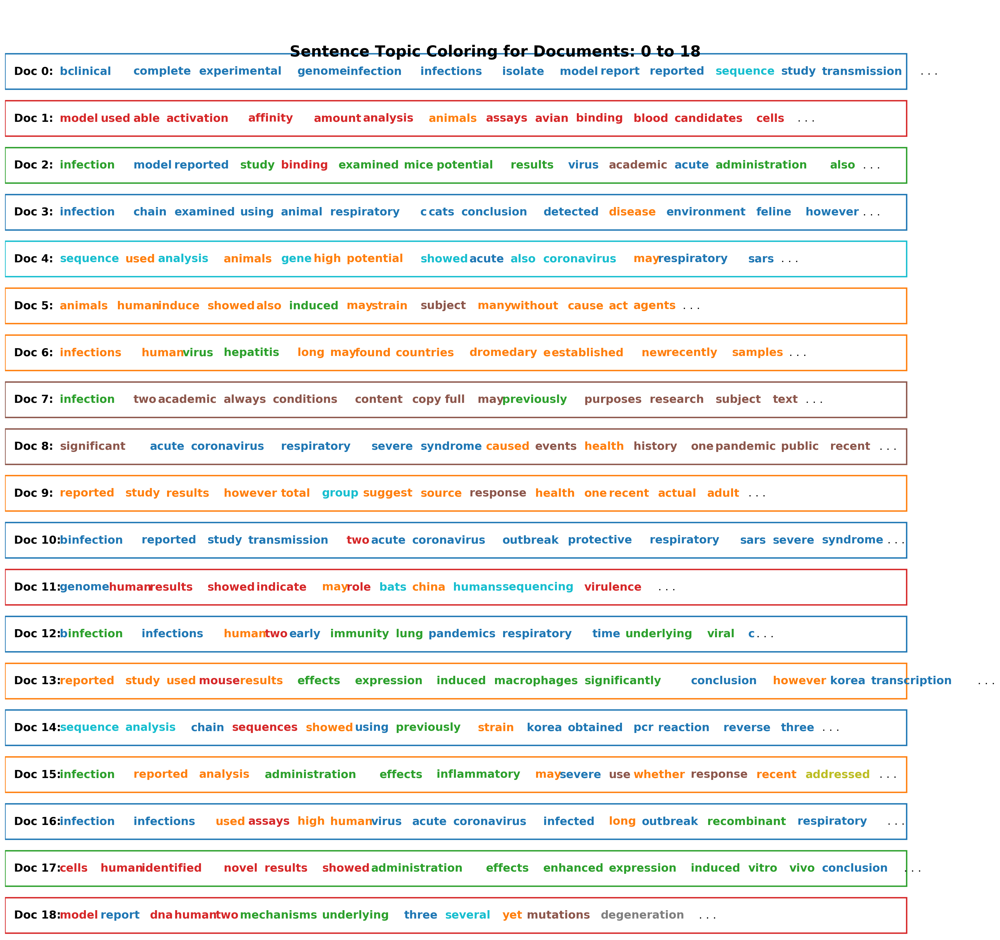

In [226]:
sentences_chart(lda_model, corpus_abstract)

In [229]:
pyLDAvis.gensim.prepare(lda_model, corpus_abstract, dictionary=dict_abstracts)

INFO:MainThread:numexpr.utils:Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:MainThread:numexpr.utils:NumExpr defaulting to 8 threads.


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.164602  0.120859       1        1  19.366138
11    -0.137948  0.225777       2        1  16.947559
1     -0.045558  0.067578       3        1  13.512601
0     -0.296450 -0.153264       4        1  12.651772
12    -0.296895 -0.181037       5        1  11.250310
5      0.003053  0.167163       6        1   7.210522
10     0.038570  0.036024       7        1   6.498227
9     -0.163936 -0.047018       8        1   6.026706
15     0.040554  0.273257       9        1   2.077627
6      0.121364 -0.051433      10        1   1.654163
7      0.125073 -0.052947      11        1   0.553390
4      0.134157 -0.070708      12        1   0.531913
13     0.136244 -0.072397      13        1   0.517570
14     0.135203 -0.062830      14        1   0.477927
2      0.129593 -0.070987      15        1   0.337624
8      0.129079 -0.087052      16        1   0.226840
16     0.112499 -0.040986      17        1   0.159111, topic_info=                 Term          Freq        Total Category  logprob  loglift
8           infection  34819.000000  34819.00000  Default  30.0000  30.0000
189             viral  35773.000000  35773.00000  Default  29.0000  29.0000
270               rna  17487.000000  17487.00000  Default  28.0000  28.0000
36              cells  28889.000000  28889.00000  Default  27.0000  27.0000
96              virus  45096.000000  45096.00000  Default  26.0000  26.0000
...               ...           ...          ...      ...      ...      ...
16958        tapering      0.050273      0.05036  Topic17 -10.8381   6.4416
16984         budgets      0.050273      0.05036  Topic17 -10.8381   6.4416
17005       hypoxemia      0.050273      0.05036  Topic17 -10.8381   6.4416
17004  hemofiltration      0.050273      0.05036  Topic17 -10.8381   6.4416
17003             cmh      0.050273      0.05036  Topic17 -10.8381   6.4416

[797 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
19        1  0.999878        able
4084     10  1.001866   accessory
20        1  0.999924  activation
99        4  0.999977       acute
693      16  1.000228   addressed
...     ...       ...         ...
387       3  0.999980         yet
505       2  1.000011       young
409       3  0.999836    zoonotic
6360     13  0.409733        être
6360     14  0.546310        être

[453 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 12, 2, 1, 13, 6, 11, 10, 16, 7, 8, 5, 14, 15, 3, 9, 17])

In [302]:
pyLDAvis.save_html(pyLDAvis.gensim.prepare(lda_model, corpus_abstract, dictionary=dict_abstracts), 'gensimlda_abstracts.html')

In [256]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus_abstract, end=-1)            

In [242]:
sort_by_topic = sorted(dominant_topics, key = lambda x: x[1])

In [243]:
corp = corpus_abstract[:11140]

In [249]:
d_a.iloc[56]['abstract']

'Using the Nationwide Inpatient Sample and US weather data, we estimated the probability of community-acquired pneumonia CAP being diagnosed as Legionnaires disease LD LD risk increases when weather is warm and humid With warm weather, we found a dose-response relationship between relative humidity and the odds for LD When the mean temperature was 60°-80°F with high humidity , the odds for CAP being diagnosed with LD were times higher than with lower levels of humidity Thus, in some regions eg, the Southwest , LD is rarely the cause of hospitalizations In other regions and seasons eg, the Mid-Atlantic in summer , LD is much more common Thus, suspicion for LD should increase when weather is warm and humid However, when weather is cold, dry, or extremely hot, empirically treating all CAP patients for LD might contribute to excessive antimicrobial drug use at a population level'

In [260]:
from collections import Counter
c = Counter(elem[1] for elem in sort_by_topic)

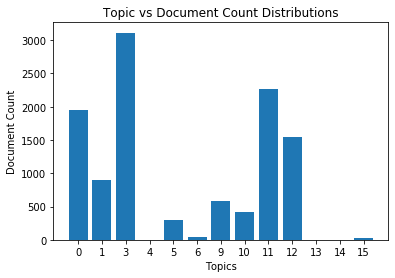

In [272]:
plt.bar(range(len(c)), list(c.values()), align='center')
plt.xticks(range(len(c)), list(c.keys()))
plt.title("Topic vs Document Count Distributions")
plt.xlabel("Topics")
plt.ylabel("Document Count")
plt.show()

In [279]:
for idx, topic in sort_by_topic[:1955]:
    print(d_a['title'].iloc[idx])

Complete Genome Sequence of Bordetella bronchiseptica Strain KM22
Lack of SARS Transmission among Public Hospital Workers, Vietnam
Occasional review: Influenza in COPD: pathogenesis, prevention, and treatment
Antibodies against MERS Coronavirus in Dromedary Camels, United Arab Emirates, 2003 and 2013
Genome Sequences of Rhinovirus Genotype C56 Detected in Three Patients with Acute Respiratory Illness, California, 2016 to 2017
SARS and Pregnancy: A Case Report
New Respiratory Enterovirus and Recombinant Rhinoviruses among Circulating Picornaviruses
Model Parameters and Outbreak Control for SARS
Lack of Transmission among Close Contacts of Patient with Case of Middle East Respiratory Syndrome Imported into the United States, 2014
Lessons from the Severe Acute Respiratory Syndrome Outbreak in Hong Kong
Influence of Population Immunosuppression and Past Vaccination on Smallpox Reemergence
Body Temperature Monitoring and SARS Fever Hotline, Taiwan
Mannose-binding lectin deficiency and acute

IndexError: single positional indexer is out-of-bounds

In [290]:
t = [topic for doc, topic in dominant_topics[:11139]]

In [291]:
len(t)

11139

In [292]:
d_a['dominant_topic'] = t

/Users/venkatar/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [293]:
d_a

,Unnamed: 0,abstract,body_text,sha,doi,source_x,journal,has_full_text,title,dominant_topic
0,0,Bordetella bronchiseptica isolate KM22 has bee...,20-kb insert library preparation protocol (htt...,8f8eb4f004c2002face0723f2f58cc411954d36e,http://dx.doi.org/10.1128/MRA.01207-19,PMC,Microbiol Resour Announc,True,Complete Genome Sequence of Bordetella bronchi...,0
2,2,The influenza A nucleoprotein NP is an attract...,The transmission of a pathogenic avian H5N1 vi...,4df45b8404d9de0b376a8ae3c282a517df36fe51,http://dx.doi.org/10.1051/vetres/2009071,PMC,Vet Res,True,Two novel HLA-A*0201 T-cell epitopes in avian ...,3
3,3,The outbreak of severe acute respiratory syndr...,acute lung injury; inflammatory response; neut...,e0737ee93afe7b0bf06b1e3f9adf21d541dd10f0,http://dx.doi.org/10.1038/labinvest.2012.92,PMC,Lab Invest,True,Protective Effects of Long Pentraxin PTX3 on L...,12
4,4,"The prevalence of feline herpesvirus-1 FHV-1 ,...",Feline herpesvirus type 1 (FHV-1) is the most ...,3c3572ba243d61e7631725669c8f88347fdbd5bc,http://dx.doi.org/10.4142/jvs.2008.9.2.207,PMC,J Vet Sci,True,"Prevalence of feline herpesvirus 1, feline cal...",10
6,6,The epidemic of severe acute respiratory syndr...,E merging diseases are frequently zoonoses cau...,4cb9c6ef889605b3149ab8b59c8258074067ba04,http://dx.doi.org/10.3201/eid1309.070491,PMC,Emerg Infect Dis,True,Detection of Group 1 Coronaviruses in Bats in ...,9
...,...,...,...,...,...,...,...,...,...,...
13214,13214,We hypothesized that postnatal development of ...,Early nutritional environment affects long ter...,228650bc0429064d800d4b9c5fb0e00c2533a579,http://dx.doi.org/10.1371/journal.pone.0215186,PMC,PLoS One,True,Lipidome profiles of postnatal day 2 vaginal s...,1
13215,13215,"Venereal syphilis is a multi-stage, sexually t...",Syphilis is a sexually transmitted disease (ST...,2246e28681bde69c65dc9081df367bb661997f19,http://dx.doi.org/10.1371/journal.pntd.0000690,PMC,PLoS Negl Trop Dis,True,"Secondary Syphilis in Cali, Colombia: New Conc...",3
13216,13216,The emergence of Middle East respiratory syndr...,Scientific RepoRts | 6:21878 | DOI: .1038/srep...,577c6a13f9ef70e9756890fc66e98f537c01ac0a,http://dx.doi.org/10.1038/srep21878,PMC,Sci Rep,True,Replication and shedding of MERS-CoV in Jamaic...,9
13217,13217,We have previously shown that the infection of...,Arenaviruses are enveloped RNA viruses contain...,c5c2bc7a07670d6fb970d84a59aab3832752a3f1,http://dx.doi.org/10.3390/v10040199,PMC,Viruses,True,Role of the ERK1/2 Signaling Pathway in the Re...,3


In [301]:
d_a[d_a['dominant_topic'] == 0].to_csv('../keras-text-summarization/demo/data/corid_topic_0.csv')

In [315]:
lda_model.save('../text-processing/models/gensim_eta_abstracts')

INFO:MainThread:gensim.utils:saving LdaState object under ../text-processing/models/gensim_eta_abstracts.state, separately None
INFO:MainThread:gensim.utils:saved ../text-processing/models/gensim_eta_abstracts.state
INFO:MainThread:gensim.utils:saving LdaModel object under ../text-processing/models/gensim_eta_abstracts, separately ['expElogbeta', 'sstats', 'eta']
INFO:MainThread:gensim.utils:storing np array 'expElogbeta' to ../text-processing/models/gensim_eta_abstracts.expElogbeta.npy
INFO:MainThread:gensim.utils:storing np array 'eta' to ../text-processing/models/gensim_eta_abstracts.eta.npy
INFO:MainThread:gensim.utils:not storing attribute state
INFO:MainThread:gensim.utils:not storing attribute dispatcher
INFO:MainThread:gensim.utils:not storing attribute id2word
INFO:MainThread:gensim.utils:saved ../text-processing/models/gensim_eta_abstracts


In [318]:
d_a[d_a['dominant_topic'] == 0]['body_text'].iloc[56]

'NPA samples were collected from 235 children hospitalized with ARTI at the First Hospital of Lanzhou University, Gansu Province, China during December 2007-November 2008. All patients were <15 years of age, and informed consent was obtained from their parents. Demographic data and clinical fi ndings were recorded. The study protocol was approved by the hospital ethics committee.\n DNA and RNA were extracted from the NPAs by using QIAamp DNA and QIAamp viral RNA mini kits (QIA-GEN, Beijing, China). The cDNA sample was synthesized by using random hexamer primers. A standard reverse transcription-PCR was used to screen for human rhinovirus, respiratory synctial virus (RSV), infl uenza virus A, infl uenza virus B, parainfl uenza virus 1-3, human metapneumovirus, human coronavirus (HCoV)-NL63, and HCoV-HKU1, and PCR method was used to screen for adenovirus (ADV) .To screen for HBoV, PCR was performed by using primers 188F and 542R, as described by Allander et al. . For HBoV2, nested PCR wa

In [321]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus_abstract, texts=ppt)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.7650,"virus, respiratory, infection, clinical, infec...","[bordetella, bronchiseptica, isolate, used, ex..."
1,1,3.0,0.9172,"cells, influenza, virus, using, human, two, id...","[influenza, nucleoprotein, np, attractive, tar..."
2,2,12.0,0.5947,"infection, viral, expression, responses, virus...","[outbreak, severe, acute, respiratory, syndrom..."
3,3,10.0,0.8881,"pathogens, detected, children, three, c, posit...","[prevalence, feline, feline, calicivirus, fcv,..."
4,4,9.0,0.6178,"rna, viral, group, species, sequence, bat, bat...","[epidemic, severe, acute, respiratory, syndrom..."
5,5,1.0,0.8877,"immune, different, samples, human, control, co...","[many, different, agents, incding, mineri, oil..."
6,6,1.0,0.8098,"immune, different, samples, human, control, co...","[new, hepatitis, e, virus, recently, found, dr..."
7,7,5.0,0.7974,"response, full, text, public, antibody, recept...","[previously, described, two, donors, extracell..."
8,8,5.0,0.4071,"response, full, text, public, antibody, recept...","[pandemic, caused, severe, acute, respiratory,..."
9,9,11.0,0.7002,"disease, study, health, data, including, disea...","[survey, conducted, english, spanish, represen..."


In [343]:

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic = df_dominant_topic[:11139]
df_dominant_topic['Paper Text'] = paper_text
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text', 'Paper Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Paper Text
0,0,0.0,0.7650,"virus, respiratory, infection, clinical, infec...","[bordetella, bronchiseptica, isolate, used, ex...",20-kb insert library preparation protocol (htt...
1,1,3.0,0.9172,"cells, influenza, virus, using, human, two, id...","[influenza, nucleoprotein, np, attractive, tar...",The transmission of a pathogenic avian H5N1 vi...
2,2,12.0,0.5947,"infection, viral, expression, responses, virus...","[outbreak, severe, acute, respiratory, syndrom...",acute lung injury; inflammatory response; neut...
3,3,10.0,0.8881,"pathogens, detected, children, three, c, posit...","[prevalence, feline, feline, calicivirus, fcv,...",Feline herpesvirus type 1 (FHV-1) is the most ...
4,4,9.0,0.6178,"rna, viral, group, species, sequence, bat, bat...","[epidemic, severe, acute, respiratory, syndrom...",E merging diseases are frequently zoonoses cau...
5,5,1.0,0.8877,"immune, different, samples, human, control, co...","[many, different, agents, incding, mineri, oil...","Many different agents, incding mineri oil and ..."
6,6,1.0,0.8098,"immune, different, samples, human, control, co...","[new, hepatitis, e, virus, recently, found, dr...",H epatitis E virus (HEV) is a major cause of a...
7,7,5.0,0.7974,"response, full, text, public, antibody, recept...","[previously, described, two, donors, extracell...",individuals living in malaria-endemic regions....
8,8,5.0,0.4071,"response, full, text, public, antibody, recept...","[pandemic, caused, severe, acute, respiratory,...",Rs3367. These viruses are far more closely rel...
9,9,11.0,0.7002,"disease, study, health, data, including, disea...","[survey, conducted, english, spanish, represen...","study has shown that even after weighting, lan..."


In [353]:
df_dominant_topic.to_csv('dominant_topics.csv')

In [341]:
paper_text = [d_b['body_text'].iloc[idx] for idx in df_dominant_topic['Document_No'].values[:11139]]

In [333]:
d_b = d_a.reset_index()

In [338]:
d_b.index

RangeIndex(start=0, stop=11139, step=1)

In [362]:
perplexity = []

for i in range(15, len(corpus_abstract), 10):
    perplexity.append(lda_model.log_perplexity(chunk=corpus_abstract[:i]))

/Users/venkatar/.conda/envs/synml/lib/python3.7/site-packages/gensim/models/ldamodel.py:824: RuntimeWarning: overflow encountered in exp2
  perwordbound, np.exp2(-perwordbound), len(chunk), corpus_words
INFO:MainThread:gensim.models.ldamodel:-364345.839 per-word bound, inf perplexity estimate based on a held-out corpus of 15 documents with 1150 words
INFO:MainThread:gensim.models.ldamodel:-487216.066 per-word bound, inf perplexity estimate based on a held-out corpus of 25 documents with 2070 words
INFO:MainThread:gensim.models.ldamodel:-514581.479 per-word bound, inf perplexity estimate based on a held-out corpus of 35 documents with 2971 words
INFO:MainThread:gensim.models.ldamodel:-533581.808 per-word bound, inf perplexity estimate based on a held-out corpus of 45 documents with 3704 words
INFO:MainThread:gensim.models.ldamodel:-544514.454 per-word bound, inf perplexity estimate based on a held-out corpus of 55 documents with 4512 words
INFO:MainThread:gensim.models.ldamodel:-558794.

INFO:MainThread:gensim.models.ldamodel:-620500.987 per-word bound, inf perplexity estimate based on a held-out corpus of 545 documents with 54520 words
INFO:MainThread:gensim.models.ldamodel:-620487.608 per-word bound, inf perplexity estimate based on a held-out corpus of 555 documents with 55442 words
INFO:MainThread:gensim.models.ldamodel:-621375.695 per-word bound, inf perplexity estimate based on a held-out corpus of 565 documents with 56501 words
INFO:MainThread:gensim.models.ldamodel:-621418.441 per-word bound, inf perplexity estimate based on a held-out corpus of 575 documents with 57287 words
INFO:MainThread:gensim.models.ldamodel:-622298.276 per-word bound, inf perplexity estimate based on a held-out corpus of 585 documents with 58273 words
INFO:MainThread:gensim.models.ldamodel:-622462.192 per-word bound, inf perplexity estimate based on a held-out corpus of 595 documents with 59380 words
INFO:MainThread:gensim.models.ldamodel:-622559.149 per-word bound, inf perplexity estima

INFO:MainThread:gensim.models.ldamodel:-630693.201 per-word bound, inf perplexity estimate based on a held-out corpus of 1085 documents with 111150 words
INFO:MainThread:gensim.models.ldamodel:-630590.671 per-word bound, inf perplexity estimate based on a held-out corpus of 1095 documents with 112324 words
INFO:MainThread:gensim.models.ldamodel:-630997.699 per-word bound, inf perplexity estimate based on a held-out corpus of 1105 documents with 113902 words
INFO:MainThread:gensim.models.ldamodel:-630921.904 per-word bound, inf perplexity estimate based on a held-out corpus of 1115 documents with 114835 words
INFO:MainThread:gensim.models.ldamodel:-631092.597 per-word bound, inf perplexity estimate based on a held-out corpus of 1125 documents with 115937 words
INFO:MainThread:gensim.models.ldamodel:-631301.410 per-word bound, inf perplexity estimate based on a held-out corpus of 1135 documents with 116971 words
INFO:MainThread:gensim.models.ldamodel:-631331.214 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-634406.167 per-word bound, inf perplexity estimate based on a held-out corpus of 1625 documents with 180108 words
INFO:MainThread:gensim.models.ldamodel:-634588.695 per-word bound, inf perplexity estimate based on a held-out corpus of 1635 documents with 181153 words
INFO:MainThread:gensim.models.ldamodel:-634839.782 per-word bound, inf perplexity estimate based on a held-out corpus of 1645 documents with 182715 words
INFO:MainThread:gensim.models.ldamodel:-634884.360 per-word bound, inf perplexity estimate based on a held-out corpus of 1655 documents with 183973 words
INFO:MainThread:gensim.models.ldamodel:-634936.796 per-word bound, inf perplexity estimate based on a held-out corpus of 1665 documents with 185129 words
INFO:MainThread:gensim.models.ldamodel:-634871.788 per-word bound, inf perplexity estimate based on a held-out corpus of 1675 documents with 186247 words
INFO:MainThread:gensim.models.ldamodel:-634883.365 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-636154.552 per-word bound, inf perplexity estimate based on a held-out corpus of 2165 documents with 245869 words
INFO:MainThread:gensim.models.ldamodel:-636344.477 per-word bound, inf perplexity estimate based on a held-out corpus of 2175 documents with 247288 words
INFO:MainThread:gensim.models.ldamodel:-636177.832 per-word bound, inf perplexity estimate based on a held-out corpus of 2185 documents with 248372 words
INFO:MainThread:gensim.models.ldamodel:-635899.904 per-word bound, inf perplexity estimate based on a held-out corpus of 2195 documents with 249635 words
INFO:MainThread:gensim.models.ldamodel:-636148.789 per-word bound, inf perplexity estimate based on a held-out corpus of 2205 documents with 251071 words
INFO:MainThread:gensim.models.ldamodel:-636307.815 per-word bound, inf perplexity estimate based on a held-out corpus of 2215 documents with 252498 words
INFO:MainThread:gensim.models.ldamodel:-636389.221 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-639984.517 per-word bound, inf perplexity estimate based on a held-out corpus of 2705 documents with 334876 words
INFO:MainThread:gensim.models.ldamodel:-639947.197 per-word bound, inf perplexity estimate based on a held-out corpus of 2715 documents with 335787 words
INFO:MainThread:gensim.models.ldamodel:-640045.040 per-word bound, inf perplexity estimate based on a held-out corpus of 2725 documents with 337260 words
INFO:MainThread:gensim.models.ldamodel:-640236.928 per-word bound, inf perplexity estimate based on a held-out corpus of 2735 documents with 339440 words
INFO:MainThread:gensim.models.ldamodel:-640283.348 per-word bound, inf perplexity estimate based on a held-out corpus of 2745 documents with 341265 words
INFO:MainThread:gensim.models.ldamodel:-640277.415 per-word bound, inf perplexity estimate based on a held-out corpus of 2755 documents with 343157 words
INFO:MainThread:gensim.models.ldamodel:-640282.494 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-639438.197 per-word bound, inf perplexity estimate based on a held-out corpus of 3245 documents with 421747 words
INFO:MainThread:gensim.models.ldamodel:-639305.252 per-word bound, inf perplexity estimate based on a held-out corpus of 3255 documents with 422983 words
INFO:MainThread:gensim.models.ldamodel:-639321.789 per-word bound, inf perplexity estimate based on a held-out corpus of 3265 documents with 425404 words
INFO:MainThread:gensim.models.ldamodel:-639336.111 per-word bound, inf perplexity estimate based on a held-out corpus of 3275 documents with 426823 words
INFO:MainThread:gensim.models.ldamodel:-639333.724 per-word bound, inf perplexity estimate based on a held-out corpus of 3285 documents with 428027 words
INFO:MainThread:gensim.models.ldamodel:-639334.350 per-word bound, inf perplexity estimate based on a held-out corpus of 3295 documents with 429317 words
INFO:MainThread:gensim.models.ldamodel:-639300.395 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-637792.493 per-word bound, inf perplexity estimate based on a held-out corpus of 3785 documents with 501300 words
INFO:MainThread:gensim.models.ldamodel:-637801.850 per-word bound, inf perplexity estimate based on a held-out corpus of 3795 documents with 502973 words
INFO:MainThread:gensim.models.ldamodel:-637589.032 per-word bound, inf perplexity estimate based on a held-out corpus of 3805 documents with 504629 words
INFO:MainThread:gensim.models.ldamodel:-637589.540 per-word bound, inf perplexity estimate based on a held-out corpus of 3815 documents with 505818 words
INFO:MainThread:gensim.models.ldamodel:-637533.077 per-word bound, inf perplexity estimate based on a held-out corpus of 3825 documents with 507275 words
INFO:MainThread:gensim.models.ldamodel:-637419.173 per-word bound, inf perplexity estimate based on a held-out corpus of 3835 documents with 508736 words
INFO:MainThread:gensim.models.ldamodel:-637377.260 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-637377.755 per-word bound, inf perplexity estimate based on a held-out corpus of 4325 documents with 579596 words
INFO:MainThread:gensim.models.ldamodel:-637320.284 per-word bound, inf perplexity estimate based on a held-out corpus of 4335 documents with 581535 words
INFO:MainThread:gensim.models.ldamodel:-637296.570 per-word bound, inf perplexity estimate based on a held-out corpus of 4345 documents with 582805 words
INFO:MainThread:gensim.models.ldamodel:-637238.865 per-word bound, inf perplexity estimate based on a held-out corpus of 4355 documents with 583859 words
INFO:MainThread:gensim.models.ldamodel:-637217.209 per-word bound, inf perplexity estimate based on a held-out corpus of 4365 documents with 585126 words
INFO:MainThread:gensim.models.ldamodel:-637180.664 per-word bound, inf perplexity estimate based on a held-out corpus of 4375 documents with 586275 words
INFO:MainThread:gensim.models.ldamodel:-637167.447 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-636865.808 per-word bound, inf perplexity estimate based on a held-out corpus of 4865 documents with 661475 words
INFO:MainThread:gensim.models.ldamodel:-636987.546 per-word bound, inf perplexity estimate based on a held-out corpus of 4875 documents with 662921 words
INFO:MainThread:gensim.models.ldamodel:-637021.575 per-word bound, inf perplexity estimate based on a held-out corpus of 4885 documents with 664462 words
INFO:MainThread:gensim.models.ldamodel:-636966.670 per-word bound, inf perplexity estimate based on a held-out corpus of 4895 documents with 665771 words
INFO:MainThread:gensim.models.ldamodel:-636881.167 per-word bound, inf perplexity estimate based on a held-out corpus of 4905 documents with 667482 words
INFO:MainThread:gensim.models.ldamodel:-636801.717 per-word bound, inf perplexity estimate based on a held-out corpus of 4915 documents with 668835 words
INFO:MainThread:gensim.models.ldamodel:-636767.885 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-636599.804 per-word bound, inf perplexity estimate based on a held-out corpus of 5405 documents with 741243 words
INFO:MainThread:gensim.models.ldamodel:-636549.878 per-word bound, inf perplexity estimate based on a held-out corpus of 5415 documents with 742774 words
INFO:MainThread:gensim.models.ldamodel:-636461.175 per-word bound, inf perplexity estimate based on a held-out corpus of 5425 documents with 744439 words
INFO:MainThread:gensim.models.ldamodel:-636438.421 per-word bound, inf perplexity estimate based on a held-out corpus of 5435 documents with 746087 words
INFO:MainThread:gensim.models.ldamodel:-636367.125 per-word bound, inf perplexity estimate based on a held-out corpus of 5445 documents with 747516 words
INFO:MainThread:gensim.models.ldamodel:-636312.557 per-word bound, inf perplexity estimate based on a held-out corpus of 5455 documents with 748844 words
INFO:MainThread:gensim.models.ldamodel:-636341.346 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-636172.746 per-word bound, inf perplexity estimate based on a held-out corpus of 5945 documents with 821770 words
INFO:MainThread:gensim.models.ldamodel:-636225.780 per-word bound, inf perplexity estimate based on a held-out corpus of 5955 documents with 823435 words
INFO:MainThread:gensim.models.ldamodel:-636201.169 per-word bound, inf perplexity estimate based on a held-out corpus of 5965 documents with 824633 words
INFO:MainThread:gensim.models.ldamodel:-636239.688 per-word bound, inf perplexity estimate based on a held-out corpus of 5975 documents with 825858 words
INFO:MainThread:gensim.models.ldamodel:-636210.198 per-word bound, inf perplexity estimate based on a held-out corpus of 5985 documents with 827506 words
INFO:MainThread:gensim.models.ldamodel:-636268.087 per-word bound, inf perplexity estimate based on a held-out corpus of 5995 documents with 829492 words
INFO:MainThread:gensim.models.ldamodel:-636197.822 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-635896.838 per-word bound, inf perplexity estimate based on a held-out corpus of 6485 documents with 900410 words
INFO:MainThread:gensim.models.ldamodel:-635866.234 per-word bound, inf perplexity estimate based on a held-out corpus of 6495 documents with 901680 words
INFO:MainThread:gensim.models.ldamodel:-635847.222 per-word bound, inf perplexity estimate based on a held-out corpus of 6505 documents with 903063 words
INFO:MainThread:gensim.models.ldamodel:-635778.268 per-word bound, inf perplexity estimate based on a held-out corpus of 6515 documents with 904174 words
INFO:MainThread:gensim.models.ldamodel:-635753.395 per-word bound, inf perplexity estimate based on a held-out corpus of 6525 documents with 905360 words
INFO:MainThread:gensim.models.ldamodel:-635728.797 per-word bound, inf perplexity estimate based on a held-out corpus of 6535 documents with 906592 words
INFO:MainThread:gensim.models.ldamodel:-635703.098 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-635317.364 per-word bound, inf perplexity estimate based on a held-out corpus of 7025 documents with 980356 words
INFO:MainThread:gensim.models.ldamodel:-635311.316 per-word bound, inf perplexity estimate based on a held-out corpus of 7035 documents with 981683 words
INFO:MainThread:gensim.models.ldamodel:-635306.331 per-word bound, inf perplexity estimate based on a held-out corpus of 7045 documents with 983409 words
INFO:MainThread:gensim.models.ldamodel:-635313.013 per-word bound, inf perplexity estimate based on a held-out corpus of 7055 documents with 985275 words
INFO:MainThread:gensim.models.ldamodel:-635248.801 per-word bound, inf perplexity estimate based on a held-out corpus of 7065 documents with 986736 words
INFO:MainThread:gensim.models.ldamodel:-635238.791 per-word bound, inf perplexity estimate based on a held-out corpus of 7075 documents with 987929 words
INFO:MainThread:gensim.models.ldamodel:-635238.175 per-word bound, inf perpl

INFO:MainThread:gensim.models.ldamodel:-634895.360 per-word bound, inf perplexity estimate based on a held-out corpus of 7555 documents with 1059585 words
INFO:MainThread:gensim.models.ldamodel:-634848.948 per-word bound, inf perplexity estimate based on a held-out corpus of 7565 documents with 1061232 words
INFO:MainThread:gensim.models.ldamodel:-634799.838 per-word bound, inf perplexity estimate based on a held-out corpus of 7575 documents with 1062461 words
INFO:MainThread:gensim.models.ldamodel:-634730.265 per-word bound, inf perplexity estimate based on a held-out corpus of 7585 documents with 1064075 words
INFO:MainThread:gensim.models.ldamodel:-634708.021 per-word bound, inf perplexity estimate based on a held-out corpus of 7595 documents with 1065288 words
INFO:MainThread:gensim.models.ldamodel:-634693.009 per-word bound, inf perplexity estimate based on a held-out corpus of 7605 documents with 1066774 words
INFO:MainThread:gensim.models.ldamodel:-634681.756 per-word bound, inf

INFO:MainThread:gensim.models.ldamodel:-634650.435 per-word bound, inf perplexity estimate based on a held-out corpus of 8085 documents with 1136310 words
INFO:MainThread:gensim.models.ldamodel:-634641.548 per-word bound, inf perplexity estimate based on a held-out corpus of 8095 documents with 1137454 words
INFO:MainThread:gensim.models.ldamodel:-634692.232 per-word bound, inf perplexity estimate based on a held-out corpus of 8105 documents with 1138944 words
INFO:MainThread:gensim.models.ldamodel:-634633.958 per-word bound, inf perplexity estimate based on a held-out corpus of 8115 documents with 1140309 words
INFO:MainThread:gensim.models.ldamodel:-634593.944 per-word bound, inf perplexity estimate based on a held-out corpus of 8125 documents with 1142007 words
INFO:MainThread:gensim.models.ldamodel:-634648.783 per-word bound, inf perplexity estimate based on a held-out corpus of 8135 documents with 1143522 words
INFO:MainThread:gensim.models.ldamodel:-634729.480 per-word bound, inf

INFO:MainThread:gensim.models.ldamodel:-634735.711 per-word bound, inf perplexity estimate based on a held-out corpus of 8615 documents with 1216773 words
INFO:MainThread:gensim.models.ldamodel:-634658.497 per-word bound, inf perplexity estimate based on a held-out corpus of 8625 documents with 1218652 words
INFO:MainThread:gensim.models.ldamodel:-634671.261 per-word bound, inf perplexity estimate based on a held-out corpus of 8635 documents with 1221481 words
INFO:MainThread:gensim.models.ldamodel:-634583.854 per-word bound, inf perplexity estimate based on a held-out corpus of 8645 documents with 1223038 words
INFO:MainThread:gensim.models.ldamodel:-634593.813 per-word bound, inf perplexity estimate based on a held-out corpus of 8655 documents with 1224885 words
INFO:MainThread:gensim.models.ldamodel:-634564.136 per-word bound, inf perplexity estimate based on a held-out corpus of 8665 documents with 1226357 words
INFO:MainThread:gensim.models.ldamodel:-634561.519 per-word bound, inf

INFO:MainThread:gensim.models.ldamodel:-634432.057 per-word bound, inf perplexity estimate based on a held-out corpus of 9145 documents with 1304019 words
INFO:MainThread:gensim.models.ldamodel:-634434.287 per-word bound, inf perplexity estimate based on a held-out corpus of 9155 documents with 1305338 words
INFO:MainThread:gensim.models.ldamodel:-634378.307 per-word bound, inf perplexity estimate based on a held-out corpus of 9165 documents with 1307421 words
INFO:MainThread:gensim.models.ldamodel:-634362.523 per-word bound, inf perplexity estimate based on a held-out corpus of 9175 documents with 1309027 words
INFO:MainThread:gensim.models.ldamodel:-634360.947 per-word bound, inf perplexity estimate based on a held-out corpus of 9185 documents with 1310253 words
INFO:MainThread:gensim.models.ldamodel:-634352.706 per-word bound, inf perplexity estimate based on a held-out corpus of 9195 documents with 1311531 words
INFO:MainThread:gensim.models.ldamodel:-634328.715 per-word bound, inf

INFO:MainThread:gensim.models.ldamodel:-634183.762 per-word bound, inf perplexity estimate based on a held-out corpus of 9675 documents with 1386332 words
INFO:MainThread:gensim.models.ldamodel:-634174.881 per-word bound, inf perplexity estimate based on a held-out corpus of 9685 documents with 1387681 words
INFO:MainThread:gensim.models.ldamodel:-634174.199 per-word bound, inf perplexity estimate based on a held-out corpus of 9695 documents with 1388765 words
INFO:MainThread:gensim.models.ldamodel:-634179.049 per-word bound, inf perplexity estimate based on a held-out corpus of 9705 documents with 1390301 words
INFO:MainThread:gensim.models.ldamodel:-634142.468 per-word bound, inf perplexity estimate based on a held-out corpus of 9715 documents with 1392089 words
INFO:MainThread:gensim.models.ldamodel:-634144.708 per-word bound, inf perplexity estimate based on a held-out corpus of 9725 documents with 1393411 words
INFO:MainThread:gensim.models.ldamodel:-634131.320 per-word bound, inf

INFO:MainThread:gensim.models.ldamodel:-633894.192 per-word bound, inf perplexity estimate based on a held-out corpus of 10205 documents with 1461145 words
INFO:MainThread:gensim.models.ldamodel:-633860.047 per-word bound, inf perplexity estimate based on a held-out corpus of 10215 documents with 1462935 words
INFO:MainThread:gensim.models.ldamodel:-633828.121 per-word bound, inf perplexity estimate based on a held-out corpus of 10225 documents with 1464451 words
INFO:MainThread:gensim.models.ldamodel:-633821.095 per-word bound, inf perplexity estimate based on a held-out corpus of 10235 documents with 1465788 words
INFO:MainThread:gensim.models.ldamodel:-633864.567 per-word bound, inf perplexity estimate based on a held-out corpus of 10245 documents with 1467620 words
INFO:MainThread:gensim.models.ldamodel:-633843.518 per-word bound, inf perplexity estimate based on a held-out corpus of 10255 documents with 1468872 words
INFO:MainThread:gensim.models.ldamodel:-633863.234 per-word boun

INFO:MainThread:gensim.models.ldamodel:-633867.449 per-word bound, inf perplexity estimate based on a held-out corpus of 10735 documents with 1546172 words
INFO:MainThread:gensim.models.ldamodel:-633856.830 per-word bound, inf perplexity estimate based on a held-out corpus of 10745 documents with 1547662 words
INFO:MainThread:gensim.models.ldamodel:-633821.475 per-word bound, inf perplexity estimate based on a held-out corpus of 10755 documents with 1548953 words
INFO:MainThread:gensim.models.ldamodel:-633779.695 per-word bound, inf perplexity estimate based on a held-out corpus of 10765 documents with 1550615 words
INFO:MainThread:gensim.models.ldamodel:-633767.759 per-word bound, inf perplexity estimate based on a held-out corpus of 10775 documents with 1551864 words
INFO:MainThread:gensim.models.ldamodel:-633752.153 per-word bound, inf perplexity estimate based on a held-out corpus of 10785 documents with 1553204 words
INFO:MainThread:gensim.models.ldamodel:-633732.399 per-word boun

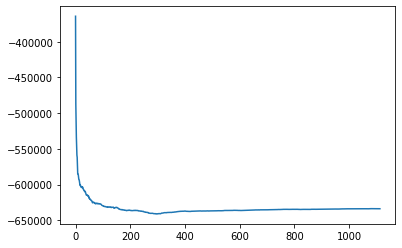

In [363]:
plt.plot(range(len(perplexity)), perplexity)

In [372]:
for n in range(10, 30):
    lda = gensim.models.LdaModel(corpus=corpus_abstract,
                                               id2word=dict_abstracts,
                                               num_topics=n, 
                                                eval_every=1,
                                               per_word_topics=True)
# lda.do_estep(corpus_abstract[:2231])

INFO:MainThread:gensim.models.ldamodel:using symmetric alpha at 0.1
INFO:MainThread:gensim.models.ldamodel:using symmetric eta at 0.1
INFO:MainThread:gensim.models.ldamodel:using serial LDA version on this node
INFO:MainThread:gensim.models.ldamodel:running online (single-pass) LDA training, 10 topics, 1 passes over the supplied corpus of 11155 documents, updating model once every 2000 documents, evaluating perplexity every 2000 documents, iterating 50x with a convergence threshold of 0.001000
INFO:MainThread:gensim.models.ldamodel:-11.921 per-word bound, 3877.7 perplexity estimate based on a held-out corpus of 2000 documents with 226119 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #2000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.100): 0.008*"patients" + 0.006*"viral" + 0.005*"virus" + 0.004*"cells" + 0.004*"dna" + 0.003*"results" + 0.00

INFO:MainThread:gensim.models.ldamodel:topic diff=0.304917, rho=0.447214
INFO:MainThread:gensim.models.ldamodel:-8.839 per-word bound, 457.8 perplexity estimate based on a held-out corpus of 1155 documents with 177873 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #11155/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 1155 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.100): 0.010*"viral" + 0.009*"viruses" + 0.007*"gene" + 0.007*"genes" + 0.007*"virus" + 0.006*"analysis" + 0.006*"rna" + 0.006*"genome" + 0.006*"sequence" + 0.006*"sequences"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.100): 0.017*"cells" + 0.012*"virus" + 0.009*"infection" + 0.008*"expression" + 0.007*"cell" + 0.006*"viral" + 0.005*"protein" + 0.005*"rna" + 0.005*"chikv" + 0.005*"b"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.100): 0.010*"virus" + 0.009*"pedv" + 0.008*"strains" + 0.007*"bats" + 0.006*"diarrhea" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #3 (0.091): 0.010*"virus" + 0.005*"cells" + 0.005*"hev" + 0.004*"study" + 0.004*"influenza" + 0.004*"viruses" + 0.003*"rna" + 0.003*"vaccination" + 0.003*"e" + 0.003*"viral"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.383579, rho=0.500000
INFO:MainThread:gensim.models.ldamodel:-9.050 per-word bound, 529.9 perplexity estimate based on a held-out corpus of 2000 documents with 305942 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #10000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.091): 0.004*"gondii" + 0.003*"clinical" + 0.003*"isgylation" + 0.003*"ts" + 0.003*"results" + 0.003*"infection" + 0.003*"using" + 0.003*"study" + 0.003*"water" + 0.003*"vsv"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.091): 0.021*"cells" + 0.016*"infection" + 0.011*"virus" + 0.011*"cell" + 0.010*"viral" + 0.0

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.083): 0.012*"health" + 0.007*"data" + 0.006*"respiratory" + 0.006*"disease" + 0.005*"public" + 0.005*"study" + 0.005*"virus" + 0.005*"cases" + 0.005*"patients" + 0.004*"results"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.083): 0.018*"cells" + 0.010*"infection" + 0.007*"virus" + 0.006*"lung" + 0.006*"expression" + 0.005*"cell" + 0.005*"viral" + 0.005*"levels" + 0.004*"immune" + 0.004*"mice"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.485829, rho=0.577350
INFO:MainThread:gensim.models.ldamodel:-9.185 per-word bound, 581.9 perplexity estimate based on a held-out corpus of 2000 documents with 294684 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #8000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.083): 0.010*"infection" + 0.010*"cells" + 0.008*"protein" + 0.008*"virus" + 0.008*"ce

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.077): 0.016*"virus" + 0.012*"infection" + 0.009*"viral" + 0.009*"cells" + 0.006*"cell" + 0.006*"patients" + 0.005*"respiratory" + 0.005*"protein" + 0.004*"human" + 0.004*"host"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.077): 0.008*"study" + 0.006*"patients" + 0.005*"p" + 0.005*"expression" + 0.005*"gene" + 0.004*"genes" + 0.004*"levels" + 0.004*"cells" + 0.004*"associated" + 0.003*"treatment"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.077): 0.006*"rna" + 0.005*"protein" + 0.005*"using" + 0.005*"data" + 0.004*"sequence" + 0.004*"cells" + 0.004*"results" + 0.004*"used" + 0.004*"analysis" + 0.004*"study"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.684802, rho=0.707107
INFO:MainThread:gensim.models.ldamodel:-9.289 per-word bound, 625.6 perplexity estimate based on a held-out corpus of 2000 documents with 298666 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #6000/11155
INFO:MainThread:g

INFO:MainThread:gensim.models.ldamodel:topic #13 (0.071): 0.009*"virus" + 0.007*"viral" + 0.006*"cells" + 0.005*"patients" + 0.005*"infection" + 0.005*"using" + 0.005*"human" + 0.004*"rna" + 0.004*"study" + 0.004*"protein"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.071): 0.007*"respiratory" + 0.006*"virus" + 0.006*"viral" + 0.004*"infection" + 0.004*"study" + 0.004*"patients" + 0.004*"viruses" + 0.004*"rna" + 0.004*"acute" + 0.003*"expression"
INFO:MainThread:gensim.models.ldamodel:topic #2 (0.071): 0.008*"patients" + 0.008*"virus" + 0.005*"using" + 0.005*"study" + 0.004*"infection" + 0.004*"results" + 0.004*"respiratory" + 0.004*"children" + 0.004*"viruses" + 0.004*"cells"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.071): 0.007*"r" + 0.004*"respiratory" + 0.004*"cell" + 0.004*"host" + 0.004*"protein" + 0.004*"expression" + 0.004*"treatment" + 0.003*"results" + 0.003*"study" + 0.003*"health"
INFO:MainThread:gensim.models.ldamodel:topic diff=11.071248, rho=1.000000
INFO:

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.071): 0.014*"infection" + 0.013*"cells" + 0.012*"expression" + 0.009*"protein" + 0.008*"viral" + 0.008*"rna" + 0.007*"cell" + 0.007*"genes" + 0.007*"response" + 0.006*"replication"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.071): 0.023*"cells" + 0.013*"cell" + 0.011*"full" + 0.011*"virus" + 0.011*"text" + 0.011*"infection" + 0.010*"mice" + 0.009*"human" + 0.007*"abstract" + 0.007*"et"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.271458, rho=0.408248
INFO:MainThread:gensim.models.ldamodel:using symmetric alpha at 0.06666666666666667
INFO:MainThread:gensim.models.ldamodel:using symmetric eta at 0.06666666666666667
INFO:MainThread:gensim.models.ldamodel:using serial LDA version on this node
INFO:MainThread:gensim.models.ldamodel:running online (single-pass) LDA training, 15 topics, 1 passes over the supplied corpus of 11155 documents, updating model once every 2000 documents, evaluating perplexity every 2000 documents, ite

INFO:MainThread:gensim.models.ldamodel:topic #7 (0.067): 0.019*"viral" + 0.016*"cells" + 0.013*"infection" + 0.012*"host" + 0.011*"virus" + 0.009*"replication" + 0.009*"rna" + 0.009*"immune" + 0.007*"cell" + 0.006*"cellular"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.067): 0.022*"respiratory" + 0.020*"patients" + 0.011*"children" + 0.011*"study" + 0.010*"infection" + 0.010*"infections" + 0.009*"clinical" + 0.007*"viral" + 0.007*"influenza" + 0.007*"virus"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.067): 0.012*"ibv" + 0.012*"virus" + 0.010*"rna" + 0.007*"structure" + 0.007*"viruses" + 0.006*"viral" + 0.005*"protein" + 0.004*"structures" + 0.004*"particles" + 0.004*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.345528, rho=0.447214
INFO:MainThread:gensim.models.ldamodel:-9.244 per-word bound, 606.3 perplexity estimate based on a held-out corpus of 1155 documents with 177873 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #11155

INFO:MainThread:gensim.models.ldamodel:topic #10 (0.062): 0.018*"patients" + 0.008*"cancer" + 0.006*"pdcov" + 0.004*"lung" + 0.004*"load" + 0.004*"cell" + 0.004*"igg" + 0.004*"study" + 0.003*"results" + 0.003*"using"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.062): 0.013*"virus" + 0.009*"infection" + 0.009*"viral" + 0.007*"viruses" + 0.006*"human" + 0.005*"vaccine" + 0.005*"disease" + 0.005*"model" + 0.005*"immune" + 0.004*"new"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.062): 0.027*"health" + 0.011*"public" + 0.010*"research" + 0.009*"data" + 0.008*"surveillance" + 0.006*"information" + 0.005*"disease" + 0.005*"infection" + 0.005*"countries" + 0.005*"infectious"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.062): 0.010*"cells" + 0.009*"virus" + 0.008*"viral" + 0.007*"antiviral" + 0.007*"infection" + 0.007*"replication" + 0.006*"rna" + 0.005*"dna" + 0.005*"cell" + 0.005*"using"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.438317, rho=0.500000
INFO:MainThrea

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.059): 0.015*"zikv" + 0.007*"viral" + 0.007*"reuse" + 0.005*"genes" + 0.005*"codon" + 0.005*"genome" + 0.005*"transmission" + 0.004*"data" + 0.004*"study" + 0.004*"usage"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.059): 0.020*"respiratory" + 0.014*"patients" + 0.014*"virus" + 0.009*"study" + 0.009*"children" + 0.008*"infection" + 0.007*"viruses" + 0.007*"cases" + 0.006*"acute" + 0.006*"detected"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.059): 0.006*"health" + 0.006*"disease" + 0.004*"respiratory" + 0.004*"results" + 0.004*"study" + 0.003*"protein" + 0.003*"patients" + 0.003*"risk" + 0.003*"p" + 0.003*"human"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.059): 0.006*"model" + 0.005*"disease" + 0.005*"transmission" + 0.005*"infectious" + 0.005*"using" + 0.005*"used" + 0.004*"new" + 0.004*"data" + 0.004*"analysis" + 0.004*"ibv"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.059): 0.010*"protein" + 0.010*"zikv" 

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #4000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #12 (0.056): 0.012*"health" + 0.010*"data" + 0.008*"transmission" + 0.007*"infection" + 0.007*"epidemic" + 0.005*"model" + 0.005*"disease" + 0.005*"study" + 0.005*"control" + 0.004*"china"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.056): 0.009*"influenza" + 0.007*"respiratory" + 0.005*"study" + 0.005*"virus" + 0.004*"infection" + 0.004*"health" + 0.004*"data" + 0.004*"disease" + 0.004*"cases" + 0.004*"outbreak"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.056): 0.009*"rna" + 0.008*"virus" + 0.008*"protein" + 0.005*"viral" + 0.005*"infection" + 0.005*"expression" + 0.005*"using" + 0.005*"results" + 0.005*"human" + 0.005*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.056): 0.005*"protein" + 0.005*"virus" + 0.005*"disease" + 0.004

INFO:MainThread:gensim.models.ldamodel:-12.761 per-word bound, 6941.5 perplexity estimate based on a held-out corpus of 2000 documents with 226119 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #2000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.053): 0.008*"virus" + 0.007*"cells" + 0.005*"influenza" + 0.005*"infection" + 0.005*"human" + 0.004*"expression" + 0.004*"dna" + 0.004*"protein" + 0.004*"results" + 0.004*"disease"
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.053): 0.011*"respiratory" + 0.010*"virus" + 0.007*"viral" + 0.005*"infection" + 0.005*"patients" + 0.004*"viruses" + 0.004*"results" + 0.004*"children" + 0.003*"infections" + 0.003*"detected"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.053): 0.014*"virus" + 0.007*"viral" + 0.006*"respiratory" + 0.005*"pneumonia" + 0.005*"viruses" + 0.005*"patients" + 0.004*"infectio

INFO:MainThread:gensim.models.ldamodel:topic #17 (0.053): 0.040*"r" + 0.010*"rabies" + 0.007*"method" + 0.006*"k" + 0.006*"hand" + 0.005*"data" + 0.005*"dis" + 0.005*"temperature" + 0.005*"uri" + 0.005*"n"
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.053): 0.013*"virus" + 0.010*"samples" + 0.010*"strains" + 0.009*"study" + 0.008*"pedv" + 0.007*"detected" + 0.007*"disease" + 0.006*"diarrhea" + 0.006*"infection" + 0.006*"respiratory"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.053): 0.010*"days" + 0.009*"p" + 0.007*"calves" + 0.007*"coli" + 0.006*"feed" + 0.005*"group" + 0.005*"plasma" + 0.005*"milk" + 0.005*"study" + 0.005*"ci"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.053): 0.055*"fusion" + 0.023*"membrane" + 0.013*"ifitm" + 0.012*"proteins" + 0.012*"ifitms" + 0.009*"felv" + 0.009*"fiv" + 0.008*"virus" + 0.007*"entry" + 0.006*"cell"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.322180, rho=0.408248
INFO:MainThread:gensim.models.ldamodel:using symmetric alph

INFO:MainThread:gensim.models.ldamodel:topic #15 (0.050): 0.024*"cells" + 0.019*"infection" + 0.014*"virus" + 0.011*"cell" + 0.010*"viral" + 0.009*"expression" + 0.008*"protein" + 0.007*"immune" + 0.006*"host" + 0.006*"response"
INFO:MainThread:gensim.models.ldamodel:topic #16 (0.050): 0.035*"vaccine" + 0.021*"vaccines" + 0.013*"vaccination" + 0.010*"virus" + 0.006*"infection" + 0.006*"challenge" + 0.005*"results" + 0.005*"assay" + 0.005*"protection" + 0.005*"influenza"
INFO:MainThread:gensim.models.ldamodel:topic #3 (0.050): 0.013*"data" + 0.008*"surveillance" + 0.007*"disease" + 0.007*"influenza" + 0.006*"using" + 0.006*"methods" + 0.005*"used" + 0.005*"results" + 0.005*"infectious" + 0.004*"cases"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.050): 0.015*"samples" + 0.010*"assay" + 0.008*"sensitivity" + 0.007*"results" + 0.007*"pigs" + 0.006*"detection" + 0.006*"using" + 0.006*"positive" + 0.005*"transmission" + 0.005*"test"
INFO:MainThread:gensim.models.ldamodel:topic #9 (0.0

INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #8000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #18 (0.048): 0.018*"protein" + 0.015*"cells" + 0.010*"expression" + 0.009*"activity" + 0.007*"proteins" + 0.007*"virus" + 0.007*"viral" + 0.006*"cell" + 0.006*"rna" + 0.006*"antiviral"
INFO:MainThread:gensim.models.ldamodel:topic #5 (0.048): 0.009*"infection" + 0.008*"mice" + 0.006*"cells" + 0.006*"virus" + 0.005*"disease" + 0.005*"study" + 0.005*"expression" + 0.005*"human" + 0.004*"also" + 0.004*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.048): 0.018*"patients" + 0.017*"respiratory" + 0.010*"influenza" + 0.010*"virus" + 0.010*"children" + 0.009*"viruses" + 0.009*"viral" + 0.008*"infections" + 0.008*"study" + 0.007*"infection"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.048): 0.034*"cells" + 0.026*"cell" + 0.009*"apoptosis" + 0.008*"a

INFO:MainThread:gensim.models.ldamodel:topic diff=0.731373, rho=0.707107
INFO:MainThread:gensim.models.ldamodel:-9.930 per-word bound, 975.7 perplexity estimate based on a held-out corpus of 2000 documents with 298666 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #6000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.045): 0.013*"assay" + 0.010*"using" + 0.009*"pcr" + 0.009*"detection" + 0.009*"samples" + 0.006*"results" + 0.006*"virus" + 0.006*"viruses" + 0.005*"positive" + 0.005*"method"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.045): 0.009*"cells" + 0.008*"virus" + 0.006*"infection" + 0.006*"human" + 0.006*"protein" + 0.006*"study" + 0.005*"using" + 0.005*"viral" + 0.004*"results" + 0.004*"cell"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.045): 0.021*"viral" + 0.011*"viruses" + 0.010*"infection" + 0.008*"virus" + 0.008*"rna

INFO:MainThread:gensim.models.ldamodel:topic #12 (0.043): 0.010*"protein" + 0.006*"cells" + 0.005*"virus" + 0.004*"disease" + 0.004*"cell" + 0.004*"domain" + 0.003*"coronavirus" + 0.003*"used" + 0.003*"b" + 0.003*"dna"
INFO:MainThread:gensim.models.ldamodel:topic diff=18.492476, rho=1.000000
INFO:MainThread:gensim.models.ldamodel:-10.450 per-word bound, 1399.2 perplexity estimate based on a held-out corpus of 2000 documents with 305684 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #4000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #6 (0.043): 0.008*"transmission" + 0.008*"cases" + 0.006*"number" + 0.006*"study" + 0.006*"virus" + 0.005*"control" + 0.005*"disease" + 0.005*"china" + 0.005*"infection" + 0.005*"reserved"
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.043): 0.009*"respiratory" + 0.008*"infection" + 0.006*"viral" + 0.006*"patients"

INFO:MainThread:gensim.models.ldamodel:using symmetric eta at 0.041666666666666664
INFO:MainThread:gensim.models.ldamodel:using serial LDA version on this node
INFO:MainThread:gensim.models.ldamodel:running online (single-pass) LDA training, 24 topics, 1 passes over the supplied corpus of 11155 documents, updating model once every 2000 documents, evaluating perplexity every 2000 documents, iterating 50x with a convergence threshold of 0.001000
INFO:MainThread:gensim.models.ldamodel:-13.287 per-word bound, 9996.3 perplexity estimate based on a held-out corpus of 2000 documents with 226119 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #2000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.042): 0.009*"virus" + 0.009*"cells" + 0.007*"cell" + 0.006*"respiratory" + 0.005*"protein" + 0.005*"viral" + 0.005*"infection" + 0.005*"viruses" + 0.004*"human"

INFO:MainThread:gensim.models.ldamodel:topic diff=0.416676, rho=0.447214
INFO:MainThread:gensim.models.ldamodel:-9.845 per-word bound, 919.9 perplexity estimate based on a held-out corpus of 1155 documents with 177873 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #11155/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 1155 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #13 (0.042): 0.008*"applications" + 0.007*"review" + 0.007*"wnv" + 0.006*"delivery" + 0.006*"de" + 0.006*"pm" + 0.005*"scfv" + 0.005*"medicine" + 0.005*"development" + 0.005*"antibacterial"
INFO:MainThread:gensim.models.ldamodel:topic #4 (0.042): 0.018*"full" + 0.017*"text" + 0.012*"proteins" + 0.012*"protein" + 0.011*"abstract" + 0.010*"pubmed" + 0.010*"fusion" + 0.009*"et" + 0.009*"al" + 0.008*"membrane"
INFO:MainThread:gensim.models.ldamodel:topic #11 (0.042): 0.011*"disease" + 0.010*"health" + 0.008*"epidemic" + 0.007*"data" + 0.007

INFO:MainThread:gensim.models.ldamodel:topic #16 (0.040): 0.025*"rna" + 0.011*"expression" + 0.009*"cats" + 0.009*"proteins" + 0.008*"infection" + 0.008*"cells" + 0.007*"viral" + 0.007*"replication" + 0.007*"host" + 0.006*"virus"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.502500, rho=0.500000
INFO:MainThread:gensim.models.ldamodel:-10.081 per-word bound, 1083.2 perplexity estimate based on a held-out corpus of 2000 documents with 305942 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #10000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.040): 0.014*"viral" + 0.013*"viruses" + 0.010*"virus" + 0.008*"host" + 0.007*"genes" + 0.007*"human" + 0.007*"genome" + 0.006*"species" + 0.006*"sequences" + 0.006*"gene"
INFO:MainThread:gensim.models.ldamodel:topic #14 (0.040): 0.032*"respiratory" + 0.016*"virus" + 0.015*"patients" + 0.014*"children" 

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.038): 0.008*"virus" + 0.005*"de" + 0.004*"results" + 0.004*"influenza" + 0.004*"cells" + 0.004*"protein" + 0.004*"infection" + 0.003*"using" + 0.003*"study" + 0.003*"proteins"
INFO:MainThread:gensim.models.ldamodel:topic #19 (0.038): 0.007*"cells" + 0.006*"virus" + 0.006*"liver" + 0.004*"protein" + 0.004*"viral" + 0.004*"one" + 0.004*"codon" + 0.004*"results" + 0.004*"treatment" + 0.003*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.620366, rho=0.577350
INFO:MainThread:gensim.models.ldamodel:-10.153 per-word bound, 1138.5 perplexity estimate based on a held-out corpus of 2000 documents with 294684 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #8000/11155
INFO:MainThread:gensim.models.ldamodel:merging changes from 2000 documents into a model of 11155 documents
INFO:MainThread:gensim.models.ldamodel:topic #0 (0.038): 0.008*"method" + 0.007*"using" + 0.007*"data" + 0.006*"protein" + 0.006*"model

INFO:MainThread:gensim.models.ldamodel:topic #9 (0.037): 0.020*"patients" + 0.008*"cases" + 0.008*"infection" + 0.008*"pneumonia" + 0.006*"clinical" + 0.006*"data" + 0.005*"lung" + 0.005*"wuhan" + 0.005*"respiratory" + 0.005*"disease"
INFO:MainThread:gensim.models.ldamodel:topic #22 (0.037): 0.009*"health" + 0.007*"r" + 0.006*"study" + 0.006*"china" + 0.005*"virus" + 0.005*"public" + 0.004*"disease" + 0.004*"respiratory" + 0.004*"using" + 0.004*"among"
INFO:MainThread:gensim.models.ldamodel:topic #17 (0.037): 0.009*"reserved" + 0.008*"health" + 0.007*"study" + 0.005*"results" + 0.005*"patients" + 0.005*"preparedness" + 0.005*"exercises" + 0.004*"treatment" + 0.004*"public" + 0.004*"emergency"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.770464, rho=0.707107
INFO:MainThread:gensim.models.ldamodel:-10.268 per-word bound, 1233.2 perplexity estimate based on a held-out corpus of 2000 documents with 298666 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #60

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.036): 0.010*"patients" + 0.010*"virus" + 0.006*"treatment" + 0.005*"viral" + 0.005*"viruses" + 0.004*"influenza" + 0.004*"human" + 0.004*"respiratory" + 0.004*"results" + 0.004*"data"
INFO:MainThread:gensim.models.ldamodel:topic #1 (0.036): 0.008*"infection" + 0.006*"respiratory" + 0.006*"disease" + 0.005*"human" + 0.005*"control" + 0.005*"virus" + 0.004*"health" + 0.004*"results" + 0.004*"infections" + 0.003*"viruses"
INFO:MainThread:gensim.models.ldamodel:topic #8 (0.036): 0.009*"patients" + 0.008*"virus" + 0.006*"viral" + 0.004*"respiratory" + 0.004*"study" + 0.004*"protein" + 0.004*"sars" + 0.003*"results" + 0.003*"infection" + 0.003*"transmission"
INFO:MainThread:gensim.models.ldamodel:topic #26 (0.036): 0.009*"x" + 0.007*"sars" + 0.005*"virus" + 0.005*"cell" + 0.004*"patients" + 0.004*"cells" + 0.003*"cases" + 0.003*"disease" + 0.003*"results" + 0.003*"study"
INFO:MainThread:gensim.models.ldamodel:topic diff=22.965687, rho=1.0000

INFO:MainThread:gensim.models.ldamodel:topic #4 (0.036): 0.012*"virus" + 0.011*"treatment" + 0.008*"patients" + 0.005*"dengue" + 0.005*"antiviral" + 0.004*"viral" + 0.004*"disease" + 0.004*"hpv" + 0.004*"results" + 0.004*"time"
INFO:MainThread:gensim.models.ldamodel:topic #7 (0.036): 0.008*"data" + 0.008*"method" + 0.008*"using" + 0.007*"analysis" + 0.006*"genes" + 0.006*"used" + 0.006*"sars" + 0.006*"transmission" + 0.005*"reference" + 0.005*"study"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.390063, rho=0.408248
INFO:MainThread:gensim.models.ldamodel:using symmetric alpha at 0.034482758620689655
INFO:MainThread:gensim.models.ldamodel:using symmetric eta at 0.034482758620689655
INFO:MainThread:gensim.models.ldamodel:using serial LDA version on this node
INFO:MainThread:gensim.models.ldamodel:running online (single-pass) LDA training, 29 topics, 1 passes over the supplied corpus of 11155 documents, updating model once every 2000 documents, evaluating perplexity every 2000 docum

INFO:MainThread:gensim.models.ldamodel:topic #22 (0.034): 0.023*"virus" + 0.016*"infection" + 0.010*"ibv" + 0.008*"viruses" + 0.008*"human" + 0.007*"immune" + 0.007*"influenza" + 0.007*"vaccine" + 0.007*"avian" + 0.007*"respiratory"
INFO:MainThread:gensim.models.ldamodel:topic #15 (0.034): 0.063*"patients" + 0.014*"group" + 0.012*"pneumonia" + 0.012*"clinical" + 0.010*"treatment" + 0.010*"vs" + 0.008*"p" + 0.007*"blood" + 0.006*"levels" + 0.006*"days"
INFO:MainThread:gensim.models.ldamodel:topic #10 (0.034): 0.015*"rna" + 0.013*"protein" + 0.010*"proteins" + 0.008*"viral" + 0.007*"virus" + 0.006*"infection" + 0.006*"viruses" + 0.005*"activity" + 0.005*"replication" + 0.005*"also"
INFO:MainThread:gensim.models.ldamodel:topic diff=0.460803, rho=0.447214
INFO:MainThread:gensim.models.ldamodel:-10.161 per-word bound, 1144.8 perplexity estimate based on a held-out corpus of 1155 documents with 177873 words
INFO:MainThread:gensim.models.ldamodel:PROGRESS: pass 0, at document #11155/11155
INF

questions

In [397]:
df

,Document_Id,Dominant_Topic
0,0,0
1,1,3
2,2,12
3,3,10
4,4,9
...,...,...
11149,11149,11
11150,11150,3
11151,11151,5
11152,11152,11


,Unnamed: 0,abstract,body_text,sha,doi,source_x,journal,has_full_text,title
0,0,Bordetella bronchiseptica isolate KM22 has bee...,20-kb insert library preparation protocol (htt...,8f8eb4f004c2002face0723f2f58cc411954d36e,http://dx.doi.org/10.1128/MRA.01207-19,PMC,Microbiol Resour Announc,True,Complete Genome Sequence of Bordetella bronchi...
1,1,NaN,I nfectious diseases have been an ever-present...,63f7049d200896290b38b38711113054f7ea1b50,http://dx.doi.org/10.3201/eid1104.041167,PMC,Emerg Infect Dis,True,Emerging Infectious Diseases: a 10-Year Perspe...
2,2,The influenza A nucleoprotein (NP) is an attra...,The transmission of a pathogenic avian H5N1 vi...,4df45b8404d9de0b376a8ae3c282a517df36fe51,http://dx.doi.org/10.1051/vetres/2009071,PMC,Vet Res,True,Two novel HLA-A*0201 T-cell epitopes in avian ...
3,3,The outbreak of severe acute respiratory syndr...,acute lung injury; inflammatory response; neut...,e0737ee93afe7b0bf06b1e3f9adf21d541dd10f0,http://dx.doi.org/10.1038/labinvest.2012.92,PMC,Lab Invest,True,Protective Effects of Long Pentraxin PTX3 on L...
4,4,The prevalence of feline herpesvirus-1 (FHV-1)...,Feline herpesvirus type 1 (FHV-1) is the most ...,3c3572ba243d61e7631725669c8f88347fdbd5bc,http://dx.doi.org/10.4142/jvs.2008.9.2.207,PMC,J Vet Sci,True,"Prevalence of feline herpesvirus 1, feline cal..."
...,...,...,...,...,...,...,...,...,...
13214,13214,We hypothesized that postnatal development of ...,Early nutritional environment affects long ter...,228650bc0429064d800d4b9c5fb0e00c2533a579,http://dx.doi.org/10.1371/journal.pone.0215186,PMC,PLoS One,True,Lipidome profiles of postnatal day 2 vaginal s...
13215,13215,"Venereal syphilis is a multi-stage, sexually t...",Syphilis is a sexually transmitted disease (ST...,2246e28681bde69c65dc9081df367bb661997f19,http://dx.doi.org/10.1371/journal.pntd.0000690,PMC,PLoS Negl Trop Dis,True,"Secondary Syphilis in Cali, Colombia: New Conc..."
13216,13216,The emergence of Middle East respiratory syndr...,Scientific RepoRts | 6:21878 | DOI: .1038/srep...,577c6a13f9ef70e9756890fc66e98f537c01ac0a,http://dx.doi.org/10.1038/srep21878,PMC,Sci Rep,True,Replication and shedding of MERS-CoV in Jamaic...
13217,13217,We have previously shown that the infection of...,Arenaviruses are enveloped RNA viruses contain...,c5c2bc7a07670d6fb970d84a59aab3832752a3f1,http://dx.doi.org/10.3390/v10040199,PMC,Viruses,True,Role of the ERK1/2 Signaling Pathway in the Re...
